Best parameters: [1082, 4.8625731451155695e-09, 0.00010825862263250658, 0.1741353250314545, 6.943884941608576e-05]


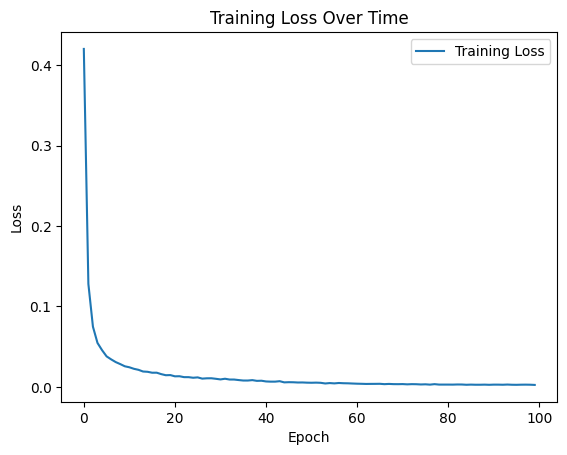

Task Train RMSE: 0.28283601999282837, Train R2: 0.9999370722378044, Train MAE: 0.19819435477256775
Task Test RMSE: 0.3107692003250122, Test R2: 0.999902423802501, Test MAE: 0.18617764115333557
Task Train RMSE: 0.29140761494636536, Train R2: 0.9999119135305444, Train MAE: 0.19439244270324707
Task Test RMSE: 0.27728772163391113, Test R2: 0.999961190884367, Test MAE: 0.20138493180274963
Task Train RMSE: 0.2994091808795929, Train R2: 0.9999254503113528, Train MAE: 0.19453969597816467
Task Test RMSE: 0.24078799784183502, Test R2: 0.999951466426899, Test MAE: 0.20079632103443146
Task Train RMSE: 0.307127445936203, Train R2: 0.9999274108460522, Train MAE: 0.21476463973522186
Task Test RMSE: 0.19812420010566711, Test R2: 0.9999493273324751, Test MAE: 0.11989688873291016
Task Train RMSE: 0.260142982006073, Train R2: 0.9999486440602836, Train MAE: 0.17706318199634552
Task Test RMSE: 0.38192087411880493, Test R2: 0.9998137218114657, Test MAE: 0.2707015872001648
Task Train RMSE: 1.3526679277420044

In [3]:
import torch
from torch import nn, optim
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
import learn2learn as l2l
import numpy as np
import torch

np.random.seed(0)  # 设置NumPy的随机种子
torch.manual_seed(0)  # 设置PyTorch的随机种子

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)

# Advanced neural network architecture
class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses


@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2




# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# Load and normalize data
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP1-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_feature(data, 'GI(%)')
# Create tasks using the normalized dataset
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(data_normalized, columns=data.columns), target_column='GI(%)')

# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")


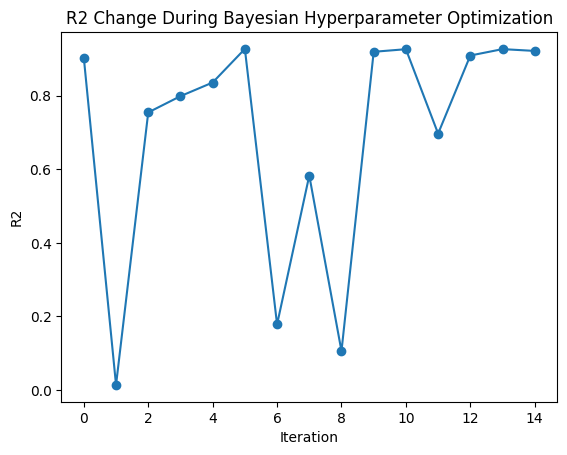

In [4]:
# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

In [13]:
# Load and process external data for evaluation
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP1-2.csv")
external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)


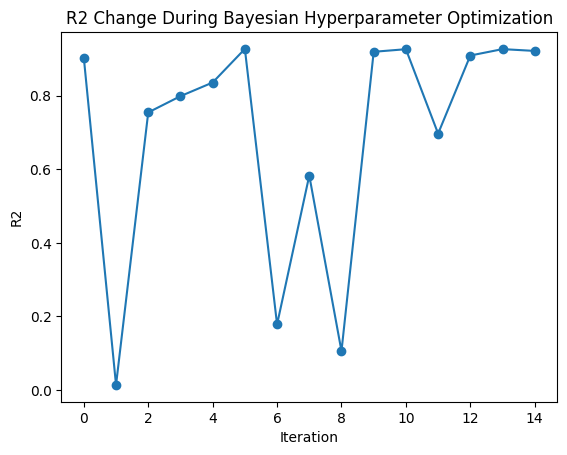

Original Dataset - RMSE: 1.0088988557241592, R2: 0.9992407846737223, MAE: 0.35531411166500015
External Dataset - RMSE: 17.4202938079834, R2: 0.7736498977998932, MAE: 12.937676429748535


In [14]:
# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


Best parameters: [1500, 1.0557393061268737e-07, 5.075608414041153e-05, 0.8, 1e-07]


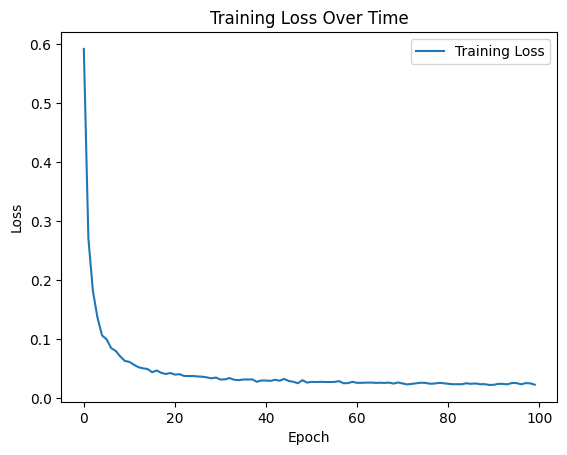

Task Train RMSE: 1.1428427696228027, Train R2: 0.9982305939157282, Train MAE: 0.8157361745834351
Task Test RMSE: 1.0304920673370361, Test R2: 0.998269133245309, Test MAE: 0.7379406690597534
Task Train RMSE: 1.1888365745544434, Train R2: 0.9979298093594943, Train MAE: 0.8431316614151001
Task Test RMSE: 0.7955754995346069, Test R2: 0.999078180002339, Test MAE: 0.6283586621284485
Task Train RMSE: 1.1026191711425781, Train R2: 0.9981120035237405, Train MAE: 0.8007696866989136
Task Test RMSE: 1.1929749250411987, Test R2: 0.9984559143526912, Test MAE: 0.7978048324584961
Task Train RMSE: 1.0369049310684204, Train R2: 0.9984839282814774, Train MAE: 0.7396586537361145
Task Test RMSE: 1.4091073274612427, Test R2: 0.9972903024441083, Test MAE: 1.042250156402588
Task Train RMSE: 1.1295607089996338, Train R2: 0.9983765867863851, Train MAE: 0.8015887141227722
Task Test RMSE: 1.0874933004379272, Test R2: 0.9972367005720074, Test MAE: 0.7945303916931152
Task Train RMSE: 1.58712637424469, Train R2: 0.9

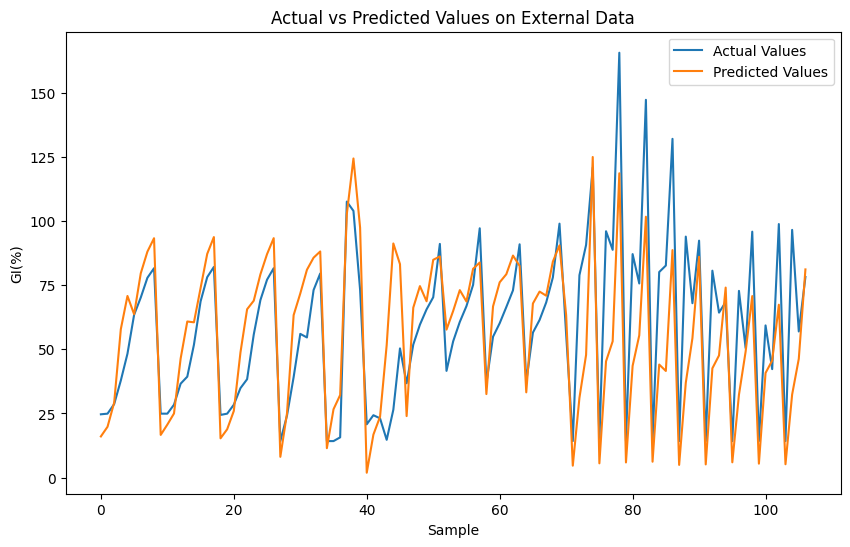

External Dataset - RMSE: 21.68465805053711, R2: 0.5233747897745757, MAE: 16.15220832824707


In [15]:
import torch
from torch import nn, optim
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
import learn2learn as l2l
import numpy as np
import torch

np.random.seed(0)  # 设置NumPy的随机种子
torch.manual_seed(0)  # 设置PyTorch的随机种子

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)

# Advanced neural network architecture
class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2

# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# Load and normalize data
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP2-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_feature(data, 'GI(%)')
# Create tasks using the normalized dataset
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(data_normalized, columns=data.columns), target_column='GI(%)')

# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")


# Load and process external data for evaluation
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP2-2.csv")
external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

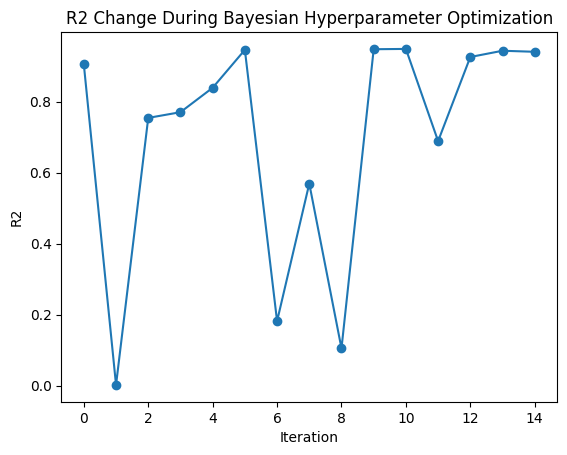

Original Dataset - RMSE: 1.457474709192301, R2: 0.9978468519249205, MAE: 1.07013513394072
External Dataset - RMSE: 21.68465805053711, R2: 0.5233747785535743, MAE: 16.152210235595703


In [16]:
# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


Best parameters: [1082, 4.8625731451155695e-09, 0.00010825862263250658, 0.1741353250314545, 6.943884941608576e-05]


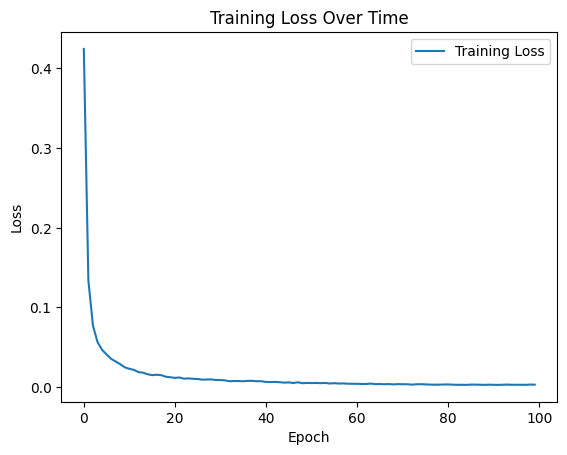

Task Train RMSE: 1.5524661540985107, Train R2: 0.9981374096217043, Train MAE: 0.5504946708679199
Task Test RMSE: 0.45600274205207825, Test R2: 0.9997066642410187, Test MAE: 0.23351430892944336
Task Train RMSE: 0.9963918328285217, Train R2: 0.9989569199220165, Train MAE: 0.4412633776664734
Task Test RMSE: 2.424325704574585, Test R2: 0.9971107060099257, Test MAE: 0.6704378128051758
Task Train RMSE: 1.549784779548645, Train R2: 0.9980636669730245, Train MAE: 0.5313013195991516
Task Test RMSE: 0.4911320209503174, Test R2: 0.9997370212701343, Test MAE: 0.31028637290000916
Task Train RMSE: 1.5311172008514404, Train R2: 0.9982159785607722, Train MAE: 0.4908507466316223
Task Test RMSE: 0.6864862442016602, Test R2: 0.9992505840464757, Test MAE: 0.4720888137817383
Task Train RMSE: 1.3036266565322876, Train R2: 0.9984193041391081, Train MAE: 0.4215814471244812
Task Test RMSE: 1.7466447353363037, Test R2: 0.997743039095486, Test MAE: 0.7491651773452759
Task Train RMSE: 1.322611689567566, Train R2:

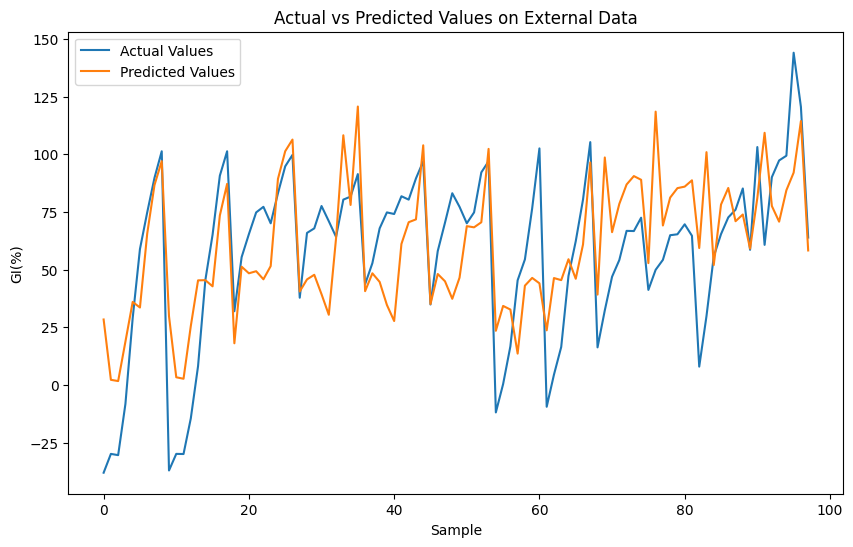

External Dataset - RMSE: 28.14059829711914, R2: 0.4327335278206539, MAE: 22.4316349029541


In [17]:
import torch
from torch import nn, optim
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
import learn2learn as l2l
import numpy as np
import torch

np.random.seed(0)  # 设置NumPy的随机种子
torch.manual_seed(0)  # 设置PyTorch的随机种子

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)

# Advanced neural network architecture
class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2


# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# Load and normalize data
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP3-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_feature(data, 'GI(%)')
# Create tasks using the normalized dataset
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(data_normalized, columns=data.columns), target_column='GI(%)')

# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")


# Load and process external data for evaluation
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP3-2.csv")
external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

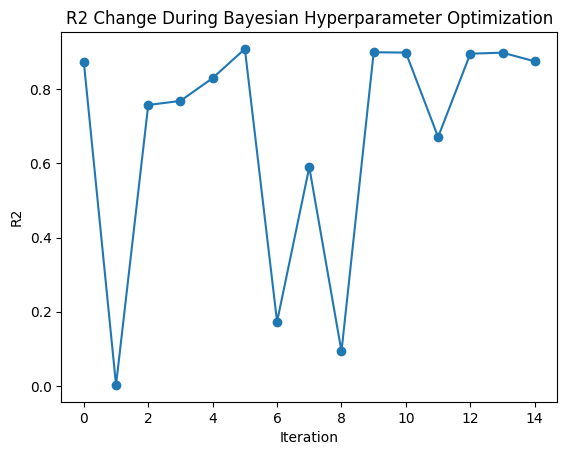

Original Dataset - RMSE: 1.142033383248896, R2: 0.9990657178883018, MAE: 0.4330053764761562
External Dataset - RMSE: 28.14059829711914, R2: 0.4327335278202181, MAE: 22.4316349029541


In [18]:
# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


Best parameters: [671, 6.176761533672798e-10, 0.00010063396049315316, 0.5254814681008275, 8.918326627754476e-06]


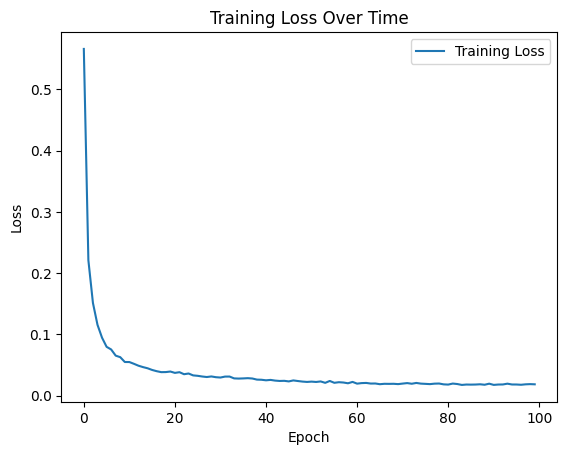

Task Train RMSE: 2.642390489578247, Train R2: 0.9947954713915477, Train MAE: 1.1009801626205444
Task Test RMSE: 1.223052978515625, Test R2: 0.9986705817388906, Test MAE: 0.9766889810562134
Task Train RMSE: 2.6349377632141113, Train R2: 0.9950114046895047, Train MAE: 1.1163215637207031
Task Test RMSE: 1.2857599258422852, Test R2: 0.9984369979091934, Test MAE: 0.9153228998184204
Task Train RMSE: 1.4587836265563965, Train R2: 0.9980904287253649, Train MAE: 0.929317831993103
Task Test RMSE: 4.573026657104492, Test R2: 0.9903119602610531, Test MAE: 1.663338303565979
Task Train RMSE: 2.5491456985473633, Train R2: 0.9950779771230734, Train MAE: 1.110216736793518
Task Test RMSE: 1.8526190519332886, Test R2: 0.997442555958637, Test MAE: 0.9397428631782532
Task Train RMSE: 2.6217269897460938, Train R2: 0.9952422386759577, Train MAE: 1.1237733364105225
Task Test RMSE: 1.3895915746688843, Test R2: 0.9974180911651129, Test MAE: 0.8855177164077759
Task Train RMSE: 2.628732919692993, Train R2: 0.9929

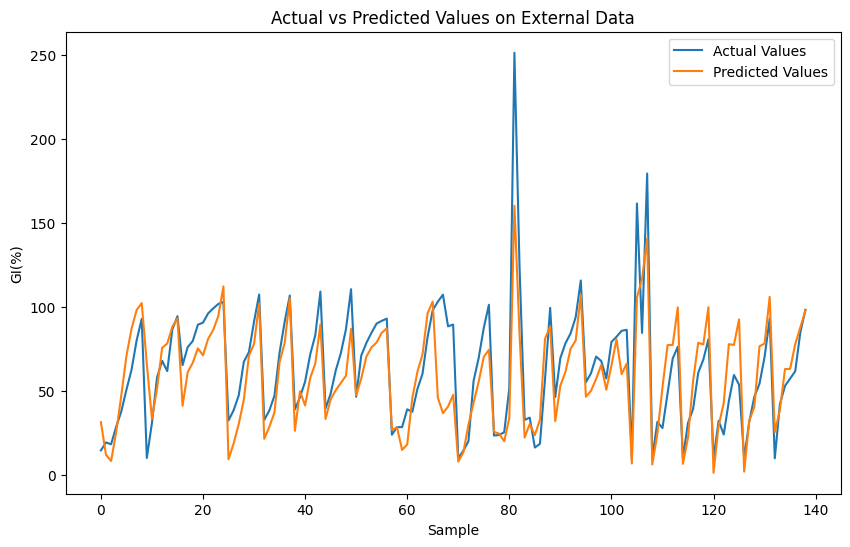

External Dataset - RMSE: 20.1826229095459, R2: 0.6747893006634488, MAE: 14.796432495117188


In [19]:
import torch
from torch import nn, optim
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
import learn2learn as l2l
import numpy as np
import torch

np.random.seed(0)  # 设置NumPy的随机种子
torch.manual_seed(0)  # 设置PyTorch的随机种子

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)

# Advanced neural network architecture
class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2


# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# Load and normalize data
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP4-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_feature(data, 'GI(%)')
# Create tasks using the normalized dataset
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(data_normalized, columns=data.columns), target_column='GI(%)')

# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")


# Load and process external data for evaluation
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\CP4-2.csv")
external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

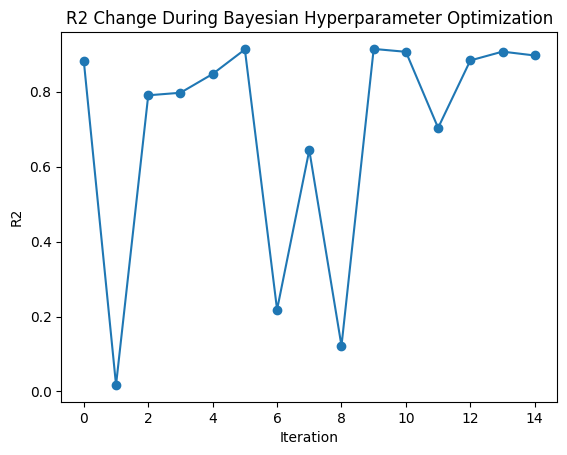

Original Dataset - RMSE: 2.251253814780867, R2: 0.9959536957914437, MAE: 1.0604517446114607
External Dataset - RMSE: 20.1826229095459, R2: 0.6747893192655738, MAE: 14.796432495117188


In [20]:
# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


GAN

Best parameters: [671, 6.176761533672798e-10, 0.00010063396049315316, 0.5254814681008275, 8.918326627754476e-06]


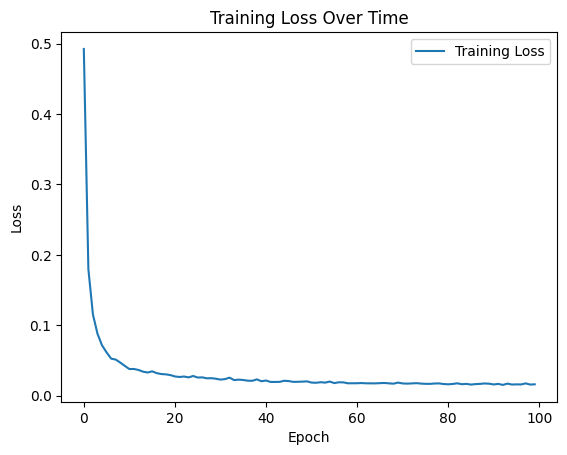

Task Train RMSE: 4.021751880645752, Train R2: 0.9680601583501015, Train MAE: 1.1488583087921143
Task Test RMSE: 2.134444236755371, Test R2: 0.9958771242634072, Test MAE: 1.0455315113067627
Task Train RMSE: 1.2134360074996948, Train R2: 0.9975306864142919, Train MAE: 0.6847906112670898
Task Test RMSE: 7.960156440734863, Test R2: 0.9161500181924593, Test MAE: 2.901801347732544
Task Train RMSE: 4.144487380981445, Train R2: 0.9772420100751512, Train MAE: 1.265204668045044
Task Test RMSE: 0.7393842339515686, Test R2: 0.9943144832423294, Test MAE: 0.5801435708999634
Task Train RMSE: 4.148123264312744, Train R2: 0.9726976376143573, Train MAE: 1.270506739616394
Task Test RMSE: 0.6527488231658936, Test R2: 0.9993684446060803, Test MAE: 0.5589364767074585
Task Train RMSE: 4.150081634521484, Train R2: 0.9754882537266093, Train MAE: 1.271602988243103
Task Test RMSE: 0.6009044051170349, Test R2: 0.9986848288419193, Test MAE: 0.5545514225959778
Task Train RMSE: 1.9763206243515015, Train R2: 0.995090

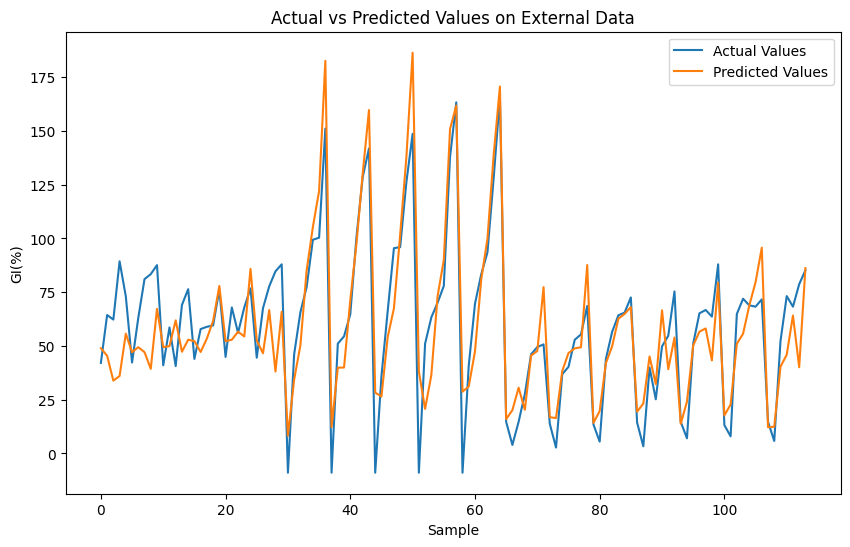

External Dataset - RMSE: 17.766178131103516, R2: 0.76457219020135, MAE: 13.604391098022461


In [21]:
import torch
from torch import nn, optim
import torch.nn.functional as F
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import learn2learn as l2l
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

# 设置随机种子
np.random.seed(0)
torch.manual_seed(0)

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)

# 加载和规范化数据
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP1-1.csv")
data_normalized, scaler = normalize_data(data)

# 假设您的目标列名为'GI(%)'
target_normalized, target_scaler = normalize_data(data[['GI(%)']].values)
# 元学习模型定义
class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# 其他辅助函数和类（如EarlyStopping, create_tasks等）根据需要添加
# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# GAN的生成器定义
class Generator(nn.Module):
    def __init__(self, input_size, hidden_dim, output_size):
        super(Generator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim * 4)
        self.fc4 = nn.Linear(hidden_dim * 4, output_size)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.tanh(self.fc4(x))
        return x

# GAN的判别器定义
class Discriminator(nn.Module):
    def __init__(self, input_size, hidden_dim):
        super(Discriminator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim * 4)
        self.fc2 = nn.Linear(hidden_dim * 4, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim)
        self.fc4 = nn.Linear(hidden_dim, 1)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.sigmoid(self.fc4(x))
        return x

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2

# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# 设置GAN训练参数
z_dim = 100  # 潜在空间的维度
gen_hidden_dim = 128
dis_hidden_dim = 128
lr = 0.0002
batch_size = 64
num_epochs = 50

# 初始化模型
generator = Generator(z_dim, gen_hidden_dim, data_normalized.shape[1]).to(device)
discriminator = Discriminator(data_normalized.shape[1], dis_hidden_dim).to(device)

# 优化器
optim_g = optim.Adam(generator.parameters(), lr=lr)
optim_d = optim.Adam(discriminator.parameters(), lr=lr)

tensor_data = torch.Tensor(data_normalized)
data_loader = DataLoader(tensor_data, batch_size=batch_size, shuffle=True)

# GAN训练循环
for epoch in range(num_epochs):
    for batch in data_loader:
        current_batch_size = len(batch)  # Get the actual batch size
        real_data = batch.to(device)
        real_labels = torch.ones(current_batch_size, 1).to(device)  # Adjust label size based on batch
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Generate fake data based on current batch size
        fake_labels = torch.zeros(current_batch_size, 1).to(device)  # Adjust fake label size

        # 训练判别器
        optim_d.zero_grad()
        real_output = discriminator(real_data)
        fake_output = discriminator(fake_data)
        d_loss_real = nn.BCEWithLogitsLoss()(real_output, real_labels)
        d_loss_fake = nn.BCEWithLogitsLoss()(fake_output, fake_labels)
        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optim_d.step()

        # 训练生成器
        optim_g.zero_grad()
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Regenerate fake data
        fake_output = discriminator(fake_data)
        g_loss = nn.BCEWithLogitsLoss()(fake_output, real_labels)  # Use real_labels here
        g_loss.backward()
        optim_g.step()

# 假设您想生成一定数量的新样本
number_of_generated_samples = 500

# 生成新的数据样本
generated_samples = []
for _ in range(number_of_generated_samples):
    z = torch.randn(1, z_dim).to(device)
    generated_sample = generator(z).detach().cpu().numpy()
    generated_samples.append(generated_sample.reshape(-1))

generated_samples = np.array(generated_samples)

# 将生成的样本合并到现有数据中
extended_data = np.vstack([data_normalized, generated_samples])

# 创建增强的数据集任务
# 这里假设您已经定义了创建任务的函数
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(extended_data, columns=data.columns), target_column='GI(%)')
# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")
# Load and process external data for evaluation
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP1-2.csv")
external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

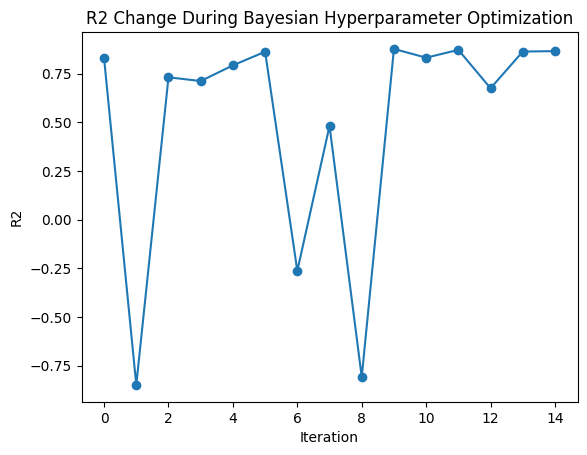

Original Dataset - RMSE: 4.004824883123635, R2: 0.9880370918296943, MAE: 1.841814029005926
External Dataset - RMSE: 17.766178131103516, R2: 0.7645721810788827, MAE: 13.604391098022461


In [22]:
# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


Best parameters: [500, 1e-11, 0.00015414868523611113, 0.1, 1e-07]


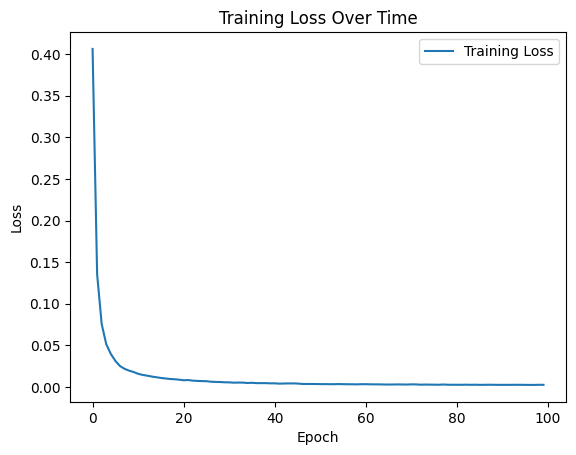

Task Train RMSE: 0.6374646425247192, Train R2: 0.9980389132763569, Train MAE: 0.4676496386528015
Task Test RMSE: 0.5936465263366699, Test R2: 0.9989955939252037, Test MAE: 0.45647430419921875
Task Train RMSE: 0.6155155301094055, Train R2: 0.998440815361424, Train MAE: 0.4569322466850281
Task Test RMSE: 0.6800158619880676, Test R2: 0.9977630089425141, Test MAE: 0.49934282898902893
Task Train RMSE: 0.6450298428535461, Train R2: 0.9977308429875351, Train MAE: 0.4732685089111328
Task Test RMSE: 0.5600069761276245, Test R2: 0.99915643454422, Test MAE: 0.4339989125728607
Task Train RMSE: 0.5871605277061462, Train R2: 0.9987556614685894, Train MAE: 0.4468127191066742
Task Test RMSE: 0.7738422751426697, Test R2: 0.9915483672422719, Test MAE: 0.5398219227790833
Task Train RMSE: 0.6571294069290161, Train R2: 0.9983467109614675, Train MAE: 0.4824090003967285
Task Test RMSE: 0.5005839467048645, Test R2: 0.9951756868104729, Test MAE: 0.3974354863166809
Task Train RMSE: 0.841949999332428, Train R2: 

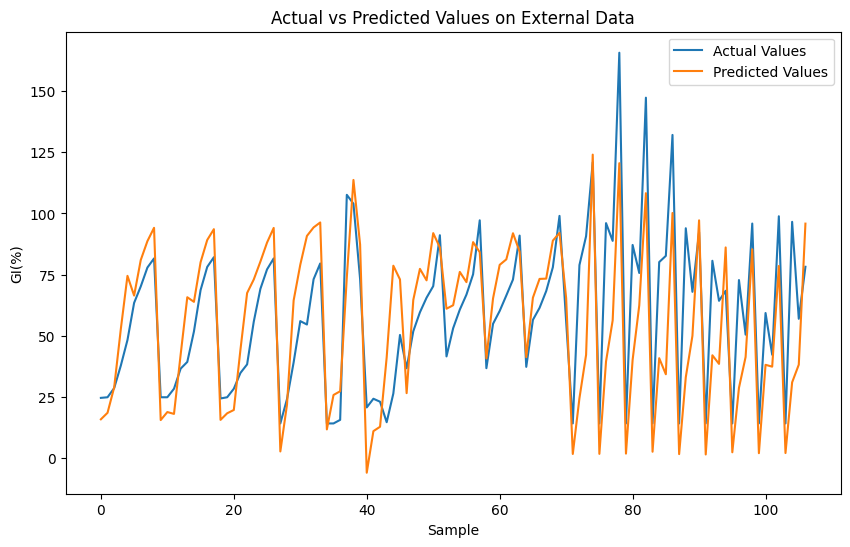

External Dataset - RMSE: 22.618906021118164, R2: 0.48142086130490314, MAE: 17.842561721801758


In [23]:
import torch
from torch import nn, optim
import torch.nn.functional as F
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import learn2learn as l2l
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

# 设置随机种子
np.random.seed(0)
torch.manual_seed(0)

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)

# 加载和规范化数据
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP2-1.csv")
data_normalized, scaler = normalize_data(data)

# 假设您的目标列名为'GI(%)'
target_normalized, target_scaler = normalize_data(data[['GI(%)']].values)
# 元学习模型定义
class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# 其他辅助函数和类（如EarlyStopping, create_tasks等）根据需要添加
# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# GAN的生成器定义
class Generator(nn.Module):
    def __init__(self, input_size, hidden_dim, output_size):
        super(Generator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim * 4)
        self.fc4 = nn.Linear(hidden_dim * 4, output_size)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.tanh(self.fc4(x))
        return x

# GAN的判别器定义
class Discriminator(nn.Module):
    def __init__(self, input_size, hidden_dim):
        super(Discriminator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim * 4)
        self.fc2 = nn.Linear(hidden_dim * 4, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim)
        self.fc4 = nn.Linear(hidden_dim, 1)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.sigmoid(self.fc4(x))
        return x

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2

# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# 设置GAN训练参数
z_dim = 100  # 潜在空间的维度
gen_hidden_dim = 128
dis_hidden_dim = 128
lr = 0.0002
batch_size = 64
num_epochs = 50

# 初始化模型
generator = Generator(z_dim, gen_hidden_dim, data_normalized.shape[1]).to(device)
discriminator = Discriminator(data_normalized.shape[1], dis_hidden_dim).to(device)

# 优化器
optim_g = optim.Adam(generator.parameters(), lr=lr)
optim_d = optim.Adam(discriminator.parameters(), lr=lr)

tensor_data = torch.Tensor(data_normalized)
data_loader = DataLoader(tensor_data, batch_size=batch_size, shuffle=True)

# GAN训练循环
for epoch in range(num_epochs):
    for batch in data_loader:
        current_batch_size = len(batch)  # Get the actual batch size
        real_data = batch.to(device)
        real_labels = torch.ones(current_batch_size, 1).to(device)  # Adjust label size based on batch
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Generate fake data based on current batch size
        fake_labels = torch.zeros(current_batch_size, 1).to(device)  # Adjust fake label size

        # 训练判别器
        optim_d.zero_grad()
        real_output = discriminator(real_data)
        fake_output = discriminator(fake_data)
        d_loss_real = nn.BCEWithLogitsLoss()(real_output, real_labels)
        d_loss_fake = nn.BCEWithLogitsLoss()(fake_output, fake_labels)
        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optim_d.step()

        # 训练生成器
        optim_g.zero_grad()
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Regenerate fake data
        fake_output = discriminator(fake_data)
        g_loss = nn.BCEWithLogitsLoss()(fake_output, real_labels)  # Use real_labels here
        g_loss.backward()
        optim_g.step()

# 假设您想生成一定数量的新样本
number_of_generated_samples = 500

# 生成新的数据样本
generated_samples = []
for _ in range(number_of_generated_samples):
    z = torch.randn(1, z_dim).to(device)
    generated_sample = generator(z).detach().cpu().numpy()
    generated_samples.append(generated_sample.reshape(-1))

generated_samples = np.array(generated_samples)

# 将生成的样本合并到现有数据中
extended_data = np.vstack([data_normalized, generated_samples])

# 创建增强的数据集任务
# 这里假设您已经定义了创建任务的函数
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(extended_data, columns=data.columns), target_column='GI(%)')
# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")
# Load and process external data for evaluation
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP2-2.csv")
external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

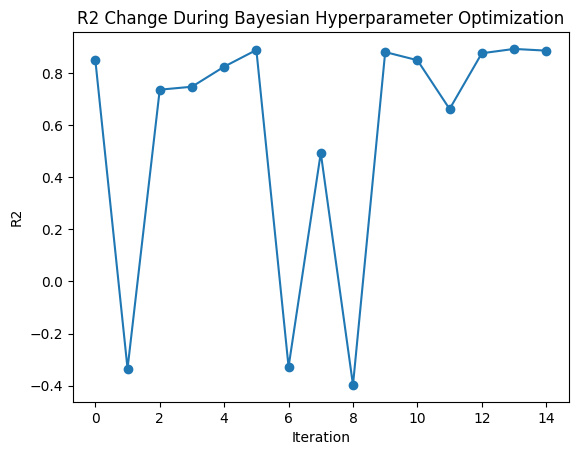

Original Dataset - RMSE: 1.460106303375034, R2: 0.9978390695224867, MAE: 0.8132984597704447
External Dataset - RMSE: 22.618906021118164, R2: 0.48142083192578855, MAE: 17.842561721801758


In [24]:
# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


Best parameters: [671, 6.176761533672798e-10, 0.00010063396049315316, 0.5254814681008275, 8.918326627754476e-06]


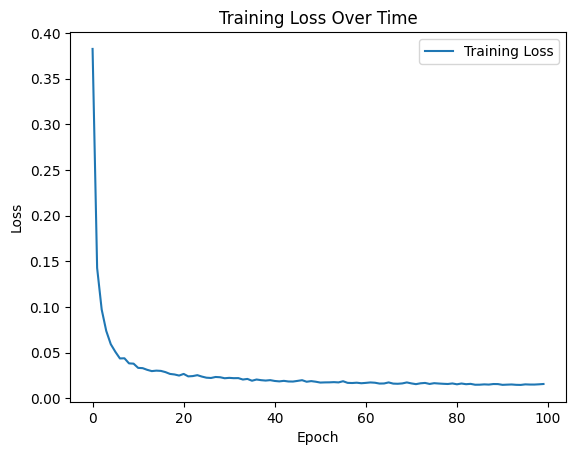

Task Train RMSE: 2.173248767852783, Train R2: 0.9922447326355862, Train MAE: 1.1855093240737915
Task Test RMSE: 0.8116448521614075, Test R2: 0.997290223313814, Test MAE: 0.6393510699272156
Task Train RMSE: 2.034274101257324, Train R2: 0.9932808234793928, Train MAE: 1.1217187643051147
Task Test RMSE: 1.7313940525054932, Test R2: 0.9860074925537939, Test MAE: 0.8945148587226868
Task Train RMSE: 2.0937371253967285, Train R2: 0.9908953292192915, Train MAE: 1.1084985733032227
Task Test RMSE: 1.4198124408721924, Test R2: 0.9973312298043921, Test MAE: 0.9473940134048462
Task Train RMSE: 1.258334755897522, Train R2: 0.9961050813961487, Train MAE: 0.788305938243866
Task Test RMSE: 3.635544776916504, Test R2: 0.9868658917498188, Test MAE: 2.228165626525879
Task Train RMSE: 2.173105239868164, Train R2: 0.9917223125451271, Train MAE: 1.177356481552124
Task Test RMSE: 0.8131816983222961, Test R2: 0.9983105941186785, Test MAE: 0.6719638109207153
Task Train RMSE: 1.9259531497955322, Train R2: 0.99528

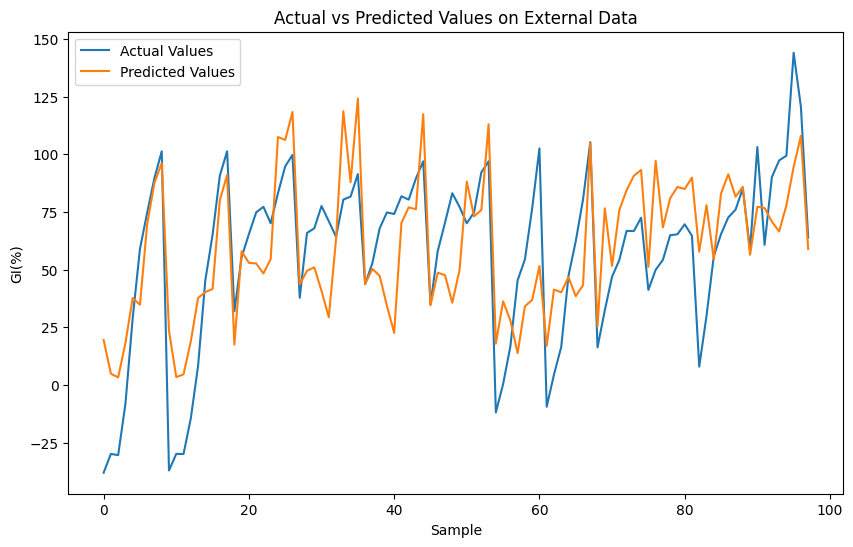

External Dataset - RMSE: 26.004552841186523, R2: 0.5155831808052717, MAE: 21.343833923339844


In [25]:
import torch
from torch import nn, optim
import torch.nn.functional as F
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import learn2learn as l2l
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

# 设置随机种子
np.random.seed(0)
torch.manual_seed(0)

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)

# 加载和规范化数据
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP3-1.csv")
data_normalized, scaler = normalize_data(data)

# 假设您的目标列名为'GI(%)'
target_normalized, target_scaler = normalize_data(data[['GI(%)']].values)
# 元学习模型定义
class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# 其他辅助函数和类（如EarlyStopping, create_tasks等）根据需要添加
# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# GAN的生成器定义
class Generator(nn.Module):
    def __init__(self, input_size, hidden_dim, output_size):
        super(Generator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim * 4)
        self.fc4 = nn.Linear(hidden_dim * 4, output_size)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.tanh(self.fc4(x))
        return x

# GAN的判别器定义
class Discriminator(nn.Module):
    def __init__(self, input_size, hidden_dim):
        super(Discriminator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim * 4)
        self.fc2 = nn.Linear(hidden_dim * 4, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim)
        self.fc4 = nn.Linear(hidden_dim, 1)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.sigmoid(self.fc4(x))
        return x

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2

# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# 设置GAN训练参数
z_dim = 100  # 潜在空间的维度
gen_hidden_dim = 128
dis_hidden_dim = 128
lr = 0.0002
batch_size = 64
num_epochs = 50

# 初始化模型
generator = Generator(z_dim, gen_hidden_dim, data_normalized.shape[1]).to(device)
discriminator = Discriminator(data_normalized.shape[1], dis_hidden_dim).to(device)

# 优化器
optim_g = optim.Adam(generator.parameters(), lr=lr)
optim_d = optim.Adam(discriminator.parameters(), lr=lr)

tensor_data = torch.Tensor(data_normalized)
data_loader = DataLoader(tensor_data, batch_size=batch_size, shuffle=True)

# GAN训练循环
for epoch in range(num_epochs):
    for batch in data_loader:
        current_batch_size = len(batch)  # Get the actual batch size
        real_data = batch.to(device)
        real_labels = torch.ones(current_batch_size, 1).to(device)  # Adjust label size based on batch
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Generate fake data based on current batch size
        fake_labels = torch.zeros(current_batch_size, 1).to(device)  # Adjust fake label size

        # 训练判别器
        optim_d.zero_grad()
        real_output = discriminator(real_data)
        fake_output = discriminator(fake_data)
        d_loss_real = nn.BCEWithLogitsLoss()(real_output, real_labels)
        d_loss_fake = nn.BCEWithLogitsLoss()(fake_output, fake_labels)
        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optim_d.step()

        # 训练生成器
        optim_g.zero_grad()
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Regenerate fake data
        fake_output = discriminator(fake_data)
        g_loss = nn.BCEWithLogitsLoss()(fake_output, real_labels)  # Use real_labels here
        g_loss.backward()
        optim_g.step()

# 假设您想生成一定数量的新样本
number_of_generated_samples = 500

# 生成新的数据样本
generated_samples = []
for _ in range(number_of_generated_samples):
    z = torch.randn(1, z_dim).to(device)
    generated_sample = generator(z).detach().cpu().numpy()
    generated_samples.append(generated_sample.reshape(-1))

generated_samples = np.array(generated_samples)

# 将生成的样本合并到现有数据中
extended_data = np.vstack([data_normalized, generated_samples])

# 创建增强的数据集任务
# 这里假设您已经定义了创建任务的函数
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(extended_data, columns=data.columns), target_column='GI(%)')
# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")
# Load and process external data for evaluation
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP3-2.csv")
external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

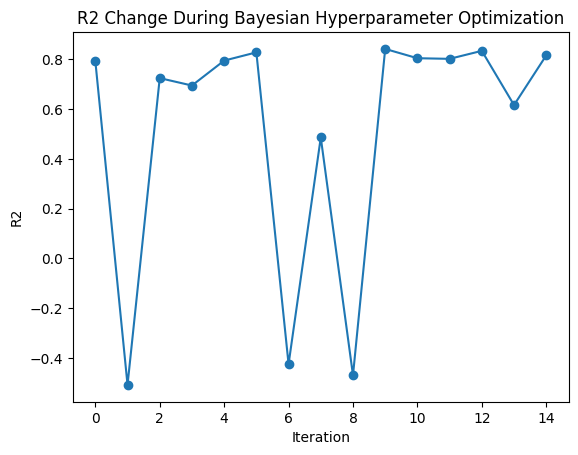

Original Dataset - RMSE: 5.138161640811456, R2: 0.9810880652617859, MAE: 2.475220522976188
External Dataset - RMSE: 26.004552841186523, R2: 0.5155831830915385, MAE: 21.343833923339844


In [26]:
# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


Best parameters: [836, 2.7481934424692526e-08, 0.00010689609125134433, 0.2628969480403148, 8.238116484183501e-07]


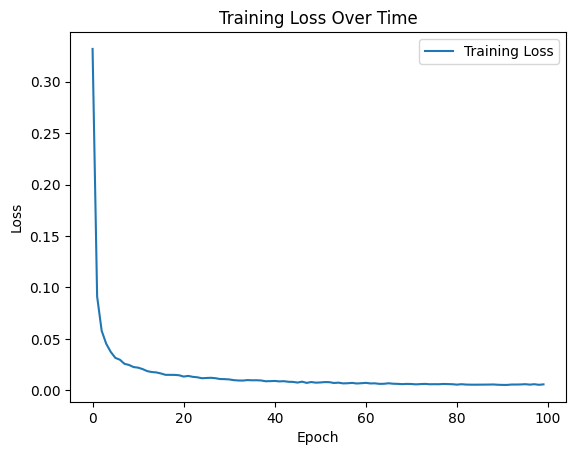

Task Train RMSE: 2.716472864151001, Train R2: 0.9909436864207563, Train MAE: 0.752092719078064
Task Test RMSE: 0.9098235964775085, Test R2: 0.9992936423666835, Test MAE: 0.5766820907592773
Task Train RMSE: 1.4420403242111206, Train R2: 0.9978286193740992, Train MAE: 0.5594391822814941
Task Test RMSE: 4.693267345428467, Test R2: 0.9669397443379953, Test MAE: 1.3472955226898193
Task Train RMSE: 2.433156967163086, Train R2: 0.9933731803549989, Train MAE: 0.6662060022354126
Task Test RMSE: 2.581411123275757, Test R2: 0.9927871781875153, Test MAE: 0.9202299118041992
Task Train RMSE: 2.7341787815093994, Train R2: 0.991808010942127, Train MAE: 0.7940033078193665
Task Test RMSE: 0.6646398901939392, Test R2: 0.9994498363614143, Test MAE: 0.4090404510498047
Task Train RMSE: 2.736783981323242, Train R2: 0.9918015533547674, Train MAE: 0.8133114576339722
Task Test RMSE: 0.6202667355537415, Test R2: 0.9995430310679585, Test MAE: 0.3318067491054535
Task Train RMSE: 0.5856665968894958, Train R2: 0.999

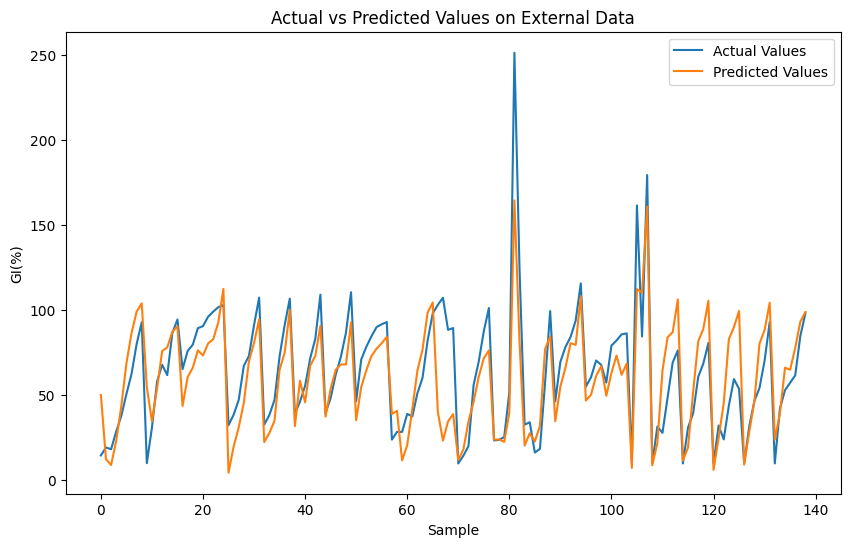

External Dataset - RMSE: 21.004480361938477, R2: 0.6477642028752564, MAE: 15.456991195678711


In [27]:
import torch
from torch import nn, optim
import torch.nn.functional as F
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import learn2learn as l2l
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

# 设置随机种子
np.random.seed(0)
torch.manual_seed(0)

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)

# 加载和规范化数据
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP4-1.csv")
data_normalized, scaler = normalize_data(data)

target_normalized, target_scaler = normalize_data(data[['GI(%)']].values)
# 元学习模型定义
class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# 其他辅助函数和类（如EarlyStopping, create_tasks等）根据需要添加
# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# GAN的生成器定义
class Generator(nn.Module):
    def __init__(self, input_size, hidden_dim, output_size):
        super(Generator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim * 4)
        self.fc4 = nn.Linear(hidden_dim * 4, output_size)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.tanh(self.fc4(x))
        return x

# GAN的判别器定义
class Discriminator(nn.Module):
    def __init__(self, input_size, hidden_dim):
        super(Discriminator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim * 4)
        self.fc2 = nn.Linear(hidden_dim * 4, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim)
        self.fc4 = nn.Linear(hidden_dim, 1)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.sigmoid(self.fc4(x))
        return x

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2

# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# 设置GAN训练参数
z_dim = 100  # 潜在空间的维度
gen_hidden_dim = 128
dis_hidden_dim = 128
lr = 0.0002
batch_size = 64
num_epochs = 50

# 初始化模型
generator = Generator(z_dim, gen_hidden_dim, data_normalized.shape[1]).to(device)
discriminator = Discriminator(data_normalized.shape[1], dis_hidden_dim).to(device)

# 优化器
optim_g = optim.Adam(generator.parameters(), lr=lr)
optim_d = optim.Adam(discriminator.parameters(), lr=lr)

tensor_data = torch.Tensor(data_normalized)
data_loader = DataLoader(tensor_data, batch_size=batch_size, shuffle=True)

# GAN训练循环
for epoch in range(num_epochs):
    for batch in data_loader:
        current_batch_size = len(batch)  # Get the actual batch size
        real_data = batch.to(device)
        real_labels = torch.ones(current_batch_size, 1).to(device)  # Adjust label size based on batch
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Generate fake data based on current batch size
        fake_labels = torch.zeros(current_batch_size, 1).to(device)  # Adjust fake label size

        # 训练判别器
        optim_d.zero_grad()
        real_output = discriminator(real_data)
        fake_output = discriminator(fake_data)
        d_loss_real = nn.BCEWithLogitsLoss()(real_output, real_labels)
        d_loss_fake = nn.BCEWithLogitsLoss()(fake_output, fake_labels)
        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optim_d.step()

        # 训练生成器
        optim_g.zero_grad()
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Regenerate fake data
        fake_output = discriminator(fake_data)
        g_loss = nn.BCEWithLogitsLoss()(fake_output, real_labels)  # Use real_labels here
        g_loss.backward()
        optim_g.step()

# 假设您想生成一定数量的新样本
number_of_generated_samples = 500

# 生成新的数据样本
generated_samples = []
for _ in range(number_of_generated_samples):
    z = torch.randn(1, z_dim).to(device)
    generated_sample = generator(z).detach().cpu().numpy()
    generated_samples.append(generated_sample.reshape(-1))

generated_samples = np.array(generated_samples)

# 将生成的样本合并到现有数据中
extended_data = np.vstack([data_normalized, generated_samples])

# 创建增强的数据集任务
# 这里假设您已经定义了创建任务的函数
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(extended_data, columns=data.columns), target_column='GI(%)')
# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")
# Load and process external data for evaluation
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP4-2.csv")
external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

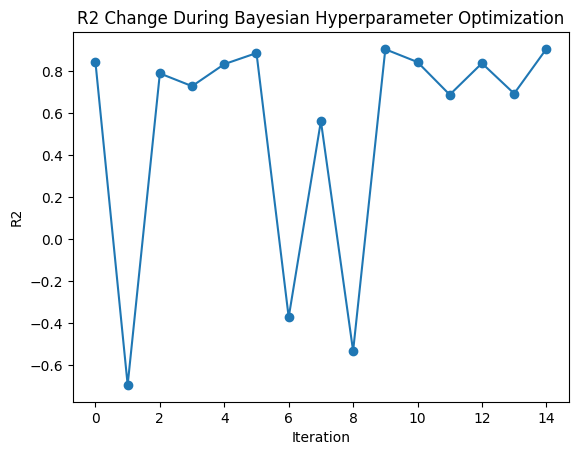

Original Dataset - RMSE: 3.086816982813318, R2: 0.9923926855351821, MAE: 1.1446555328899426
External Dataset - RMSE: 21.004480361938477, R2: 0.6477642072407782, MAE: 15.456989288330078


In [28]:
# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


减少训练样本

使用两部分数据集进行训练

Best parameters: [1038, 1.5553013051026642e-07, 0.00012639868049911824, 0.8, 2.6950836546437327e-05]


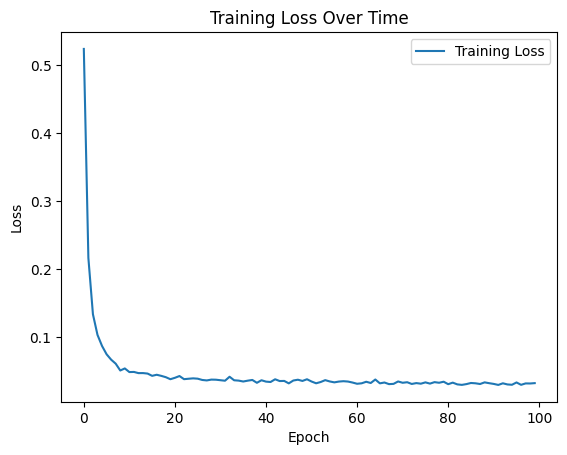

Task Train RMSE: 1.069488286972046, Train R2: 0.9985879678218479, Train MAE: 0.8278315663337708
Task Test RMSE: 0.6537570357322693, Test R2: 0.9992697379242116, Test MAE: 0.5815652012825012
Task Train RMSE: 0.9171030521392822, Train R2: 0.9987393376252189, Train MAE: 0.7186459898948669
Task Test RMSE: 1.2799632549285889, Test R2: 0.9984675627983669, Test MAE: 1.0183067321777344
Task Train RMSE: 0.9505271315574646, Train R2: 0.9986433965633906, Train MAE: 0.742728054523468
Task Test RMSE: 1.1783932447433472, Test R2: 0.9984959870163019, Test MAE: 0.9219789505004883
Task Train RMSE: 0.9932202100753784, Train R2: 0.9987956495352658, Train MAE: 0.7606002688407898
Task Test RMSE: 1.0279450416564941, Test R2: 0.9980565206457875, Test MAE: 0.8504891395568848
Task Train RMSE: 1.0619539022445679, Train R2: 0.9986679373024714, Train MAE: 0.8430846333503723
Task Test RMSE: 0.7011652588844299, Test R2: 0.9987439413414788, Test MAE: 0.520551860332489
Task Train RMSE: 1.0318776369094849, Train R2: 0

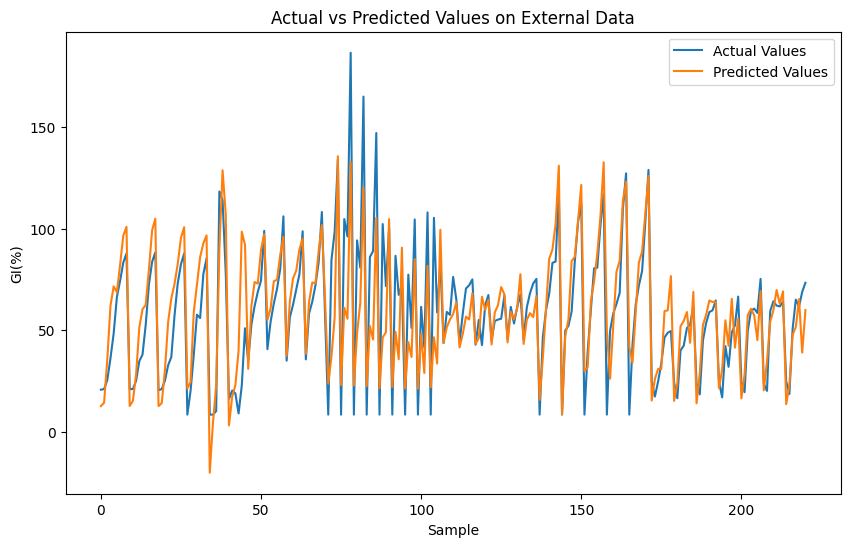

External Dataset - RMSE: 17.84003257751465, R2: 0.6796358679095699, MAE: 13.071014404296875


In [29]:
import torch
from torch import nn, optim
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
import learn2learn as l2l
import numpy as np
import torch

np.random.seed(0)  # 设置NumPy的随机种子
torch.manual_seed(0)  # 设置PyTorch的随机种子

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)

# Advanced neural network architecture
class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2

# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# Load and normalize data
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)1-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_feature(data, 'GI(%)')
# Create tasks using the normalized dataset
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(data_normalized, columns=data.columns), target_column='GI(%)')

# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")


# Load and process external data for evaluation
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)1-2.csv")
external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

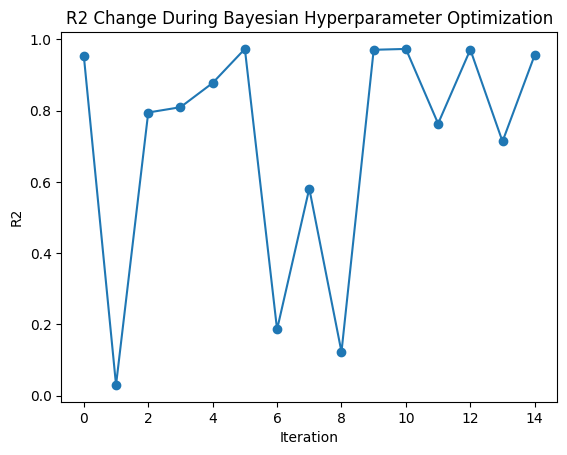

Original Dataset - RMSE: 1.1355440361984297, R2: 0.9987020424294721, MAE: 0.8682555848767137
External Dataset - RMSE: 17.84003257751465, R2: 0.6796358717635225, MAE: 13.071014404296875


In [31]:
# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


Best parameters: [1283, 1e-06, 0.00020715345193601876, 0.8, 1e-07]


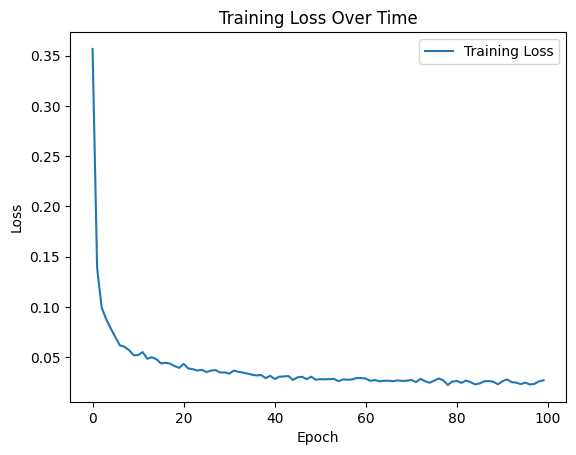

Task Train RMSE: 0.9826452732086182, Train R2: 0.9993178489326371, Train MAE: 0.8095968961715698
Task Test RMSE: 0.9665077924728394, Test R2: 0.9985263814451328, Test MAE: 0.7601986527442932
Task Train RMSE: 0.9959477186203003, Train R2: 0.999229019031616, Train MAE: 0.8065893054008484
Task Test RMSE: 0.9104164838790894, Test R2: 0.9992554197708945, Test MAE: 0.7722294926643372
Task Train RMSE: 0.9442721009254456, Train R2: 0.9992291223209399, Train MAE: 0.7696070671081543
Task Test RMSE: 1.1090106964111328, Test R2: 0.9992433367052058, Test MAE: 0.9201579093933105
Task Train RMSE: 0.9676343202590942, Train R2: 0.999163374060144, Train MAE: 0.7878619432449341
Task Test RMSE: 1.025301218032837, Test R2: 0.9993910334727447, Test MAE: 0.8471390008926392
Task Train RMSE: 1.005502462387085, Train R2: 0.9992301497513112, Train MAE: 0.824931263923645
Task Test RMSE: 0.867389976978302, Test R2: 0.9992807906755984, Test MAE: 0.6988622546195984
Task Train RMSE: 1.2368292808532715, Train R2: 0.99

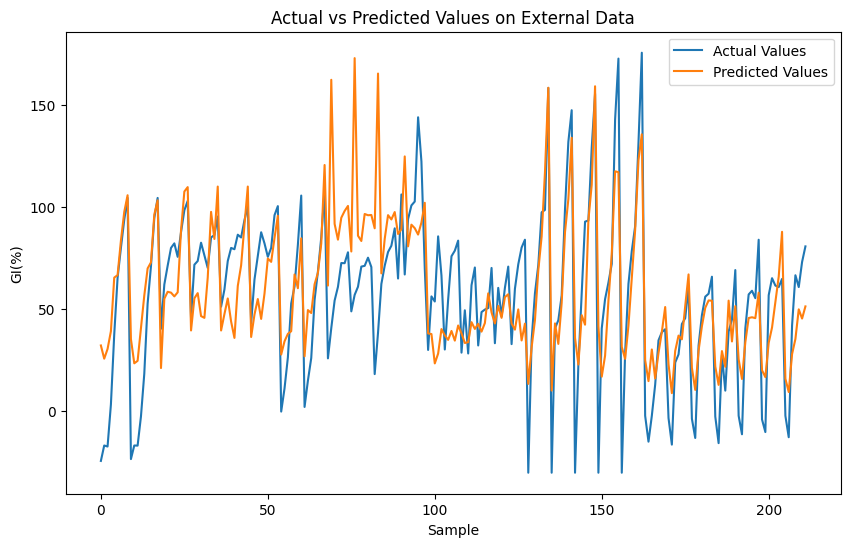

External Dataset - RMSE: 28.445354461669922, R2: 0.49153461911177965, MAE: 20.87732696533203


In [32]:
import torch
from torch import nn, optim
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
import learn2learn as l2l
import numpy as np
import torch

np.random.seed(0)  # 设置NumPy的随机种子
torch.manual_seed(0)  # 设置PyTorch的随机种子

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)

# Advanced neural network architecture
class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2


# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# Load and normalize data
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)2-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_feature(data, 'GI(%)')
# Create tasks using the normalized dataset
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(data_normalized, columns=data.columns), target_column='GI(%)')

# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")


# Load and process external data for evaluation
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)2-2.csv")
external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

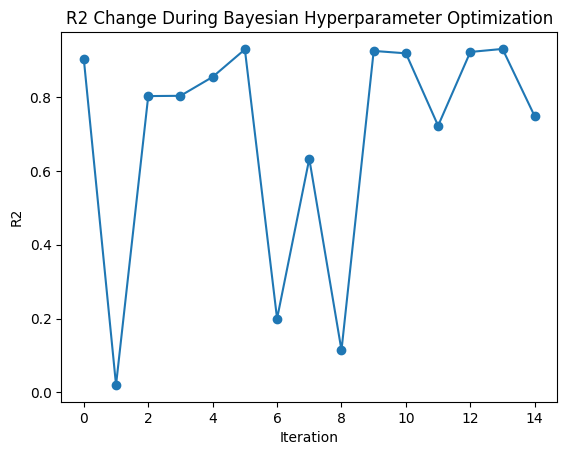

Original Dataset - RMSE: 1.077306254698909, R2: 0.9992706817825849, MAE: 0.832794626583568
External Dataset - RMSE: 28.445354461669922, R2: 0.4915346299721882, MAE: 20.87732696533203


In [33]:
# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


Best parameters: [1174, 1e-06, 7.501500380394618e-05, 0.7758410269764644, 1e-07]


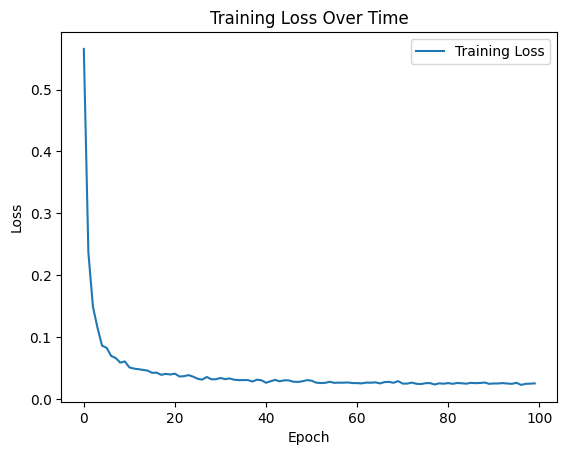

Task Train RMSE: 1.1297017335891724, Train R2: 0.9985805767631858, Train MAE: 0.8145942687988281
Task Test RMSE: 1.0739566087722778, Test R2: 0.9990824399265638, Test MAE: 0.8900593519210815
Task Train RMSE: 1.0691618919372559, Train R2: 0.9988372324481285, Train MAE: 0.8290770649909973
Task Test RMSE: 1.298406720161438, Test R2: 0.9981139318621834, Test MAE: 0.8321284055709839
Task Train RMSE: 1.1536835432052612, Train R2: 0.9986319734747973, Train MAE: 0.8593412637710571
Task Test RMSE: 0.9666140675544739, Test R2: 0.9989935533932589, Test MAE: 0.7110706567764282
Task Train RMSE: 1.104292392730713, Train R2: 0.9987649293689979, Train MAE: 0.7934445142745972
Task Test RMSE: 1.1749204397201538, Test R2: 0.9984647507174259, Test MAE: 0.974657416343689
Task Train RMSE: 1.1351237297058105, Train R2: 0.9987272800878539, Train MAE: 0.8519790768623352
Task Test RMSE: 1.0508390665054321, Test R2: 0.9985780687237306, Test MAE: 0.7405198812484741
Task Train RMSE: 1.0223942995071411, Train R2: 0

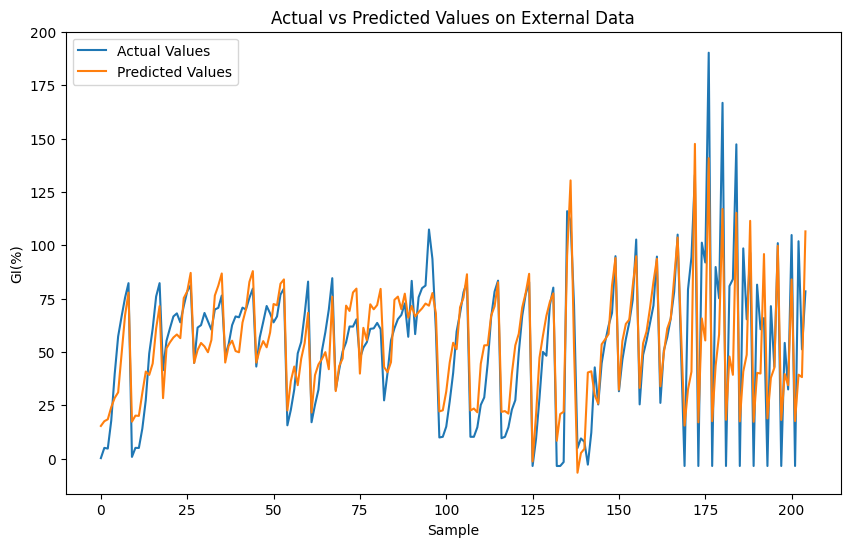

External Dataset - RMSE: 17.349403381347656, R2: 0.7206367384229282, MAE: 13.052189826965332


In [34]:
import torch
from torch import nn, optim
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
import learn2learn as l2l
import numpy as np
import torch

np.random.seed(0)  # 设置NumPy的随机种子
torch.manual_seed(0)  # 设置PyTorch的随机种子

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)

# Advanced neural network architecture
class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2


# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# Load and normalize data
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)3-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_feature(data, 'GI(%)')
# Create tasks using the normalized dataset
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(data_normalized, columns=data.columns), target_column='GI(%)')

# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")


# Load and process external data for evaluation
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)3-2.csv")
external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

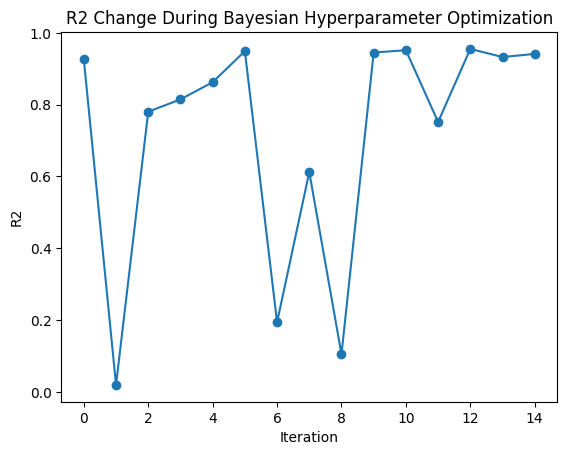

Original Dataset - RMSE: 1.1501079302025532, R2: 0.998772341993143, MAE: 0.8520924224338651
External Dataset - RMSE: 17.349403381347656, R2: 0.7206367603175624, MAE: 13.052189826965332


In [35]:
# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


Best parameters: [1032, 1e-11, 0.0001580749851893179, 0.1, 1e-07]


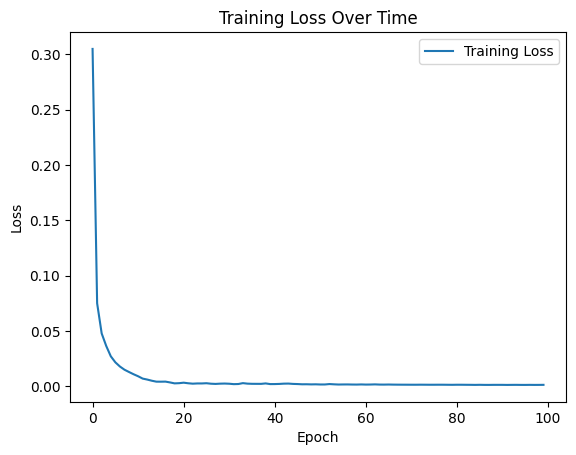

Task Train RMSE: 0.35858428478240967, Train R2: 0.9999156558417512, Train MAE: 0.1624806821346283
Task Test RMSE: 0.13210470974445343, Test R2: 0.9999787067374442, Test MAE: 0.08508167415857315
Task Train RMSE: 0.20841997861862183, Train R2: 0.9999657677078071, Train MAE: 0.11889815330505371
Task Test RMSE: 0.5983532071113586, Test R2: 0.9997817691375077, Test MAE: 0.25941067934036255
Task Train RMSE: 0.32710757851600647, Train R2: 0.9999211401172238, Train MAE: 0.1440887451171875
Task Test RMSE: 0.3221559524536133, Test R2: 0.9999227156110785, Test MAE: 0.1586473435163498
Task Train RMSE: 0.35828959941864014, Train R2: 0.9999058412586321, Train MAE: 0.15652450919151306
Task Test RMSE: 0.13526418805122375, Test R2: 0.9999842792587633, Test MAE: 0.10890521854162216
Task Train RMSE: 0.3526892364025116, Train R2: 0.9999094297196047, Train MAE: 0.1530108004808426
Task Test RMSE: 0.1849951595067978, Test R2: 0.9999728637812041, Test MAE: 0.12295856326818466
Task Train RMSE: 0.23171457648277

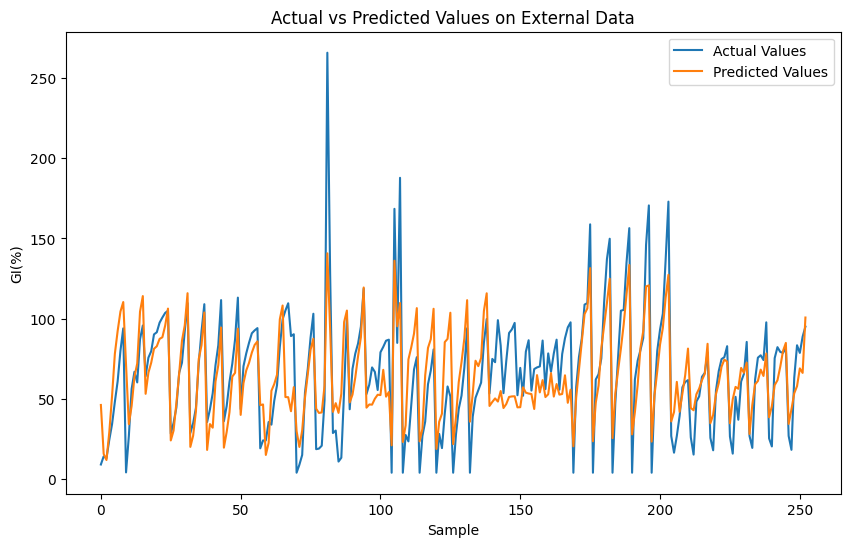

External Dataset - RMSE: 22.6945743560791, R2: 0.629387250957393, MAE: 17.336772918701172


In [36]:
import torch
from torch import nn, optim
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
import learn2learn as l2l
import numpy as np
import torch

np.random.seed(0)  # 设置NumPy的随机种子
torch.manual_seed(0)  # 设置PyTorch的随机种子

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)

# Advanced neural network architecture
class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2


# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# Load and normalize data
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)4-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_feature(data, 'GI(%)')
# Create tasks using the normalized dataset
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(data_normalized, columns=data.columns), target_column='GI(%)')

# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")


# Load and process external data for evaluation
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)4-2.csv")
external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

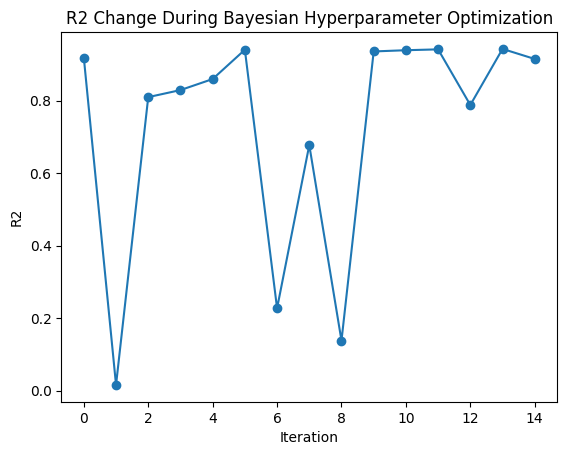

Original Dataset - RMSE: 0.28850765649584315, R2: 0.9999401049443535, MAE: 0.13854471267464655
External Dataset - RMSE: 22.6945743560791, R2: 0.629387248745081, MAE: 17.336774826049805


In [37]:
# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


Best parameters: [1500, 1e-06, 0.00012705895707318087, 0.8, 1e-07]


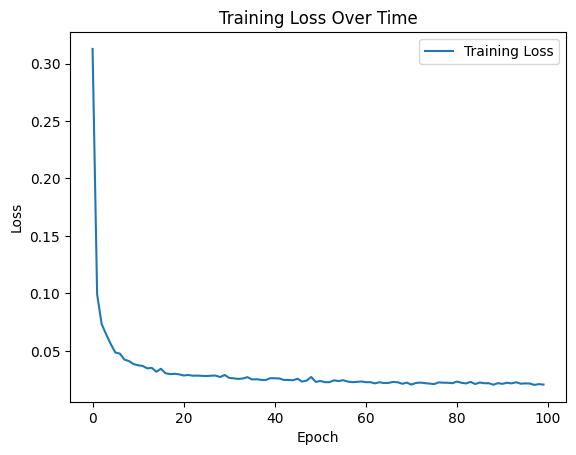

Task Train RMSE: 0.7420022487640381, Train R2: 0.9993547317343131, Train MAE: 0.6074317097663879
Task Test RMSE: 0.40505528450012207, Test R2: 0.998642011460725, Test MAE: 0.346815288066864
Task Train RMSE: 0.6889870762825012, Train R2: 0.9993164896793263, Train MAE: 0.5487368702888489
Task Test RMSE: 0.683758556842804, Test R2: 0.9994132348902354, Test MAE: 0.5815938711166382
Task Train RMSE: 0.696551501750946, Train R2: 0.9993091154724506, Train MAE: 0.5516153573989868
Task Test RMSE: 0.6523823738098145, Test R2: 0.9995003841972575, Test MAE: 0.5700803995132446
Task Train RMSE: 0.6690266728401184, Train R2: 0.9993175028731672, Train MAE: 0.5346864461898804
Task Test RMSE: 0.7589144706726074, Test R2: 0.9994340396140471, Test MAE: 0.6377958059310913
Task Train RMSE: 0.6389736533164978, Train R2: 0.9994637696460887, Train MAE: 0.5340713858604431
Task Test RMSE: 0.8562651872634888, Test R2: 0.9986133569503785, Test MAE: 0.6402567028999329
Task Train RMSE: 0.6920079588890076, Train R2: 0

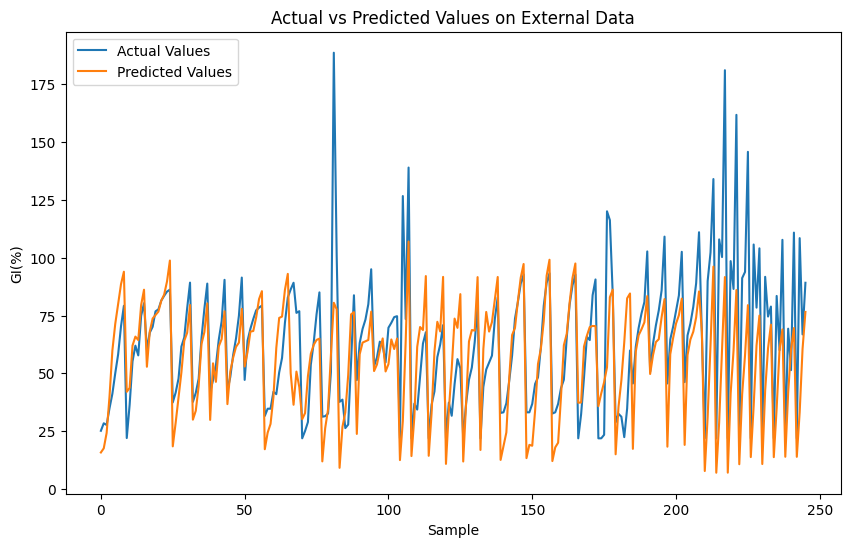

External Dataset - RMSE: 23.245399475097656, R2: 0.3505600880890509, MAE: 15.727394104003906


In [38]:
import torch
from torch import nn, optim
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
import learn2learn as l2l
import numpy as np
import torch

np.random.seed(0)  # 设置NumPy的随机种子
torch.manual_seed(0)  # 设置PyTorch的随机种子

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)

# Advanced neural network architecture
class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2


# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# Load and normalize data
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)5-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_feature(data, 'GI(%)')
# Create tasks using the normalized dataset
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(data_normalized, columns=data.columns), target_column='GI(%)')

# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")


# Load and process external data for evaluation
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)5-2.csv")
external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

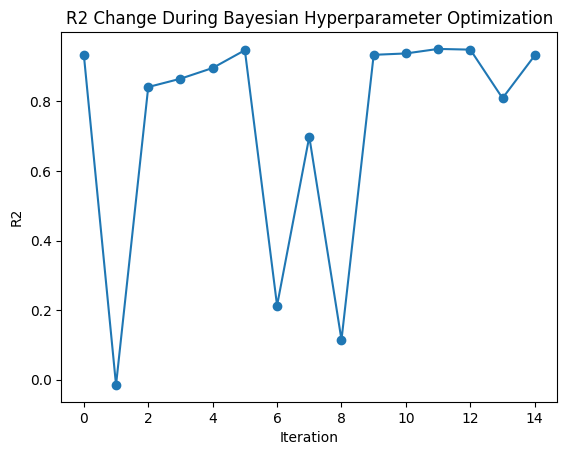

Original Dataset - RMSE: 0.7391594391557429, R2: 0.9993433389862435, MAE: 0.5715449274349671
External Dataset - RMSE: 23.245399475097656, R2: 0.3505600798165056, MAE: 15.72739315032959


In [39]:
# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


Best parameters: [1082, 4.8625731451155695e-09, 0.00010825862263250658, 0.1741353250314545, 6.943884941608576e-05]


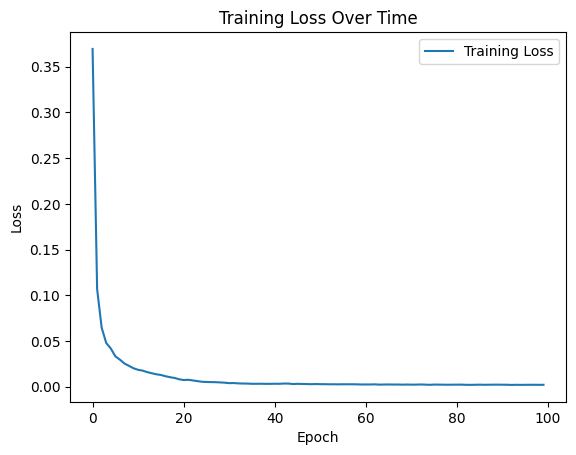

Task Train RMSE: 0.36356520652770996, Train R2: 0.9999080048927645, Train MAE: 0.20251163840293884
Task Test RMSE: 0.18181976675987244, Test R2: 0.9999723359897482, Test MAE: 0.15215377509593964
Task Train RMSE: 0.35634490847587585, Train R2: 0.999909193937322, Train MAE: 0.20098185539245605
Task Test RMSE: 0.23205509781837463, Test R2: 0.9999511964235857, Test MAE: 0.15827122330665588
Task Train RMSE: 0.36419516801834106, Train R2: 0.9998947123106092, Train MAE: 0.20755811035633087
Task Test RMSE: 0.17670437693595886, Test R2: 0.9999836078810209, Test MAE: 0.13196754455566406
Task Train RMSE: 0.22394180297851562, Train R2: 0.9999647950872556, Train MAE: 0.1540411412715912
Task Test RMSE: 0.600978672504425, Test R2: 0.9997091685281618, Test MAE: 0.3460350036621094
Task Train RMSE: 0.3461606502532959, Train R2: 0.9999147708612871, Train MAE: 0.19710664451122284
Task Test RMSE: 0.2871689200401306, Test R2: 0.9999279218543559, Test MAE: 0.1737716645002365
Task Train RMSE: 0.40801957249641

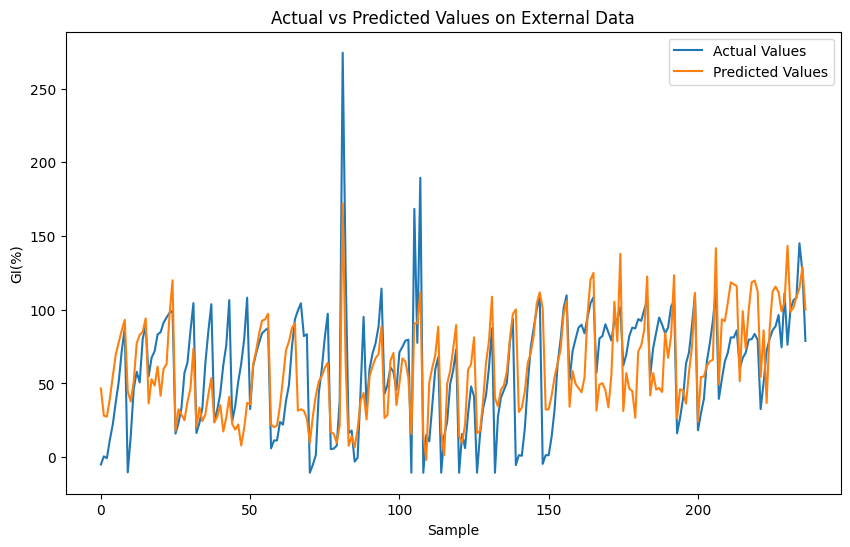

External Dataset - RMSE: 29.9942626953125, R2: 0.4074148343434052, MAE: 23.196619033813477


In [40]:
import torch
from torch import nn, optim
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
import learn2learn as l2l
import numpy as np
import torch

np.random.seed(0)  # 设置NumPy的随机种子
torch.manual_seed(0)  # 设置PyTorch的随机种子

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)

# Advanced neural network architecture
class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2


# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# Load and normalize data
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)6-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_feature(data, 'GI(%)')
# Create tasks using the normalized dataset
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(data_normalized, columns=data.columns), target_column='GI(%)')

# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")


# Load and process external data for evaluation
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)6-2.csv")
external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

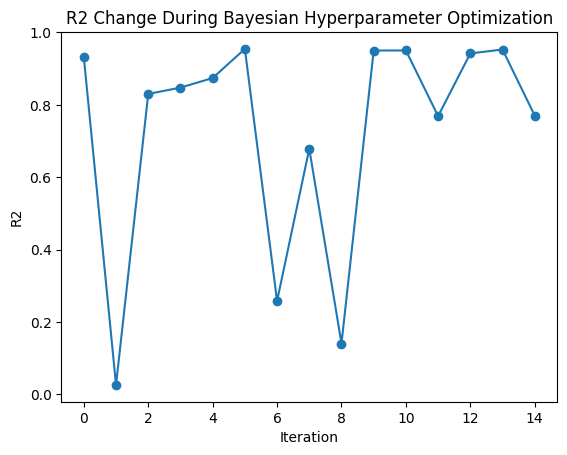

Original Dataset - RMSE: 0.3636313980586316, R2: 0.9999129042056076, MAE: 0.21479614282369333
External Dataset - RMSE: 29.9942626953125, R2: 0.407414831691735, MAE: 23.196619033813477


In [41]:
# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


GAN

Best parameters: [1082, 4.8625731451155695e-09, 0.00010825862263250658, 0.1741353250314545, 6.943884941608576e-05]


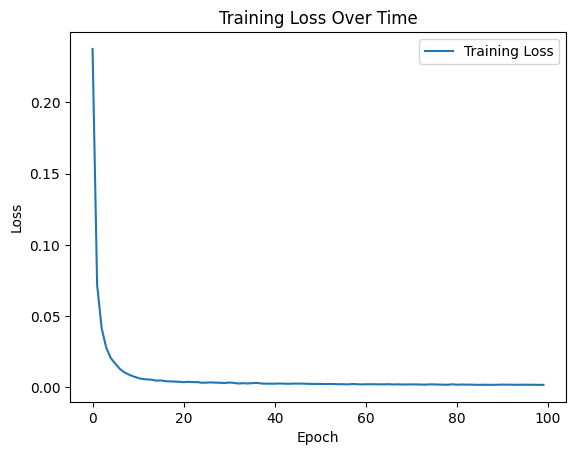

Task Train RMSE: 0.31602761149406433, Train R2: 0.9997836535051341, Train MAE: 0.10650043189525604
Task Test RMSE: 0.5005198121070862, Test R2: 0.9989433392747098, Test MAE: 0.17683200538158417
Task Train RMSE: 0.39655622839927673, Train R2: 0.9996539906998234, Train MAE: 0.13180550932884216
Task Test RMSE: 0.1448703110218048, Test R2: 0.9999141095576505, Test MAE: 0.07561244815587997
Task Train RMSE: 0.2717256247997284, Train R2: 0.9998306933425996, Train MAE: 0.09231557697057724
Task Test RMSE: 0.5955461263656616, Test R2: 0.9989527034003233, Test MAE: 0.23357143998146057
Task Train RMSE: 0.3963858187198639, Train R2: 0.9994274030703687, Train MAE: 0.13041062653064728
Task Test RMSE: 0.14672400057315826, Test R2: 0.9999757632991506, Test MAE: 0.08119163662195206
Task Train RMSE: 0.40240269899368286, Train R2: 0.9996405879095851, Train MAE: 0.14180198311805725
Task Test RMSE: 0.047990355640649796, Test R2: 0.9999913881863252, Test MAE: 0.03562641143798828
Task Train RMSE: 0.3866683542

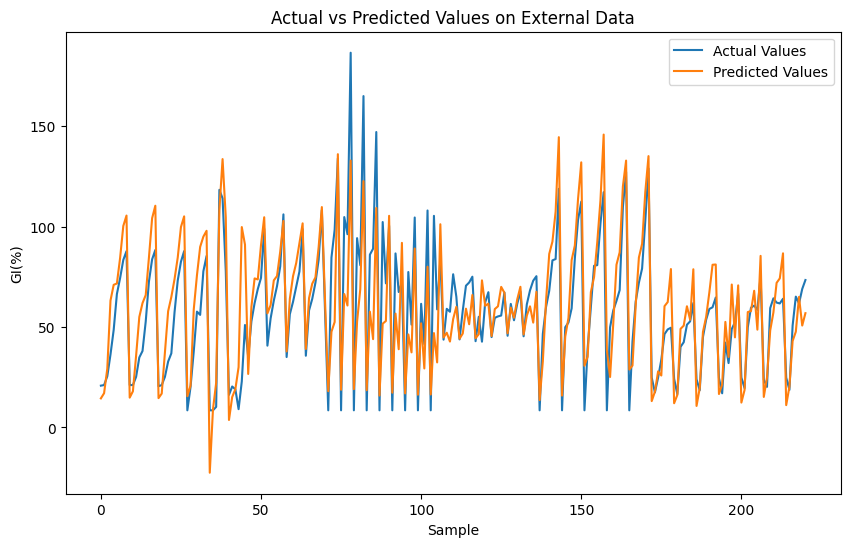

External Dataset - RMSE: 17.742427825927734, R2: 0.6831317776574573, MAE: 13.375368118286133


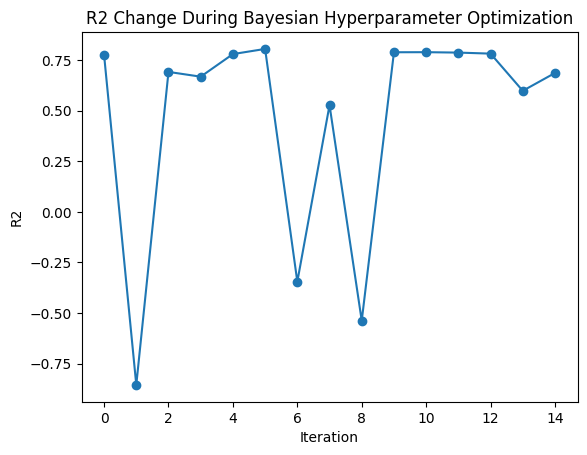

Original Dataset - RMSE: 0.5561172569159661, R2: 0.9996886955862977, MAE: 0.3537493562764953
External Dataset - RMSE: 17.742429733276367, R2: 0.6831317840866926, MAE: 13.37536907196045


In [7]:
import torch
from torch import nn, optim
import torch.nn.functional as F
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import learn2learn as l2l
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

# 设置随机种子
np.random.seed(0)
torch.manual_seed(0)

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)


class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# 其他辅助函数和类（如EarlyStopping, create_tasks等）根据需要添加
# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# GAN的生成器定义
class Generator(nn.Module):
    def __init__(self, input_size, hidden_dim, output_size):
        super(Generator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim * 4)
        self.fc4 = nn.Linear(hidden_dim * 4, output_size)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.tanh(self.fc4(x))
        return x

# GAN的判别器定义
class Discriminator(nn.Module):
    def __init__(self, input_size, hidden_dim):
        super(Discriminator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim * 4)
        self.fc2 = nn.Linear(hidden_dim * 4, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim)
        self.fc4 = nn.Linear(hidden_dim, 1)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.sigmoid(self.fc4(x))
        return x

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2

# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# 加载和规范化数据
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)1-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_data(data[['GI(%)']].values)
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)1-2.csv")


# 设置GAN训练参数
z_dim = 600  # 潜在空间的维度
gen_hidden_dim = 600
dis_hidden_dim = 600
lr = 0.005
batch_size = 600
num_epochs = 600

# 初始化模型
generator = Generator(z_dim, gen_hidden_dim, data_normalized.shape[1]).to(device)
discriminator = Discriminator(data_normalized.shape[1], dis_hidden_dim).to(device)

# 优化器
optim_g = optim.Adam(generator.parameters(), lr=lr)
optim_d = optim.Adam(discriminator.parameters(), lr=lr)

tensor_data = torch.Tensor(data_normalized)
data_loader = DataLoader(tensor_data, batch_size=batch_size, shuffle=True)

# GAN训练循环
for epoch in range(num_epochs):
    for batch in data_loader:
        current_batch_size = len(batch)  # Get the actual batch size
        real_data = batch.to(device)
        real_labels = torch.ones(current_batch_size, 1).to(device)  # Adjust label size based on batch
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Generate fake data based on current batch size
        fake_labels = torch.zeros(current_batch_size, 1).to(device)  # Adjust fake label size

        # 训练判别器
        optim_d.zero_grad()
        real_output = discriminator(real_data)
        fake_output = discriminator(fake_data)
        d_loss_real = nn.BCEWithLogitsLoss()(real_output, real_labels)
        d_loss_fake = nn.BCEWithLogitsLoss()(fake_output, fake_labels)
        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optim_d.step()

        # 训练生成器
        optim_g.zero_grad()
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Regenerate fake data
        fake_output = discriminator(fake_data)
        g_loss = nn.BCEWithLogitsLoss()(fake_output, real_labels)  # Use real_labels here
        g_loss.backward()
        optim_g.step()

# 假设您想生成一定数量的新样本
number_of_generated_samples = 500

# 生成新的数据样本
generated_samples = []
for _ in range(number_of_generated_samples):
    z = torch.randn(1, z_dim).to(device)
    generated_sample = generator(z).detach().cpu().numpy()
    generated_samples.append(generated_sample.reshape(-1))

generated_samples = np.array(generated_samples)

# 将生成的样本合并到现有数据中
extended_data = np.vstack([data_normalized, generated_samples])

# 创建增强的数据集任务
# 这里假设您已经定义了创建任务的函数
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(extended_data, columns=data.columns), target_column='GI(%)')
# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")
# Load and process external data for evaluation

external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


Best parameters: [1500, 2.8400430803283567e-07, 9.727001791342768e-06, 0.8, 3.61928221981569e-05]


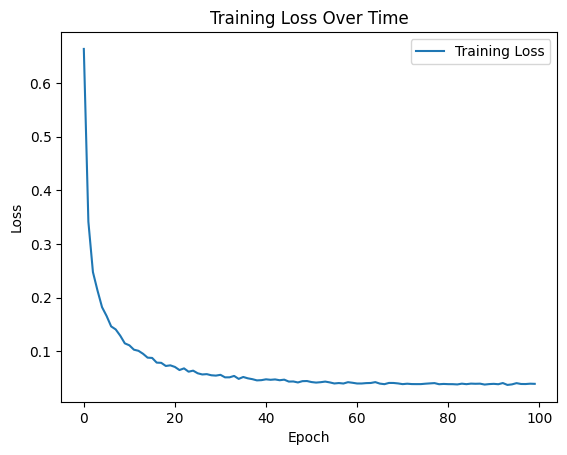

Task Train RMSE: 2.1658122539520264, Train R2: 0.9937152894062575, Train MAE: 1.4146535396575928
Task Test RMSE: 5.4573259353637695, Test R2: 0.9613291782797547, Test MAE: 3.0343055725097656
Task Train RMSE: 3.2056424617767334, Train R2: 0.9852499344474802, Train MAE: 1.7420965433120728
Task Test RMSE: 2.727782964706421, Test R2: 0.9922151973160119, Test MAE: 1.7245337963104248
Task Train RMSE: 3.382330894470215, Train R2: 0.9812445216930994, Train MAE: 1.858789086341858
Task Test RMSE: 1.6687511205673218, Test R2: 0.9978450884489278, Test MAE: 1.257764220237732
Task Train RMSE: 3.1960866451263428, Train R2: 0.9879014856925313, Train MAE: 1.7247997522354126
Task Test RMSE: 2.772271156311035, Test R2: 0.9791294987787009, Test MAE: 1.7937214374542236
Task Train RMSE: 3.453021287918091, Train R2: 0.9861045384336748, Train MAE: 1.9525811672210693
Task Test RMSE: 0.9230118989944458, Test R2: 0.9966856379281034, Test MAE: 0.8825950622558594
Task Train RMSE: 5.643036842346191, Train R2: 0.966

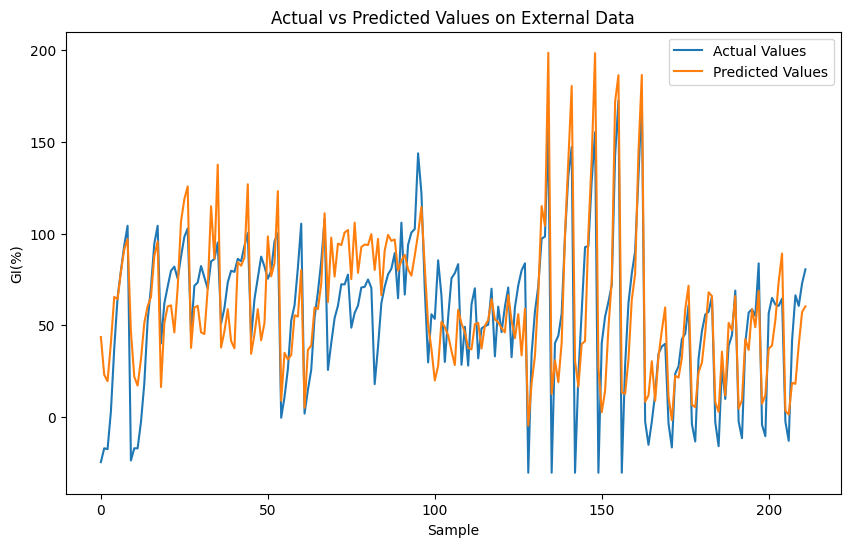

External Dataset - RMSE: 24.39405059814453, R2: 0.6260559964247174, MAE: 19.50435447692871


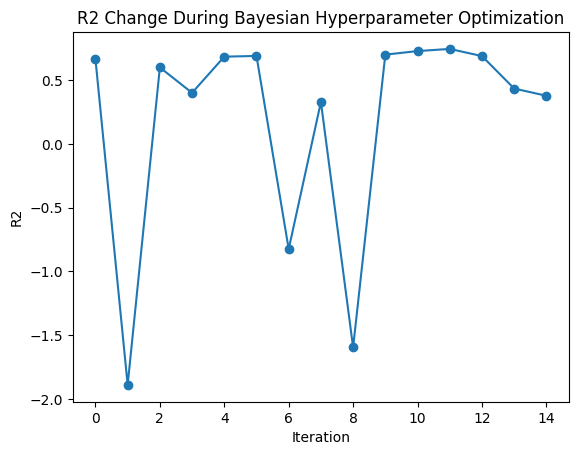

Original Dataset - RMSE: 9.353581571392029, R2: 0.9450212862364551, MAE: 6.093112803113586
External Dataset - RMSE: 24.39405059814453, R2: 0.6260560176660631, MAE: 19.50435447692871


In [8]:
import torch
from torch import nn, optim
import torch.nn.functional as F
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import learn2learn as l2l
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

# 设置随机种子
np.random.seed(0)
torch.manual_seed(0)

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)


class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# 其他辅助函数和类（如EarlyStopping, create_tasks等）根据需要添加
# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# GAN的生成器定义
class Generator(nn.Module):
    def __init__(self, input_size, hidden_dim, output_size):
        super(Generator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim * 4)
        self.fc4 = nn.Linear(hidden_dim * 4, output_size)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.tanh(self.fc4(x))
        return x

# GAN的判别器定义
class Discriminator(nn.Module):
    def __init__(self, input_size, hidden_dim):
        super(Discriminator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim * 4)
        self.fc2 = nn.Linear(hidden_dim * 4, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim)
        self.fc4 = nn.Linear(hidden_dim, 1)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.sigmoid(self.fc4(x))
        return x

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2

# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# 加载和规范化数据
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)2-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_data(data[['GI(%)']].values)
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)2-2.csv")


# 设置GAN训练参数
z_dim = 600  # 潜在空间的维度
gen_hidden_dim = 600
dis_hidden_dim = 600
lr = 0.005
batch_size = 600
num_epochs = 600

# 初始化模型
generator = Generator(z_dim, gen_hidden_dim, data_normalized.shape[1]).to(device)
discriminator = Discriminator(data_normalized.shape[1], dis_hidden_dim).to(device)

# 优化器
optim_g = optim.Adam(generator.parameters(), lr=lr)
optim_d = optim.Adam(discriminator.parameters(), lr=lr)

tensor_data = torch.Tensor(data_normalized)
data_loader = DataLoader(tensor_data, batch_size=batch_size, shuffle=True)

# GAN训练循环
for epoch in range(num_epochs):
    for batch in data_loader:
        current_batch_size = len(batch)  # Get the actual batch size
        real_data = batch.to(device)
        real_labels = torch.ones(current_batch_size, 1).to(device)  # Adjust label size based on batch
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Generate fake data based on current batch size
        fake_labels = torch.zeros(current_batch_size, 1).to(device)  # Adjust fake label size

        # 训练判别器
        optim_d.zero_grad()
        real_output = discriminator(real_data)
        fake_output = discriminator(fake_data)
        d_loss_real = nn.BCEWithLogitsLoss()(real_output, real_labels)
        d_loss_fake = nn.BCEWithLogitsLoss()(fake_output, fake_labels)
        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optim_d.step()

        # 训练生成器
        optim_g.zero_grad()
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Regenerate fake data
        fake_output = discriminator(fake_data)
        g_loss = nn.BCEWithLogitsLoss()(fake_output, real_labels)  # Use real_labels here
        g_loss.backward()
        optim_g.step()

# 假设您想生成一定数量的新样本
number_of_generated_samples = 500

# 生成新的数据样本
generated_samples = []
for _ in range(number_of_generated_samples):
    z = torch.randn(1, z_dim).to(device)
    generated_sample = generator(z).detach().cpu().numpy()
    generated_samples.append(generated_sample.reshape(-1))

generated_samples = np.array(generated_samples)

# 将生成的样本合并到现有数据中
extended_data = np.vstack([data_normalized, generated_samples])

# 创建增强的数据集任务
# 这里假设您已经定义了创建任务的函数
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(extended_data, columns=data.columns), target_column='GI(%)')
# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")
# Load and process external data for evaluation

external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


Best parameters: [1500, 5.9771563140640926e-09, 2.2275017610933534e-05, 0.8, 3.845920950626112e-07]


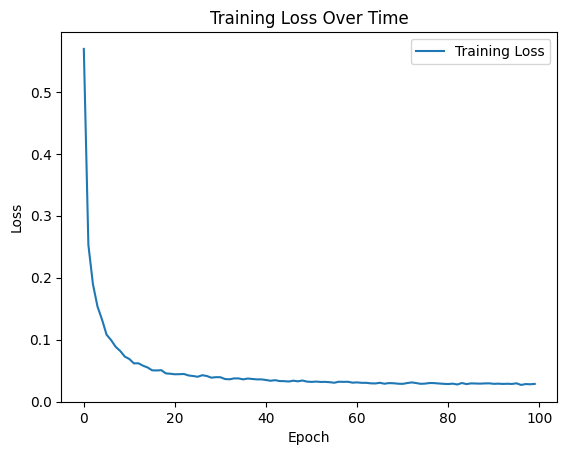

Task Train RMSE: 2.420006513595581, Train R2: 0.9899820569088756, Train MAE: 1.4856044054031372
Task Test RMSE: 1.1327111721038818, Test R2: 0.9914707026715167, Test MAE: 0.9477211236953735
Task Train RMSE: 2.4410109519958496, Train R2: 0.9879042689768948, Train MAE: 1.517697811126709
Task Test RMSE: 0.9352125525474548, Test R2: 0.9983597238142975, Test MAE: 0.8193462491035461
Task Train RMSE: 2.0259461402893066, Train R2: 0.9921405163524936, Train MAE: 1.2332065105438232
Task Test RMSE: 2.879397392272949, Test R2: 0.979441236844404, Test MAE: 1.9573122262954712
Task Train RMSE: 2.0241858959198, Train R2: 0.9906592019555983, Train MAE: 1.2607166767120361
Task Test RMSE: 2.8843448162078857, Test R2: 0.9890204562827706, Test MAE: 1.8472706079483032
Task Train RMSE: 2.1661040782928467, Train R2: 0.990006477440133, Train MAE: 1.3929121494293213
Task Test RMSE: 2.437361478805542, Test R2: 0.9898125785574026, Test MAE: 1.3184888362884521
Task Train RMSE: 2.3457953929901123, Train R2: 0.99191

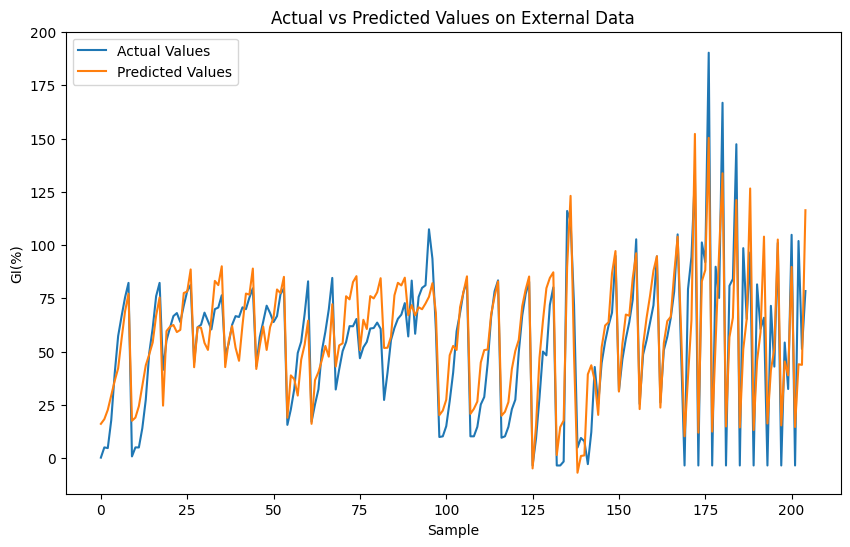

External Dataset - RMSE: 15.774449348449707, R2: 0.7690549535424084, MAE: 12.277397155761719


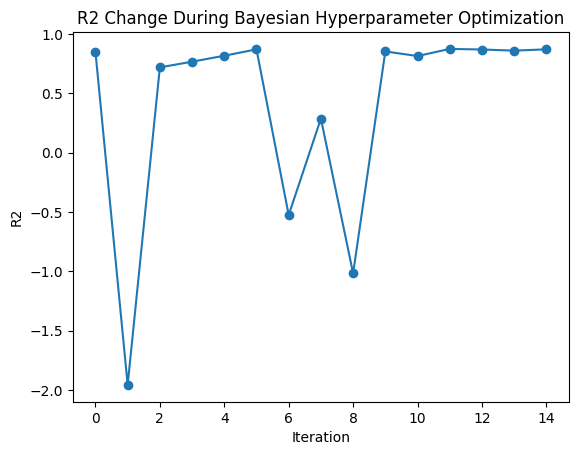

Original Dataset - RMSE: 4.306079822028009, R2: 0.9827906543744062, MAE: 3.1830814045596045
External Dataset - RMSE: 15.774449348449707, R2: 0.769054947212847, MAE: 12.277396202087402


In [9]:
import torch
from torch import nn, optim
import torch.nn.functional as F
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import learn2learn as l2l
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

# 设置随机种子
np.random.seed(0)
torch.manual_seed(0)

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)


class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# 其他辅助函数和类（如EarlyStopping, create_tasks等）根据需要添加
# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# GAN的生成器定义
class Generator(nn.Module):
    def __init__(self, input_size, hidden_dim, output_size):
        super(Generator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim * 4)
        self.fc4 = nn.Linear(hidden_dim * 4, output_size)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.tanh(self.fc4(x))
        return x

# GAN的判别器定义
class Discriminator(nn.Module):
    def __init__(self, input_size, hidden_dim):
        super(Discriminator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim * 4)
        self.fc2 = nn.Linear(hidden_dim * 4, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim)
        self.fc4 = nn.Linear(hidden_dim, 1)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.sigmoid(self.fc4(x))
        return x

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2

# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# 加载和规范化数据
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)3-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_data(data[['GI(%)']].values)
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)3-2.csv")


# 设置GAN训练参数
z_dim = 600  # 潜在空间的维度
gen_hidden_dim = 600
dis_hidden_dim = 600
lr = 0.005
batch_size = 600
num_epochs = 600

# 初始化模型
generator = Generator(z_dim, gen_hidden_dim, data_normalized.shape[1]).to(device)
discriminator = Discriminator(data_normalized.shape[1], dis_hidden_dim).to(device)

# 优化器
optim_g = optim.Adam(generator.parameters(), lr=lr)
optim_d = optim.Adam(discriminator.parameters(), lr=lr)

tensor_data = torch.Tensor(data_normalized)
data_loader = DataLoader(tensor_data, batch_size=batch_size, shuffle=True)

# GAN训练循环
for epoch in range(num_epochs):
    for batch in data_loader:
        current_batch_size = len(batch)  # Get the actual batch size
        real_data = batch.to(device)
        real_labels = torch.ones(current_batch_size, 1).to(device)  # Adjust label size based on batch
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Generate fake data based on current batch size
        fake_labels = torch.zeros(current_batch_size, 1).to(device)  # Adjust fake label size

        # 训练判别器
        optim_d.zero_grad()
        real_output = discriminator(real_data)
        fake_output = discriminator(fake_data)
        d_loss_real = nn.BCEWithLogitsLoss()(real_output, real_labels)
        d_loss_fake = nn.BCEWithLogitsLoss()(fake_output, fake_labels)
        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optim_d.step()

        # 训练生成器
        optim_g.zero_grad()
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Regenerate fake data
        fake_output = discriminator(fake_data)
        g_loss = nn.BCEWithLogitsLoss()(fake_output, real_labels)  # Use real_labels here
        g_loss.backward()
        optim_g.step()

# 假设您想生成一定数量的新样本
number_of_generated_samples = 500

# 生成新的数据样本
generated_samples = []
for _ in range(number_of_generated_samples):
    z = torch.randn(1, z_dim).to(device)
    generated_sample = generator(z).detach().cpu().numpy()
    generated_samples.append(generated_sample.reshape(-1))

generated_samples = np.array(generated_samples)

# 将生成的样本合并到现有数据中
extended_data = np.vstack([data_normalized, generated_samples])

# 创建增强的数据集任务
# 这里假设您已经定义了创建任务的函数
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(extended_data, columns=data.columns), target_column='GI(%)')
# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")
# Load and process external data for evaluation

external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


Best parameters: [671, 6.176761533672798e-10, 0.00010063396049315316, 0.5254814681008275, 8.918326627754476e-06]


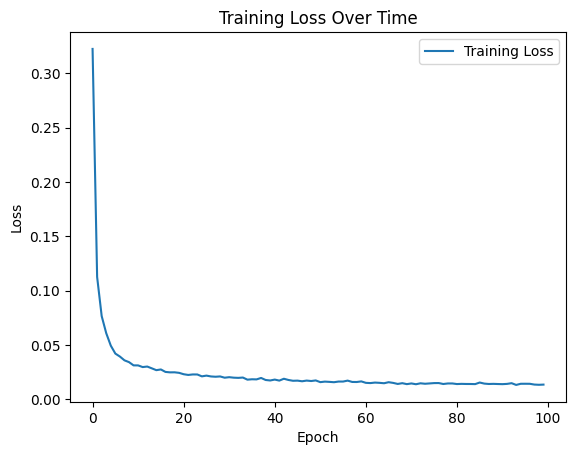

Task Train RMSE: 2.019378185272217, Train R2: 0.9935434512634694, Train MAE: 0.7362378239631653
Task Test RMSE: 2.9947710037231445, Test R2: 0.9762196961303439, Test MAE: 1.1470553874969482
Task Train RMSE: 2.4644699096679688, Train R2: 0.9899033030130884, Train MAE: 0.8460928201675415
Task Test RMSE: 0.9928494095802307, Test R2: 0.9980161550033357, Test MAE: 0.7076357007026672
Task Train RMSE: 2.4991872310638428, Train R2: 0.9884454400519816, Train MAE: 0.9058451652526855
Task Test RMSE: 0.5444735288619995, Test R2: 0.9996023992172235, Test MAE: 0.4686260223388672
Task Train RMSE: 1.6354008913040161, Train R2: 0.9958537900873136, Train MAE: 0.7171589732170105
Task Test RMSE: 3.8186421394348145, Test R2: 0.9470745379895203, Test MAE: 1.223369836807251
Task Train RMSE: 2.491630792617798, Train R2: 0.9872892165987865, Train MAE: 0.8866717219352722
Task Test RMSE: 0.6688056588172913, Test R2: 0.9995194969160119, Test MAE: 0.5453193783760071
Task Train RMSE: 0.8849082589149475, Train R2: 0

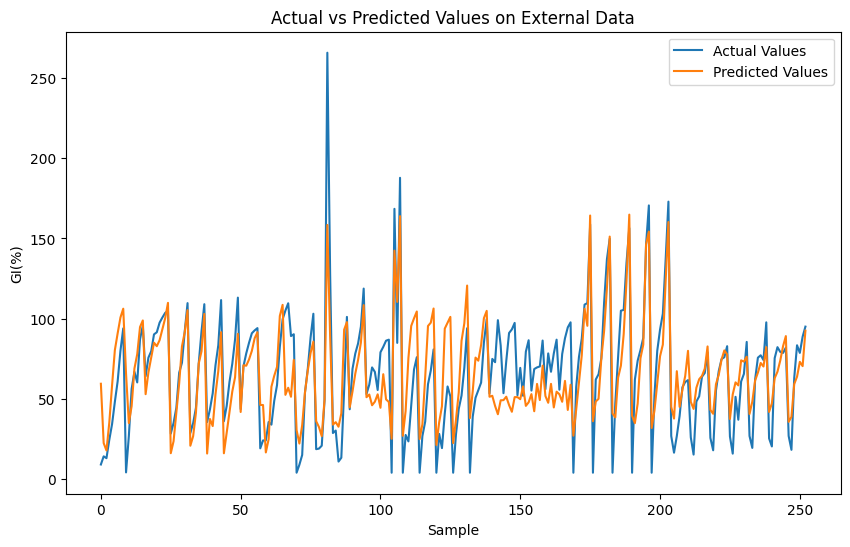

External Dataset - RMSE: 22.55537223815918, R2: 0.633919765897675, MAE: 17.4597225189209


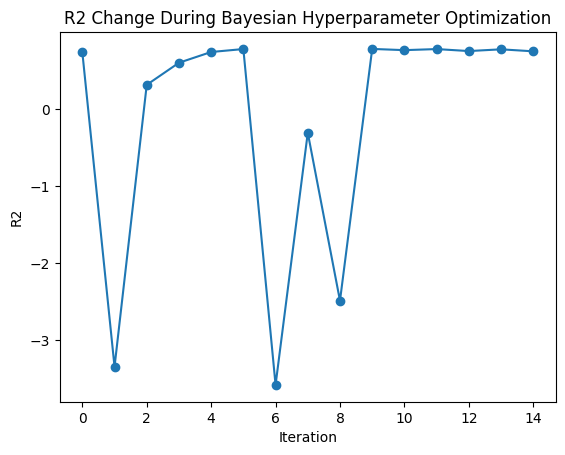

Original Dataset - RMSE: 3.7339618877292, R2: 0.9899673410697536, MAE: 1.7139326493039526
External Dataset - RMSE: 22.55537223815918, R2: 0.63391976793546, MAE: 17.4597225189209


In [10]:
import torch
from torch import nn, optim
import torch.nn.functional as F
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import learn2learn as l2l
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

# 设置随机种子
np.random.seed(0)
torch.manual_seed(0)

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)


class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# 其他辅助函数和类（如EarlyStopping, create_tasks等）根据需要添加
# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# GAN的生成器定义
class Generator(nn.Module):
    def __init__(self, input_size, hidden_dim, output_size):
        super(Generator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim * 4)
        self.fc4 = nn.Linear(hidden_dim * 4, output_size)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.tanh(self.fc4(x))
        return x

# GAN的判别器定义
class Discriminator(nn.Module):
    def __init__(self, input_size, hidden_dim):
        super(Discriminator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim * 4)
        self.fc2 = nn.Linear(hidden_dim * 4, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim)
        self.fc4 = nn.Linear(hidden_dim, 1)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.sigmoid(self.fc4(x))
        return x

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2

# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# 加载和规范化数据
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)4-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_data(data[['GI(%)']].values)
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)4-2.csv")


# 设置GAN训练参数
z_dim = 600  # 潜在空间的维度
gen_hidden_dim = 600
dis_hidden_dim = 600
lr = 0.005
batch_size = 600
num_epochs = 600

# 初始化模型
generator = Generator(z_dim, gen_hidden_dim, data_normalized.shape[1]).to(device)
discriminator = Discriminator(data_normalized.shape[1], dis_hidden_dim).to(device)

# 优化器
optim_g = optim.Adam(generator.parameters(), lr=lr)
optim_d = optim.Adam(discriminator.parameters(), lr=lr)

tensor_data = torch.Tensor(data_normalized)
data_loader = DataLoader(tensor_data, batch_size=batch_size, shuffle=True)

# GAN训练循环
for epoch in range(num_epochs):
    for batch in data_loader:
        current_batch_size = len(batch)  # Get the actual batch size
        real_data = batch.to(device)
        real_labels = torch.ones(current_batch_size, 1).to(device)  # Adjust label size based on batch
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Generate fake data based on current batch size
        fake_labels = torch.zeros(current_batch_size, 1).to(device)  # Adjust fake label size

        # 训练判别器
        optim_d.zero_grad()
        real_output = discriminator(real_data)
        fake_output = discriminator(fake_data)
        d_loss_real = nn.BCEWithLogitsLoss()(real_output, real_labels)
        d_loss_fake = nn.BCEWithLogitsLoss()(fake_output, fake_labels)
        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optim_d.step()

        # 训练生成器
        optim_g.zero_grad()
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Regenerate fake data
        fake_output = discriminator(fake_data)
        g_loss = nn.BCEWithLogitsLoss()(fake_output, real_labels)  # Use real_labels here
        g_loss.backward()
        optim_g.step()

# 假设您想生成一定数量的新样本
number_of_generated_samples = 500

# 生成新的数据样本
generated_samples = []
for _ in range(number_of_generated_samples):
    z = torch.randn(1, z_dim).to(device)
    generated_sample = generator(z).detach().cpu().numpy()
    generated_samples.append(generated_sample.reshape(-1))

generated_samples = np.array(generated_samples)

# 将生成的样本合并到现有数据中
extended_data = np.vstack([data_normalized, generated_samples])

# 创建增强的数据集任务
# 这里假设您已经定义了创建任务的函数
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(extended_data, columns=data.columns), target_column='GI(%)')
# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")
# Load and process external data for evaluation

external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


Best parameters: [1121, 5.621064654888602e-11, 5.757665154201376e-05, 0.8, 1e-07]


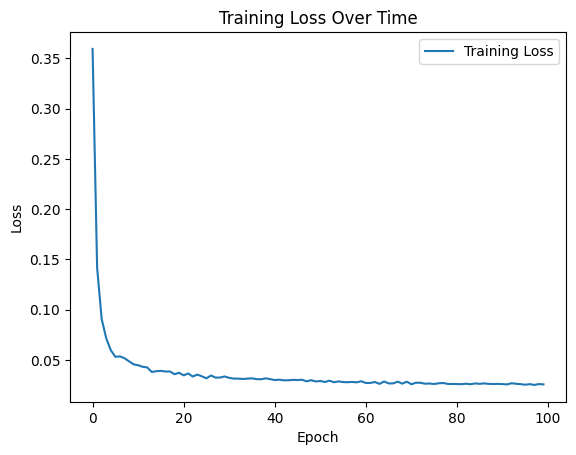

Task Train RMSE: 0.948975145816803, Train R2: 0.9983621413974285, Train MAE: 0.8205995559692383
Task Test RMSE: 0.895026683807373, Test R2: 0.9945090876176712, Test MAE: 0.7826610803604126
Task Train RMSE: 0.9527279734611511, Train R2: 0.9979967337593967, Train MAE: 0.8168236017227173
Task Test RMSE: 0.8789345026016235, Test R2: 0.9986196477652677, Test MAE: 0.7977645993232727
Task Train RMSE: 0.904930591583252, Train R2: 0.9981785735846461, Train MAE: 0.7971931099891663
Task Test RMSE: 1.0619280338287354, Test R2: 0.9980070120922762, Test MAE: 0.8762866854667664
Task Train RMSE: 0.8981217741966248, Train R2: 0.9982489145937462, Train MAE: 0.7913723587989807
Task Test RMSE: 1.084802508354187, Test R2: 0.9977336970672703, Test MAE: 0.8995693325996399
Task Train RMSE: 0.9846428632736206, Train R2: 0.9978767411627243, Train MAE: 0.8390703201293945
Task Test RMSE: 0.7247083783149719, Test R2: 0.9990358967455943, Test MAE: 0.7087777853012085
Task Train RMSE: 1.2536561489105225, Train R2: 0.

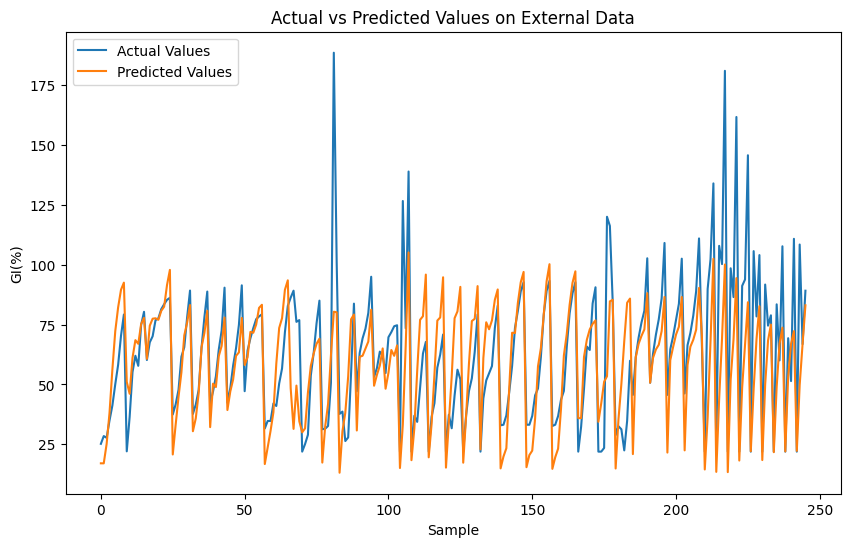

External Dataset - RMSE: 21.640766143798828, R2: 0.43712724789125534, MAE: 14.50969409942627


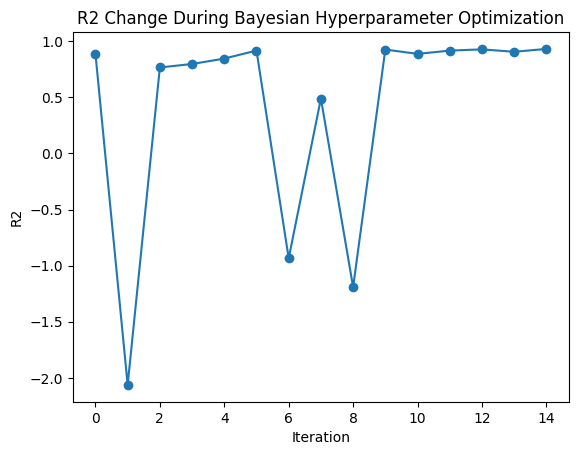

Original Dataset - RMSE: 2.402339103988867, R2: 0.993063608467774, MAE: 1.7581026497555687
External Dataset - RMSE: 21.640766143798828, R2: 0.4371272467473363, MAE: 14.50969409942627


In [12]:
import torch
from torch import nn, optim
import torch.nn.functional as F
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import learn2learn as l2l
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

# 设置随机种子
np.random.seed(0)
torch.manual_seed(0)

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)


class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# 其他辅助函数和类（如EarlyStopping, create_tasks等）根据需要添加
# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# GAN的生成器定义
class Generator(nn.Module):
    def __init__(self, input_size, hidden_dim, output_size):
        super(Generator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim * 4)
        self.fc4 = nn.Linear(hidden_dim * 4, output_size)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.tanh(self.fc4(x))
        return x

# GAN的判别器定义
class Discriminator(nn.Module):
    def __init__(self, input_size, hidden_dim):
        super(Discriminator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim * 4)
        self.fc2 = nn.Linear(hidden_dim * 4, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim)
        self.fc4 = nn.Linear(hidden_dim, 1)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.sigmoid(self.fc4(x))
        return x

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2

# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# 加载和规范化数据
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)5-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_data(data[['GI(%)']].values)
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)5-2.csv")


# 设置GAN训练参数
z_dim = 600  # 潜在空间的维度
gen_hidden_dim = 600
dis_hidden_dim = 600
lr = 0.005
batch_size = 600
num_epochs = 600

# 初始化模型
generator = Generator(z_dim, gen_hidden_dim, data_normalized.shape[1]).to(device)
discriminator = Discriminator(data_normalized.shape[1], dis_hidden_dim).to(device)

# 优化器
optim_g = optim.Adam(generator.parameters(), lr=lr)
optim_d = optim.Adam(discriminator.parameters(), lr=lr)

tensor_data = torch.Tensor(data_normalized)
data_loader = DataLoader(tensor_data, batch_size=batch_size, shuffle=True)

# GAN训练循环
for epoch in range(num_epochs):
    for batch in data_loader:
        current_batch_size = len(batch)  # Get the actual batch size
        real_data = batch.to(device)
        real_labels = torch.ones(current_batch_size, 1).to(device)  # Adjust label size based on batch
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Generate fake data based on current batch size
        fake_labels = torch.zeros(current_batch_size, 1).to(device)  # Adjust fake label size

        # 训练判别器
        optim_d.zero_grad()
        real_output = discriminator(real_data)
        fake_output = discriminator(fake_data)
        d_loss_real = nn.BCEWithLogitsLoss()(real_output, real_labels)
        d_loss_fake = nn.BCEWithLogitsLoss()(fake_output, fake_labels)
        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optim_d.step()

        # 训练生成器
        optim_g.zero_grad()
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Regenerate fake data
        fake_output = discriminator(fake_data)
        g_loss = nn.BCEWithLogitsLoss()(fake_output, real_labels)  # Use real_labels here
        g_loss.backward()
        optim_g.step()

# 假设您想生成一定数量的新样本
number_of_generated_samples = 500

# 生成新的数据样本
generated_samples = []
for _ in range(number_of_generated_samples):
    z = torch.randn(1, z_dim).to(device)
    generated_sample = generator(z).detach().cpu().numpy()
    generated_samples.append(generated_sample.reshape(-1))

generated_samples = np.array(generated_samples)

# 将生成的样本合并到现有数据中
extended_data = np.vstack([data_normalized, generated_samples])

# 创建增强的数据集任务
# 这里假设您已经定义了创建任务的函数
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(extended_data, columns=data.columns), target_column='GI(%)')
# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")
# Load and process external data for evaluation

external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


Best parameters: [1500, 1e-06, 3.669242938000561e-05, 0.8, 1e-07]


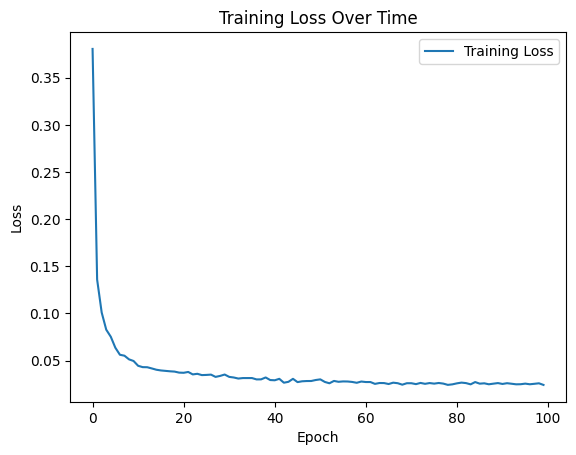

Task Train RMSE: 1.334169864654541, Train R2: 0.9978551481544244, Train MAE: 1.0046659708023071
Task Test RMSE: 1.3944437503814697, Test R2: 0.9975054661580413, Test MAE: 1.089080810546875
Task Train RMSE: 1.4040604829788208, Train R2: 0.997658922402724, Train MAE: 1.0497939586639404
Task Test RMSE: 1.0858025550842285, Test R2: 0.9983590219577163, Test MAE: 0.9085695147514343
Task Train RMSE: 1.4249731302261353, Train R2: 0.9976953906707109, Train MAE: 1.0790094137191772
Task Test RMSE: 0.9707298874855042, Test R2: 0.9983070587565376, Test MAE: 0.7917078137397766
Task Train RMSE: 1.2310432195663452, Train R2: 0.9977591100945135, Train MAE: 0.9616788625717163
Task Test RMSE: 1.7328135967254639, Test R2: 0.9976355534584586, Test MAE: 1.2610290050506592
Task Train RMSE: 1.3293195962905884, Train R2: 0.9979493637591264, Train MAE: 1.012590765953064
Task Test RMSE: 1.4128506183624268, Test R2: 0.9968637893004426, Test MAE: 1.0573818683624268
Task Train RMSE: 1.9677318334579468, Train R2: 0.

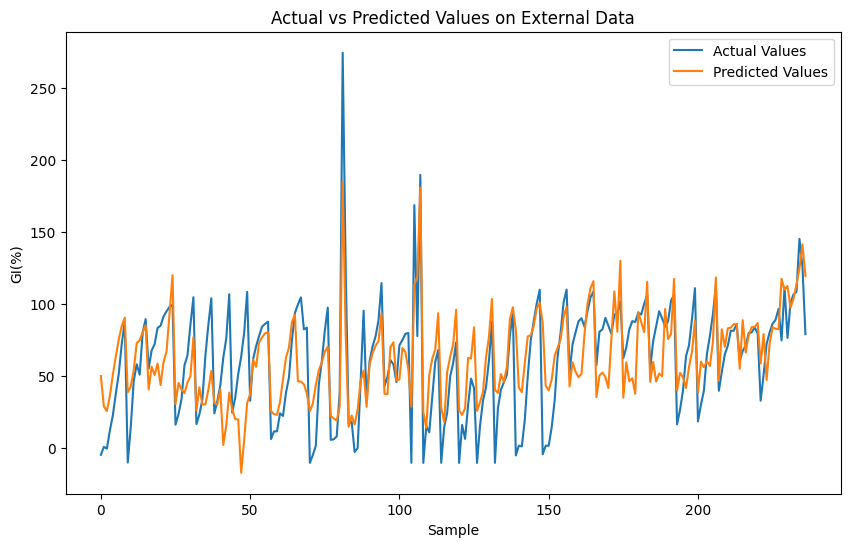

External Dataset - RMSE: 27.748994827270508, R2: 0.4928121031847946, MAE: 21.217369079589844


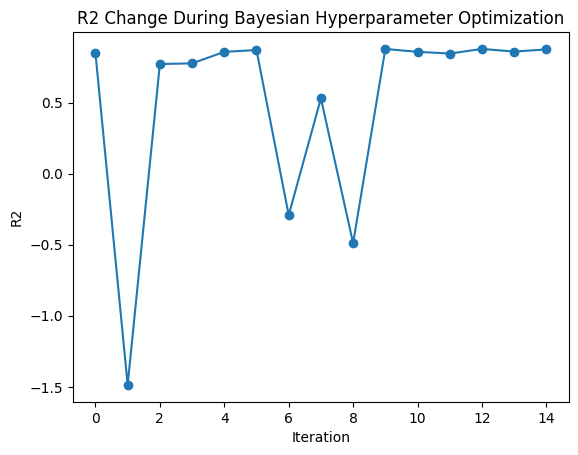

Original Dataset - RMSE: 5.611423160384647, R2: 0.9792594402075272, MAE: 3.163530010805712
External Dataset - RMSE: 27.748994827270508, R2: 0.492812092061082, MAE: 21.217369079589844


In [11]:
import torch
from torch import nn, optim
import torch.nn.functional as F
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import learn2learn as l2l
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

# 设置随机种子
np.random.seed(0)
torch.manual_seed(0)

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)


class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# 其他辅助函数和类（如EarlyStopping, create_tasks等）根据需要添加
# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# GAN的生成器定义
class Generator(nn.Module):
    def __init__(self, input_size, hidden_dim, output_size):
        super(Generator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim * 4)
        self.fc4 = nn.Linear(hidden_dim * 4, output_size)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.tanh(self.fc4(x))
        return x

# GAN的判别器定义
class Discriminator(nn.Module):
    def __init__(self, input_size, hidden_dim):
        super(Discriminator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim * 4)
        self.fc2 = nn.Linear(hidden_dim * 4, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim)
        self.fc4 = nn.Linear(hidden_dim, 1)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.sigmoid(self.fc4(x))
        return x

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2

# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# 加载和规范化数据
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)6-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_data(data[['GI(%)']].values)
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)6-2.csv")


# 设置GAN训练参数
z_dim = 600  # 潜在空间的维度
gen_hidden_dim = 600
dis_hidden_dim = 600
lr = 0.005
batch_size = 600
num_epochs = 600

# 初始化模型
generator = Generator(z_dim, gen_hidden_dim, data_normalized.shape[1]).to(device)
discriminator = Discriminator(data_normalized.shape[1], dis_hidden_dim).to(device)

# 优化器
optim_g = optim.Adam(generator.parameters(), lr=lr)
optim_d = optim.Adam(discriminator.parameters(), lr=lr)

tensor_data = torch.Tensor(data_normalized)
data_loader = DataLoader(tensor_data, batch_size=batch_size, shuffle=True)

# GAN训练循环
for epoch in range(num_epochs):
    for batch in data_loader:
        current_batch_size = len(batch)  # Get the actual batch size
        real_data = batch.to(device)
        real_labels = torch.ones(current_batch_size, 1).to(device)  # Adjust label size based on batch
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Generate fake data based on current batch size
        fake_labels = torch.zeros(current_batch_size, 1).to(device)  # Adjust fake label size

        # 训练判别器
        optim_d.zero_grad()
        real_output = discriminator(real_data)
        fake_output = discriminator(fake_data)
        d_loss_real = nn.BCEWithLogitsLoss()(real_output, real_labels)
        d_loss_fake = nn.BCEWithLogitsLoss()(fake_output, fake_labels)
        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optim_d.step()

        # 训练生成器
        optim_g.zero_grad()
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Regenerate fake data
        fake_output = discriminator(fake_data)
        g_loss = nn.BCEWithLogitsLoss()(fake_output, real_labels)  # Use real_labels here
        g_loss.backward()
        optim_g.step()

# 假设您想生成一定数量的新样本
number_of_generated_samples = 500

# 生成新的数据样本
generated_samples = []
for _ in range(number_of_generated_samples):
    z = torch.randn(1, z_dim).to(device)
    generated_sample = generator(z).detach().cpu().numpy()
    generated_samples.append(generated_sample.reshape(-1))

generated_samples = np.array(generated_samples)

# 将生成的样本合并到现有数据中
extended_data = np.vstack([data_normalized, generated_samples])

# 创建增强的数据集任务
# 这里假设您已经定义了创建任务的函数
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(extended_data, columns=data.columns), target_column='GI(%)')
# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")
# Load and process external data for evaluation

external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


以一部分作为训练数据集

Best parameters: [891, 1e-06, 9.046176039255315e-05, 0.8, 1e-07]


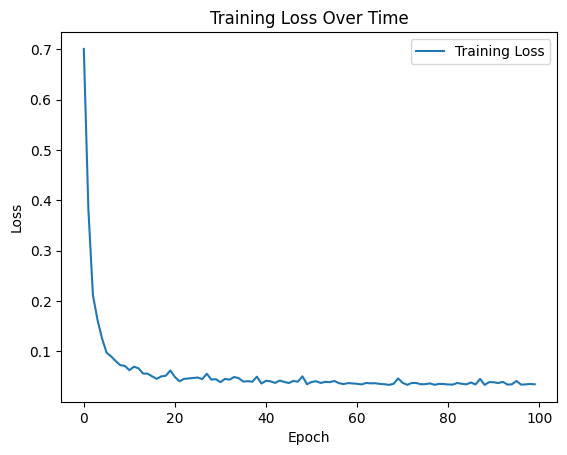

Task Train RMSE: 1.3727200031280518, Train R2: 0.998187444703053, Train MAE: 1.0578477382659912
Task Test RMSE: 1.0638915300369263, Test R2: 0.9986409655461879, Test MAE: 0.9445659518241882
Task Train RMSE: 1.007798671722412, Train R2: 0.998406200586003, Train MAE: 0.8709775805473328
Task Test RMSE: 2.14631986618042, Test R2: 0.9980387883186057, Test MAE: 1.6920497417449951
Task Train RMSE: 1.400956153869629, Train R2: 0.9982511434618566, Train MAE: 1.0923174619674683
Task Test RMSE: 0.9047611355781555, Test R2: 0.997693621996589, Test MAE: 0.8066873550415039
Task Train RMSE: 1.3903597593307495, Train R2: 0.9983711092551311, Train MAE: 1.0913341045379639
Task Test RMSE: 0.9679363965988159, Test R2: 0.9969607574645625, Test MAE: 0.8106199502944946
Task Train RMSE: 1.3687621355056763, Train R2: 0.9982522227979028, Train MAE: 1.0634807348251343
Task Test RMSE: 1.0840970277786255, Test R2: 0.9984625909071551, Test MAE: 0.9220340847969055
Task Train RMSE: 1.9102519750595093, Train R2: 0.997

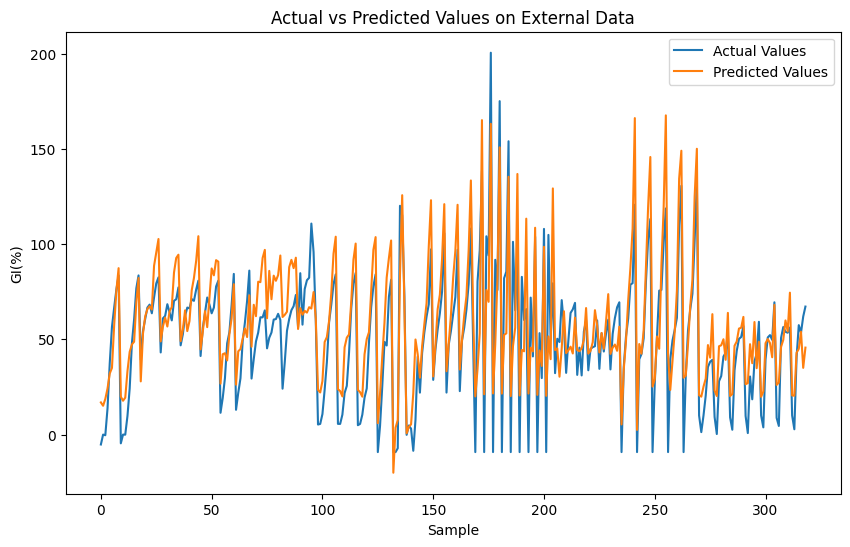

External Dataset - RMSE: 18.96586036682129, R2: 0.6840622749251241, MAE: 15.18305492401123


In [54]:
import torch
from torch import nn, optim
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
import learn2learn as l2l
import numpy as np
import torch

np.random.seed(0)  # 设置NumPy的随机种子
torch.manual_seed(0)  # 设置PyTorch的随机种子

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)

# Advanced neural network architecture
class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=50):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2

# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# Load and normalize data
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)1-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_feature(data, 'GI(%)')
# Create tasks using the normalized dataset
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(data_normalized, columns=data.columns), target_column='GI(%)')

# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")


# Load and process external data for evaluation
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)1-2.csv")
external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

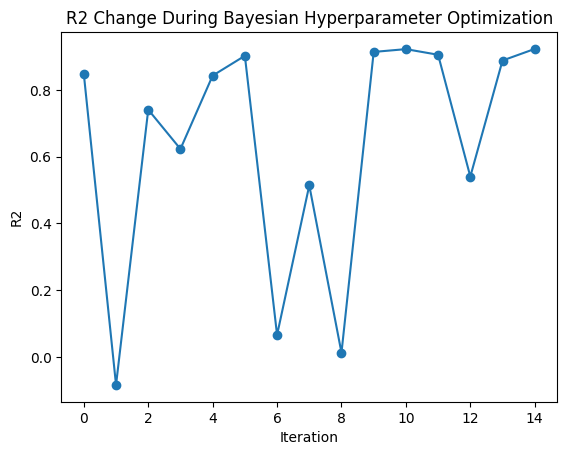

Original Dataset - RMSE: 1.6009618312478864, R2: 0.9977487778444268, MAE: 1.180501166618164
External Dataset - RMSE: 18.96586036682129, R2: 0.6840622725031491, MAE: 15.18305492401123


In [55]:
# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


Best parameters: [1082, 4.8625731451155695e-09, 0.00010825862263250658, 0.1741353250314545, 6.943884941608576e-05]


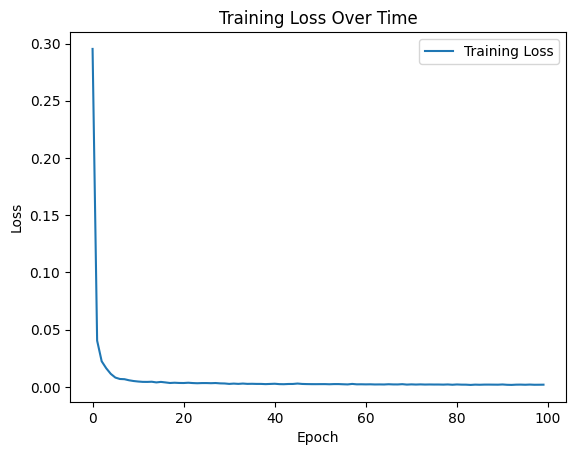

Task Train RMSE: 0.35001227259635925, Train R2: 0.9997632920437886, Train MAE: 0.15425196290016174
Task Test RMSE: 0.11110623925924301, Test R2: 0.999986287289558, Test MAE: 0.09982185065746307
Task Train RMSE: 0.17016559839248657, Train R2: 0.9999600227346854, Train MAE: 0.10148248821496964
Task Test RMSE: 0.6217343807220459, Test R2: 0.9973020448416681, Test MAE: 0.3108993470668793
Task Train RMSE: 0.34868818521499634, Train R2: 0.9998079159801252, Train MAE: 0.15629616379737854
Task Test RMSE: 0.126669779419899, Test R2: 0.999970947944581, Test MAE: 0.09164466708898544
Task Train RMSE: 0.35090330243110657, Train R2: 0.9998016212820209, Train MAE: 0.1604677140712738
Task Test RMSE: 0.09922958165407181, Test R2: 0.9999839217382247, Test MAE: 0.0749591812491417
Task Train RMSE: 0.3258795738220215, Train R2: 0.9998307832118116, Train MAE: 0.14433136582374573
Task Test RMSE: 0.278548002243042, Test R2: 0.9998762297066741, Test MAE: 0.13950462639331818
Task Train RMSE: 0.17666023969650269

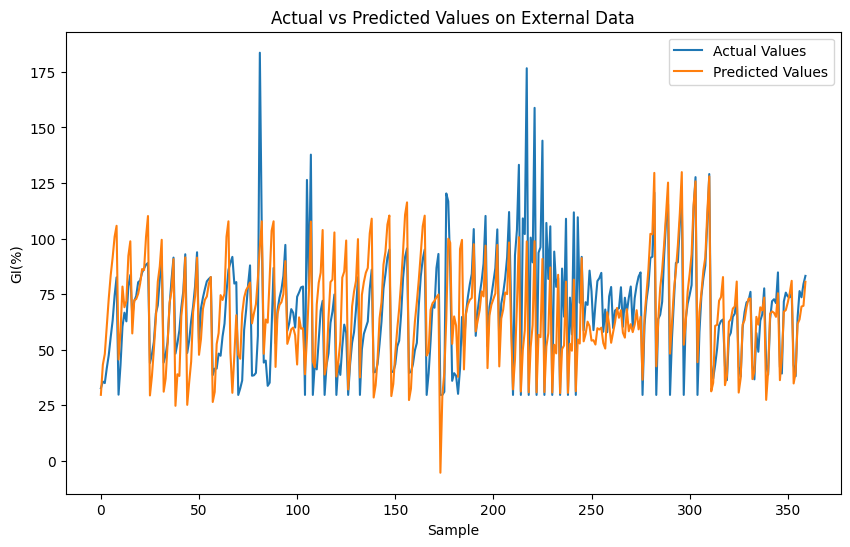

External Dataset - RMSE: 19.077774047851562, R2: 0.4160683331709847, MAE: 13.661576271057129


In [56]:
import torch
from torch import nn, optim
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
import learn2learn as l2l
import numpy as np
import torch

np.random.seed(0)  # 设置NumPy的随机种子
torch.manual_seed(0)  # 设置PyTorch的随机种子

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)

# Advanced neural network architecture
class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=50):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2


# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# Load and normalize data
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)2-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_feature(data, 'GI(%)')
# Create tasks using the normalized dataset
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(data_normalized, columns=data.columns), target_column='GI(%)')

# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")


# Load and process external data for evaluation
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)2-2.csv")
external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

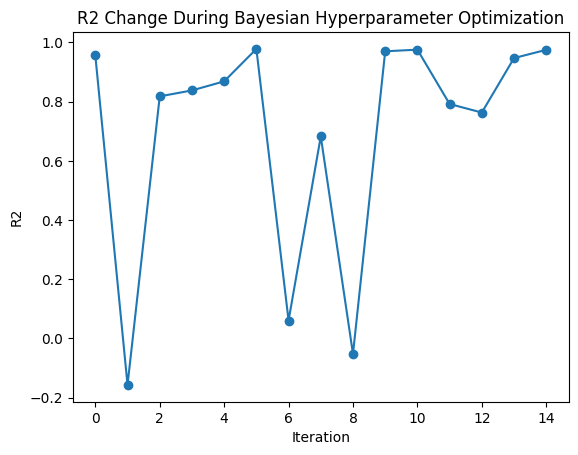

Original Dataset - RMSE: 0.32535778173796975, R2: 0.9998301643030615, MAE: 0.1400307256842461
External Dataset - RMSE: 19.077774047851562, R2: 0.41606835148466237, MAE: 13.661575317382812


In [57]:
# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


Best parameters: [1500, 1.9295332658249808e-07, 9.641859596789345e-05, 0.8, 6.227565337009817e-06]


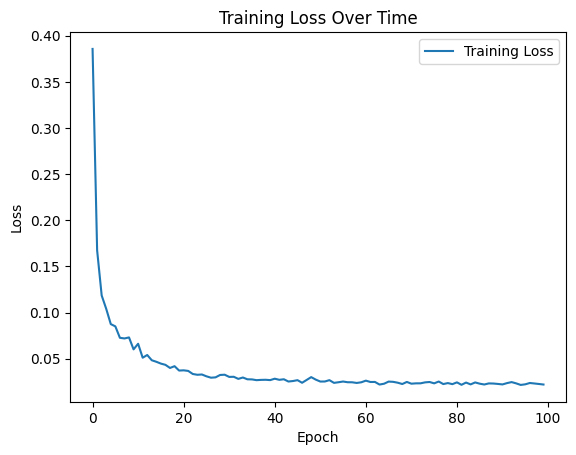

Task Train RMSE: 1.3132351636886597, Train R2: 0.9992403295415454, Train MAE: 0.9656215906143188
Task Test RMSE: 0.6395434737205505, Test R2: 0.9996397350696254, Test MAE: 0.5319671630859375
Task Train RMSE: 1.2708293199539185, Train R2: 0.9993213320996347, Train MAE: 0.9053829908370972
Task Test RMSE: 0.9205079078674316, Test R2: 0.9988123313172865, Test MAE: 0.7729228734970093
Task Train RMSE: 1.047337532043457, Train R2: 0.9993345750519188, Train MAE: 0.7946028709411621
Task Test RMSE: 1.7087128162384033, Test R2: 0.9992105715201215, Test MAE: 1.21604323387146
Task Train RMSE: 1.270785927772522, Train R2: 0.9992466606001748, Train MAE: 0.8981770277023315
Task Test RMSE: 0.9207475781440735, Test R2: 0.9995099029695277, Test MAE: 0.8017457723617554
Task Train RMSE: 1.120694875717163, Train R2: 0.9993230236181756, Train MAE: 0.830670177936554
Task Test RMSE: 1.5111411809921265, Test R2: 0.9992024732326349, Test MAE: 1.0717766284942627
Task Train RMSE: 1.1500521898269653, Train R2: 0.99

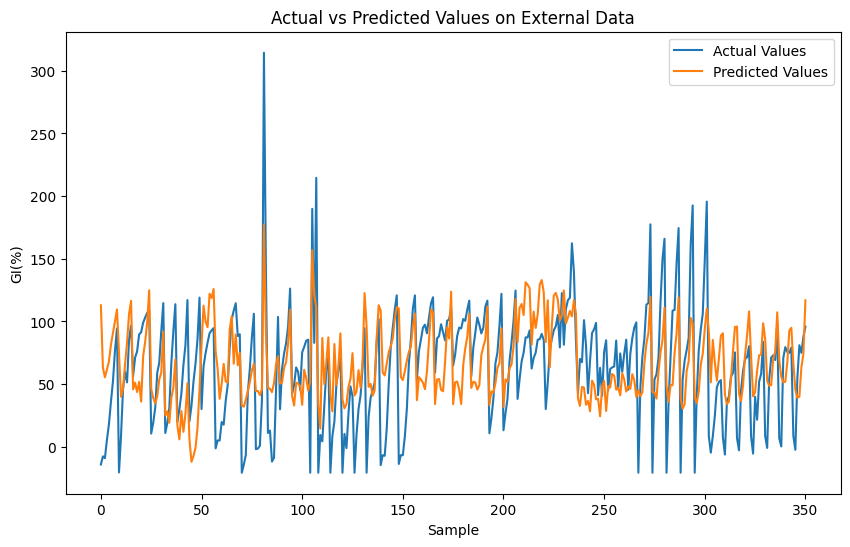

External Dataset - RMSE: 39.86152648925781, R2: 0.2378400892249234, MAE: 31.81657600402832


In [58]:
import torch
from torch import nn, optim
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
import learn2learn as l2l
import numpy as np
import torch

np.random.seed(0)  # 设置NumPy的随机种子
torch.manual_seed(0)  # 设置PyTorch的随机种子

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)

# Advanced neural network architecture
class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=50):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2


# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# Load and normalize data
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)3-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_feature(data, 'GI(%)')
# Create tasks using the normalized dataset
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(data_normalized, columns=data.columns), target_column='GI(%)')

# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")


# Load and process external data for evaluation
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)3-2.csv")
external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

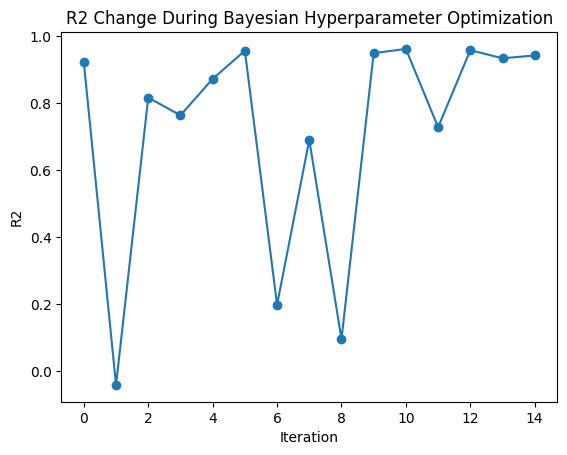

Original Dataset - RMSE: 1.291905825752959, R2: 0.9991994287627691, MAE: 0.9583275886323813
External Dataset - RMSE: 39.86152648925781, R2: 0.23784008284253078, MAE: 31.816574096679688


In [59]:
# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


Best parameters: [671, 6.176761533672798e-10, 0.00010063396049315316, 0.5254814681008275, 8.918326627754476e-06]


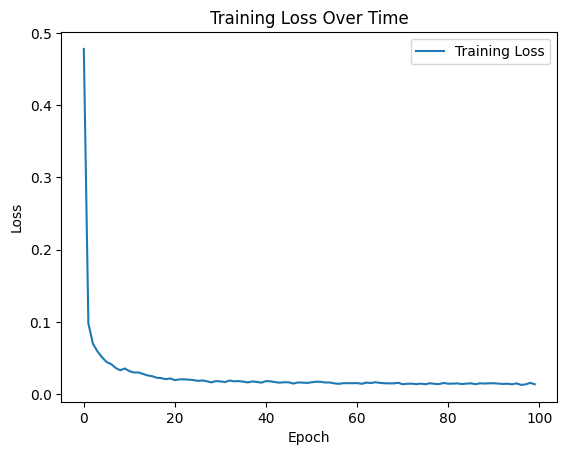

Task Train RMSE: 0.7395269870758057, Train R2: 0.9994192929173765, Train MAE: 0.5257257223129272
Task Test RMSE: 0.3325546681880951, Test R2: 0.9996148722607545, Test MAE: 0.2737892270088196
Task Train RMSE: 0.7158727049827576, Train R2: 0.9993455322317361, Train MAE: 0.4982966482639313
Task Test RMSE: 0.49829551577568054, Test R2: 0.9997224949666147, Test MAE: 0.383505642414093
Task Train RMSE: 0.7261736392974854, Train R2: 0.9993922991354686, Train MAE: 0.5076819658279419
Task Test RMSE: 0.4346049726009369, Test R2: 0.9996115005038047, Test MAE: 0.3459649980068207
Task Train RMSE: 0.5653436183929443, Train R2: 0.9994800395767338, Train MAE: 0.38770467042922974
Task Test RMSE: 1.009820580482483, Test R2: 0.9993581296866172, Test MAE: 0.8258727788925171
Task Train RMSE: 0.6260012984275818, Train R2: 0.9995333721164372, Train MAE: 0.4572828412055969
Task Test RMSE: 0.8547998070716858, Test R2: 0.9988898601312661, Test MAE: 0.5475608706474304
Task Train RMSE: 0.6722545027732849, Train R2

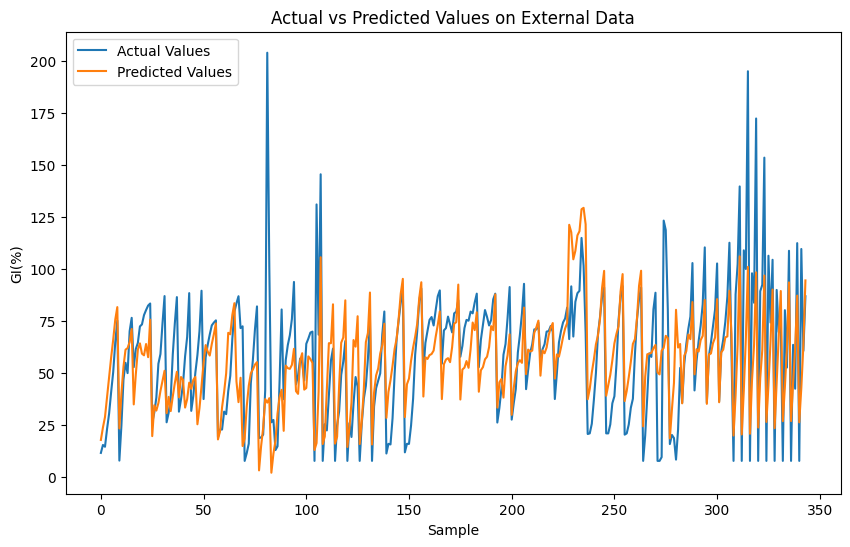

External Dataset - RMSE: 24.31975746154785, R2: 0.39153129793939556, MAE: 17.01934051513672


In [60]:
import torch
from torch import nn, optim
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
import learn2learn as l2l
import numpy as np
import torch

np.random.seed(0)  # 设置NumPy的随机种子
torch.manual_seed(0)  # 设置PyTorch的随机种子

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)

# Advanced neural network architecture
class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=50):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses


@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2


# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae

# Load and normalize data
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)4-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_feature(data, 'GI(%)')
# Create tasks using the normalized dataset
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(data_normalized, columns=data.columns), target_column='GI(%)')

# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")


# Load and process external data for evaluation
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)4-2.csv")
external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

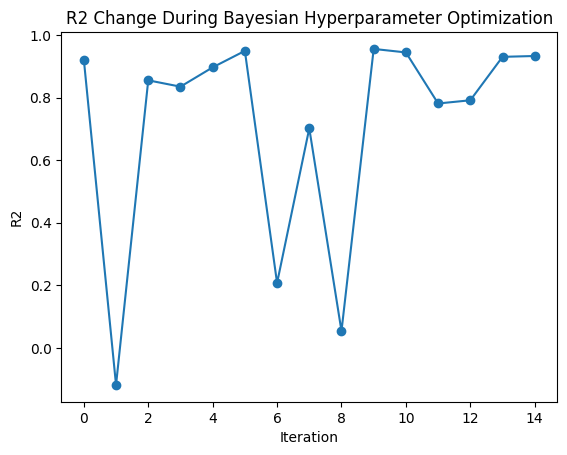

Original Dataset - RMSE: 0.6513971816964924, R2: 0.9995634726070717, MAE: 0.4737312222500438
External Dataset - RMSE: 24.31975746154785, R2: 0.3915312918386695, MAE: 17.01934242248535


In [61]:
# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


GAN

Best parameters: [671, 6.176761533672798e-10, 0.00010063396049315316, 0.5254814681008275, 8.918326627754476e-06]


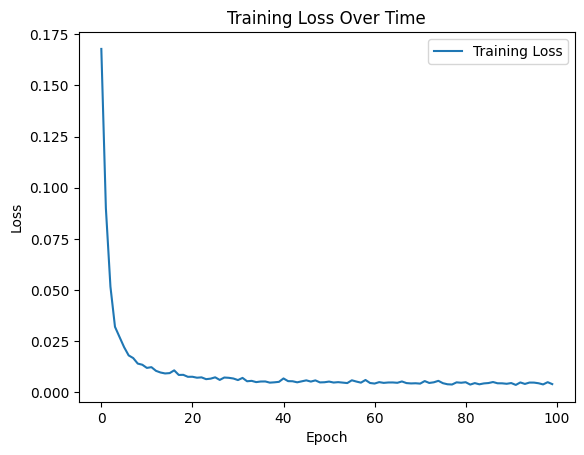

Task Train RMSE: 0.9267486333847046, Train R2: 0.9955047253651186, Train MAE: 0.7681647539138794
Task Test RMSE: 0.6715216636657715, Test R2: 0.9947321406515911, Test MAE: 0.548915684223175
Task Train RMSE: 0.8995019793510437, Train R2: 0.9947512545158876, Train MAE: 0.7502928972244263
Task Test RMSE: 0.8062126040458679, Test R2: 0.9972683640071301, Test MAE: 0.6204034686088562
Task Train RMSE: 0.8781973719596863, Train R2: 0.9953000539977046, Train MAE: 0.7227638363838196
Task Test RMSE: 0.8952493071556091, Test R2: 0.995744388242402, Test MAE: 0.7305194139480591
Task Train RMSE: 0.8586099743843079, Train R2: 0.9961394633883474, Train MAE: 0.7000634670257568
Task Test RMSE: 0.968271017074585, Test R2: 0.9896278318864951, Test MAE: 0.8213205337524414
Task Train RMSE: 0.842606246471405, Train R2: 0.9953958597245189, Train MAE: 0.6802898645401001
Task Test RMSE: 1.0229631662368774, Test R2: 0.9947719862032478, Test MAE: 0.9004155993461609
Task Train RMSE: 0.976597249507904, Train R2: 0.9

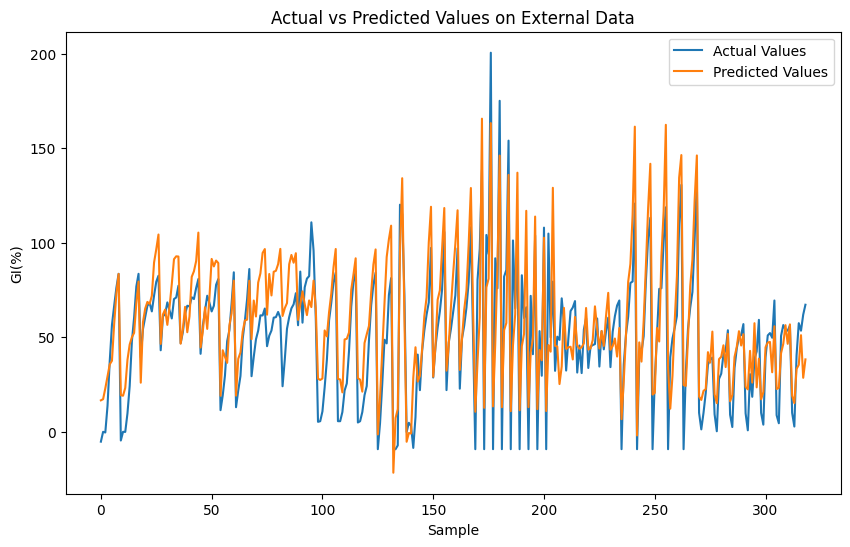

External Dataset - RMSE: 18.998537063598633, R2: 0.6829726810843857, MAE: 15.424728393554688


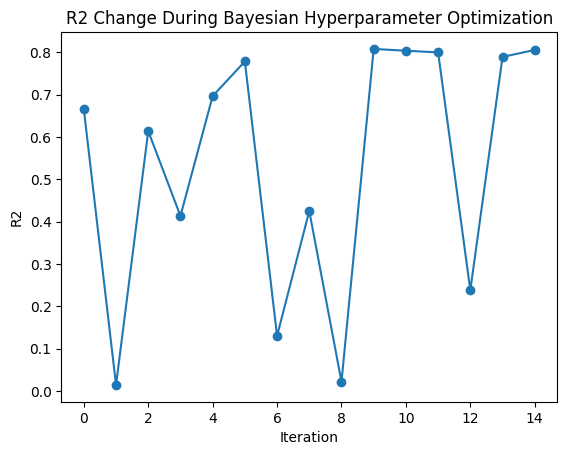

Original Dataset - RMSE: 1.3543937077111157, R2: 0.9983888118717211, MAE: 0.8678221111149462
External Dataset - RMSE: 18.998537063598633, R2: 0.6829726832463618, MAE: 15.424728393554688


In [31]:
import torch
from torch import nn, optim
import torch.nn.functional as F
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import learn2learn as l2l
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

# 设置随机种子
np.random.seed(0)
torch.manual_seed(0)

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)

# 元学习模型定义
class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# 其他辅助函数和类（如EarlyStopping, create_tasks等）根据需要添加
# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# GAN的生成器定义
class Generator(nn.Module):
    def __init__(self, input_size, hidden_dim, output_size):
        super(Generator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim * 4)
        self.fc4 = nn.Linear(hidden_dim * 4, output_size)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.tanh(self.fc4(x))
        return x

# GAN的判别器定义
class Discriminator(nn.Module):
    def __init__(self, input_size, hidden_dim):
        super(Discriminator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim * 4)
        self.fc2 = nn.Linear(hidden_dim * 4, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim)
        self.fc4 = nn.Linear(hidden_dim, 1)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.sigmoid(self.fc4(x))
        return x

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2

# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae



# 加载和规范化数据
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)1-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_data(data[['GI(%)']].values)
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)1-2.csv")

# 设置GAN训练参数
z_dim = 800  # 潜在空间的维度
gen_hidden_dim = 1000
dis_hidden_dim = 1000
lr = 0.01
batch_size = 1000
num_epochs = 1000

# 初始化模型
generator = Generator(z_dim, gen_hidden_dim, data_normalized.shape[1]).to(device)
discriminator = Discriminator(data_normalized.shape[1], dis_hidden_dim).to(device)

# 优化器
optim_g = optim.Adam(generator.parameters(), lr=lr)
optim_d = optim.Adam(discriminator.parameters(), lr=lr)

tensor_data = torch.Tensor(data_normalized)
data_loader = DataLoader(tensor_data, batch_size=batch_size, shuffle=True)

# GAN训练循环
for epoch in range(num_epochs):
    for batch in data_loader:
        current_batch_size = len(batch)  # Get the actual batch size
        real_data = batch.to(device)
        real_labels = torch.ones(current_batch_size, 1).to(device)  # Adjust label size based on batch
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Generate fake data based on current batch size
        fake_labels = torch.zeros(current_batch_size, 1).to(device)  # Adjust fake label size

        # 训练判别器
        optim_d.zero_grad()
        real_output = discriminator(real_data)
        fake_output = discriminator(fake_data)
        d_loss_real = nn.BCEWithLogitsLoss()(real_output, real_labels)
        d_loss_fake = nn.BCEWithLogitsLoss()(fake_output, fake_labels)
        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optim_d.step()

        # 训练生成器
        optim_g.zero_grad()
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Regenerate fake data
        fake_output = discriminator(fake_data)
        g_loss = nn.BCEWithLogitsLoss()(fake_output, real_labels)  # Use real_labels here
        g_loss.backward()
        optim_g.step()

# 假设您想生成一定数量的新样本
number_of_generated_samples = 500

# 生成新的数据样本
generated_samples = []
for _ in range(number_of_generated_samples):
    z = torch.randn(1, z_dim).to(device)
    generated_sample = generator(z).detach().cpu().numpy()
    generated_samples.append(generated_sample.reshape(-1))

generated_samples = np.array(generated_samples)

# 将生成的样本合并到现有数据中
extended_data = np.vstack([data_normalized, generated_samples])

# 创建增强的数据集任务
# 这里假设您已经定义了创建任务的函数
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(extended_data, columns=data.columns), target_column='GI(%)')
# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")
# Load and process external data for evaluation

external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


Best parameters: [671, 6.176761533672798e-10, 0.00010063396049315316, 0.5254814681008275, 8.918326627754476e-06]


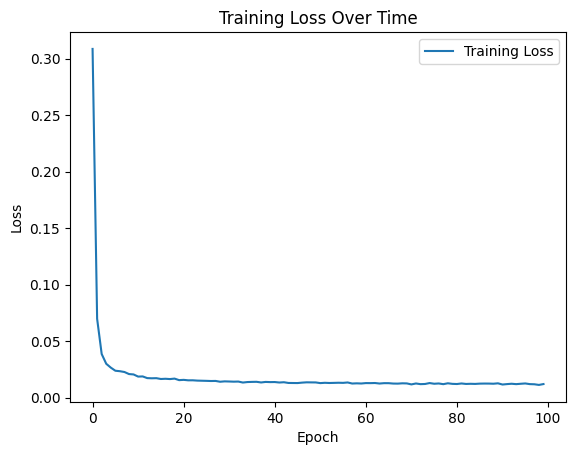

Task Train RMSE: 0.388726145029068, Train R2: 0.9992804665027447, Train MAE: 0.33151063323020935
Task Test RMSE: 0.3061387836933136, Test R2: 0.9987116109617639, Test MAE: 0.2822786271572113
Task Train RMSE: 0.3345341086387634, Train R2: 0.9994497231594706, Train MAE: 0.29883337020874023
Task Test RMSE: 0.500500500202179, Test R2: 0.9975071030649574, Test MAE: 0.41298770904541016
Task Train RMSE: 0.353005975484848, Train R2: 0.9991431788251798, Train MAE: 0.30949655175209045
Task Test RMSE: 0.4468776285648346, Test R2: 0.9994006507145967, Test MAE: 0.3703346252441406
Task Train RMSE: 0.3950424790382385, Train R2: 0.9989556198712146, Train MAE: 0.3344325125217438
Task Test RMSE: 0.271880179643631, Test R2: 0.9997661955612197, Test MAE: 0.2705911695957184
Task Train RMSE: 0.39301425218582153, Train R2: 0.9992523241585234, Train MAE: 0.3340481221675873
Task Test RMSE: 0.2833941876888275, Test R2: 0.999094143921389, Test MAE: 0.2721286714076996
Task Train RMSE: 0.4702671468257904, Train R2

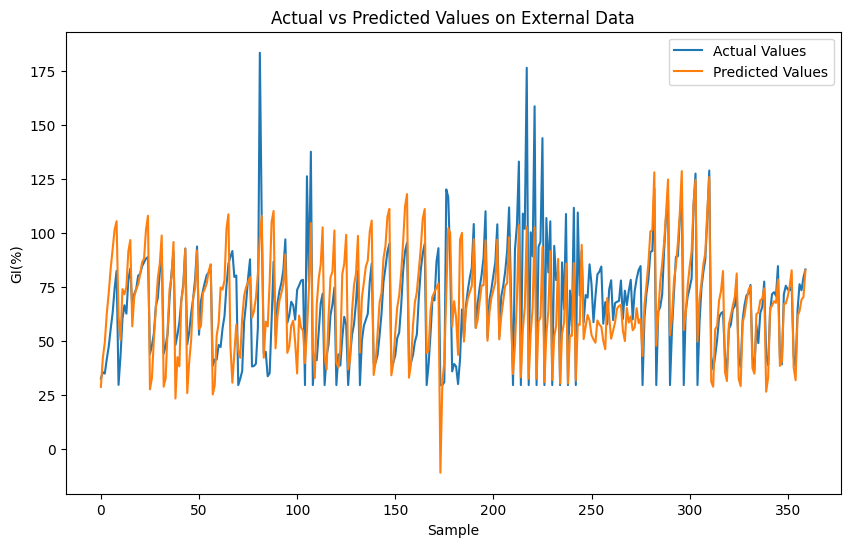

External Dataset - RMSE: 18.813182830810547, R2: 0.432153256884263, MAE: 13.667680740356445


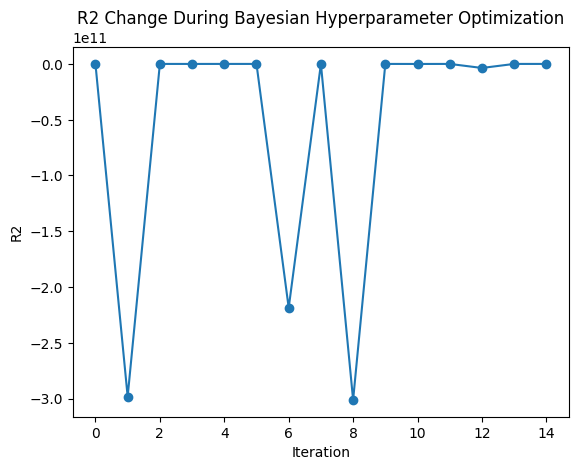

Original Dataset - RMSE: 0.8063571141720457, R2: 0.998956814781348, MAE: 0.6167450623303423
External Dataset - RMSE: 18.813182830810547, R2: 0.4321532498865249, MAE: 13.667680740356445


In [35]:
import torch
from torch import nn, optim
import torch.nn.functional as F
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import learn2learn as l2l
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

# 设置随机种子
np.random.seed(0)
torch.manual_seed(0)

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)

# 元学习模型定义
class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# 其他辅助函数和类（如EarlyStopping, create_tasks等）根据需要添加
# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# GAN的生成器定义
class Generator(nn.Module):
    def __init__(self, input_size, hidden_dim, output_size):
        super(Generator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim * 4)
        self.fc4 = nn.Linear(hidden_dim * 4, output_size)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.tanh(self.fc4(x))
        return x

# GAN的判别器定义
class Discriminator(nn.Module):
    def __init__(self, input_size, hidden_dim):
        super(Discriminator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim * 4)
        self.fc2 = nn.Linear(hidden_dim * 4, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim)
        self.fc4 = nn.Linear(hidden_dim, 1)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.sigmoid(self.fc4(x))
        return x

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2

# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae



# 加载和规范化数据
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)2-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_data(data[['GI(%)']].values)
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)2-2.csv")

# 设置GAN训练参数
z_dim = 500  # 潜在空间的维度
gen_hidden_dim = 500
dis_hidden_dim = 500
lr = 0.005
batch_size = 500
num_epochs = 500


# 初始化模型
generator = Generator(z_dim, gen_hidden_dim, data_normalized.shape[1]).to(device)
discriminator = Discriminator(data_normalized.shape[1], dis_hidden_dim).to(device)

# 优化器
optim_g = optim.Adam(generator.parameters(), lr=lr)
optim_d = optim.Adam(discriminator.parameters(), lr=lr)

tensor_data = torch.Tensor(data_normalized)
data_loader = DataLoader(tensor_data, batch_size=batch_size, shuffle=True)

# GAN训练循环
for epoch in range(num_epochs):
    for batch in data_loader:
        current_batch_size = len(batch)  # Get the actual batch size
        real_data = batch.to(device)
        real_labels = torch.ones(current_batch_size, 1).to(device)  # Adjust label size based on batch
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Generate fake data based on current batch size
        fake_labels = torch.zeros(current_batch_size, 1).to(device)  # Adjust fake label size

        # 训练判别器
        optim_d.zero_grad()
        real_output = discriminator(real_data)
        fake_output = discriminator(fake_data)
        d_loss_real = nn.BCEWithLogitsLoss()(real_output, real_labels)
        d_loss_fake = nn.BCEWithLogitsLoss()(fake_output, fake_labels)
        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optim_d.step()

        # 训练生成器
        optim_g.zero_grad()
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Regenerate fake data
        fake_output = discriminator(fake_data)
        g_loss = nn.BCEWithLogitsLoss()(fake_output, real_labels)  # Use real_labels here
        g_loss.backward()
        optim_g.step()

# 假设您想生成一定数量的新样本
number_of_generated_samples = 500

# 生成新的数据样本
generated_samples = []
for _ in range(number_of_generated_samples):
    z = torch.randn(1, z_dim).to(device)
    generated_sample = generator(z).detach().cpu().numpy()
    generated_samples.append(generated_sample.reshape(-1))

generated_samples = np.array(generated_samples)

# 将生成的样本合并到现有数据中
extended_data = np.vstack([data_normalized, generated_samples])

# 创建增强的数据集任务
# 这里假设您已经定义了创建任务的函数
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(extended_data, columns=data.columns), target_column='GI(%)')
# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")
# Load and process external data for evaluation

external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


Best parameters: [1312, 2.5112263624837018e-09, 3.725110709391406e-06, 0.6852551344761645, 1.057735212605256e-05]


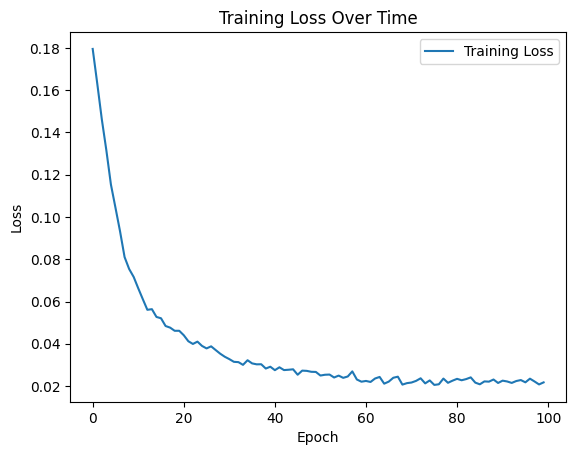

Task Train RMSE: 4.626244068145752, Train R2: 0.931976085952489, Train MAE: 2.4383082389831543
Task Test RMSE: 10.757538795471191, Test R2: 0.8994761420429845, Test MAE: 4.0088791847229
Task Train RMSE: 6.060785293579102, Train R2: 0.9274667449883024, Train MAE: 2.5723657608032227
Task Test RMSE: 7.375683307647705, Test R2: 0.8757791521592965, Test MAE: 3.4726486206054688
Task Train RMSE: 6.790287971496582, Train R2: 0.9155642227153664, Train MAE: 2.8235552310943604
Task Test RMSE: 4.111098766326904, Test R2: 0.9352744825593708, Test MAE: 2.4678921699523926
Task Train RMSE: 6.93449592590332, Train R2: 0.9106408522223836, Train MAE: 2.9034831523895264
Task Test RMSE: 2.9973742961883545, Test R2: 0.969890024897501, Test MAE: 2.148179531097412
Task Train RMSE: 7.000191688537598, Train R2: 0.912516180683147, Train MAE: 3.024400234222412
Task Test RMSE: 2.3070387840270996, Test R2: 0.9768245502167304, Test MAE: 1.6645116806030273
Task Train RMSE: 3.768251419067383, Train R2: 0.9331388877787

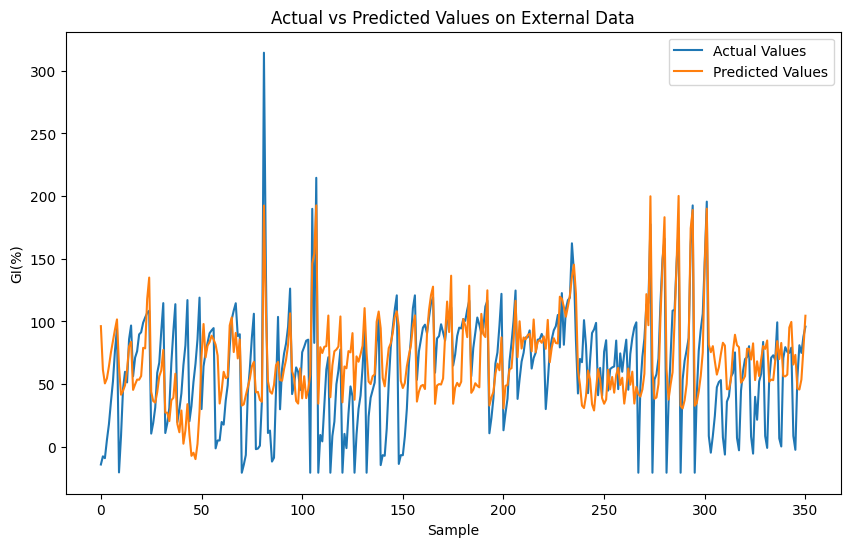

External Dataset - RMSE: 38.22246551513672, R2: 0.2992297193724466, MAE: 29.62751007080078


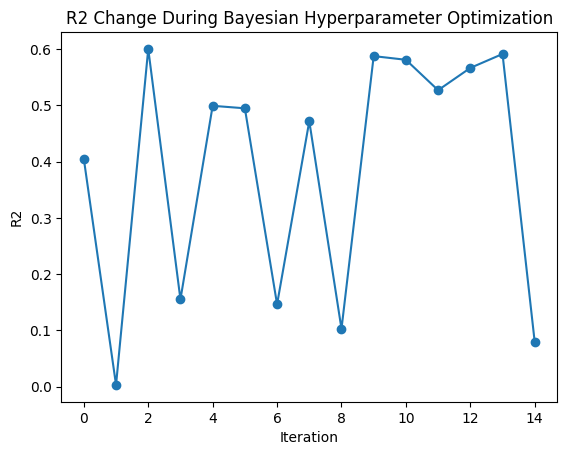

Original Dataset - RMSE: 13.271427410696502, R2: 0.9155161802159921, MAE: 8.778953569806967
External Dataset - RMSE: 38.22246551513672, R2: 0.299229718886982, MAE: 29.62751007080078


In [32]:
import torch
from torch import nn, optim
import torch.nn.functional as F
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import learn2learn as l2l
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

# 设置随机种子
np.random.seed(0)
torch.manual_seed(0)

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)

# 元学习模型定义
class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# 其他辅助函数和类（如EarlyStopping, create_tasks等）根据需要添加
# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# GAN的生成器定义
class Generator(nn.Module):
    def __init__(self, input_size, hidden_dim, output_size):
        super(Generator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim * 4)
        self.fc4 = nn.Linear(hidden_dim * 4, output_size)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.tanh(self.fc4(x))
        return x

# GAN的判别器定义
class Discriminator(nn.Module):
    def __init__(self, input_size, hidden_dim):
        super(Discriminator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim * 4)
        self.fc2 = nn.Linear(hidden_dim * 4, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim)
        self.fc4 = nn.Linear(hidden_dim, 1)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.sigmoid(self.fc4(x))
        return x

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2

# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae



# 加载和规范化数据
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)3-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_data(data[['GI(%)']].values)
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)3-2.csv")

# 设置GAN训练参数
z_dim = 800  # 潜在空间的维度
gen_hidden_dim = 1000
dis_hidden_dim = 1000
lr = 0.01
batch_size = 1000
num_epochs = 1000

# 初始化模型
generator = Generator(z_dim, gen_hidden_dim, data_normalized.shape[1]).to(device)
discriminator = Discriminator(data_normalized.shape[1], dis_hidden_dim).to(device)

# 优化器
optim_g = optim.Adam(generator.parameters(), lr=lr)
optim_d = optim.Adam(discriminator.parameters(), lr=lr)

tensor_data = torch.Tensor(data_normalized)
data_loader = DataLoader(tensor_data, batch_size=batch_size, shuffle=True)

# GAN训练循环
for epoch in range(num_epochs):
    for batch in data_loader:
        current_batch_size = len(batch)  # Get the actual batch size
        real_data = batch.to(device)
        real_labels = torch.ones(current_batch_size, 1).to(device)  # Adjust label size based on batch
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Generate fake data based on current batch size
        fake_labels = torch.zeros(current_batch_size, 1).to(device)  # Adjust fake label size

        # 训练判别器
        optim_d.zero_grad()
        real_output = discriminator(real_data)
        fake_output = discriminator(fake_data)
        d_loss_real = nn.BCEWithLogitsLoss()(real_output, real_labels)
        d_loss_fake = nn.BCEWithLogitsLoss()(fake_output, fake_labels)
        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optim_d.step()

        # 训练生成器
        optim_g.zero_grad()
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Regenerate fake data
        fake_output = discriminator(fake_data)
        g_loss = nn.BCEWithLogitsLoss()(fake_output, real_labels)  # Use real_labels here
        g_loss.backward()
        optim_g.step()

# 假设您想生成一定数量的新样本
number_of_generated_samples = 500

# 生成新的数据样本
generated_samples = []
for _ in range(number_of_generated_samples):
    z = torch.randn(1, z_dim).to(device)
    generated_sample = generator(z).detach().cpu().numpy()
    generated_samples.append(generated_sample.reshape(-1))

generated_samples = np.array(generated_samples)

# 将生成的样本合并到现有数据中
extended_data = np.vstack([data_normalized, generated_samples])

# 创建增强的数据集任务
# 这里假设您已经定义了创建任务的函数
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(extended_data, columns=data.columns), target_column='GI(%)')
# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")
# Load and process external data for evaluation

external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


Best parameters: [780, 6.083143740465881e-09, 1.0578151078965425e-05, 0.7122465001379218, 0.00014995717720808153]


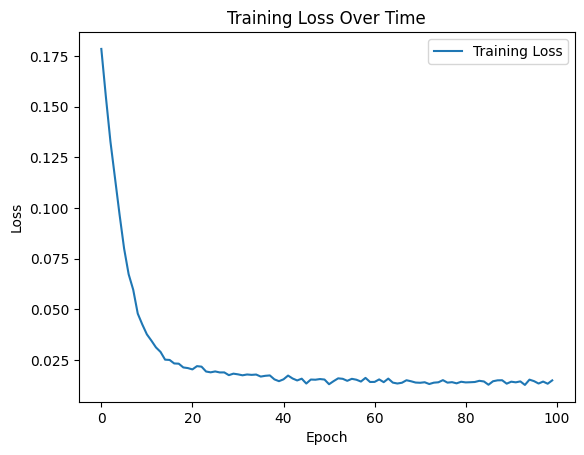

Task Train RMSE: 3.311084508895874, Train R2: 0.9585433453981388, Train MAE: 1.6214969158172607
Task Test RMSE: 1.327754020690918, Test R2: 0.9846828370227886, Test MAE: 1.1564527750015259
Task Train RMSE: 3.28608775138855, Train R2: 0.9409535320030258, Train MAE: 1.655722975730896
Task Test RMSE: 1.5564571619033813, Test R2: 0.9947061170108086, Test MAE: 1.0195491313934326
Task Train RMSE: 2.749912977218628, Train R2: 0.9729420145020974, Train MAE: 1.3450340032577515
Task Test RMSE: 3.920199394226074, Test R2: 0.7895371796180323, Test MAE: 2.2623050212860107
Task Train RMSE: 2.873108386993408, Train R2: 0.95247304984974, Train MAE: 1.5475744009017944
Task Test RMSE: 3.54923152923584, Test R2: 0.9718563527413381, Test MAE: 1.4521427154541016
Task Train RMSE: 2.8350706100463867, Train R2: 0.9719854771788057, Train MAE: 1.4726126194000244
Task Test RMSE: 3.669543743133545, Test R2: 0.673911558797275, Test MAE: 1.7519909143447876
Task Train RMSE: 2.6089584827423096, Train R2: 0.9650322043

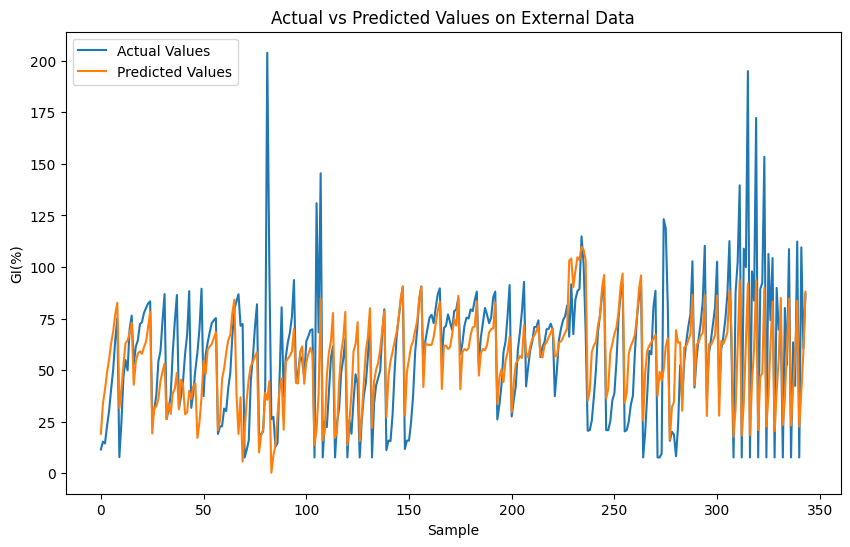

External Dataset - RMSE: 24.89539337158203, R2: 0.3623861363546168, MAE: 16.79651641845703


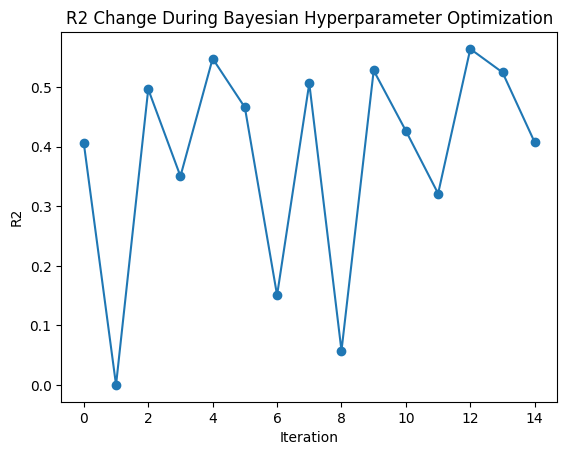

Original Dataset - RMSE: 5.4037444809418105, R2: 0.9699593475250788, MAE: 4.145776004388694
External Dataset - RMSE: 24.89539337158203, R2: 0.36238613259288166, MAE: 16.79651641845703


In [33]:
import torch
from torch import nn, optim
import torch.nn.functional as F
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import learn2learn as l2l
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, TensorDataset

# 设置随机种子
np.random.seed(0)
torch.manual_seed(0)

device = torch.device("cuda:0")  # Use GPU 0

# Hyperparameter search space
search_space = [
    Integer(500, 1500, name='hidden_size'), 
    Real(1e-11, 1e-6, "log-uniform", name='alpha'),  
    Real(1e-7, 1e-3, "log-uniform", name='beta'),
    Real(0.1, 0.8, name='dropout_rate'), 
    Real(1e-7, 1e-1, "log-uniform", name='weight_decay') 
]

# Data normalization and denormalization functions
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

def normalize_feature(data, column_name):
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[[column_name]])
    return scaled_data, scaler

def denormalize_data(normalized_data, scaler):
    return scaler.inverse_transform(normalized_data)

# 元学习模型定义
class AdvancedNeuralNetwork(nn.Module):
    def __init__(self, input_size, hidden_size, dropout_rate):
        super(AdvancedNeuralNetwork, self).__init__()
        self.layer1 = nn.Linear(input_size, hidden_size)
        self.relu1 = nn.LeakyReLU()
        self.layer2 = nn.Linear(hidden_size, hidden_size // 2)
        self.relu2 = nn.LeakyReLU()
        self.layer3 = nn.Linear(hidden_size // 2, hidden_size // 4)
        self.relu3 = nn.LeakyReLU()
        self.dropout = nn.Dropout(dropout_rate)
        self.layer4 = nn.Linear(hidden_size // 4, 1)

    def forward(self, x):
        x = self.relu1(self.layer1(x))
        x = self.relu2(self.layer2(x))
        x = self.relu3(self.layer3(x))
        x = self.dropout(x)
        x = self.layer4(x)
        return x

# 其他辅助函数和类（如EarlyStopping, create_tasks等）根据需要添加
# Task creation function
def create_tasks(data, target_column, num_tasks=50, task_size=100):
    tasks = []
    for _ in range(num_tasks):
        task_data = data.sample(task_size)
        X, y = task_data.drop(target_column, axis=1), task_data[target_column]
        tasks.append((X, y))
    return tasks

# Early stopping class
class EarlyStopping:
    def __init__(self, patience=5, delta=0):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss, model):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

# GAN的生成器定义
class Generator(nn.Module):
    def __init__(self, input_size, hidden_dim, output_size):
        super(Generator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim * 4)
        self.fc4 = nn.Linear(hidden_dim * 4, output_size)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.tanh(self.fc4(x))
        return x

# GAN的判别器定义
class Discriminator(nn.Module):
    def __init__(self, input_size, hidden_dim):
        super(Discriminator, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_dim * 4)
        self.fc2 = nn.Linear(hidden_dim * 4, hidden_dim * 2)
        self.fc3 = nn.Linear(hidden_dim * 2, hidden_dim)
        self.fc4 = nn.Linear(hidden_dim, 1)

    def forward(self, x):
        x = F.leaky_relu(self.fc1(x), 0.2)
        x = F.leaky_relu(self.fc2(x), 0.2)
        x = F.leaky_relu(self.fc3(x), 0.2)
        x = torch.sigmoid(self.fc4(x))
        return x

# MAML fast adaptation and meta-training
def meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100, num_steps=1):
    early_stopping = EarlyStopping(patience=10, delta=0.01)
    optimizer = optim.Adam(model.parameters(), lr=beta, weight_decay=weight_decay)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

    epoch_loss_list = []  # Initialize a list to store losses for each epoch

    for epoch in range(epochs):
        epoch_losses = []
        for task in tasks:
            learner = model.clone()  # Clone the model
            task_X, task_y = task
            task_X = torch.from_numpy(task_X.values).float().to(device)
            task_y = torch.from_numpy(task_y.values).float().to(device)

            # Fast adaptation
            for step in range(num_steps):
                pred_y = learner(task_X)
                loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
                learner.adapt(loss)

            # Meta-update
            optimizer.zero_grad()
            pred_y = learner(task_X)
            loss = nn.functional.mse_loss(pred_y.squeeze(), task_y)
            epoch_losses.append(loss.item())
            loss.backward()
            optimizer.step()

        scheduler.step()  # Update learning rate
        average_loss = np.mean(epoch_losses)
        epoch_loss_list.append(average_loss)  # Add each epoch's average loss to the list

        if early_stopping(average_loss, model):
            print(f"Early stopping triggered at epoch {epoch}")
            break

    return epoch_loss_list  # Return the list of epoch losses



@use_named_args(search_space)
def objective(hidden_size, alpha, beta, dropout_rate, weight_decay):
    model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
    model = l2l.algorithms.MAML(model, lr=alpha).to(device)
    avg_r2 = 0

    task_r2_list = []  # 记录每个任务的 R2

    for task in tasks:
        task_X, task_y = task
        task_X_train, task_X_test, task_y_train, task_y_test = train_test_split(task_X, task_y, test_size=0.2, random_state=0)
        meta_train_maml(model, [(task_X_train, task_y_train)], alpha, beta, weight_decay, epochs=100)
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, task_X_train, task_y_train, task_X_test, task_y_test, target_scaler)
        task_r2_list.append(test_r2)  # 记录每个任务的测试 R2
        avg_r2 += test_r2

    avg_r2 /= len(tasks)
    return -avg_r2  # 这里返回负数因为 skopt 的目标函数是最小化，而我们想要最大化 R2

# Evaluation function
def evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler):
    model.eval()
    with torch.no_grad():
        # Convert data to tensors
        X_train_tensor = torch.from_numpy(X_train.values).float().to(device)
        y_train_tensor = torch.from_numpy(y_train.values).float().to(device)
        X_test_tensor = torch.from_numpy(X_test.values).float().to(device)
        y_test_tensor = torch.from_numpy(y_test.values).float().to(device)

        # Get predictions
        train_predictions = model(X_train_tensor).squeeze().cpu().numpy()
        test_predictions = model(X_test_tensor).squeeze().cpu().numpy()

        # Reshape predictions for denormalization
        train_predictions_reshaped = train_predictions.reshape(-1, 1)
        test_predictions_reshaped = test_predictions.reshape(-1, 1)

        # Denormalize predictions using target_scaler
        train_predictions_denorm = denormalize_data(train_predictions_reshaped, target_scaler)
        test_predictions_denorm = denormalize_data(test_predictions_reshaped, target_scaler)

        # Denormalize actual values using target_scaler
        y_train_denorm = denormalize_data(y_train_tensor.cpu().numpy().reshape(-1, 1), target_scaler)
        y_test_denorm = denormalize_data(y_test_tensor.cpu().numpy().reshape(-1, 1), target_scaler)

        # Calculate metrics using denormalized data
        train_rmse = mean_squared_error(y_train_denorm, train_predictions_denorm, squared=False)
        train_r2 = r2_score(y_train_denorm, train_predictions_denorm)
        train_mae = mean_absolute_error(y_train_denorm, train_predictions_denorm)

        test_rmse = mean_squared_error(y_test_denorm, test_predictions_denorm, squared=False)
        test_r2 = r2_score(y_test_denorm, test_predictions_denorm)
        test_mae = mean_absolute_error(y_test_denorm, test_predictions_denorm)

    return train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae



# 加载和规范化数据
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)4-1.csv")
data_normalized, scaler = normalize_data(data)
target_normalized, target_scaler = normalize_data(data[['GI(%)']].values)
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)4-2.csv")

# 设置GAN训练参数
z_dim = 800  # 潜在空间的维度
gen_hidden_dim = 1000
dis_hidden_dim = 1000
lr = 0.01
batch_size = 1000
num_epochs = 1000

# 初始化模型
generator = Generator(z_dim, gen_hidden_dim, data_normalized.shape[1]).to(device)
discriminator = Discriminator(data_normalized.shape[1], dis_hidden_dim).to(device)

# 优化器
optim_g = optim.Adam(generator.parameters(), lr=lr)
optim_d = optim.Adam(discriminator.parameters(), lr=lr)

tensor_data = torch.Tensor(data_normalized)
data_loader = DataLoader(tensor_data, batch_size=batch_size, shuffle=True)

# GAN训练循环
for epoch in range(num_epochs):
    for batch in data_loader:
        current_batch_size = len(batch)  # Get the actual batch size
        real_data = batch.to(device)
        real_labels = torch.ones(current_batch_size, 1).to(device)  # Adjust label size based on batch
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Generate fake data based on current batch size
        fake_labels = torch.zeros(current_batch_size, 1).to(device)  # Adjust fake label size

        # 训练判别器
        optim_d.zero_grad()
        real_output = discriminator(real_data)
        fake_output = discriminator(fake_data)
        d_loss_real = nn.BCEWithLogitsLoss()(real_output, real_labels)
        d_loss_fake = nn.BCEWithLogitsLoss()(fake_output, fake_labels)
        d_loss = d_loss_real + d_loss_fake
        d_loss.backward()
        optim_d.step()

        # 训练生成器
        optim_g.zero_grad()
        fake_data = generator(torch.randn(current_batch_size, z_dim).to(device))  # Regenerate fake data
        fake_output = discriminator(fake_data)
        g_loss = nn.BCEWithLogitsLoss()(fake_output, real_labels)  # Use real_labels here
        g_loss.backward()
        optim_g.step()

# 假设您想生成一定数量的新样本
number_of_generated_samples = 500

# 生成新的数据样本
generated_samples = []
for _ in range(number_of_generated_samples):
    z = torch.randn(1, z_dim).to(device)
    generated_sample = generator(z).detach().cpu().numpy()
    generated_samples.append(generated_sample.reshape(-1))

generated_samples = np.array(generated_samples)

# 将生成的样本合并到现有数据中
extended_data = np.vstack([data_normalized, generated_samples])

# 创建增强的数据集任务
# 这里假设您已经定义了创建任务的函数
input_size = data.shape[1] - 1 
tasks = create_tasks(pd.DataFrame(extended_data, columns=data.columns), target_column='GI(%)')
# Execute hyperparameter optimization
result = gp_minimize(objective, search_space, n_calls=15,random_state=0)
hidden_size, alpha, beta, dropout_rate, weight_decay = result.x
print("Best parameters:", result.x)

# Train model with optimized hyperparameters
model = AdvancedNeuralNetwork(input_size, hidden_size, dropout_rate)
model = l2l.algorithms.MAML(model, lr=alpha).to(device)
train_losses = meta_train_maml(model, tasks, alpha, beta, weight_decay, epochs=100)

# Visualize training losses
plt.plot(train_losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss Over Time')
plt.legend()
plt.show()

# Final model evaluation
for task in tasks:
    X, y = task
    kf = KFold(n_splits=5, shuffle=True, random_state=0)
    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]
        train_rmse, train_r2, train_mae, test_rmse, test_r2, test_mae = evaluate_model(model, X_train, y_train, X_test, y_test, target_scaler)
        print(f"Task Train RMSE: {train_rmse}, Train R2: {train_r2}, Train MAE: {train_mae}")
        print(f"Task Test RMSE: {test_rmse}, Test R2: {test_r2}, Test MAE: {test_mae}")
# Load and process external data for evaluation

external_data_normalized, _ = normalize_data(external_data)
external_target_normalized, _ = normalize_feature(external_data, 'GI(%)')
external_X = torch.from_numpy(pd.DataFrame(external_data_normalized, columns=external_data.columns).drop('GI(%)', axis=1).values).float().to(device)
external_y_normalized = torch.from_numpy(external_target_normalized).float().to(device)

# Model prediction on external data
learner = model.clone()  # Clone the model for evaluation
learner.eval()
with torch.no_grad():
    external_predictions_normalized = learner(external_X).squeeze()
external_predictions = denormalize_data(external_predictions_normalized.cpu().numpy().reshape(-1, 1), target_scaler)
external_y = denormalize_data(external_y_normalized.cpu().numpy().reshape(-1, 1), target_scaler)

# Visualization of predictions on external data
plt.figure(figsize=(10, 6))
plt.plot(external_y, label='Actual Values')
plt.plot(external_predictions, label='Predicted Values')
plt.xlabel('Sample')
plt.ylabel('GI(%)')
plt.title('Actual vs Predicted Values on External Data')
plt.legend()
plt.show()

# Evaluate on external dataset using denormalized data
external_rmse = mean_squared_error(external_y, external_predictions, squared=False)
external_r2 = r2_score(external_y, external_predictions)
external_mae = mean_absolute_error(external_y, external_predictions)

print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

# 提取每次迭代的最佳 R2
best_r2_list = []
for res in result.func_vals:
    best_r2_list.append(-res)  # 注意要取负数

# 绘制 R2 的变化过程图
plt.plot(best_r2_list, marker='o')
plt.xlabel('Iteration')
plt.ylabel('R2')
plt.title('R2 Change During Bayesian Hyperparameter Optimization')
plt.show()

import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split

# Assuming 'data' and 'external_data' are defined earlier in your code
target_column = 'GI(%)'

# Split features and target variable
X = data.drop(target_column, axis=1)
y = data[target_column]
X_external = external_data.drop(target_column, axis=1)
y_external = external_data[target_column]

# Normalize data
X_normalized, feature_scaler = normalize_data(X)
y_normalized, target_scaler = normalize_data(y.values.reshape(-1, 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_normalized, y_normalized, test_size=0.2, random_state=0)

# Convert to PyTorch tensors
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
X_train_tensor = torch.tensor(X_train).float().to(device)
X_test_tensor = torch.tensor(X_test).float().to(device)
y_train_tensor = torch.tensor(y_train).float().to(device)
y_test_tensor = torch.tensor(y_test).float().to(device)

# Normalize external data set
X_external_normalized, _ = normalize_data(X_external)
y_external_normalized, _ = normalize_data(y_external.values.reshape(-1, 1))

# Convert external data to tensors
X_external_tensor = torch.tensor(X_external_normalized).float().to(device)
y_external_tensor = torch.tensor(y_external_normalized).float().to(device)

# Batch processing for model prediction to manage GPU memory usage
def model_predict(model, X_tensor, batch_size=32):
    model.eval()
    predictions = []
    with torch.no_grad():
        for i in range(0, len(X_tensor), batch_size):
            batch_X = X_tensor[i:i+batch_size]
            batch_pred = model(batch_X).cpu().numpy()
            predictions.append(batch_pred)
    return np.concatenate(predictions).flatten()

# Assuming 'model' is defined and trained in your code
y_pred_train = model_predict(model, X_train_tensor, batch_size=32)
y_pred_test = model_predict(model, X_test_tensor, batch_size=32)
y_pred_external = model_predict(model, X_external_tensor, batch_size=32)

# Denormalize predictions and actual values
y_pred_train_denorm = denormalize_data(y_pred_train.reshape(-1, 1), target_scaler)
y_pred_test_denorm = denormalize_data(y_pred_test.reshape(-1, 1), target_scaler)
y_pred_external_denorm = denormalize_data(y_pred_external.reshape(-1, 1), target_scaler)
y_train_denorm = denormalize_data(y_train, target_scaler)
y_test_denorm = denormalize_data(y_test, target_scaler)
y_external_denorm = denormalize_data(y_external_tensor.cpu().numpy(), target_scaler)
# Flatten arrays to ensure they are 1-dimensional
y_pred_train_denorm = y_pred_train_denorm.flatten()
y_pred_test_denorm = y_pred_test_denorm.flatten()
y_pred_external_denorm = y_pred_external_denorm.flatten()
y_train_denorm = y_train_denorm.flatten()
y_test_denorm = y_test_denorm.flatten()
y_external_denorm = y_external_denorm.flatten()

# Combine original and external datasets' actual and predicted values
original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])
external_data_actual = y_external_denorm
external_data_predicted = y_pred_external_denorm

# Create DataFrame
combined_df = pd.DataFrame({
    'Actual': np.concatenate([original_data_actual, external_data_actual]),
    'Predicted': np.concatenate([original_data_predicted, external_data_predicted]),
    'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(external_data_actual)
})

# Compute metrics for original dataset
train_r2 = r2_score(original_data_actual, original_data_predicted)
train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

# Compute metrics for external dataset
external_r2 = r2_score(external_data_actual, external_data_predicted)
external_rmse = mean_squared_error(external_data_actual, external_data_predicted, squared=False)
external_mae = mean_absolute_error(external_data_actual, external_data_predicted)

print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")


传统机器学习算法

1.三部分样本用于训练

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from skopt import BayesSearchCV
from skopt.space import Integer
import matplotlib.pyplot as plt
# Load datasets
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP1-1.csv")
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP1-2.csv")

# Normalization function
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

# Normalize datasets
data_normalized, scaler = normalize_data(data)
external_data_normalized, _ = normalize_data(external_data)

# Split the dataset into features and target
X = data_normalized[:, :-1]
y = data_normalized[:, -1]
X_external = external_data_normalized[:, :-1]
y_external = external_data_normalized[:, -1]

# Fit a scaler for the features
feature_scaler = StandardScaler()
X_normalized = feature_scaler.fit_transform(data.drop('GI(%)', axis=1))

# Fit a separate scaler for the target
target_scaler = StandardScaler()
y_normalized = target_scaler.fit_transform(data[['GI(%)']])


# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Define the hyperparameter space
param_grid = {'n_neighbors': Integer(1, 30)}

# Bayesian optimization
knn_search = BayesSearchCV(KNeighborsRegressor(), param_grid, n_iter=32, cv=5, n_jobs=-1, random_state=0)
knn_search.fit(X_train, y_train)

# Best model
knn_best = knn_search.best_estimator_

# Function to evaluate the model
def evaluate_model(model, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    y_pred_external = model.predict(X_external)

    # Denormalize target values and predictions
    y_train_denorm = target_scaler.inverse_transform(y_train.reshape(-1, 1)).flatten()
    y_test_denorm = target_scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
    y_external_denorm = target_scaler.inverse_transform(y_external.reshape(-1, 1)).flatten()
    y_pred_train_denorm = target_scaler.inverse_transform(y_pred_train.reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(y_pred_test.reshape(-1, 1)).flatten()
    y_pred_external_denorm = target_scaler.inverse_transform(y_pred_external.reshape(-1, 1)).flatten()

    # Metrics for train and test sets
    train_rmse = mean_squared_error(y_train_denorm, y_pred_train_denorm, squared=False)
    test_rmse = mean_squared_error(y_test_denorm, y_pred_test_denorm, squared=False)
    train_r2 = r2_score(y_train_denorm, y_pred_train_denorm)
    test_r2 = r2_score(y_test_denorm, y_pred_test_denorm)
    train_mae = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
    test_mae = mean_absolute_error(y_test_denorm, y_pred_test_denorm)

    # Metrics for external set
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)

    # Text for metrics
    metrics_text = f"RMSE: {external_rmse:.5f}\nR2: {external_r2:.5f}\nMAE: {external_mae:.5f}"

    # Create DataFrame for seaborn joint plot
    external_pred_df = pd.DataFrame({
        'Actual Values': y_external_denorm, 
        'Predicted Values': y_pred_external_denorm
    })

    # Print metrics
    print(f"Model: {model.__class__.__name__}")
    print("Train RMSE:", train_rmse, "Train R2:", train_r2, "Train MAE:", train_mae)
    print("Test RMSE:", test_rmse, "Test R2:", test_r2, "Test MAE:", test_mae)
    print("External RMSE:", external_rmse, "External R2:", external_r2, "External MAE:", external_mae)
    print("--------------------------------------------------")

    # 评估模型并获取训练集和测试集的预测值
    y_pred_train_denorm = target_scaler.inverse_transform(model.predict(X_train).reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(model.predict(X_test).reshape(-1, 1)).flatten()

    # 合并训练集和测试集的数据
    original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
    original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])

    # 创建包含原始数据集和外部数据集的 DataFrame
    combined_df = pd.DataFrame({
        'Actual': np.concatenate([original_data_actual, y_external_denorm]),
        'Predicted': np.concatenate([original_data_predicted, y_pred_external_denorm]),
        'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(y_external_denorm)
    })

    # 计算原始数据集的指标
    train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
    train_r2 = r2_score(original_data_actual, original_data_predicted)
    train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

    # 计算外部数据集的指标
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)

    print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
    print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

# Evaluate KNN model
evaluate_model(knn_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.svm import SVR
from skopt.space import Real

# Define the hyperparameter space for SVM
param_grid_svm = {
    'C': Real(1e-15, 1e+1, prior='log-uniform'),
    'gamma': Real(1e-15, 1e+1, prior='log-uniform'),
    'epsilon': Real(1e-15, 1e+1, prior='log-uniform')
}

# Bayesian optimization
svm_search = BayesSearchCV(SVR(), param_grid_svm, n_iter=32, cv=5, n_jobs=-1, random_state=0)
svm_search.fit(X_train, y_train)

# Best model
svm_best = svm_search.best_estimator_

# Evaluate SVM model
evaluate_model(svm_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.ensemble import RandomForestRegressor
from skopt.space import Integer, Real

# Define the hyperparameter space for Random Forest
param_grid_rf = {
    'n_estimators': Integer(100, 300),
    'max_depth': Integer(10, 50),
    'min_samples_split': Real(0.1, 1.0),
    'min_samples_leaf': Real(0.1, 0.5)
}

# Bayesian optimization
rf_search = BayesSearchCV(RandomForestRegressor(random_state=0), param_grid_rf, n_iter=32, cv=5, n_jobs=-1, random_state=0)
rf_search.fit(X_train, y_train)

# Best model
rf_best = rf_search.best_estimator_

# Evaluate Random Forest model
evaluate_model(rf_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import xgboost as xgb

# Define the hyperparameter space for XGBoost
param_grid_xgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
xgb_search = BayesSearchCV(xgb.XGBRegressor(), param_grid_xgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
xgb_search.fit(X_train, y_train)

# Best model
xgb_best = xgb_search.best_estimator_

# Evaluate XGBoost model
evaluate_model(xgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import lightgbm as lgb

# Define the hyperparameter space for LightGBM
param_grid_lgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(-1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'num_leaves': Integer(20, 300),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
lgb_search = BayesSearchCV(lgb.LGBMRegressor(), param_grid_lgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
lgb_search.fit(X_train, y_train)

# Best model
lgb_best = lgb_search.best_estimator_

# Evaluate LightGBM model
evaluate_model(lgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Model: KNeighborsRegressor
Train RMSE: 12.72636292548054 Train R2: 0.8881558366957734 Train MAE: 7.470316904534546
Test RMSE: 15.746484007168748 Test R2: 0.7283195606051411 Test MAE: 9.825838479570047
External RMSE: 24.03242362394962 External R2: 0.5692107579866512 External MAE: 18.761085950635664
--------------------------------------------------
Original Dataset - RMSE: 13.386881540999925, R2: 0.8663316619163408, MAE: 7.942790708829458
External Dataset - RMSE: 24.03242362394962, R2: 0.5692107579866512, MAE: 18.761085950635664


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Model: SVR
Train RMSE: 0.007998995523115664 Train R2: 0.9999999558149222 Train MAE: 0.006217759759148203
Test RMSE: 26.519857242352156 Test R2: 0.22939194918879224 Test MAE: 21.17568856025264
External RMSE: 36.6166160340677 External R2: -6.014461494707746e-05 External MAE: 27.0344006733853
--------------------------------------------------
Original Dataset - RMSE: 11.877268784278833, R2: 0.8947788904395366, MAE: 4.252419751718599
External Dataset - RMSE: 36.6166160340677, R2: -6.014461494707746e-05, MAE: 27.0344006733853


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Model: RandomForestRegressor
Train RMSE: 21.680429836316023 Train R2: 0.6754059959108287 Train MAE: 15.90614018812818
Test RMSE: 17.689645895831948 Test R2: 0.6571300240000764 Test MAE: 14.493383194064457
External RMSE: 23.729904442254643 External R2: 0.5799880118250788 External MAE: 19.274021578503348
--------------------------------------------------
Original Dataset - RMSE: 20.94101710352169, R2: 0.6729115184425135, MAE: 15.62276741897005
External Dataset - RMSE: 23.729904442254643, R2: 0.5799880118250788, MAE: 19.274021578503348
Model: XGBRegressor
Train RMSE: 0.01964315261231277 Train R2: 0.9999997335430219 Train MAE: 0.014675442201787854
Test RMSE: 14.312953490985304 Test R2: 0.7755344492640108 Test MAE: 9.480339708757777
External RMSE: 24.496808378601155 External R2: 0.5524014017985954 External MAE: 19.8245535928078
--------------------------------------------------
Original Dataset - RMSE: 6.4102684036883195, R2: 0.9693505887794678, MAE: 1.9133115886912164
External Dataset - RM

In [2]:
# 创建包含模型名称和其最优超参数的字典
model_hyperparams = {
    'KNN': knn_search.best_params_,
    'SVM': svm_search.best_params_,
    'RandomForest': rf_search.best_params_,
    'XGBoost': xgb_search.best_params_,
    'LightGBM': lgb_search.best_params_
}

# 转换为DataFrame
hyperparams_df = pd.DataFrame.from_dict(model_hyperparams, orient='index')

# 重置索引，使模型名称成为一列
hyperparams_df.reset_index(inplace=True)
hyperparams_df.rename(columns={'index': 'Model'}, inplace=True)

# 指定文件路径和名称，这里替换为你的目标路径
file_path = "C:\\Users\\Lenovo\\Desktop\\元学习\\传统模型超参数\\hyperparams_CP_1_1.csv"

# 保存为CSV文件
hyperparams_df.to_csv(file_path, index=False)

e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


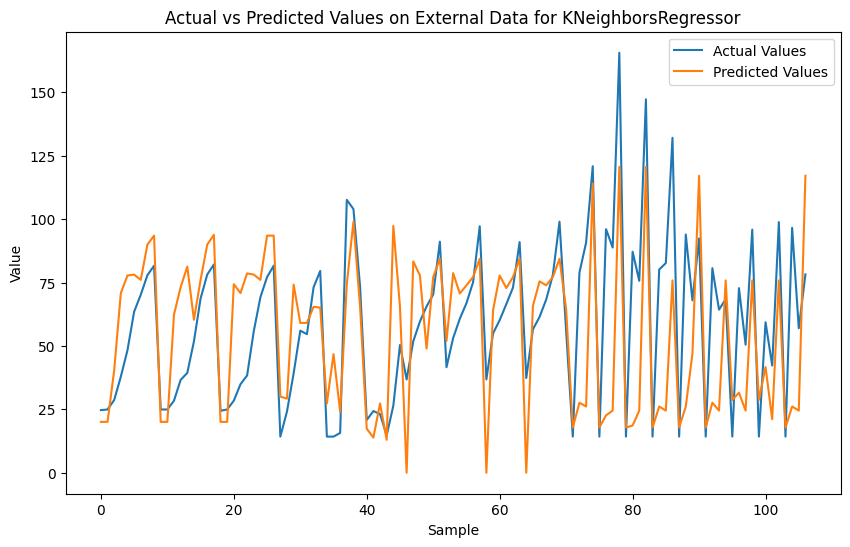

Model: KNeighborsRegressor
Train RMSE: 8.672677055575097 Train R2: 0.9279949316250541 Train MAE: 4.8917172675678575
Test RMSE: 13.072535812208185 Test R2: 0.7708938561297154 Test MAE: 7.7044754695422535
External RMSE: 28.85963905506603 External R2: 0.1557838941636468 External MAE: 21.52929569467798
--------------------------------------------------
Original Dataset - RMSE: 9.724637011769497, R2: 0.904144145691202, MAE: 5.460679752867521
External Dataset - RMSE: 28.85963905506603, R2: 0.1557838941636468, MAE: 21.52929569467798


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


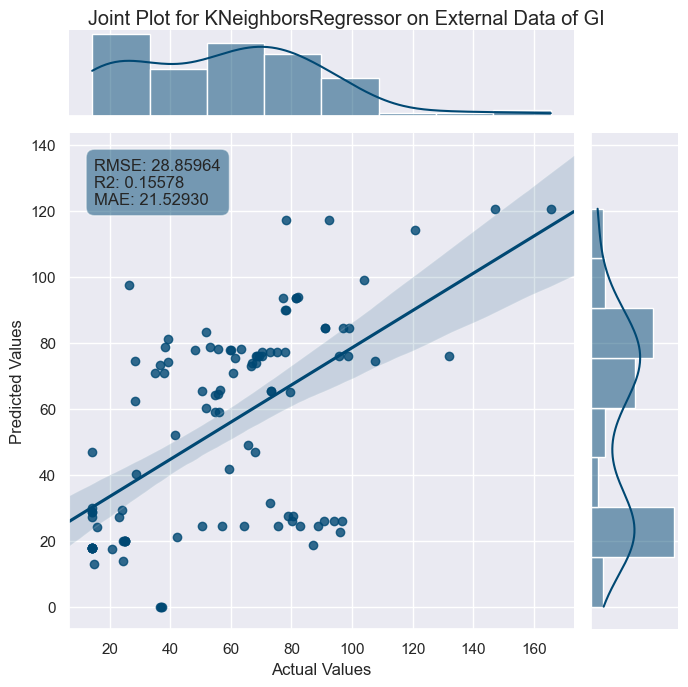

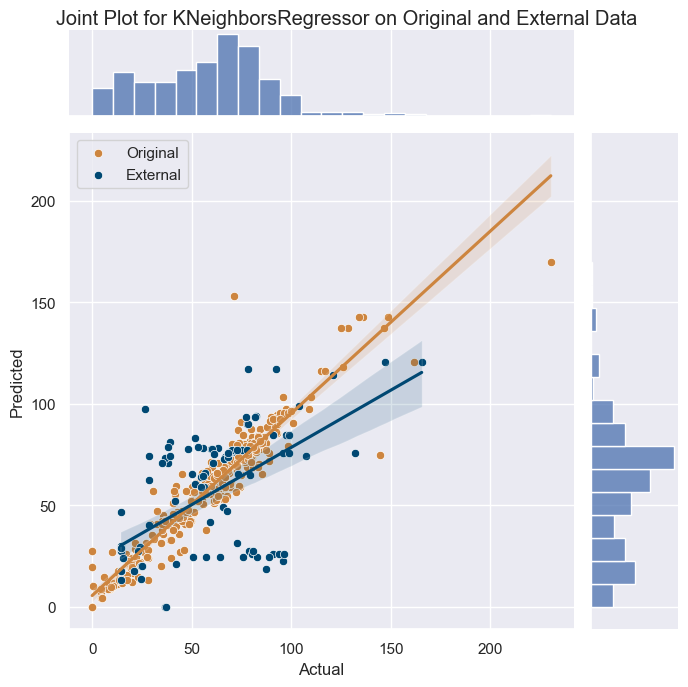

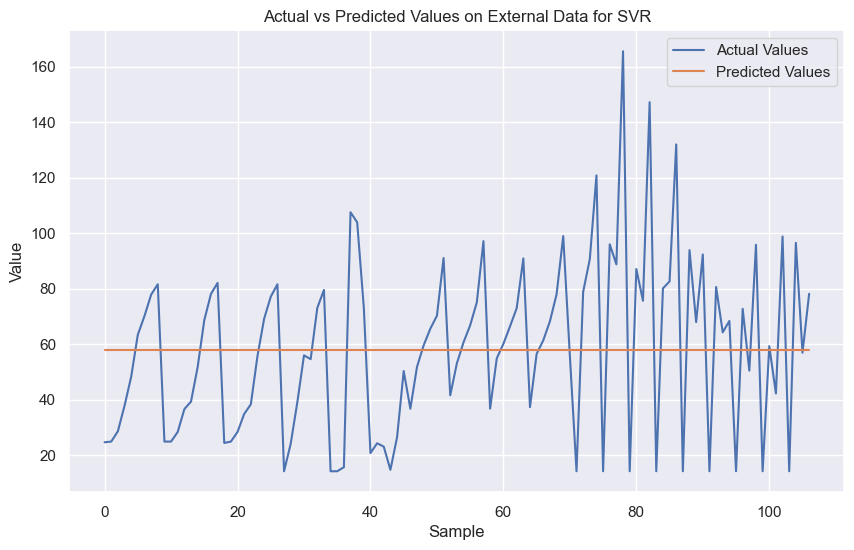

Model: SVR
Train RMSE: 0.009027957242556546 Train R2: 0.9999999219746538 Train MAE: 0.007890783224438458
Test RMSE: 25.790082312039626 Test R2: 0.10829231062576461 Test MAE: 20.2748067512148
External RMSE: 31.416876301869546 External R2: -0.0004556639176500621 External MAE: 25.613936793557183
--------------------------------------------------
Original Dataset - RMSE: 11.59921101589223, R2: 0.8636268909536089, MAE: 4.107466377889155
External Dataset - RMSE: 31.416876301869546, R2: -0.0004556639176500621, MAE: 25.613936793557183


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


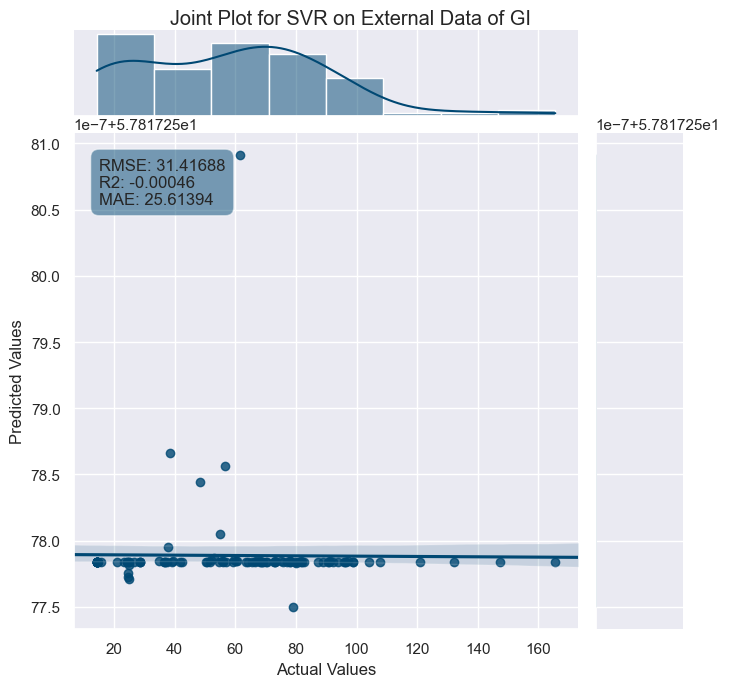

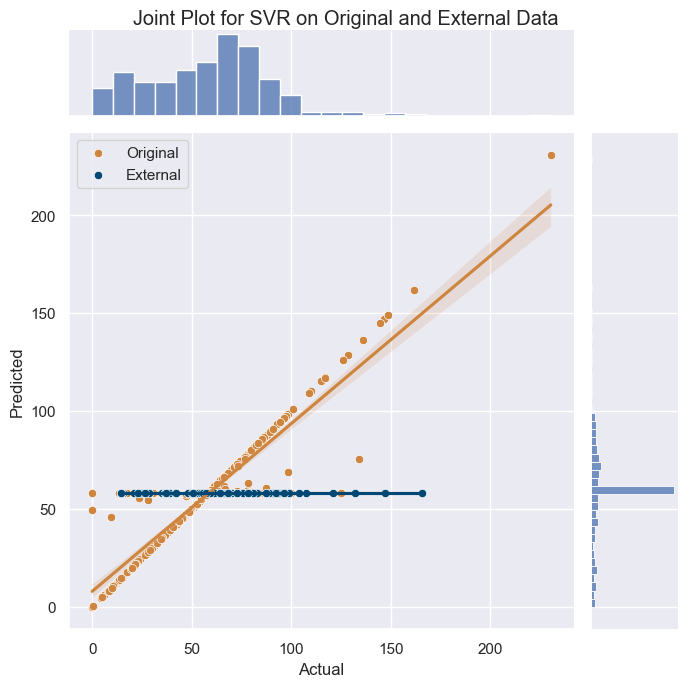

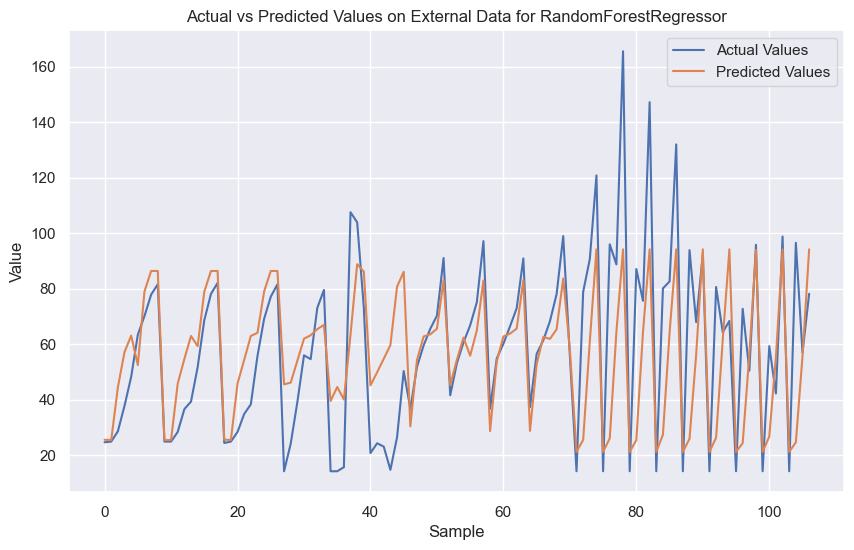

Model: RandomForestRegressor
Train RMSE: 18.80971101697677 Train R2: 0.6612955020790741 Train MAE: 12.150291007529718
Test RMSE: 15.615609319354771 Test R2: 0.6730849418572662 Test MAE: 12.869923079500657
External RMSE: 24.585035035609334 External R2: 0.38734849296758045 External MAE: 17.050266960201213
--------------------------------------------------
Original Dataset - RMSE: 18.20887193791636, R2: 0.6639236698552955, MAE: 12.29585760898253
External Dataset - RMSE: 24.585035035609334, R2: 0.38734849296758045, MAE: 17.050266960201213


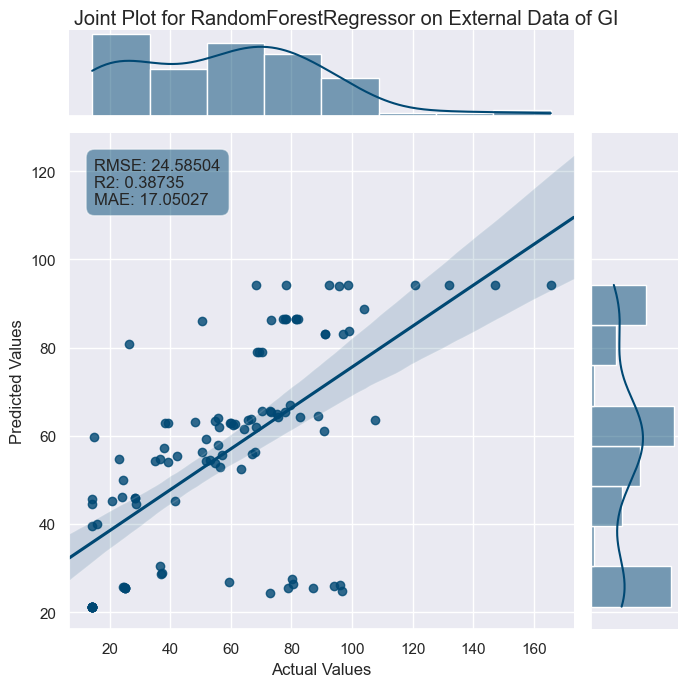

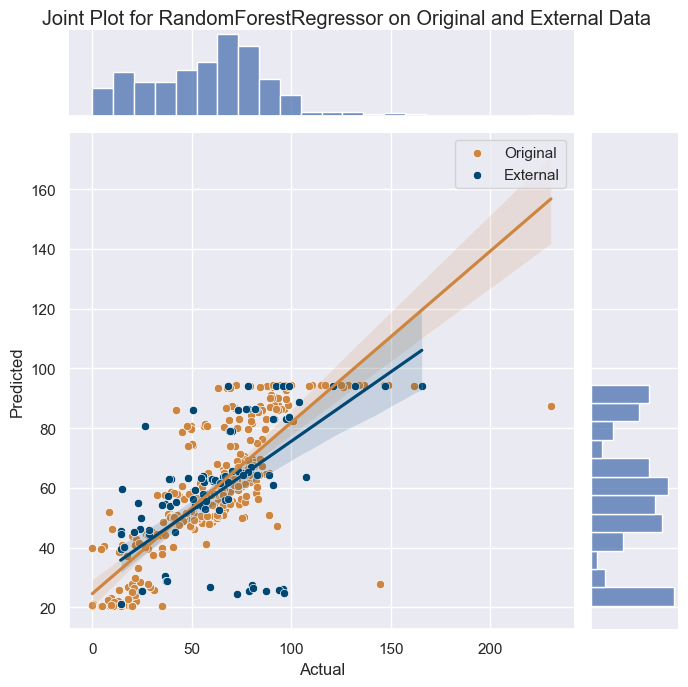

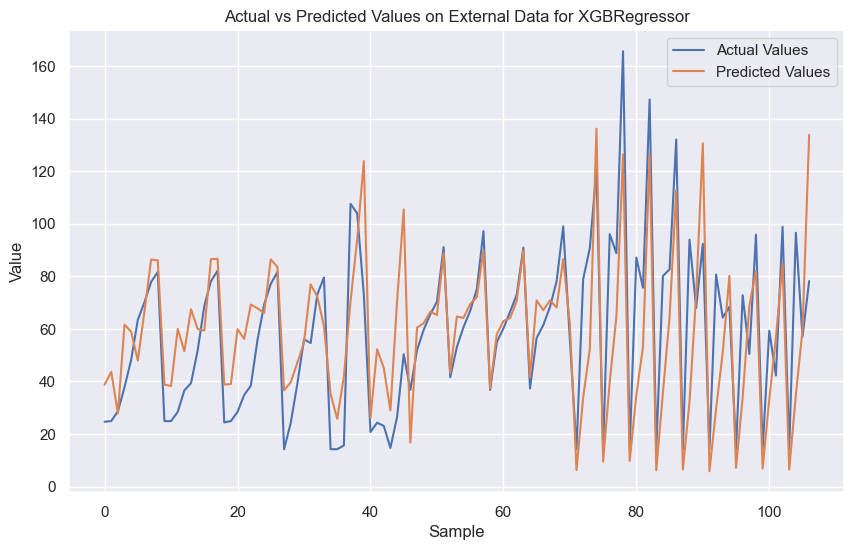

Model: XGBRegressor
Train RMSE: 0.01704312101162156 Train R2: 0.9999997219294648 Train MAE: 0.012394815918809738
Test RMSE: 12.040810574910571 Test R2: 0.8056303272324882 Test MAE: 9.09154761845743
External RMSE: 22.8852081511298 External R2: 0.4691380758675574 External MAE: 16.884103211238763
--------------------------------------------------
Original Dataset - RMSE: 5.415431365096533, R2: 0.970273898589988, MAE: 1.8489186021873056
External Dataset - RMSE: 22.8852081511298, R2: 0.4691380758675574, MAE: 16.884103211238763
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000084 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 823
[LightGBM] [Info] Number of data points in the train set: 280, number of used features: 11
[LightGBM] [Info] Start training from score -0.024855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

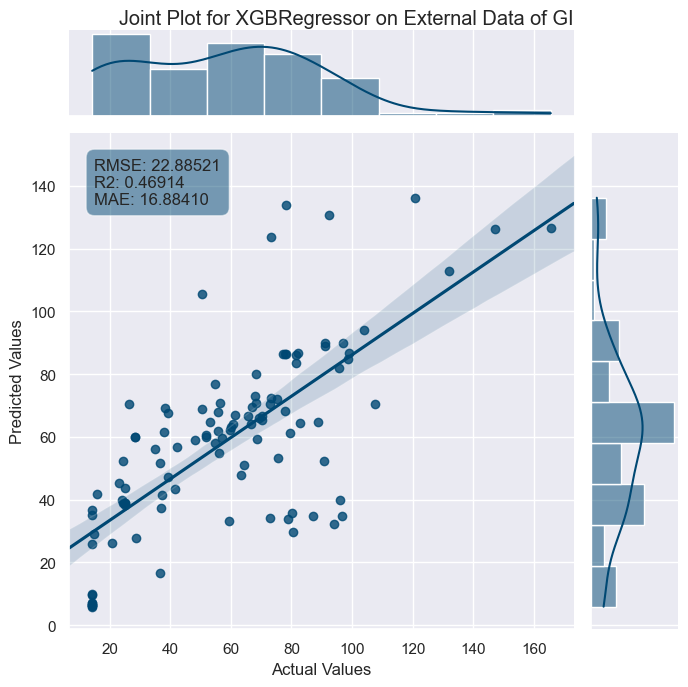

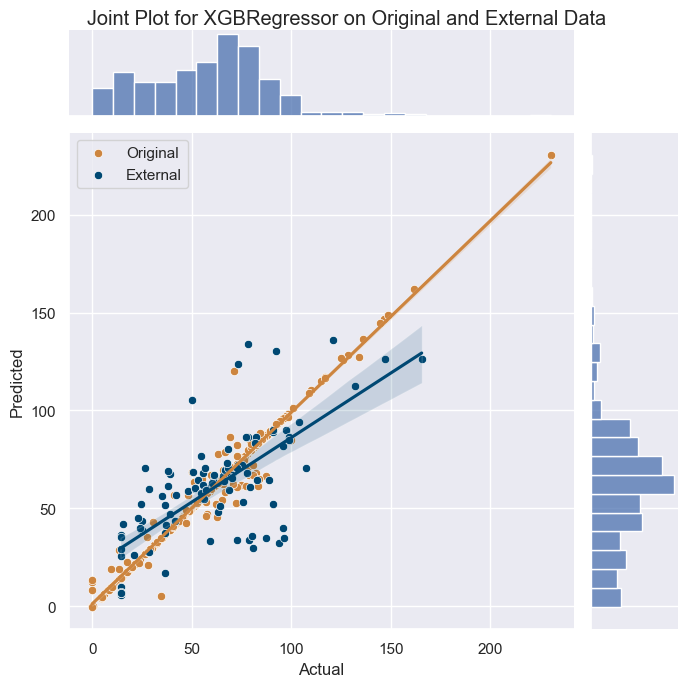

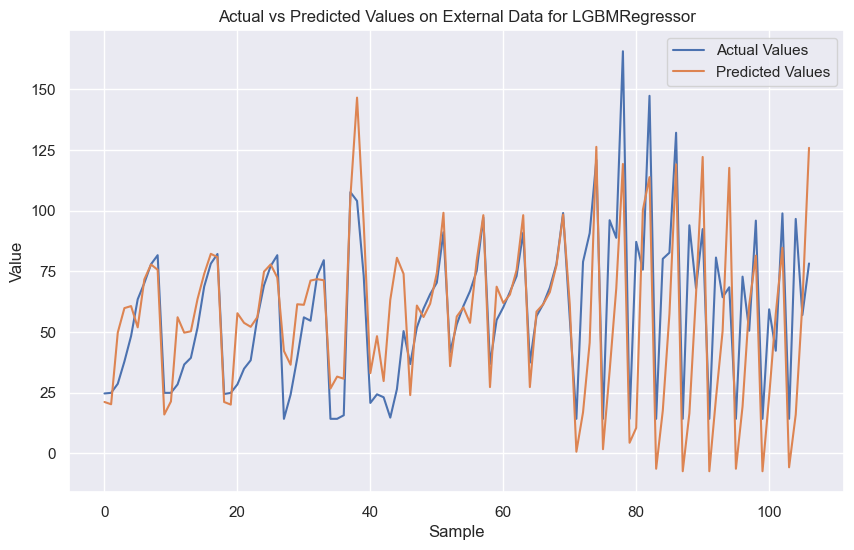

Model: LGBMRegressor
Train RMSE: 4.338613849119209 Train R2: 0.9819798370509379 Train MAE: 2.281264787938356
Test RMSE: 11.676715364495708 Test R2: 0.817207470436446 Test MAE: 9.062143420268901
External RMSE: 25.740045049611847 External R2: 0.3284312972734915 External MAE: 17.76660435367019
--------------------------------------------------
Original Dataset - RMSE: 6.5265495562859295, R2: 0.9568243262859112, MAE: 3.652895508438267
External Dataset - RMSE: 25.740045049611847, R2: 0.3284312972734915, MAE: 17.76660435367019


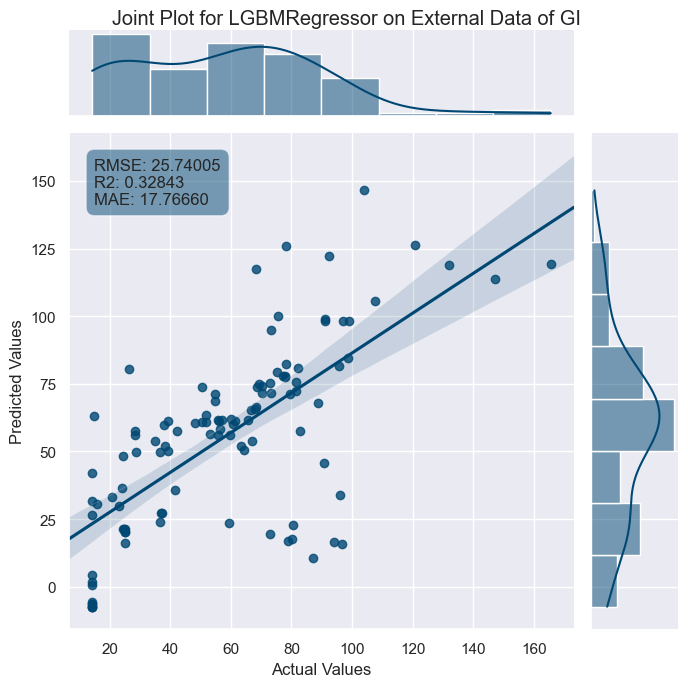

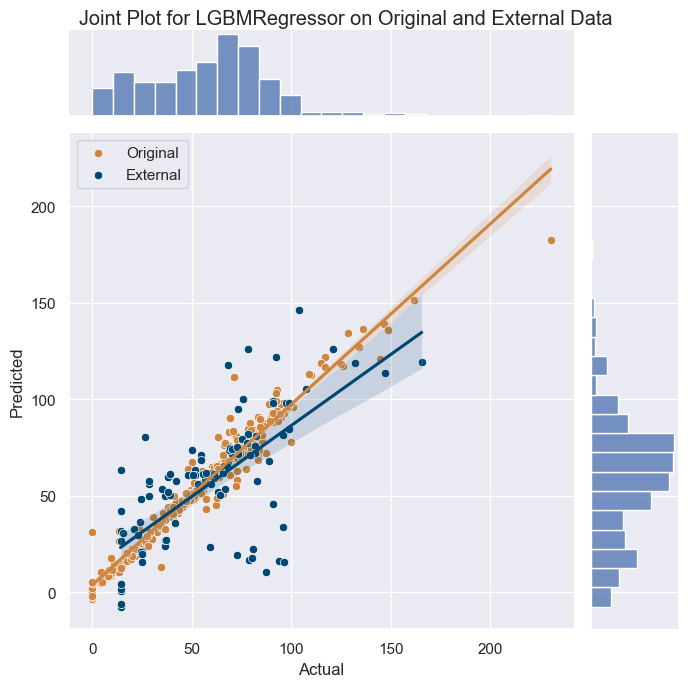

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from skopt import BayesSearchCV
from skopt.space import Integer
import matplotlib.pyplot as plt
# Load datasets
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP2-1.csv")
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP2-2.csv")

# Normalization function
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

# Normalize datasets
data_normalized, scaler = normalize_data(data)
external_data_normalized, _ = normalize_data(external_data)

# Split the dataset into features and target
X = data_normalized[:, :-1]
y = data_normalized[:, -1]
X_external = external_data_normalized[:, :-1]
y_external = external_data_normalized[:, -1]

# Fit a scaler for the features
feature_scaler = StandardScaler()
X_normalized = feature_scaler.fit_transform(data.drop('GI(%)', axis=1))

# Fit a separate scaler for the target
target_scaler = StandardScaler()
y_normalized = target_scaler.fit_transform(data[['GI(%)']])


# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Define the hyperparameter space
param_grid = {'n_neighbors': Integer(1, 30)}

# Bayesian optimization
knn_search = BayesSearchCV(KNeighborsRegressor(), param_grid, n_iter=32, cv=5, n_jobs=-1, random_state=0)
knn_search.fit(X_train, y_train)

# Best model
knn_best = knn_search.best_estimator_

# Function to evaluate the model
def evaluate_model(model, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    y_pred_external = model.predict(X_external)

    # Denormalize target values and predictions
    y_train_denorm = target_scaler.inverse_transform(y_train.reshape(-1, 1)).flatten()
    y_test_denorm = target_scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
    y_external_denorm = target_scaler.inverse_transform(y_external.reshape(-1, 1)).flatten()
    y_pred_train_denorm = target_scaler.inverse_transform(y_pred_train.reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(y_pred_test.reshape(-1, 1)).flatten()
    y_pred_external_denorm = target_scaler.inverse_transform(y_pred_external.reshape(-1, 1)).flatten()

    # Visualization of predictions on external data
    plt.figure(figsize=(10, 6))
    plt.plot(y_external_denorm, label='Actual Values')
    plt.plot(y_pred_external_denorm, label='Predicted Values')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.title(f'Actual vs Predicted Values on External Data for {model.__class__.__name__}')
    plt.legend()
    plt.show()

    # Metrics for train and test sets
    train_rmse = mean_squared_error(y_train_denorm, y_pred_train_denorm, squared=False)
    test_rmse = mean_squared_error(y_test_denorm, y_pred_test_denorm, squared=False)
    train_r2 = r2_score(y_train_denorm, y_pred_train_denorm)
    test_r2 = r2_score(y_test_denorm, y_pred_test_denorm)
    train_mae = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
    test_mae = mean_absolute_error(y_test_denorm, y_pred_test_denorm)

    # Metrics for external set
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)

    # Text for metrics
    metrics_text = f"RMSE: {external_rmse:.5f}\nR2: {external_r2:.5f}\nMAE: {external_mae:.5f}"

    # Create DataFrame for seaborn joint plot
    external_pred_df = pd.DataFrame({
        'Actual Values': y_external_denorm, 
        'Predicted Values': y_pred_external_denorm
    })

    # Set seaborn theme
    sns.set_theme(style="darkgrid")

    # Create the jointplot for external data with specified color
    g_external = sns.jointplot(x='Actual Values', y='Predicted Values', data=external_pred_df,
                               kind="reg", truncate=False,
                               color="#004873", height=7) 
    
    # Set title for the plot
    g_external.fig.suptitle(f"Joint Plot for {model.__class__.__name__} on External Data of GI")

    # Add metrics as text annotations
    plt.annotate(metrics_text, xy=(0.05, 0.95), xycoords='axes fraction', 
                 ha='left', va='top', bbox=dict(boxstyle='round,pad=0.5', fc="#004873", alpha=0.5))

    # Adjust layout
    g_external.fig.subplots_adjust(top=0.95)

    # Print metrics
    print(f"Model: {model.__class__.__name__}")
    print("Train RMSE:", train_rmse, "Train R2:", train_r2, "Train MAE:", train_mae)
    print("Test RMSE:", test_rmse, "Test R2:", test_r2, "Test MAE:", test_mae)
    print("External RMSE:", external_rmse, "External R2:", external_r2, "External MAE:", external_mae)
    print("--------------------------------------------------")

    # 评估模型并获取训练集和测试集的预测值
    y_pred_train_denorm = target_scaler.inverse_transform(model.predict(X_train).reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(model.predict(X_test).reshape(-1, 1)).flatten()

    # 合并训练集和测试集的数据
    original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
    original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])

    # 创建包含原始数据集和外部数据集的 DataFrame
    combined_df = pd.DataFrame({
        'Actual': np.concatenate([original_data_actual, y_external_denorm]),
        'Predicted': np.concatenate([original_data_predicted, y_pred_external_denorm]),
        'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(y_external_denorm)
    })

    # 创建基础 jointplot
    g_combined = sns.jointplot(x='Actual', y='Predicted', data=combined_df, kind="scatter", height=7)

    # 定义两个数据集的颜色
    colors = ['#CD853F', '#004873']

    # 为两个数据集添加不同颜色的散点图和线性回归线
    for dataset, color in zip(['Original', 'External'], colors):
        subset = combined_df[combined_df['Dataset'] == dataset]
        sns.scatterplot(x=subset['Actual'], y=subset['Predicted'], color=color, ax=g_combined.ax_joint, label=dataset)
        sns.regplot(x=subset['Actual'], y=subset['Predicted'], scatter=False, color=color, ax=g_combined.ax_joint)

    # 设置标题和布局
    g_combined.fig.suptitle(f"Joint Plot for {model.__class__.__name__} on Original and External Data")
    g_combined.fig.subplots_adjust(top=0.95)
    # 计算原始数据集的指标
    train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
    train_r2 = r2_score(original_data_actual, original_data_predicted)
    train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

    # 计算外部数据集的指标
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)


    print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
    print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

# Evaluate KNN model
evaluate_model(knn_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.svm import SVR
from skopt.space import Real


param_grid_svm = {
    'C': Real(1e-15, 1e+1, prior='log-uniform'),
    'gamma': Real(1e-15, 1e+1, prior='log-uniform'),
    'epsilon': Real(1e-15, 1e+1, prior='log-uniform')
}


# Bayesian optimization
svm_search = BayesSearchCV(SVR(), param_grid_svm, n_iter=32, cv=5, n_jobs=-1, random_state=0)
svm_search.fit(X_train, y_train)

# Best model
svm_best = svm_search.best_estimator_

# Evaluate SVM model
evaluate_model(svm_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.ensemble import RandomForestRegressor
from skopt.space import Integer, Real

# Define the hyperparameter space for Random Forest
param_grid_rf = {
    'n_estimators': Integer(100, 300),
    'max_depth': Integer(10, 50),
    'min_samples_split': Real(0.1, 1.0),
    'min_samples_leaf': Real(0.1, 0.5)
}

# Bayesian optimization
rf_search = BayesSearchCV(RandomForestRegressor(random_state=0), param_grid_rf, n_iter=32, cv=5, n_jobs=-1, random_state=0)
rf_search.fit(X_train, y_train)

# Best model
rf_best = rf_search.best_estimator_

# Evaluate Random Forest model
evaluate_model(rf_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import xgboost as xgb

# Define the hyperparameter space for XGBoost
param_grid_xgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
xgb_search = BayesSearchCV(xgb.XGBRegressor(), param_grid_xgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
xgb_search.fit(X_train, y_train)

# Best model
xgb_best = xgb_search.best_estimator_

# Evaluate XGBoost model
evaluate_model(xgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import lightgbm as lgb

# Define the hyperparameter space for LightGBM
param_grid_lgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(-1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'num_leaves': Integer(20, 300),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
lgb_search = BayesSearchCV(lgb.LGBMRegressor(), param_grid_lgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
lgb_search.fit(X_train, y_train)

# Best model
lgb_best = lgb_search.best_estimator_

# Evaluate LightGBM model
evaluate_model(lgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

In [4]:
# 创建包含模型名称和其最优超参数的字典
model_hyperparams = {
    'KNN': knn_search.best_params_,
    'SVM': svm_search.best_params_,
    'RandomForest': rf_search.best_params_,
    'XGBoost': xgb_search.best_params_,
    'LightGBM': lgb_search.best_params_
}

# 转换为DataFrame
hyperparams_df = pd.DataFrame.from_dict(model_hyperparams, orient='index')

# 重置索引，使模型名称成为一列
hyperparams_df.reset_index(inplace=True)
hyperparams_df.rename(columns={'index': 'Model'}, inplace=True)

# 指定文件路径和名称，这里替换为你的目标路径
file_path = "C:\\Users\\Lenovo\\Desktop\\元学习\\传统模型超参数\\hyperparams_CP_1_2.csv"

# 保存为CSV文件
hyperparams_df.to_csv(file_path, index=False)

e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


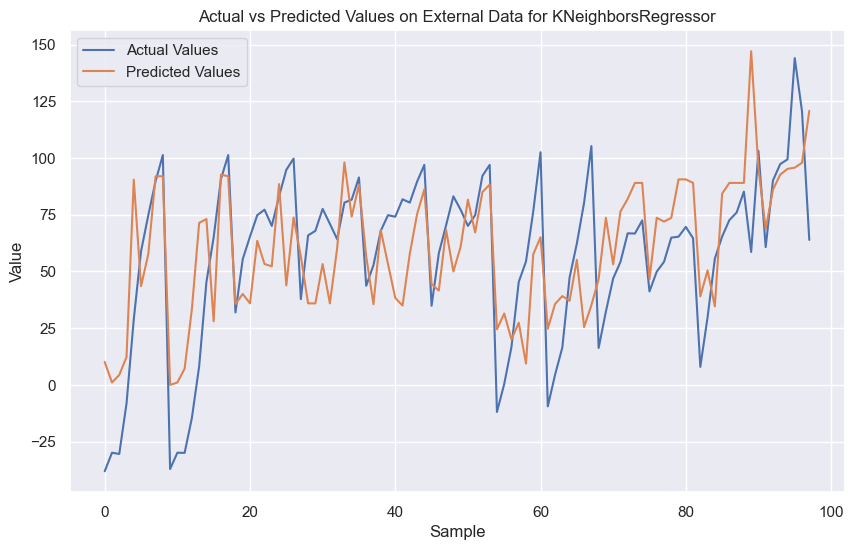

Model: KNeighborsRegressor
Train RMSE: 9.233454796308884 Train R2: 0.9398894663357291 Train MAE: 5.324790086317709
Test RMSE: 15.660061929605112 Test R2: 0.8076911384820962 Test MAE: 9.648633397374999
External RMSE: 28.489571364486235 External R2: 0.4185769222038417 External MAE: 23.01436220235246
--------------------------------------------------
Original Dataset - RMSE: 10.828335878988845, R2: 0.9160068493370799, MAE: 6.189558748529166
External Dataset - RMSE: 28.489571364486235, R2: 0.4185769222038417, MAE: 23.01436220235246


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


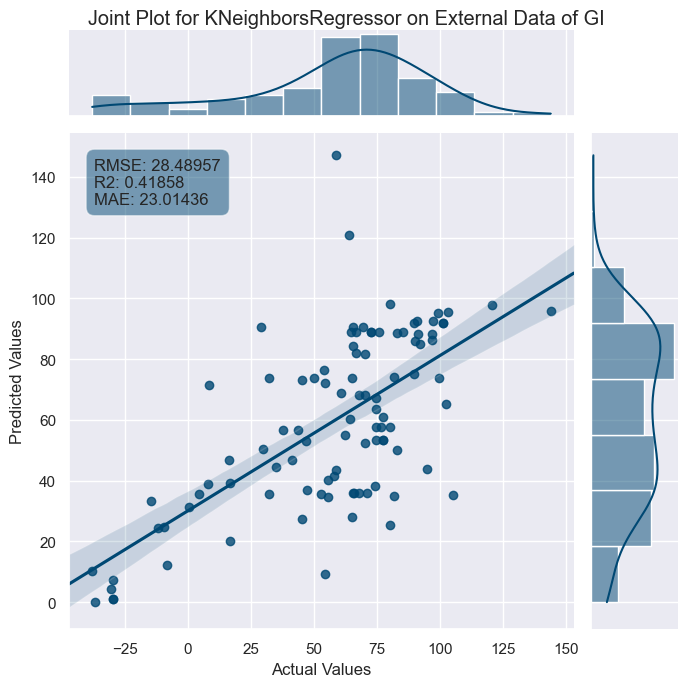

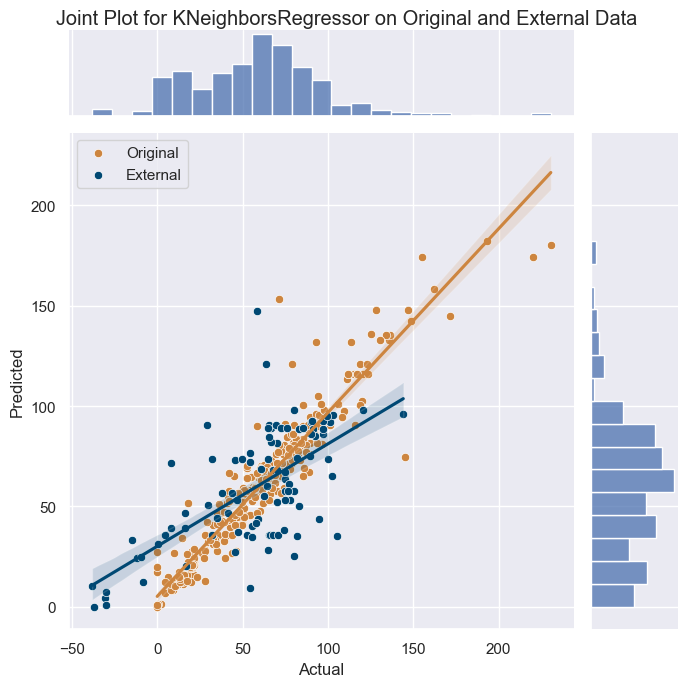

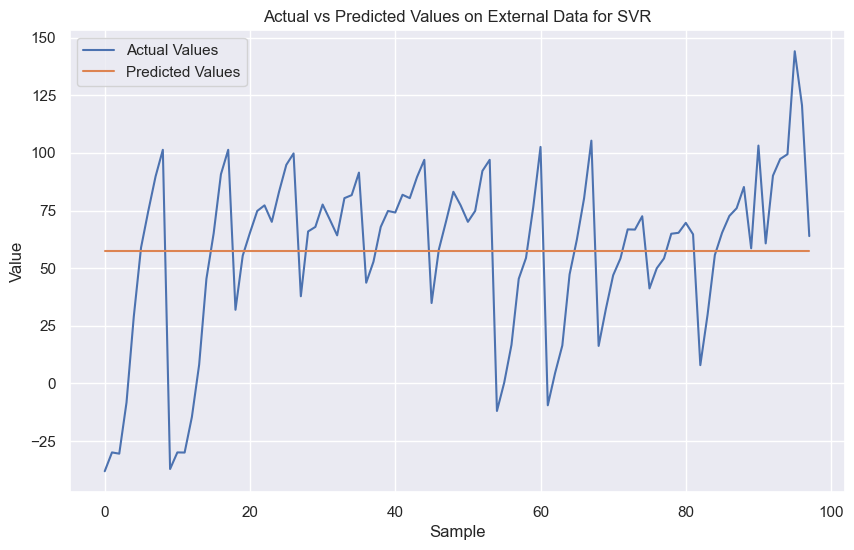

Model: SVR
Train RMSE: 0.009771579507565572 Train R2: 0.9999999326788278 Train MAE: 0.008435172648783648
Test RMSE: 33.21258412999951 Test R2: 0.13499686498744734 Test MAE: 23.953548026113197
External RMSE: 37.36294781496398 External R2: -6.22175214104459e-06 External MAE: 28.602479264375262
--------------------------------------------------
Original Dataset - RMSE: 14.853121736034884, R2: 0.8419640408925065, MAE: 4.797457743341667
External Dataset - RMSE: 37.36294781496398, R2: -6.22175214104459e-06, MAE: 28.602479264375262


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


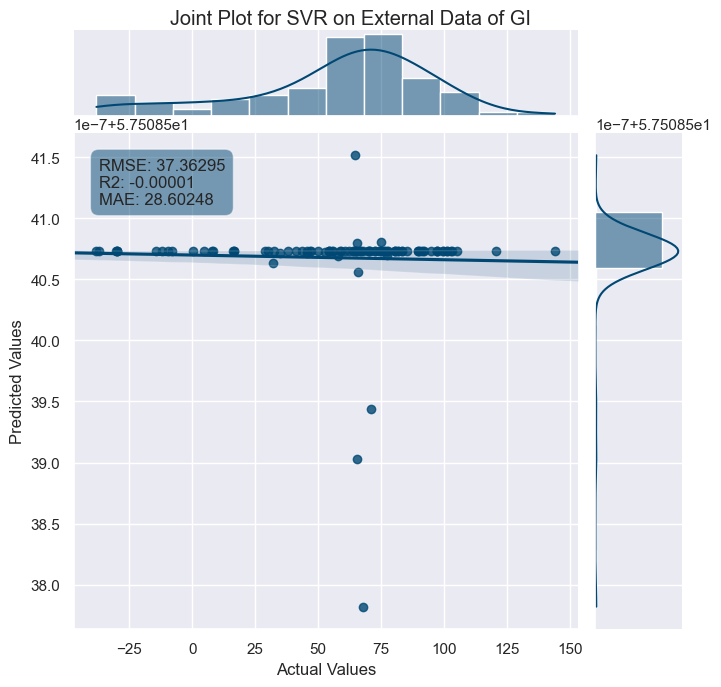

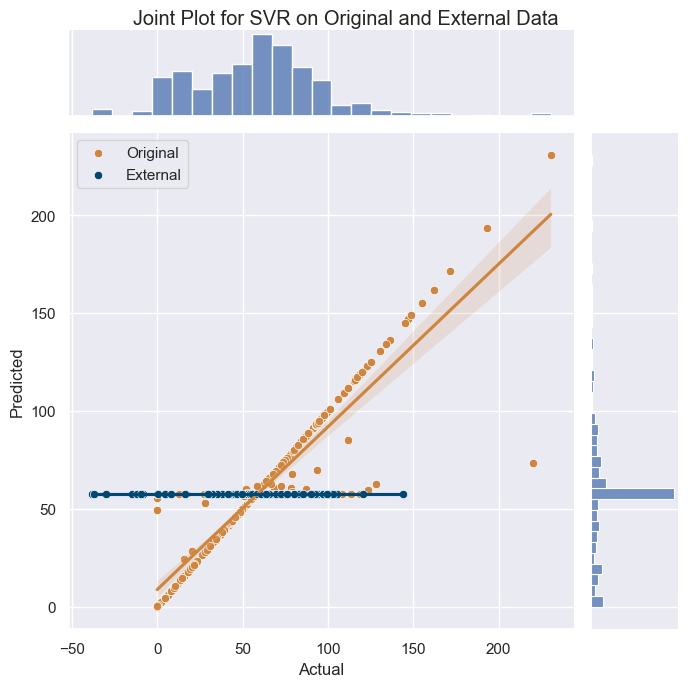

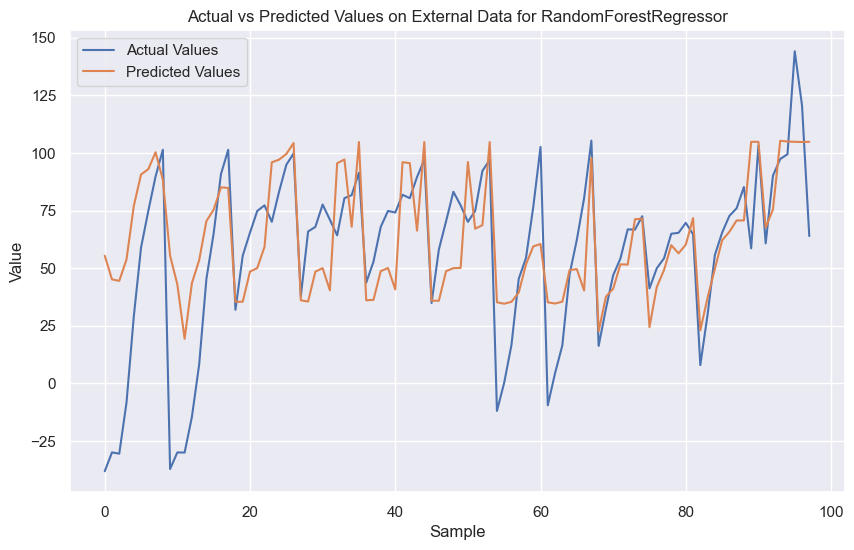

Model: RandomForestRegressor
Train RMSE: 20.79241548563232 Train R2: 0.6951880293630315 Train MAE: 15.101739972222427
Test RMSE: 22.522971676621417 Test R2: 0.6022009626583884 Test MAE: 16.09304409647616
External RMSE: 29.23730846297753 External R2: 0.38765635527740183 External MAE: 21.56546672515006
--------------------------------------------------
Original Dataset - RMSE: 21.149857777557468, R2: 0.6795684002435789, MAE: 15.300000797073173
External Dataset - RMSE: 29.23730846297753, R2: 0.38765635527740183, MAE: 21.56546672515006


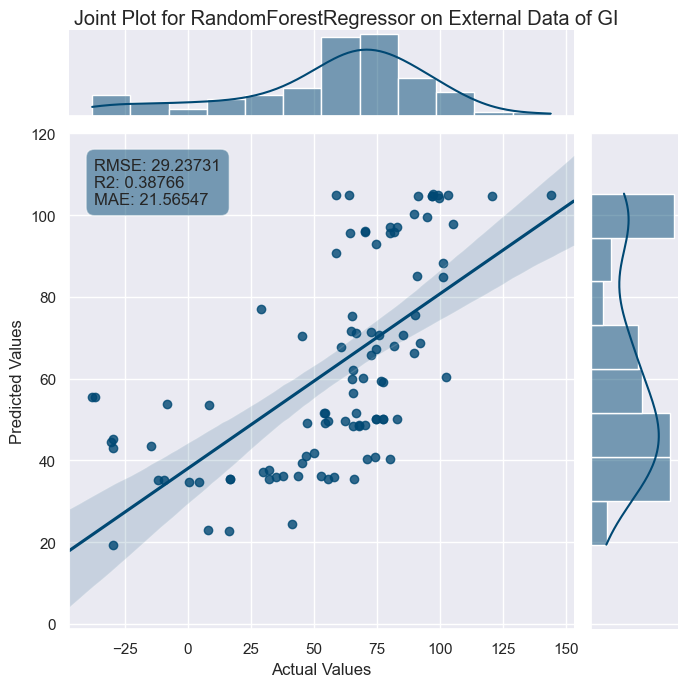

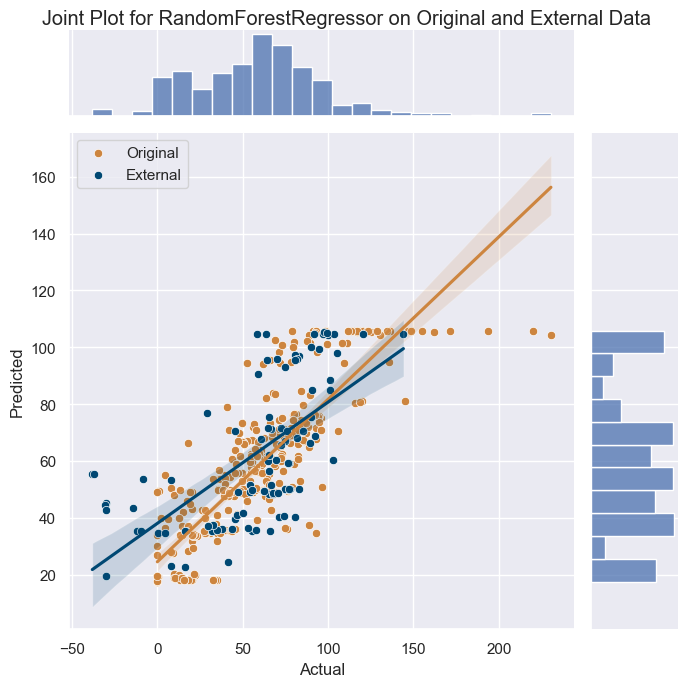

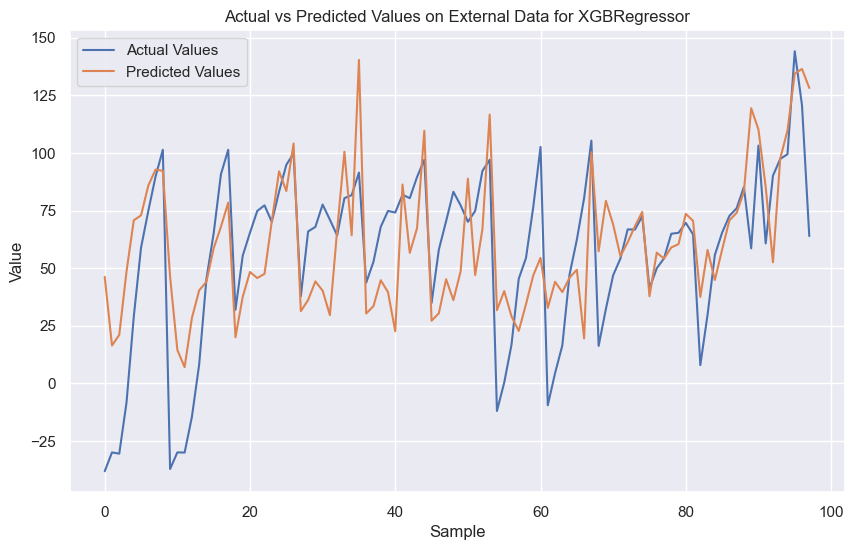

Model: XGBRegressor
Train RMSE: 8.111356976761538 Train R2: 0.9536116250623478 Train MAE: 4.963391249452193
Test RMSE: 16.84289055330213 Test R2: 0.7775432441086457 Test MAE: 11.561954542998807
External RMSE: 29.81113144177883 External R2: 0.3633842862347232 External MAE: 23.123498965907192
--------------------------------------------------
Original Dataset - RMSE: 10.45810126369358, R2: 0.9216523236149553, MAE: 6.2831039081615145
External Dataset - RMSE: 29.81113144177883, R2: 0.3633842862347232, MAE: 23.123498965907192
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000101 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 854
[LightGBM] [Info] Number of data points in the train set: 288, number of used features: 11
[LightGBM] [Info] Start training from score -0.033510
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

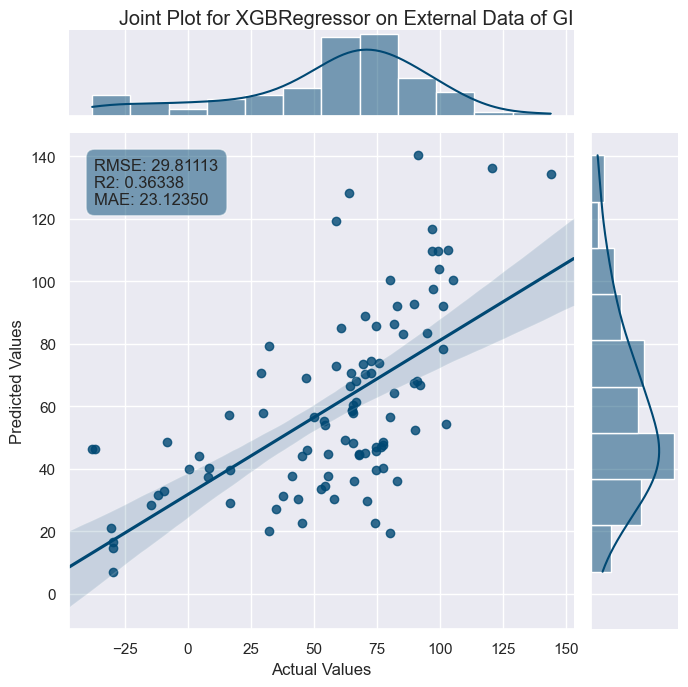

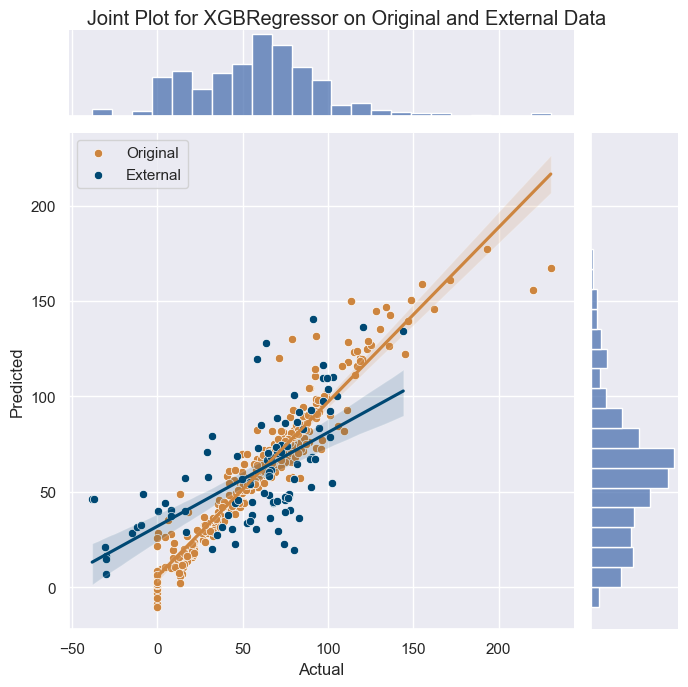

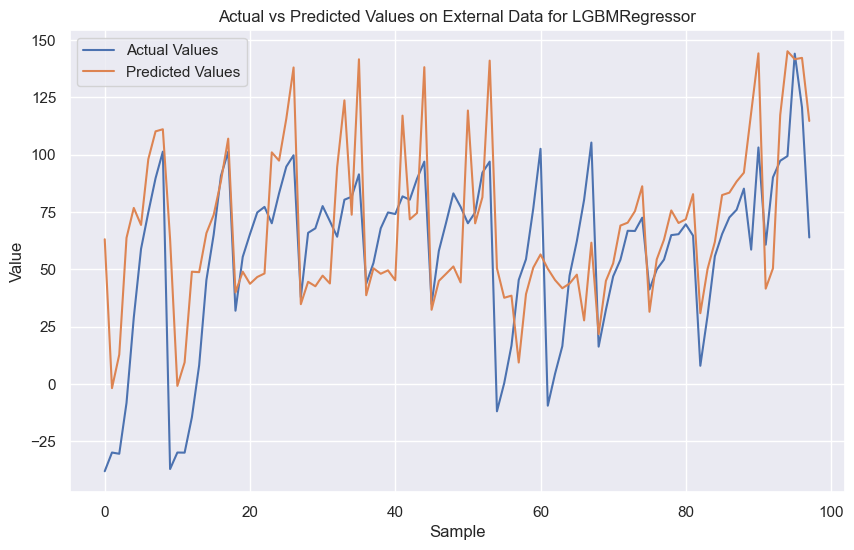

Model: LGBMRegressor
Train RMSE: 6.523220309409703 Train R2: 0.9699982753131107 Train MAE: 3.508742838377376
Test RMSE: 16.056791316562446 Test R2: 0.797823873065104 Test MAE: 10.161886546680329
External RMSE: 32.356493347646165 External R2: 0.2500309647617939 External MAE: 25.518443553362978
--------------------------------------------------
Original Dataset - RMSE: 9.252352784065424, R2: 0.9386768009314741, MAE: 4.839371580037966
External Dataset - RMSE: 32.356493347646165, R2: 0.2500309647617939, MAE: 25.518443553362978


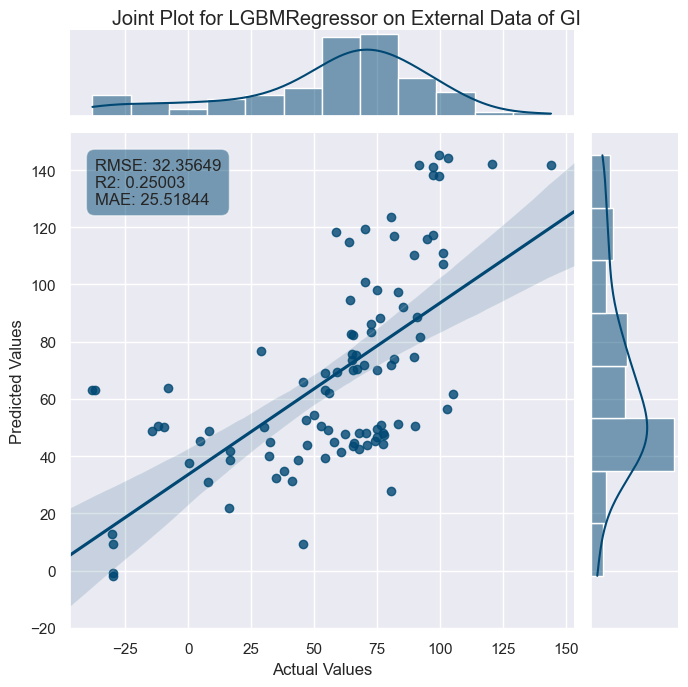

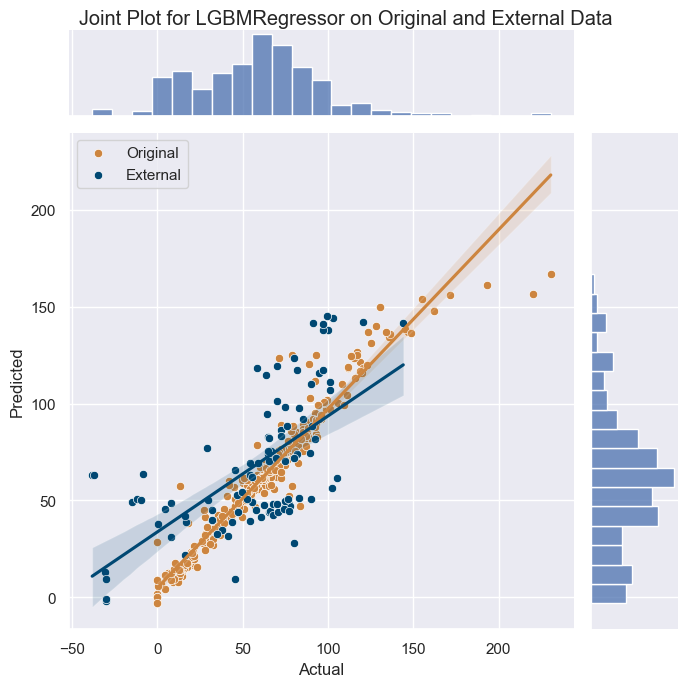

In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from skopt import BayesSearchCV
from skopt.space import Integer
import matplotlib.pyplot as plt
# Load datasets
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP3-1.csv")
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP3-2.csv")

# Normalization function
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

# Normalize datasets
data_normalized, scaler = normalize_data(data)
external_data_normalized, _ = normalize_data(external_data)

# Split the dataset into features and target
X = data_normalized[:, :-1]
y = data_normalized[:, -1]
X_external = external_data_normalized[:, :-1]
y_external = external_data_normalized[:, -1]

# Fit a scaler for the features
feature_scaler = StandardScaler()
X_normalized = feature_scaler.fit_transform(data.drop('GI(%)', axis=1))

# Fit a separate scaler for the target
target_scaler = StandardScaler()
y_normalized = target_scaler.fit_transform(data[['GI(%)']])


# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Define the hyperparameter space
param_grid = {'n_neighbors': Integer(1, 30)}

# Bayesian optimization
knn_search = BayesSearchCV(KNeighborsRegressor(), param_grid, n_iter=32, cv=5, n_jobs=-1, random_state=0)
knn_search.fit(X_train, y_train)

# Best model
knn_best = knn_search.best_estimator_

# Function to evaluate the model
def evaluate_model(model, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    y_pred_external = model.predict(X_external)

    # Denormalize target values and predictions
    y_train_denorm = target_scaler.inverse_transform(y_train.reshape(-1, 1)).flatten()
    y_test_denorm = target_scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
    y_external_denorm = target_scaler.inverse_transform(y_external.reshape(-1, 1)).flatten()
    y_pred_train_denorm = target_scaler.inverse_transform(y_pred_train.reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(y_pred_test.reshape(-1, 1)).flatten()
    y_pred_external_denorm = target_scaler.inverse_transform(y_pred_external.reshape(-1, 1)).flatten()

    # Visualization of predictions on external data
    plt.figure(figsize=(10, 6))
    plt.plot(y_external_denorm, label='Actual Values')
    plt.plot(y_pred_external_denorm, label='Predicted Values')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.title(f'Actual vs Predicted Values on External Data for {model.__class__.__name__}')
    plt.legend()
    plt.show()

    # Metrics for train and test sets
    train_rmse = mean_squared_error(y_train_denorm, y_pred_train_denorm, squared=False)
    test_rmse = mean_squared_error(y_test_denorm, y_pred_test_denorm, squared=False)
    train_r2 = r2_score(y_train_denorm, y_pred_train_denorm)
    test_r2 = r2_score(y_test_denorm, y_pred_test_denorm)
    train_mae = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
    test_mae = mean_absolute_error(y_test_denorm, y_pred_test_denorm)

    # Metrics for external set
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)

    # Text for metrics
    metrics_text = f"RMSE: {external_rmse:.5f}\nR2: {external_r2:.5f}\nMAE: {external_mae:.5f}"

    # Create DataFrame for seaborn joint plot
    external_pred_df = pd.DataFrame({
        'Actual Values': y_external_denorm, 
        'Predicted Values': y_pred_external_denorm
    })

    # Set seaborn theme
    sns.set_theme(style="darkgrid")

    # Create the jointplot for external data with specified color
    g_external = sns.jointplot(x='Actual Values', y='Predicted Values', data=external_pred_df,
                               kind="reg", truncate=False,
                               color="#004873", height=7) 
    
    # Set title for the plot
    g_external.fig.suptitle(f"Joint Plot for {model.__class__.__name__} on External Data of GI")

    # Add metrics as text annotations
    plt.annotate(metrics_text, xy=(0.05, 0.95), xycoords='axes fraction', 
                 ha='left', va='top', bbox=dict(boxstyle='round,pad=0.5', fc="#004873", alpha=0.5))

    # Adjust layout
    g_external.fig.subplots_adjust(top=0.95)

    # Print metrics
    print(f"Model: {model.__class__.__name__}")
    print("Train RMSE:", train_rmse, "Train R2:", train_r2, "Train MAE:", train_mae)
    print("Test RMSE:", test_rmse, "Test R2:", test_r2, "Test MAE:", test_mae)
    print("External RMSE:", external_rmse, "External R2:", external_r2, "External MAE:", external_mae)
    print("--------------------------------------------------")

    # 评估模型并获取训练集和测试集的预测值
    y_pred_train_denorm = target_scaler.inverse_transform(model.predict(X_train).reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(model.predict(X_test).reshape(-1, 1)).flatten()

    # 合并训练集和测试集的数据
    original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
    original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])

    # 创建包含原始数据集和外部数据集的 DataFrame
    combined_df = pd.DataFrame({
        'Actual': np.concatenate([original_data_actual, y_external_denorm]),
        'Predicted': np.concatenate([original_data_predicted, y_pred_external_denorm]),
        'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(y_external_denorm)
    })

    # 创建基础 jointplot
    g_combined = sns.jointplot(x='Actual', y='Predicted', data=combined_df, kind="scatter", height=7)

    # 定义两个数据集的颜色
    colors = ['#CD853F', '#004873']

    # 为两个数据集添加不同颜色的散点图和线性回归线
    for dataset, color in zip(['Original', 'External'], colors):
        subset = combined_df[combined_df['Dataset'] == dataset]
        sns.scatterplot(x=subset['Actual'], y=subset['Predicted'], color=color, ax=g_combined.ax_joint, label=dataset)
        sns.regplot(x=subset['Actual'], y=subset['Predicted'], scatter=False, color=color, ax=g_combined.ax_joint)

    # 设置标题和布局
    g_combined.fig.suptitle(f"Joint Plot for {model.__class__.__name__} on Original and External Data")
    g_combined.fig.subplots_adjust(top=0.95)
    # 计算原始数据集的指标
    train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
    train_r2 = r2_score(original_data_actual, original_data_predicted)
    train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

    # 计算外部数据集的指标
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)


    print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
    print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

# Evaluate KNN model
evaluate_model(knn_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.svm import SVR
from skopt.space import Real


param_grid_svm = {
    'C': Real(1e-15, 1e+1, prior='log-uniform'),
    'gamma': Real(1e-15, 1e+1, prior='log-uniform'),
    'epsilon': Real(1e-15, 1e+1, prior='log-uniform')
}


# Bayesian optimization
svm_search = BayesSearchCV(SVR(), param_grid_svm, n_iter=32, cv=5, n_jobs=-1, random_state=0)
svm_search.fit(X_train, y_train)

# Best model
svm_best = svm_search.best_estimator_

# Evaluate SVM model
evaluate_model(svm_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.ensemble import RandomForestRegressor
from skopt.space import Integer, Real

# Define the hyperparameter space for Random Forest
param_grid_rf = {
    'n_estimators': Integer(100, 300),
    'max_depth': Integer(10, 50),
    'min_samples_split': Real(0.1, 1.0),
    'min_samples_leaf': Real(0.1, 0.5)
}

# Bayesian optimization
rf_search = BayesSearchCV(RandomForestRegressor(random_state=0), param_grid_rf, n_iter=32, cv=5, n_jobs=-1, random_state=0)
rf_search.fit(X_train, y_train)

# Best model
rf_best = rf_search.best_estimator_

# Evaluate Random Forest model
evaluate_model(rf_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import xgboost as xgb

# Define the hyperparameter space for XGBoost
param_grid_xgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
xgb_search = BayesSearchCV(xgb.XGBRegressor(), param_grid_xgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
xgb_search.fit(X_train, y_train)

# Best model
xgb_best = xgb_search.best_estimator_

# Evaluate XGBoost model
evaluate_model(xgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import lightgbm as lgb

# Define the hyperparameter space for LightGBM
param_grid_lgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(-1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'num_leaves': Integer(20, 300),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
lgb_search = BayesSearchCV(lgb.LGBMRegressor(), param_grid_lgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
lgb_search.fit(X_train, y_train)

# Best model
lgb_best = lgb_search.best_estimator_

# Evaluate LightGBM model
evaluate_model(lgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

In [6]:
# 创建包含模型名称和其最优超参数的字典
model_hyperparams = {
    'KNN': knn_search.best_params_,
    'SVM': svm_search.best_params_,
    'RandomForest': rf_search.best_params_,
    'XGBoost': xgb_search.best_params_,
    'LightGBM': lgb_search.best_params_
}

# 转换为DataFrame
hyperparams_df = pd.DataFrame.from_dict(model_hyperparams, orient='index')

# 重置索引，使模型名称成为一列
hyperparams_df.reset_index(inplace=True)
hyperparams_df.rename(columns={'index': 'Model'}, inplace=True)

# 指定文件路径和名称，这里替换为你的目标路径
file_path = "C:\\Users\\Lenovo\\Desktop\\元学习\\传统模型超参数\\hyperparams_CP_1_3.csv"

# 保存为CSV文件
hyperparams_df.to_csv(file_path, index=False)

e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


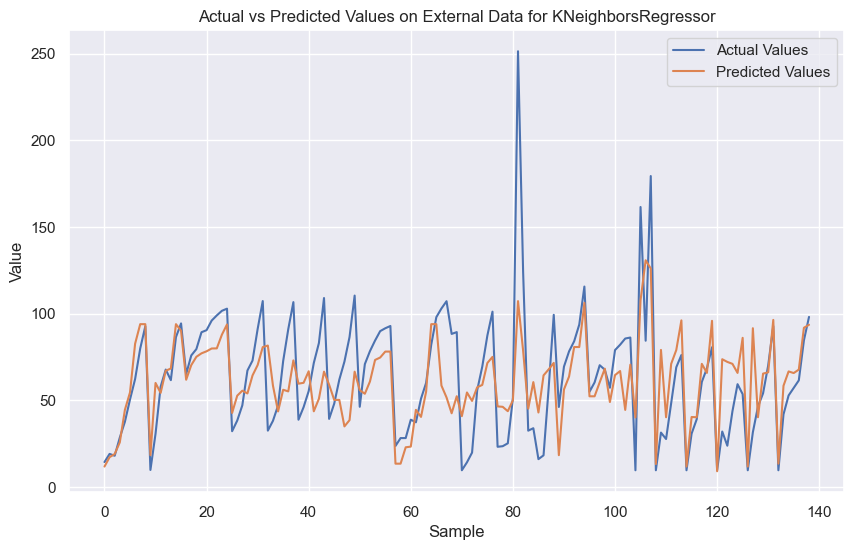

Model: KNeighborsRegressor
Train RMSE: 13.402685912215395 Train R2: 0.8464087028067269 Train MAE: 8.286674006105882
Test RMSE: 19.797854471107225 Test R2: 0.7470318746137901 Test MAE: 12.396979022065105
External RMSE: 25.773220163196175 External R2: 0.4696690483593048 External MAE: 18.391011802992796
--------------------------------------------------
Original Dataset - RMSE: 14.907371262632614, R2: 0.8225762548498046, MAE: 9.11131200303814
External Dataset - RMSE: 25.773220163196175, R2: 0.4696690483593048, MAE: 18.391011802992796


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


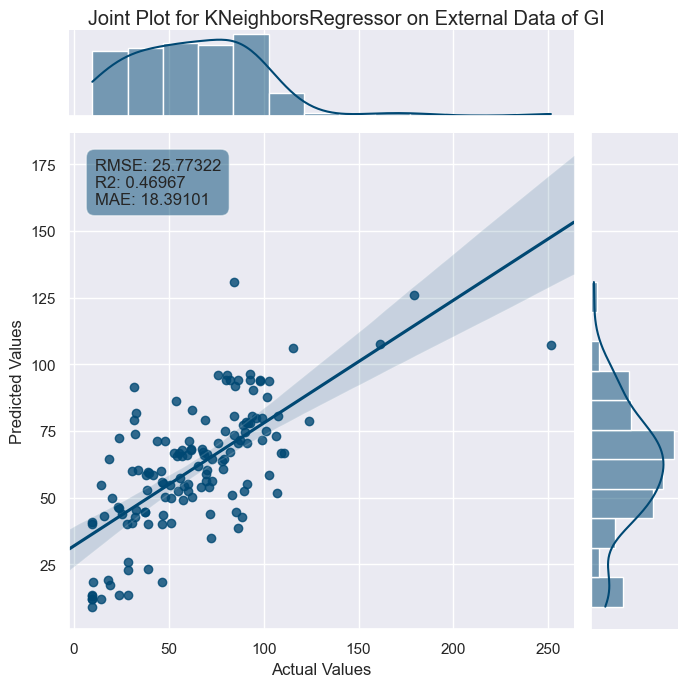

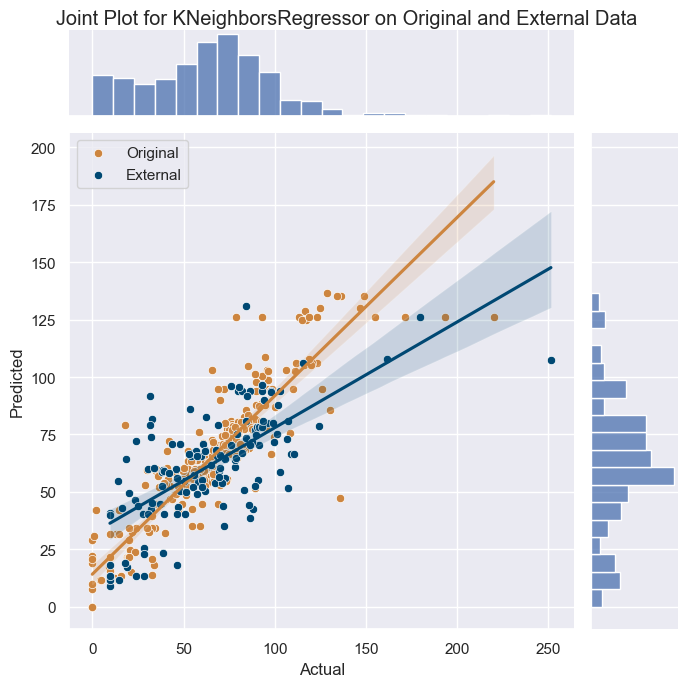

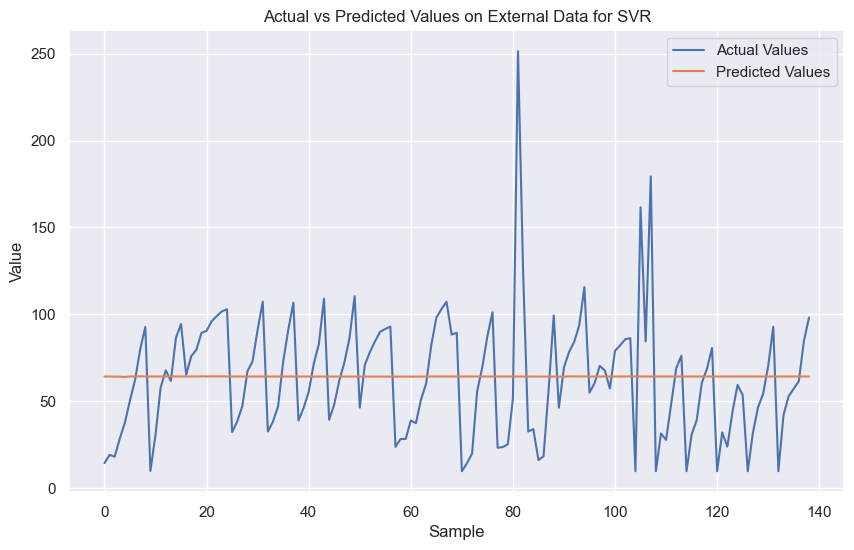

Model: SVR
Train RMSE: 0.009017585049757488 Train R2: 0.99999993047141 Train MAE: 0.007146466003215231
Test RMSE: 34.24027818877003 Test R2: 0.24333418032699206 Test MAE: 23.73464844110947
External RMSE: 35.38865601177769 External R2: 0.00014333507438979431 External MAE: 27.248632139737996
--------------------------------------------------
Original Dataset - RMSE: 15.336702383930863, R2: 0.8122095134562375, MAE: 4.767523037811367
External Dataset - RMSE: 35.38865601177769, R2: 0.00014333507438979431, MAE: 27.248632139737996


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


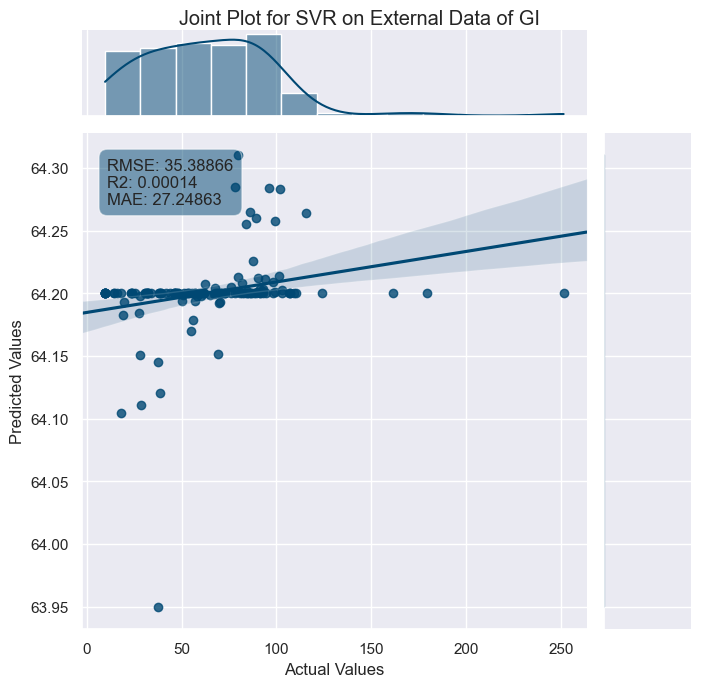

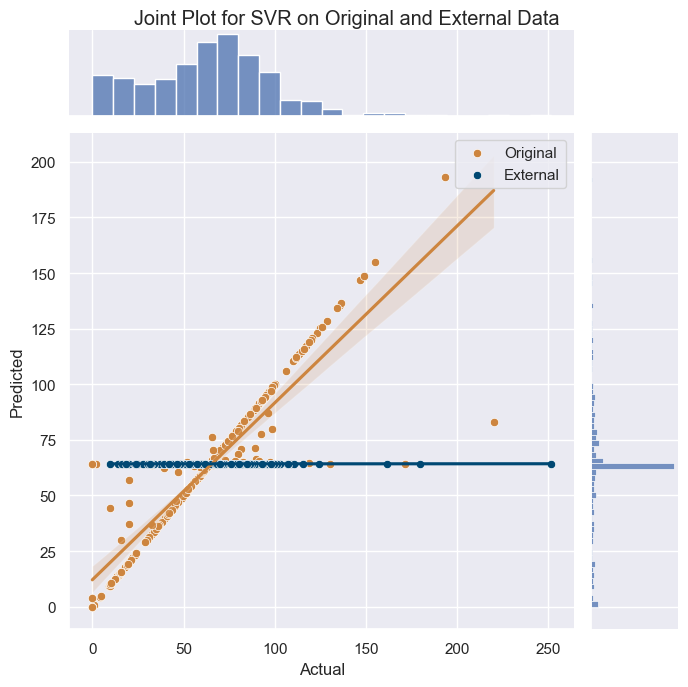

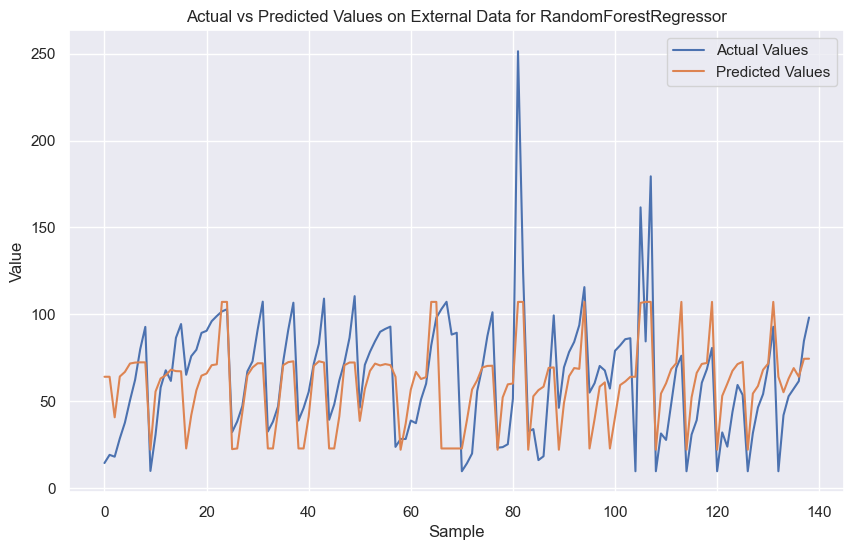

Model: RandomForestRegressor
Train RMSE: 18.391154941737057 Train R2: 0.7107982380549743 Train MAE: 14.661618453787293
Test RMSE: 23.70041522826573 Test R2: 0.6374720818403846 Test MAE: 15.740890060857783
External RMSE: 29.15610482411005 External R2: 0.32131443359558687 External MAE: 22.230042651807675
--------------------------------------------------
Original Dataset - RMSE: 19.572166723512797, R2: 0.6941648341635533, MAE: 14.878149434516168
External Dataset - RMSE: 29.15610482411005, R2: 0.32131443359558687, MAE: 22.230042651807675


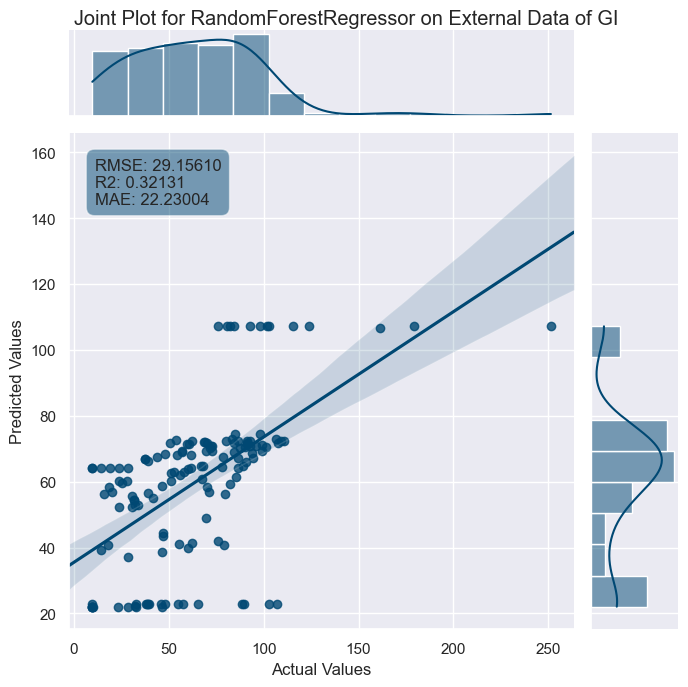

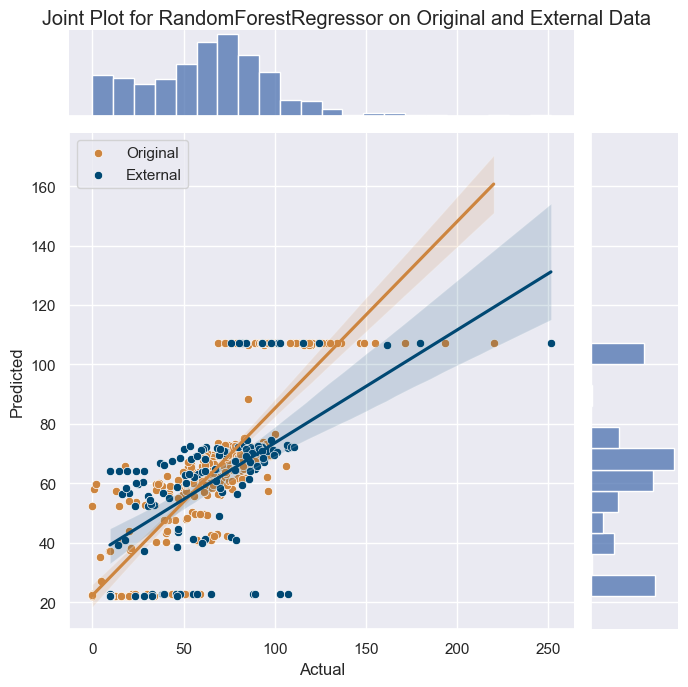

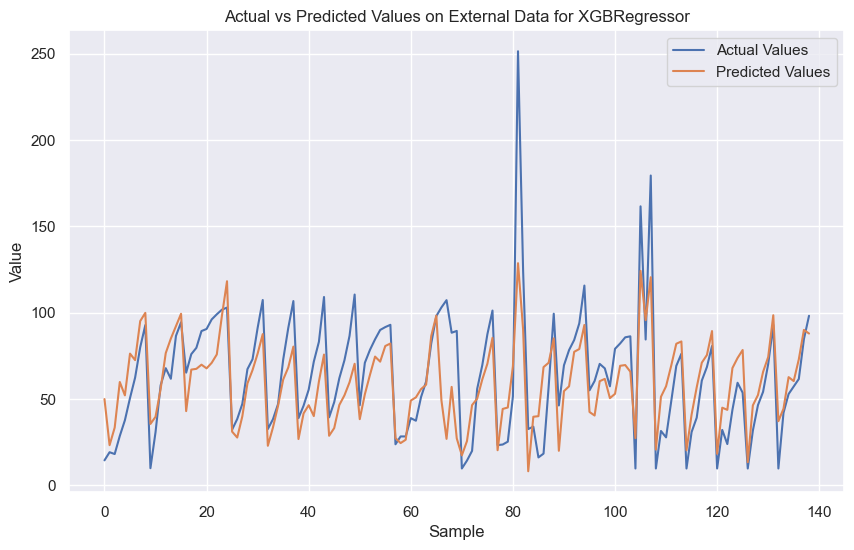

Model: XGBRegressor
Train RMSE: 0.017496280780386772 Train R2: 0.9999997382574028 Train MAE: 0.013876080538932177
Test RMSE: 14.104687305165722 Test R2: 0.8716025282208195 Test MAE: 9.832801503324408
External RMSE: 22.723066080890703 External R2: 0.5877663211085398 External MAE: 16.76975445754417
--------------------------------------------------
Original Dataset - RMSE: 6.31770639977671, R2: 0.9681339314748785, MAE: 1.9838172311918172
External Dataset - RMSE: 22.723066080890703, R2: 0.5877663211085398, MAE: 16.76975445754417
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 756
[LightGBM] [Info] Number of data points in the train set: 255, number of used features: 11
[LightGBM] [Info] Start training from score -0.036851
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

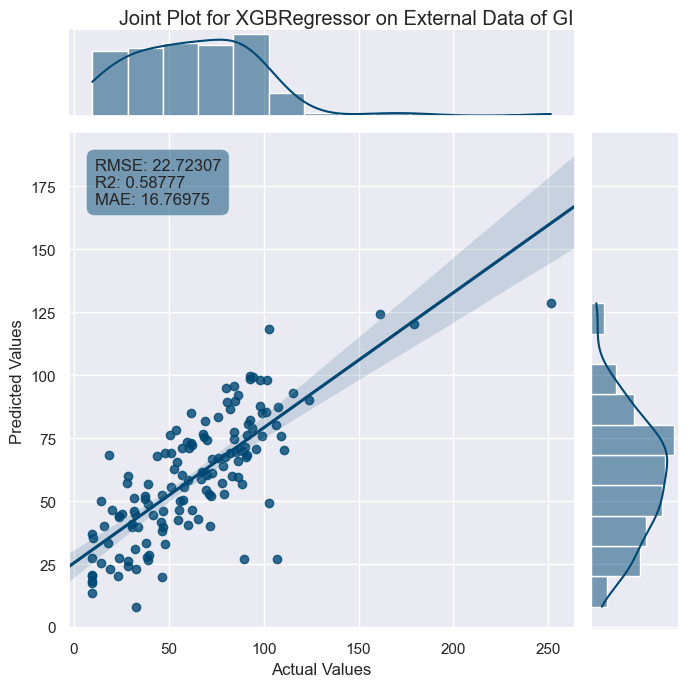

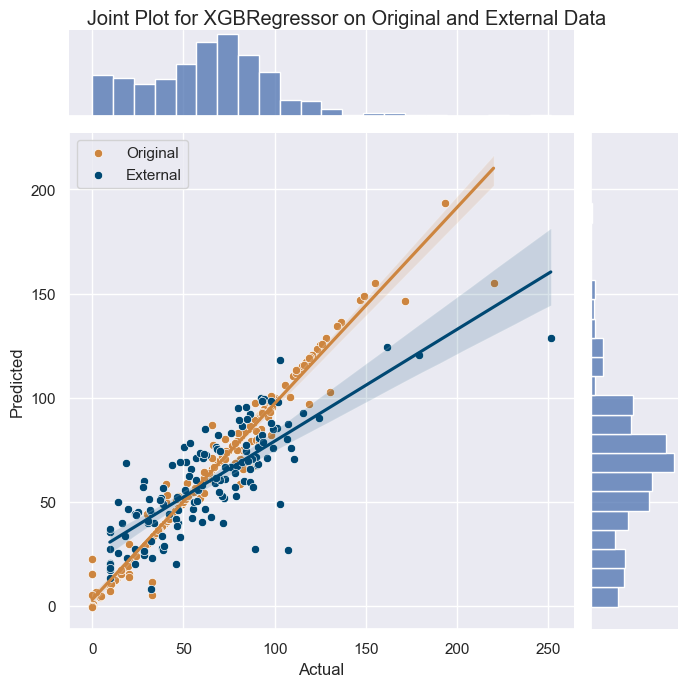

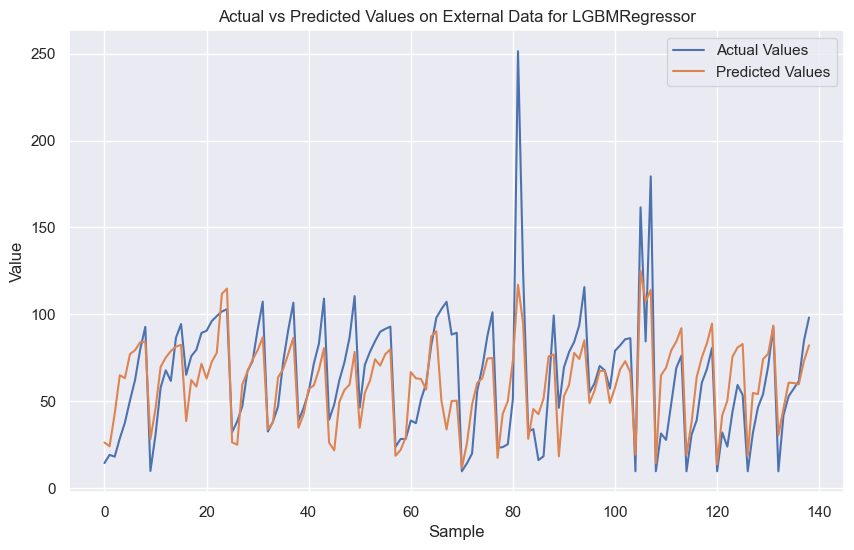

Model: LGBMRegressor
Train RMSE: 6.50113306886166 Train R2: 0.9638622558290008 Train MAE: 4.142213158752428
Test RMSE: 16.246007662372556 Test R2: 0.8296575635338362 Test MAE: 10.665837685098793
External RMSE: 23.316573926644818 External R2: 0.5659506794779159 External MAE: 17.292994329269007
--------------------------------------------------
Original Dataset - RMSE: 9.313287000844634, R2: 0.9307506693067824, MAE: 5.451028110746683
External Dataset - RMSE: 23.316573926644818, R2: 0.5659506794779159, MAE: 17.292994329269007


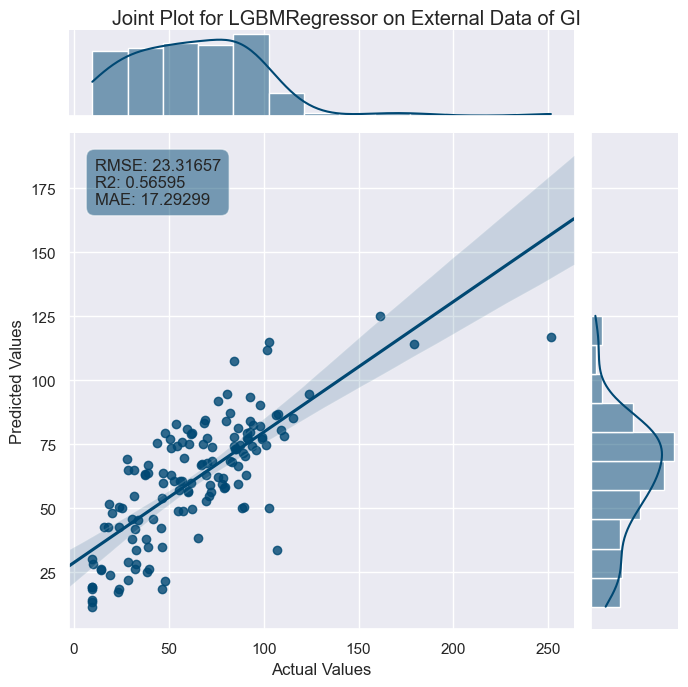

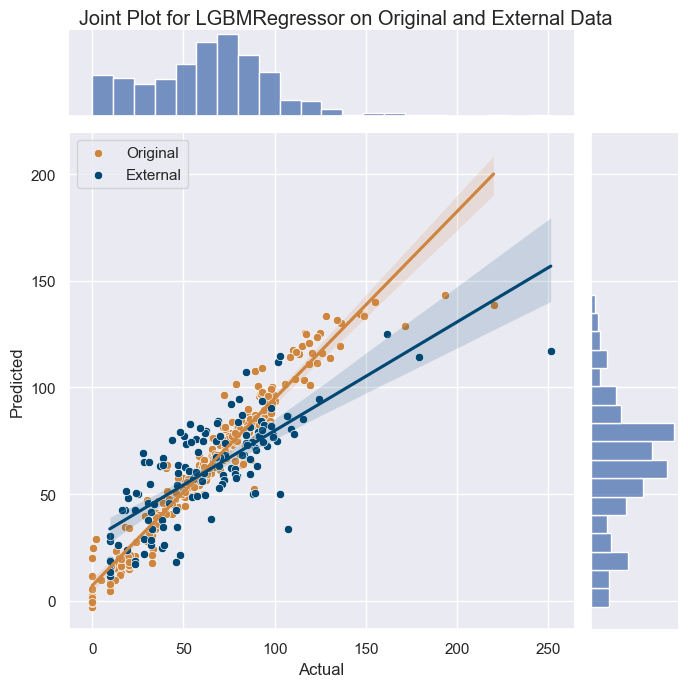

In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from skopt import BayesSearchCV
from skopt.space import Integer
import matplotlib.pyplot as plt
# Load datasets
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP4-1.csv")
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP4-2.csv")

# Normalization function
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

# Normalize datasets
data_normalized, scaler = normalize_data(data)
external_data_normalized, _ = normalize_data(external_data)

# Split the dataset into features and target
X = data_normalized[:, :-1]
y = data_normalized[:, -1]
X_external = external_data_normalized[:, :-1]
y_external = external_data_normalized[:, -1]

# Fit a scaler for the features
feature_scaler = StandardScaler()
X_normalized = feature_scaler.fit_transform(data.drop('GI(%)', axis=1))

# Fit a separate scaler for the target
target_scaler = StandardScaler()
y_normalized = target_scaler.fit_transform(data[['GI(%)']])


# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Define the hyperparameter space
param_grid = {'n_neighbors': Integer(1, 30)}

# Bayesian optimization
knn_search = BayesSearchCV(KNeighborsRegressor(), param_grid, n_iter=32, cv=5, n_jobs=-1, random_state=0)
knn_search.fit(X_train, y_train)

# Best model
knn_best = knn_search.best_estimator_

# Function to evaluate the model
def evaluate_model(model, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    y_pred_external = model.predict(X_external)

    # Denormalize target values and predictions
    y_train_denorm = target_scaler.inverse_transform(y_train.reshape(-1, 1)).flatten()
    y_test_denorm = target_scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
    y_external_denorm = target_scaler.inverse_transform(y_external.reshape(-1, 1)).flatten()
    y_pred_train_denorm = target_scaler.inverse_transform(y_pred_train.reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(y_pred_test.reshape(-1, 1)).flatten()
    y_pred_external_denorm = target_scaler.inverse_transform(y_pred_external.reshape(-1, 1)).flatten()

    # Visualization of predictions on external data
    plt.figure(figsize=(10, 6))
    plt.plot(y_external_denorm, label='Actual Values')
    plt.plot(y_pred_external_denorm, label='Predicted Values')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.title(f'Actual vs Predicted Values on External Data for {model.__class__.__name__}')
    plt.legend()
    plt.show()

    # Metrics for train and test sets
    train_rmse = mean_squared_error(y_train_denorm, y_pred_train_denorm, squared=False)
    test_rmse = mean_squared_error(y_test_denorm, y_pred_test_denorm, squared=False)
    train_r2 = r2_score(y_train_denorm, y_pred_train_denorm)
    test_r2 = r2_score(y_test_denorm, y_pred_test_denorm)
    train_mae = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
    test_mae = mean_absolute_error(y_test_denorm, y_pred_test_denorm)

    # Metrics for external set
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)

    # Text for metrics
    metrics_text = f"RMSE: {external_rmse:.5f}\nR2: {external_r2:.5f}\nMAE: {external_mae:.5f}"

    # Create DataFrame for seaborn joint plot
    external_pred_df = pd.DataFrame({
        'Actual Values': y_external_denorm, 
        'Predicted Values': y_pred_external_denorm
    })

    # Set seaborn theme
    sns.set_theme(style="darkgrid")

    # Create the jointplot for external data with specified color
    g_external = sns.jointplot(x='Actual Values', y='Predicted Values', data=external_pred_df,
                               kind="reg", truncate=False,
                               color="#004873", height=7) 
    
    # Set title for the plot
    g_external.fig.suptitle(f"Joint Plot for {model.__class__.__name__} on External Data of GI")

    # Add metrics as text annotations
    plt.annotate(metrics_text, xy=(0.05, 0.95), xycoords='axes fraction', 
                 ha='left', va='top', bbox=dict(boxstyle='round,pad=0.5', fc="#004873", alpha=0.5))

    # Adjust layout
    g_external.fig.subplots_adjust(top=0.95)

    # Print metrics
    print(f"Model: {model.__class__.__name__}")
    print("Train RMSE:", train_rmse, "Train R2:", train_r2, "Train MAE:", train_mae)
    print("Test RMSE:", test_rmse, "Test R2:", test_r2, "Test MAE:", test_mae)
    print("External RMSE:", external_rmse, "External R2:", external_r2, "External MAE:", external_mae)
    print("--------------------------------------------------")

    # 评估模型并获取训练集和测试集的预测值
    y_pred_train_denorm = target_scaler.inverse_transform(model.predict(X_train).reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(model.predict(X_test).reshape(-1, 1)).flatten()

    # 合并训练集和测试集的数据
    original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
    original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])

    # 创建包含原始数据集和外部数据集的 DataFrame
    combined_df = pd.DataFrame({
        'Actual': np.concatenate([original_data_actual, y_external_denorm]),
        'Predicted': np.concatenate([original_data_predicted, y_pred_external_denorm]),
        'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(y_external_denorm)
    })

    # 创建基础 jointplot
    g_combined = sns.jointplot(x='Actual', y='Predicted', data=combined_df, kind="scatter", height=7)

    # 定义两个数据集的颜色
    colors = ['#CD853F', '#004873']

    # 为两个数据集添加不同颜色的散点图和线性回归线
    for dataset, color in zip(['Original', 'External'], colors):
        subset = combined_df[combined_df['Dataset'] == dataset]
        sns.scatterplot(x=subset['Actual'], y=subset['Predicted'], color=color, ax=g_combined.ax_joint, label=dataset)
        sns.regplot(x=subset['Actual'], y=subset['Predicted'], scatter=False, color=color, ax=g_combined.ax_joint)

    # 设置标题和布局
    g_combined.fig.suptitle(f"Joint Plot for {model.__class__.__name__} on Original and External Data")
    g_combined.fig.subplots_adjust(top=0.95)
    # 计算原始数据集的指标
    train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
    train_r2 = r2_score(original_data_actual, original_data_predicted)
    train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

    # 计算外部数据集的指标
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)


    print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
    print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

# Evaluate KNN model
evaluate_model(knn_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.svm import SVR
from skopt.space import Real

# Define the hyperparameter space for SVM
param_grid_svm = {
    'C': Real(1e-15, 1e+1, prior='log-uniform'),
    'gamma': Real(1e-15, 1e+1, prior='log-uniform'),
    'epsilon': Real(1e-15, 1e+1, prior='log-uniform')
}

# Bayesian optimization
svm_search = BayesSearchCV(SVR(), param_grid_svm, n_iter=32, cv=5, n_jobs=-1, random_state=0)
svm_search.fit(X_train, y_train)

# Best model
svm_best = svm_search.best_estimator_

# Evaluate SVM model
evaluate_model(svm_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.ensemble import RandomForestRegressor
from skopt.space import Integer, Real

# Define the hyperparameter space for Random Forest
param_grid_rf = {
    'n_estimators': Integer(100, 300),
    'max_depth': Integer(10, 50),
    'min_samples_split': Real(0.1, 1.0),
    'min_samples_leaf': Real(0.1, 0.5)
}

# Bayesian optimization
rf_search = BayesSearchCV(RandomForestRegressor(random_state=0), param_grid_rf, n_iter=32, cv=5, n_jobs=-1, random_state=0)
rf_search.fit(X_train, y_train)

# Best model
rf_best = rf_search.best_estimator_

# Evaluate Random Forest model
evaluate_model(rf_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import xgboost as xgb

# Define the hyperparameter space for XGBoost
param_grid_xgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
xgb_search = BayesSearchCV(xgb.XGBRegressor(), param_grid_xgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
xgb_search.fit(X_train, y_train)

# Best model
xgb_best = xgb_search.best_estimator_

# Evaluate XGBoost model
evaluate_model(xgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import lightgbm as lgb

# Define the hyperparameter space for LightGBM
param_grid_lgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(-1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'num_leaves': Integer(20, 300),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
lgb_search = BayesSearchCV(lgb.LGBMRegressor(), param_grid_lgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
lgb_search.fit(X_train, y_train)

# Best model
lgb_best = lgb_search.best_estimator_

# Evaluate LightGBM model
evaluate_model(lgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

In [8]:
# 创建包含模型名称和其最优超参数的字典
model_hyperparams = {
    'KNN': knn_search.best_params_,
    'SVM': svm_search.best_params_,
    'RandomForest': rf_search.best_params_,
    'XGBoost': xgb_search.best_params_,
    'LightGBM': lgb_search.best_params_
}

# 转换为DataFrame
hyperparams_df = pd.DataFrame.from_dict(model_hyperparams, orient='index')

# 重置索引，使模型名称成为一列
hyperparams_df.reset_index(inplace=True)
hyperparams_df.rename(columns={'index': 'Model'}, inplace=True)

# 指定文件路径和名称，这里替换为你的目标路径
file_path = "C:\\Users\\Lenovo\\Desktop\\元学习\\传统模型超参数\\hyperparams_CP_1_4.csv"

# 保存为CSV文件
hyperparams_df.to_csv(file_path, index=False)

2.两部分样本用于训练

e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


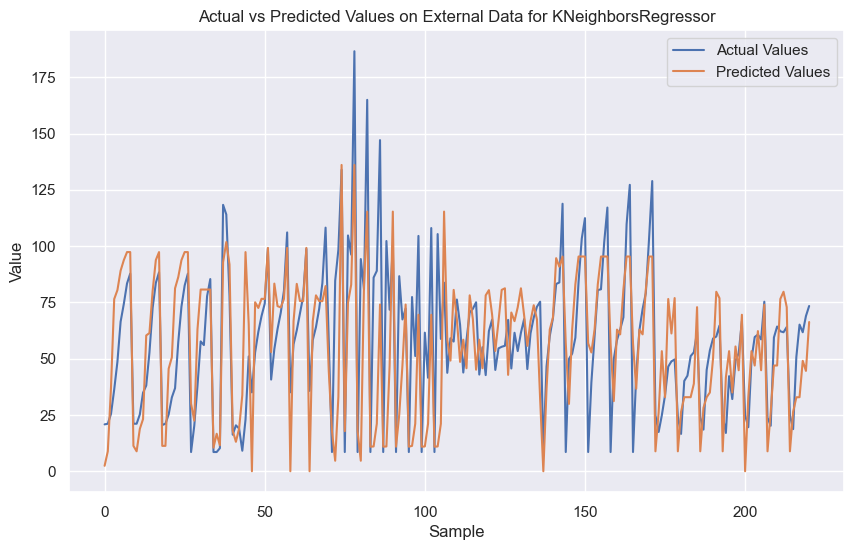

Model: KNeighborsRegressor
Train RMSE: 9.44949551131196 Train R2: 0.9172564355204801 Train MAE: 5.337797634960317
Test RMSE: 15.256460394228961 Test R2: 0.6330898732614866 Test MAE: 7.255083906302084
External RMSE: 25.24549127063008 External R2: 0.35846524801451995 External MAE: 18.086024967491923
--------------------------------------------------
Original Dataset - RMSE: 10.878855441428302, R2: 0.8808706022836508, MAE: 5.7261087785232085
External Dataset - RMSE: 25.24549127063008, R2: 0.35846524801451995, MAE: 18.086024967491923


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


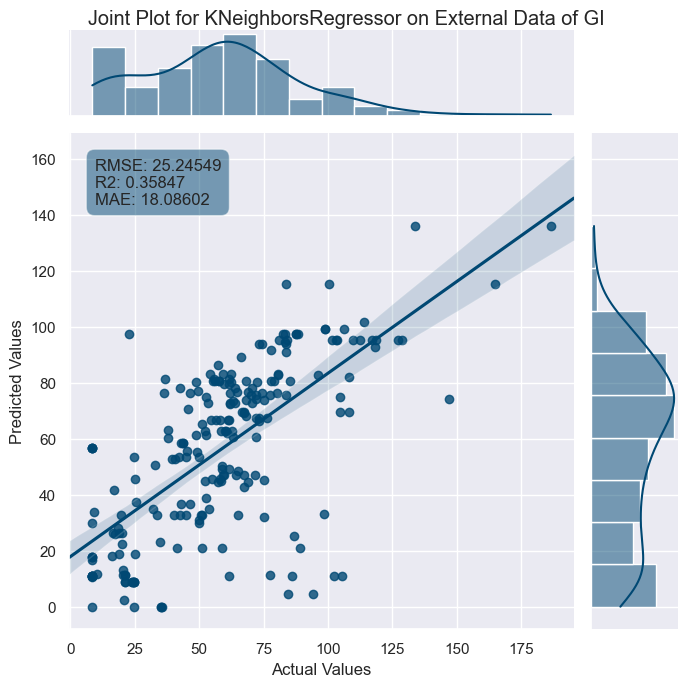

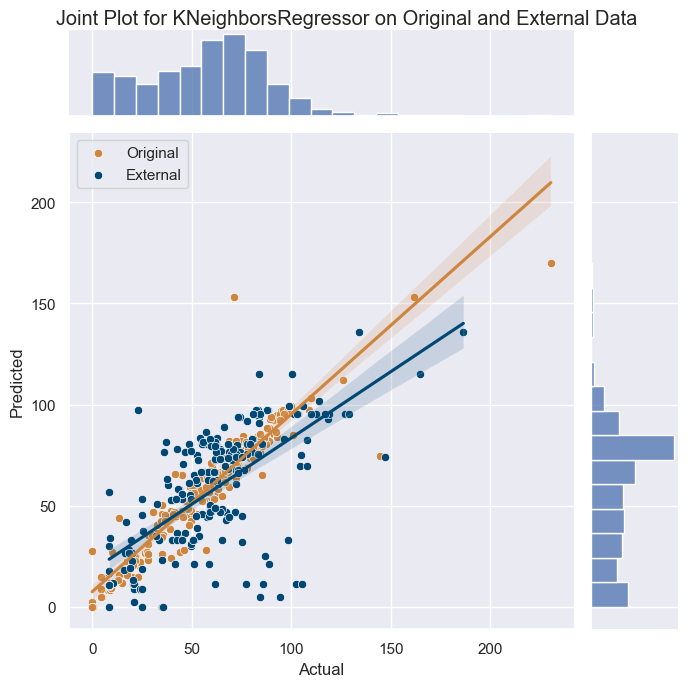

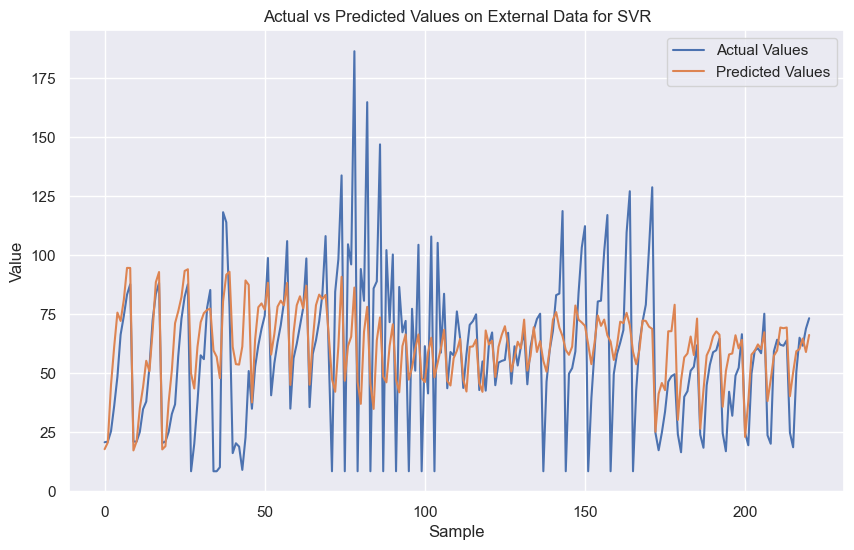

Model: SVR
Train RMSE: 1.3765784750735015 Train R2: 0.9982440225742237 Train MAE: 0.2878929880277021
Test RMSE: 10.412835018173425 Test R2: 0.8290810951342844 Test MAE: 6.882664622208637
External RMSE: 25.62504919689068 External R2: 0.3390296928136636 External MAE: 18.57098077879588
--------------------------------------------------
Original Dataset - RMSE: 4.844698436915448, R2: 0.9763742266865558, MAE: 1.6235429392542207
External Dataset - RMSE: 25.62504919689068, R2: 0.3390296928136636, MAE: 18.57098077879588


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


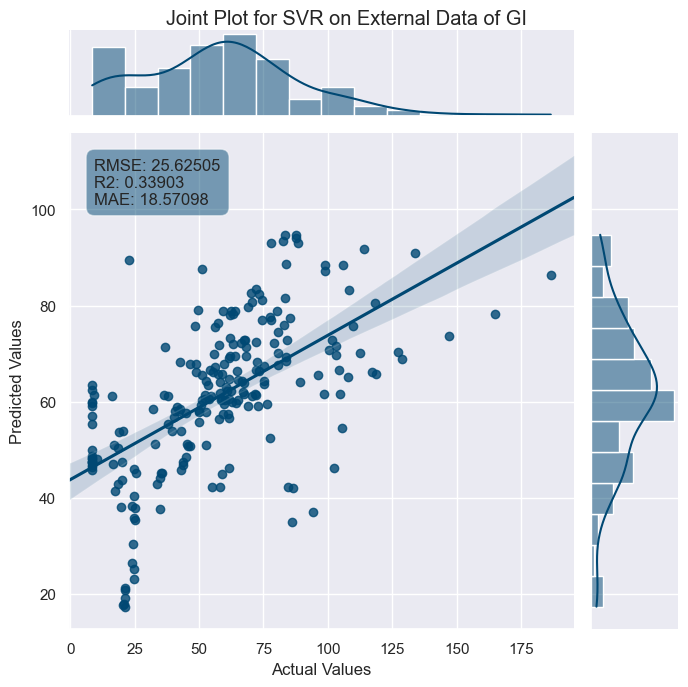

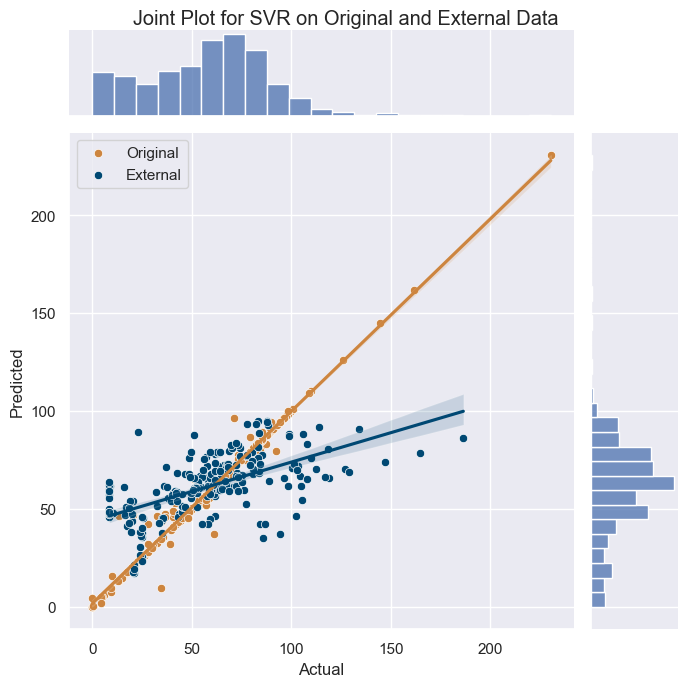

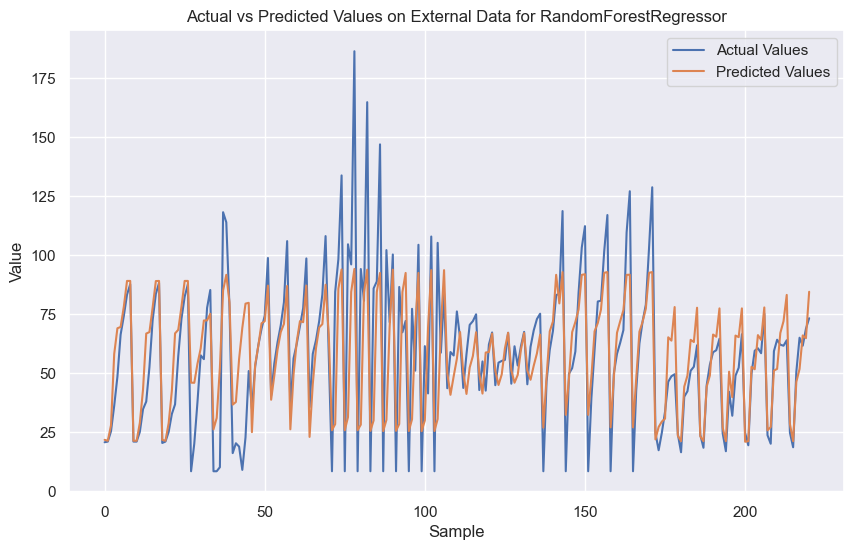

Model: RandomForestRegressor
Train RMSE: 19.987445368379678 Train R2: 0.6298041387689075 Train MAE: 12.699384509975921
Test RMSE: 14.22917784450014 Test R2: 0.6808375857737539 Test MAE: 11.500735386405184
External RMSE: 20.74615557696514 External R2: 0.56676075020667 External MAE: 13.771933252613431
--------------------------------------------------
Original Dataset - RMSE: 18.962949982940998, R2: 0.6380368713045825, MAE: 12.456620130518555
External Dataset - RMSE: 20.74615557696514, R2: 0.56676075020667, MAE: 13.771933252613431


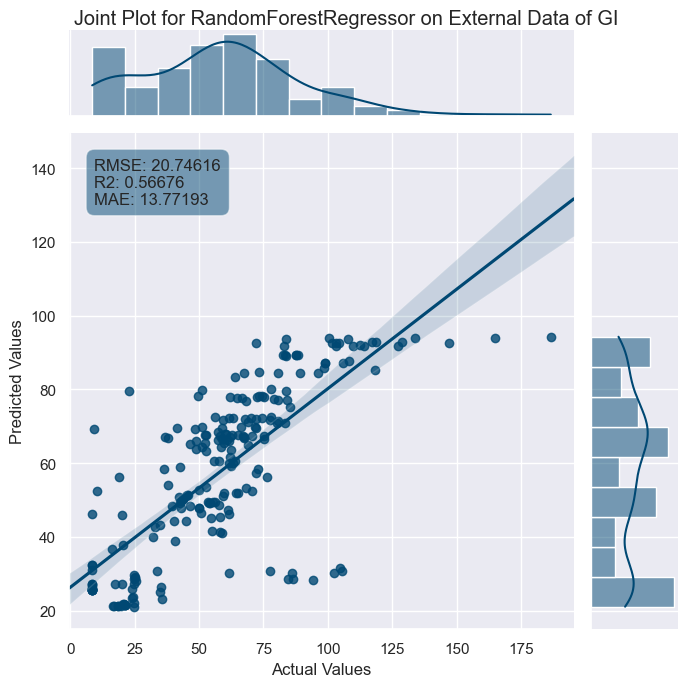

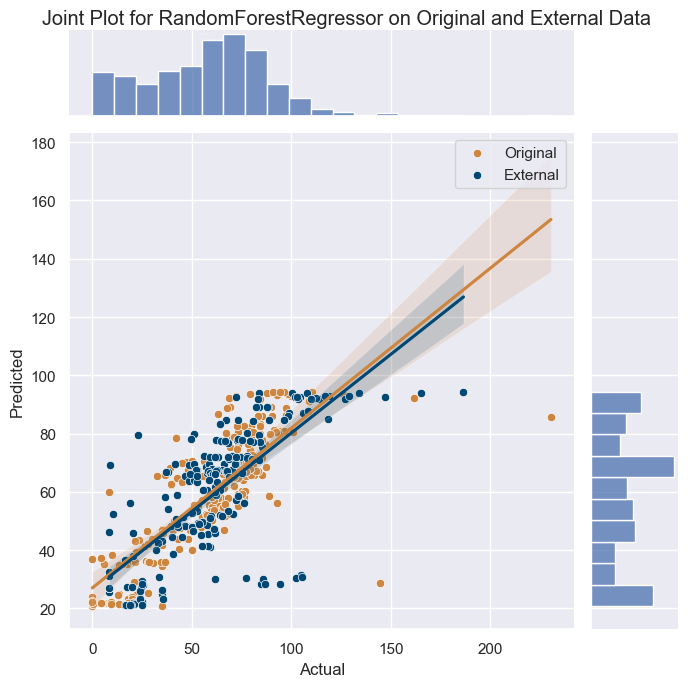

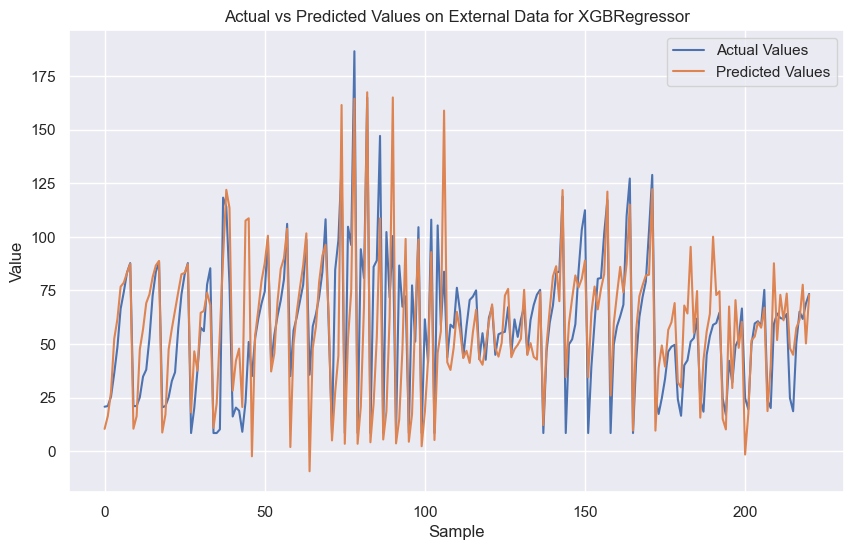

Model: XGBRegressor
Train RMSE: 0.04009255026451088 Train R2: 0.9999985104868409 Train MAE: 0.01586599689106993
Test RMSE: 15.239807009261304 Test R2: 0.6338904469916382 Test MAE: 9.455379140940293
External RMSE: 22.49345320364921 External R2: 0.49071040717429515 External MAE: 15.598002107379696
--------------------------------------------------
Original Dataset - RMSE: 6.8585424419971694, R2: 0.9526504129947898, MAE: 1.9276661273314188
External Dataset - RMSE: 22.49345320364921, R2: 0.49071040717429515, MAE: 15.598002107379696
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000047 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 569
[LightGBM] [Info] Number of data points in the train set: 189, number of used features: 11
[LightGBM] [Info] Start training from score 0.033467
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

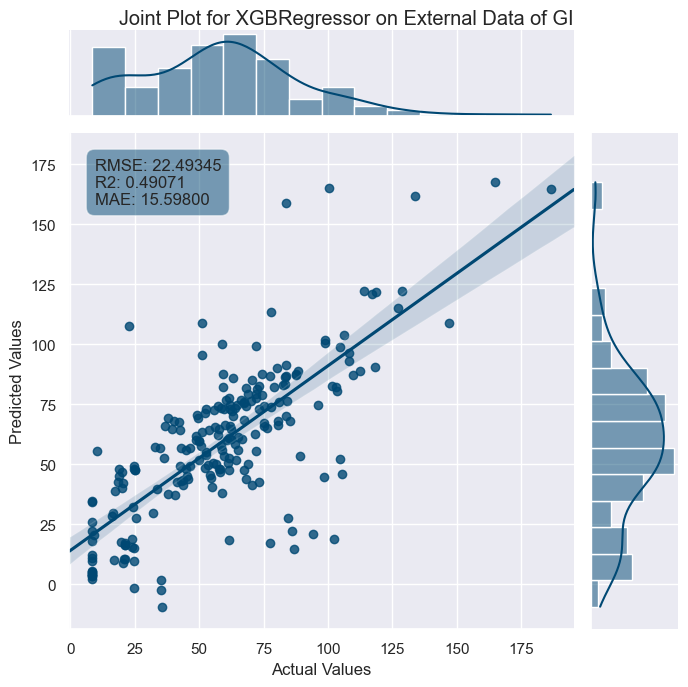

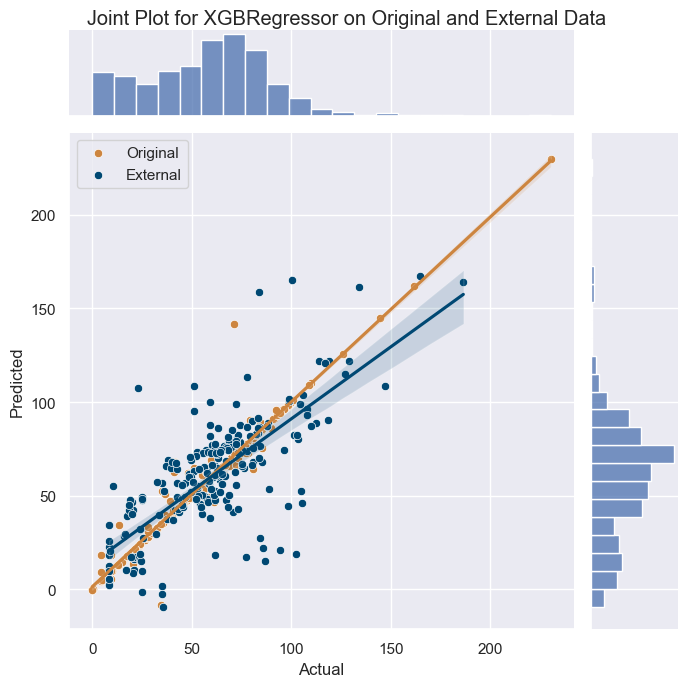

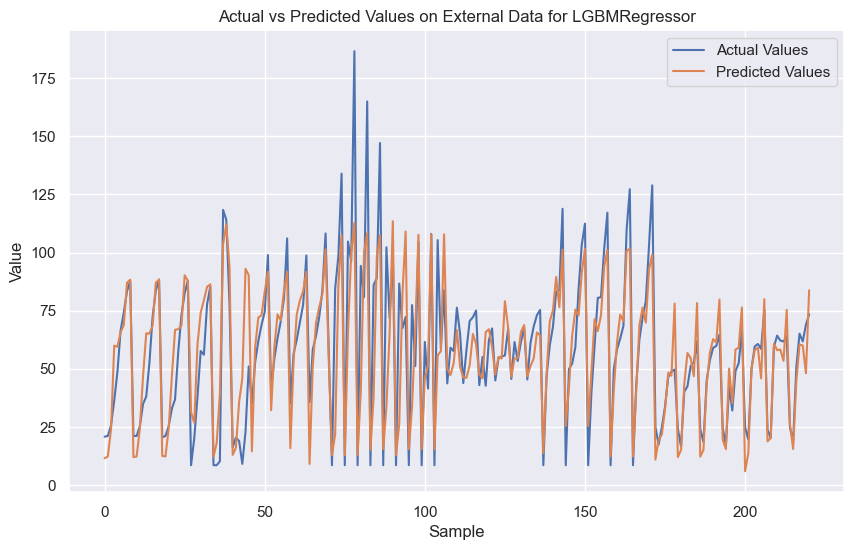

Model: LGBMRegressor
Train RMSE: 12.270460471225288 Train R2: 0.8604792824697901 Train MAE: 6.349437354080271
Test RMSE: 10.665944615606222 Test R2: 0.8206708974671919 Test MAE: 7.623757515658987
External RMSE: 17.506666642098732 External R2: 0.6914969524666656 External MAE: 11.552470810067772
--------------------------------------------------
Original Dataset - RMSE: 11.962887020721238, R2: 0.8559462604477223, MAE: 6.6075275133873514
External Dataset - RMSE: 17.506666642098732, R2: 0.6914969524666656, MAE: 11.552470810067772


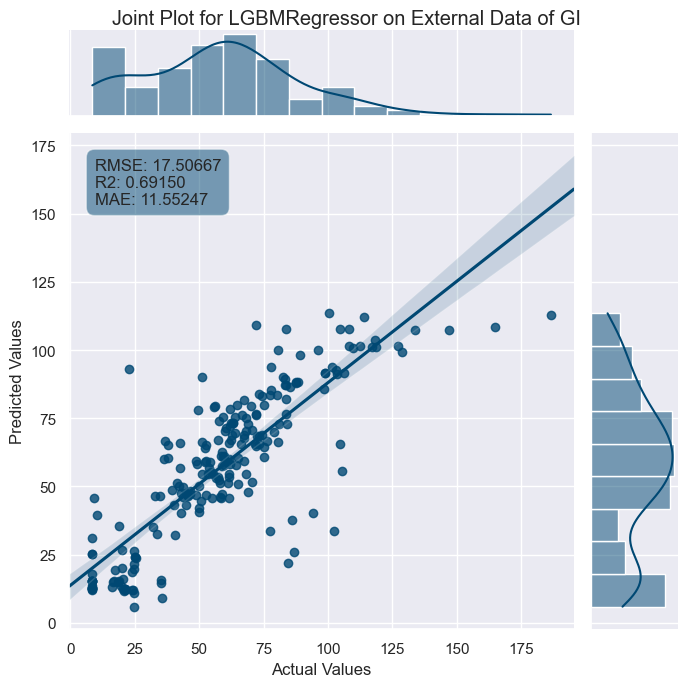

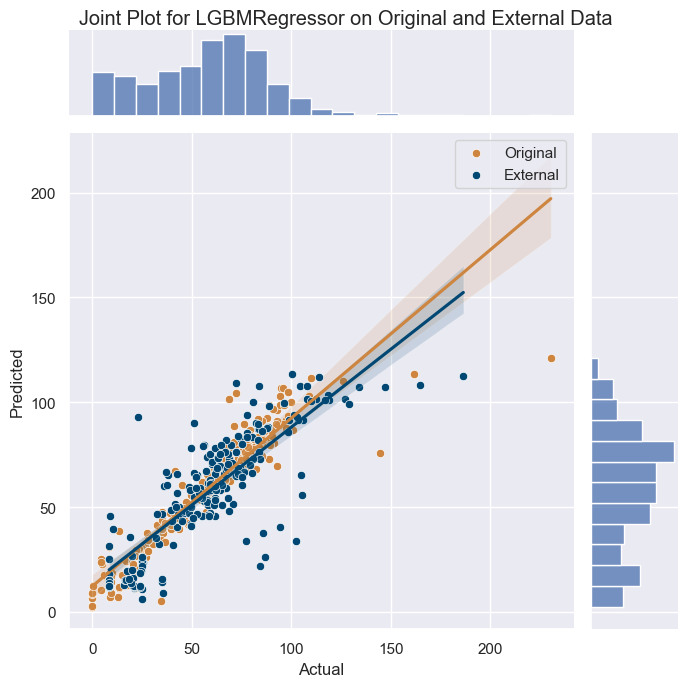

In [9]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from skopt import BayesSearchCV
from skopt.space import Integer
import matplotlib.pyplot as plt
# Load datasets
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)1-1.csv")
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)1-2.csv")

# Normalization function
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

# Normalize datasets
data_normalized, scaler = normalize_data(data)
external_data_normalized, _ = normalize_data(external_data)

# Split the dataset into features and target
X = data_normalized[:, :-1]
y = data_normalized[:, -1]
X_external = external_data_normalized[:, :-1]
y_external = external_data_normalized[:, -1]

# Fit a scaler for the features
feature_scaler = StandardScaler()
X_normalized = feature_scaler.fit_transform(data.drop('GI(%)', axis=1))

# Fit a separate scaler for the target
target_scaler = StandardScaler()
y_normalized = target_scaler.fit_transform(data[['GI(%)']])


# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Define the hyperparameter space
param_grid = {'n_neighbors': Integer(1, 30)}

# Bayesian optimization
knn_search = BayesSearchCV(KNeighborsRegressor(), param_grid, n_iter=32, cv=5, n_jobs=-1, random_state=0)
knn_search.fit(X_train, y_train)

# Best model
knn_best = knn_search.best_estimator_

# Function to evaluate the model
def evaluate_model(model, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    y_pred_external = model.predict(X_external)

    # Denormalize target values and predictions
    y_train_denorm = target_scaler.inverse_transform(y_train.reshape(-1, 1)).flatten()
    y_test_denorm = target_scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
    y_external_denorm = target_scaler.inverse_transform(y_external.reshape(-1, 1)).flatten()
    y_pred_train_denorm = target_scaler.inverse_transform(y_pred_train.reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(y_pred_test.reshape(-1, 1)).flatten()
    y_pred_external_denorm = target_scaler.inverse_transform(y_pred_external.reshape(-1, 1)).flatten()

    # Visualization of predictions on external data
    plt.figure(figsize=(10, 6))
    plt.plot(y_external_denorm, label='Actual Values')
    plt.plot(y_pred_external_denorm, label='Predicted Values')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.title(f'Actual vs Predicted Values on External Data for {model.__class__.__name__}')
    plt.legend()
    plt.show()

    # Metrics for train and test sets
    train_rmse = mean_squared_error(y_train_denorm, y_pred_train_denorm, squared=False)
    test_rmse = mean_squared_error(y_test_denorm, y_pred_test_denorm, squared=False)
    train_r2 = r2_score(y_train_denorm, y_pred_train_denorm)
    test_r2 = r2_score(y_test_denorm, y_pred_test_denorm)
    train_mae = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
    test_mae = mean_absolute_error(y_test_denorm, y_pred_test_denorm)

    # Metrics for external set
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)

    # Text for metrics
    metrics_text = f"RMSE: {external_rmse:.5f}\nR2: {external_r2:.5f}\nMAE: {external_mae:.5f}"

    # Create DataFrame for seaborn joint plot
    external_pred_df = pd.DataFrame({
        'Actual Values': y_external_denorm, 
        'Predicted Values': y_pred_external_denorm
    })

    # Set seaborn theme
    sns.set_theme(style="darkgrid")

    # Create the jointplot for external data with specified color
    g_external = sns.jointplot(x='Actual Values', y='Predicted Values', data=external_pred_df,
                               kind="reg", truncate=False,
                               color="#004873", height=7) 
    
    # Set title for the plot
    g_external.fig.suptitle(f"Joint Plot for {model.__class__.__name__} on External Data of GI")

    # Add metrics as text annotations
    plt.annotate(metrics_text, xy=(0.05, 0.95), xycoords='axes fraction', 
                 ha='left', va='top', bbox=dict(boxstyle='round,pad=0.5', fc="#004873", alpha=0.5))

    # Adjust layout
    g_external.fig.subplots_adjust(top=0.95)

    # Print metrics
    print(f"Model: {model.__class__.__name__}")
    print("Train RMSE:", train_rmse, "Train R2:", train_r2, "Train MAE:", train_mae)
    print("Test RMSE:", test_rmse, "Test R2:", test_r2, "Test MAE:", test_mae)
    print("External RMSE:", external_rmse, "External R2:", external_r2, "External MAE:", external_mae)
    print("--------------------------------------------------")

    # 评估模型并获取训练集和测试集的预测值
    y_pred_train_denorm = target_scaler.inverse_transform(model.predict(X_train).reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(model.predict(X_test).reshape(-1, 1)).flatten()

    # 合并训练集和测试集的数据
    original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
    original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])

    # 创建包含原始数据集和外部数据集的 DataFrame
    combined_df = pd.DataFrame({
        'Actual': np.concatenate([original_data_actual, y_external_denorm]),
        'Predicted': np.concatenate([original_data_predicted, y_pred_external_denorm]),
        'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(y_external_denorm)
    })

    # 创建基础 jointplot
    g_combined = sns.jointplot(x='Actual', y='Predicted', data=combined_df, kind="scatter", height=7)

    # 定义两个数据集的颜色
    colors = ['#CD853F', '#004873']

    # 为两个数据集添加不同颜色的散点图和线性回归线
    for dataset, color in zip(['Original', 'External'], colors):
        subset = combined_df[combined_df['Dataset'] == dataset]
        sns.scatterplot(x=subset['Actual'], y=subset['Predicted'], color=color, ax=g_combined.ax_joint, label=dataset)
        sns.regplot(x=subset['Actual'], y=subset['Predicted'], scatter=False, color=color, ax=g_combined.ax_joint)

    # 设置标题和布局
    g_combined.fig.suptitle(f"Joint Plot for {model.__class__.__name__} on Original and External Data")
    g_combined.fig.subplots_adjust(top=0.95)
    # 计算原始数据集的指标
    train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
    train_r2 = r2_score(original_data_actual, original_data_predicted)
    train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

    # 计算外部数据集的指标
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)

    print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
    print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

# Evaluate KNN model
evaluate_model(knn_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.svm import SVR
from skopt.space import Real

# Define the hyperparameter space for SVM
param_grid_svm = {
    'C': Real(1e-15, 1e+1, prior='log-uniform'),
    'gamma': Real(1e-15, 1e+1, prior='log-uniform'),
    'epsilon': Real(1e-15, 1e+1, prior='log-uniform')
}


# Bayesian optimization
svm_search = BayesSearchCV(SVR(), param_grid_svm, n_iter=32, cv=5, n_jobs=-1, random_state=0)
svm_search.fit(X_train, y_train)

# Best model
svm_best = svm_search.best_estimator_

# Evaluate SVM model
evaluate_model(svm_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.ensemble import RandomForestRegressor
from skopt.space import Integer, Real

# Define the hyperparameter space for Random Forest
param_grid_rf = {
    'n_estimators': Integer(100, 300),
    'max_depth': Integer(10, 50),
    'min_samples_split': Real(0.1, 1.0),
    'min_samples_leaf': Real(0.1, 0.5)
}

# Bayesian optimization
rf_search = BayesSearchCV(RandomForestRegressor(random_state=0), param_grid_rf, n_iter=32, cv=5, n_jobs=-1, random_state=0)
rf_search.fit(X_train, y_train)

# Best model
rf_best = rf_search.best_estimator_

# Evaluate Random Forest model
evaluate_model(rf_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import xgboost as xgb

# Define the hyperparameter space for XGBoost
param_grid_xgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
xgb_search = BayesSearchCV(xgb.XGBRegressor(), param_grid_xgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
xgb_search.fit(X_train, y_train)

# Best model
xgb_best = xgb_search.best_estimator_

# Evaluate XGBoost model
evaluate_model(xgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import lightgbm as lgb

# Define the hyperparameter space for LightGBM
param_grid_lgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(-1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'num_leaves': Integer(20, 300),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
lgb_search = BayesSearchCV(lgb.LGBMRegressor(), param_grid_lgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
lgb_search.fit(X_train, y_train)

# Best model
lgb_best = lgb_search.best_estimator_

# Evaluate LightGBM model
evaluate_model(lgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

In [10]:
# 创建包含模型名称和其最优超参数的字典
model_hyperparams = {
    'KNN': knn_search.best_params_,
    'SVM': svm_search.best_params_,
    'RandomForest': rf_search.best_params_,
    'XGBoost': xgb_search.best_params_,
    'LightGBM': lgb_search.best_params_
}

# 转换为DataFrame
hyperparams_df = pd.DataFrame.from_dict(model_hyperparams, orient='index')

# 重置索引，使模型名称成为一列
hyperparams_df.reset_index(inplace=True)
hyperparams_df.rename(columns={'index': 'Model'}, inplace=True)

# 指定文件路径和名称，这里替换为你的目标路径
file_path = "C:\\Users\\Lenovo\\Desktop\\元学习\\传统模型超参数\\hyperparams_CP_2_1.csv"

# 保存为CSV文件
hyperparams_df.to_csv(file_path, index=False)

e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


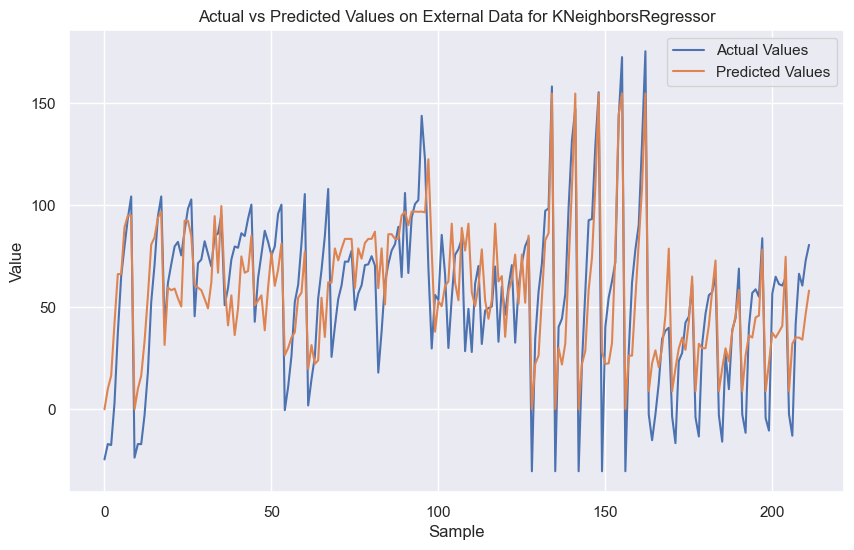

Model: KNeighborsRegressor
Train RMSE: 15.646725955366815 Train R2: 0.8546591371612345 Train MAE: 9.482720582288266
Test RMSE: 18.160851213929362 Test R2: 0.7301447865257387 Test MAE: 11.333956333825002
External RMSE: 22.920639726280342 External R2: 0.6698645443667837 External MAE: 18.808949979876893
--------------------------------------------------
Original Dataset - RMSE: 16.189371241337806, R2: 0.8352980794847986, MAE: 9.8589880114624
External Dataset - RMSE: 22.920639726280342, R2: 0.6698645443667837, MAE: 18.808949979876893


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


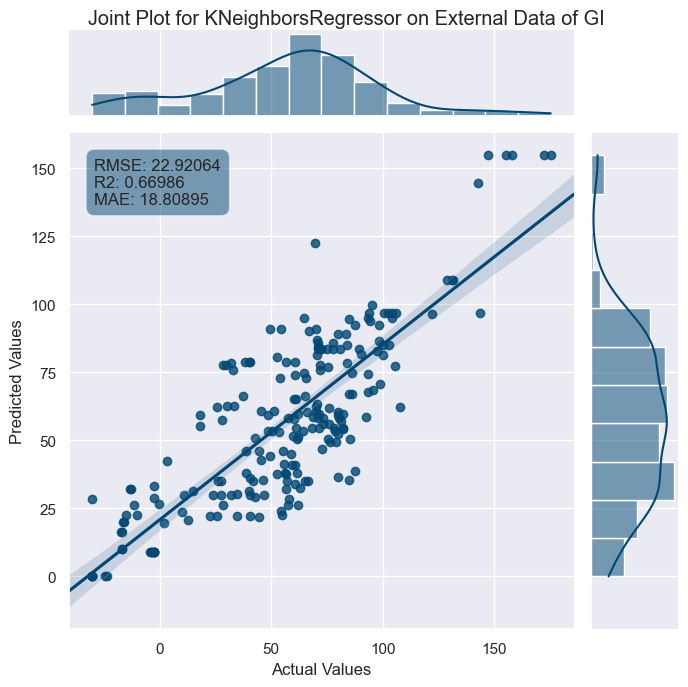

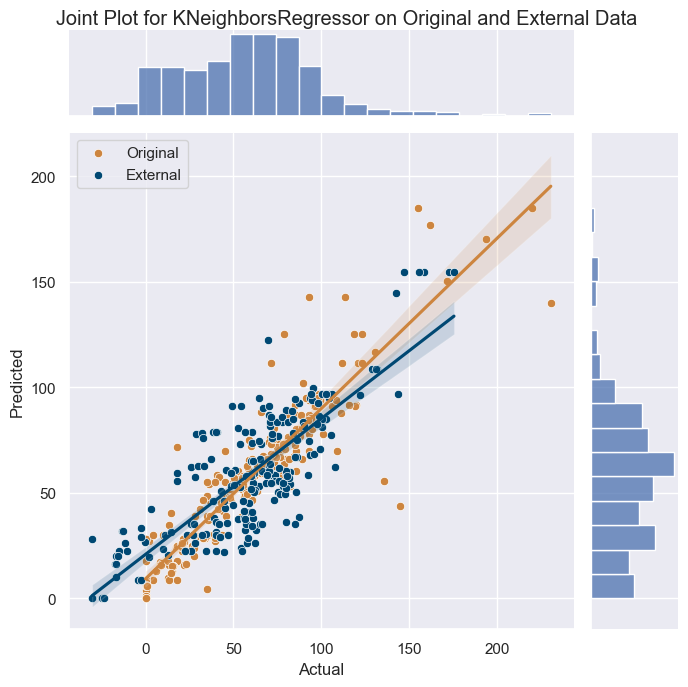

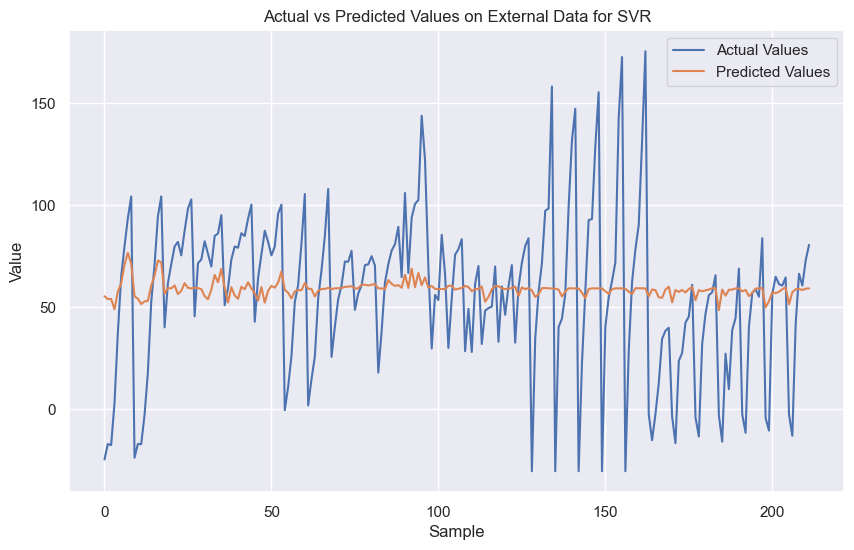

Model: SVR
Train RMSE: 3.005131081493162 Train R2: 0.9946387307026633 Train MAE: 0.36915658623127207
Test RMSE: 22.63589592439077 Test R2: 0.5807686139297809 Test MAE: 15.289561543078346
External RMSE: 38.422001153386766 External R2: 0.07231900263089786 External MAE: 28.720553811001892
--------------------------------------------------
Original Dataset - RMSE: 10.551697841864117, R2: 0.9300345886675319, MAE: 3.4017592197367748
External Dataset - RMSE: 38.422001153386766, R2: 0.07231900263089786, MAE: 28.720553811001892


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


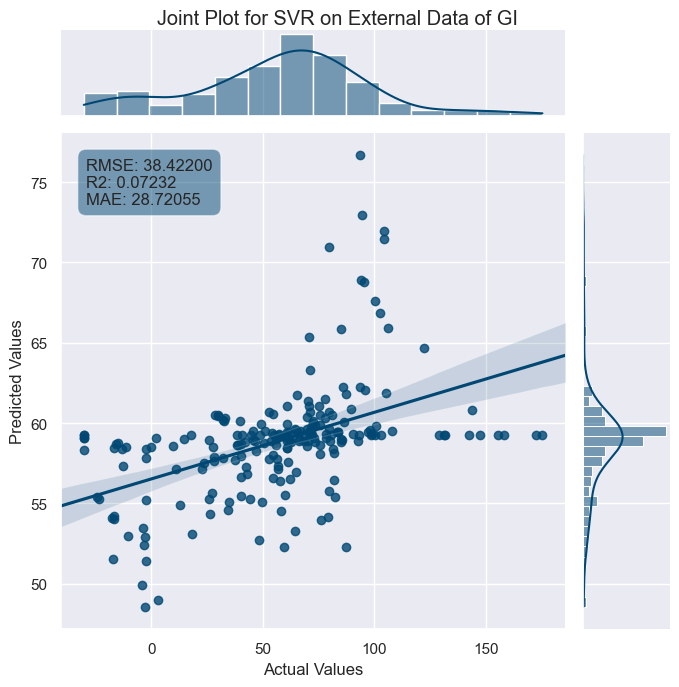

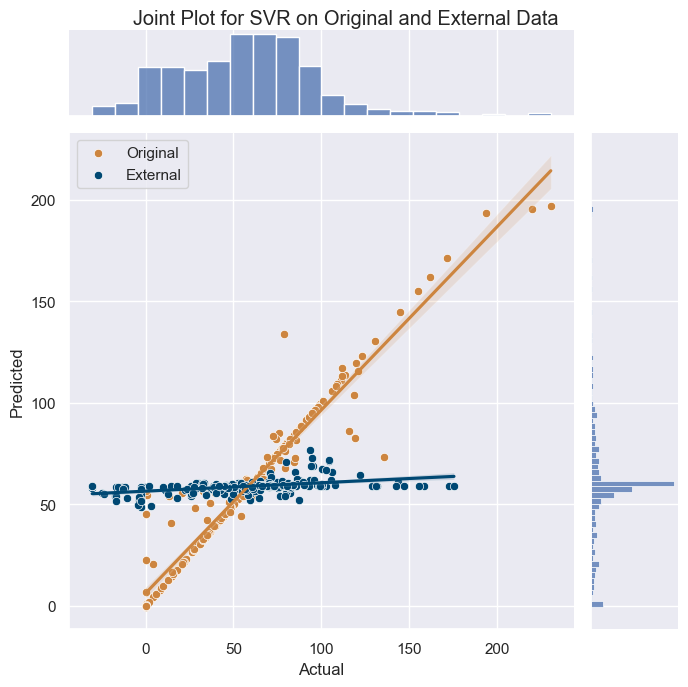

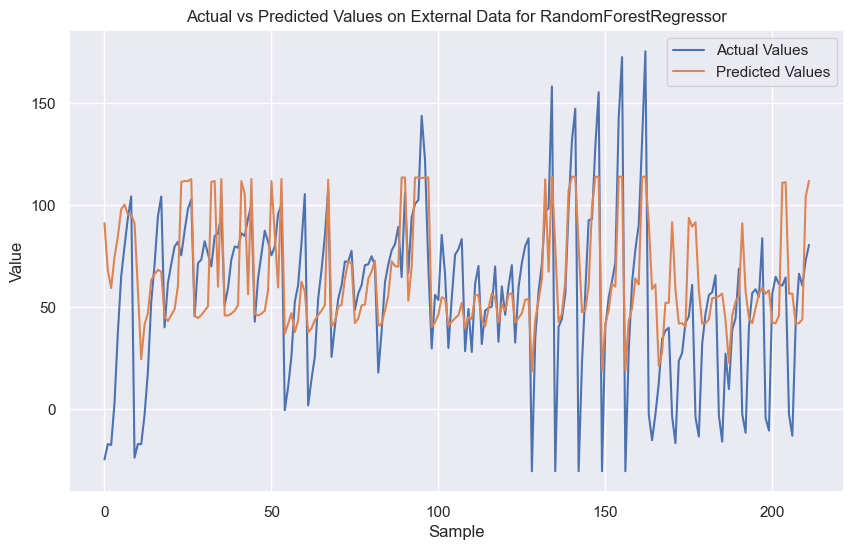

Model: RandomForestRegressor
Train RMSE: 23.02146778981697 Train R2: 0.6853651671868921 Train MAE: 16.130340241073437
Test RMSE: 19.032599248694655 Test R2: 0.7036160932125355 Test MAE: 15.192623567493076
External RMSE: 35.19228010170862 External R2: 0.22172422891433574 External MAE: 25.665167952313553
--------------------------------------------------
Original Dataset - RMSE: 22.2686512336842, R2: 0.6883791368290395, MAE: 15.93974742124003
External Dataset - RMSE: 35.19228010170862, R2: 0.22172422891433574, MAE: 25.665167952313553


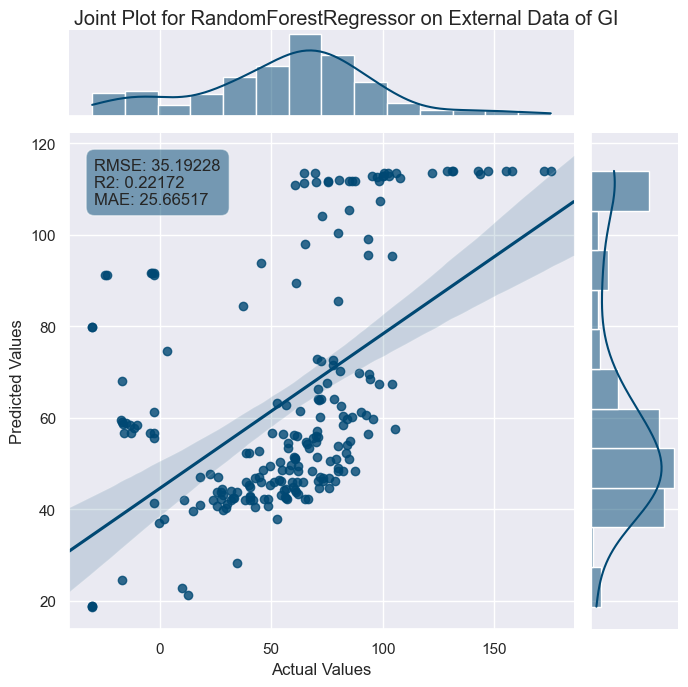

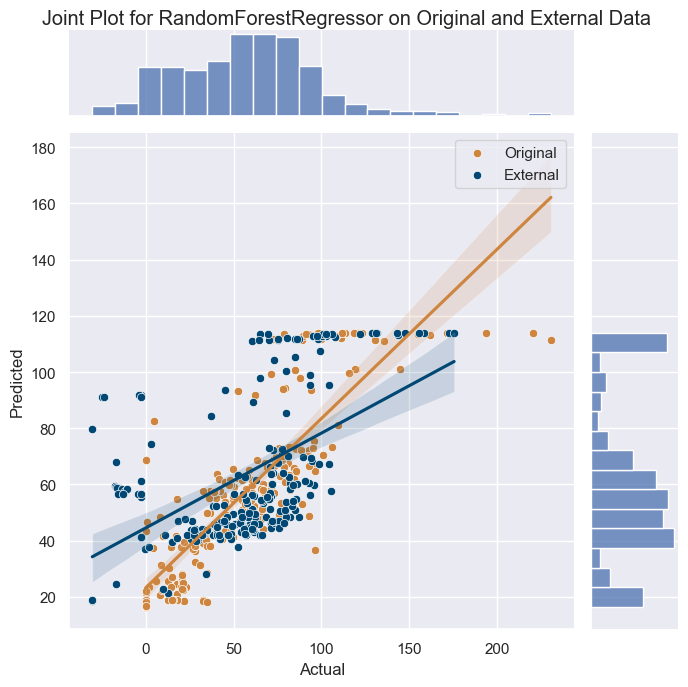

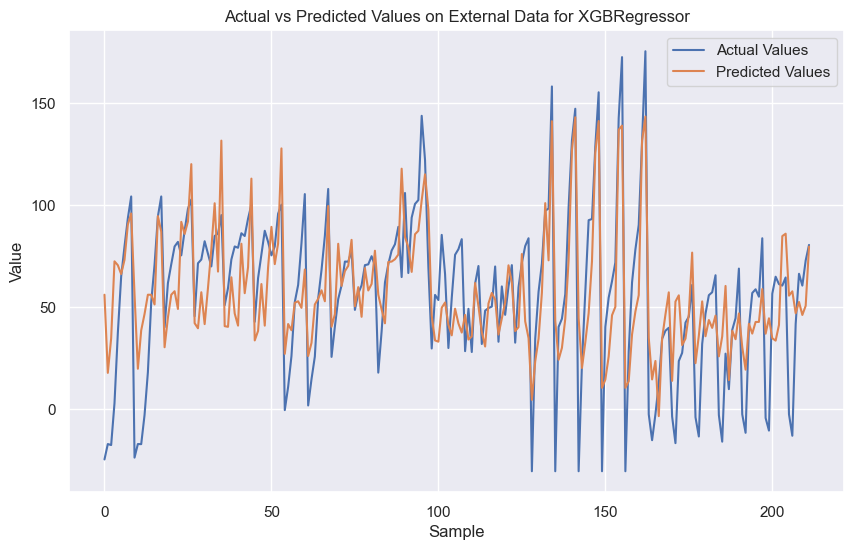

Model: XGBRegressor
Train RMSE: 6.845484333737328 Train R2: 0.9721805113127916 Train MAE: 4.066440915532693
Test RMSE: 16.053876956278295 Test R2: 0.7891283131657127 Test MAE: 9.96409319092444
External RMSE: 26.640053321185153 External R2: 0.5540266794497968 External MAE: 20.88692677925074
--------------------------------------------------
Original Dataset - RMSE: 9.472046334998682, R2: 0.9436198370305521, MAE: 5.265150727604188
External Dataset - RMSE: 26.640053321185153, R2: 0.5540266794497968, MAE: 20.88692677925074
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000085 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 600
[LightGBM] [Info] Number of data points in the train set: 196, number of used features: 11
[LightGBM] [Info] Start training from score 0.011564
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

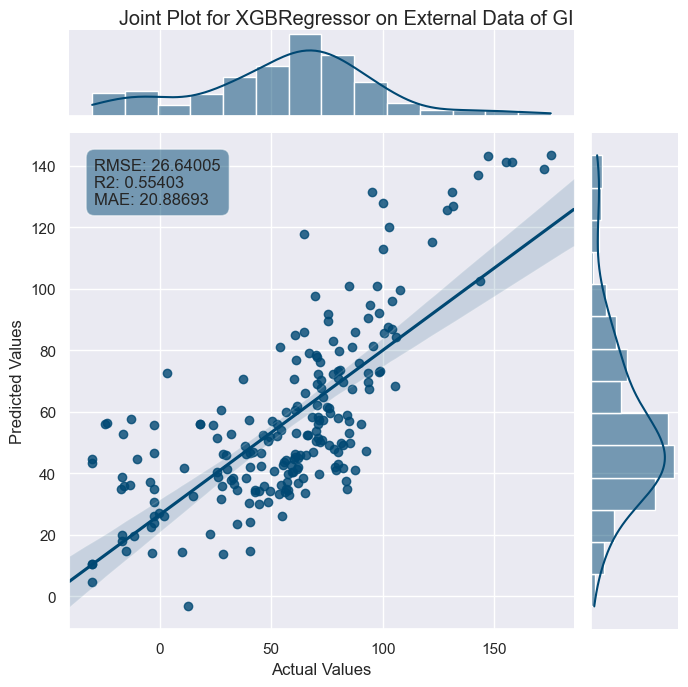

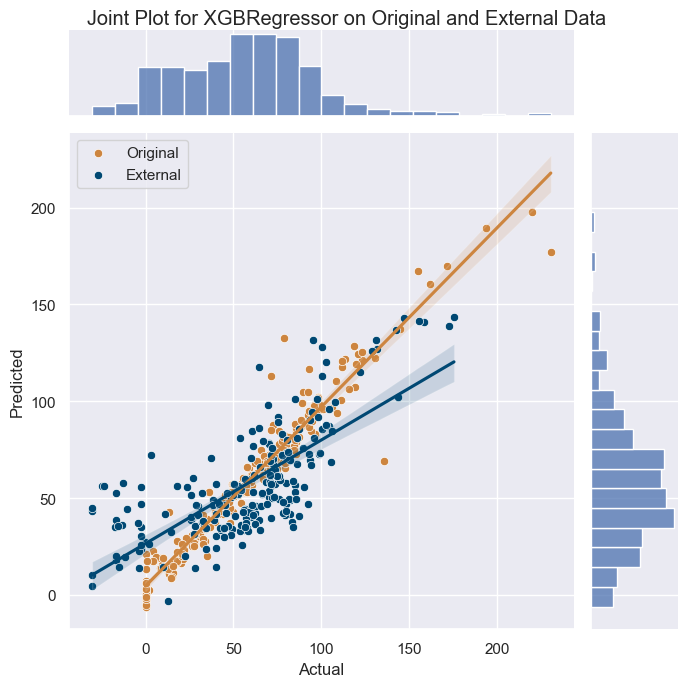

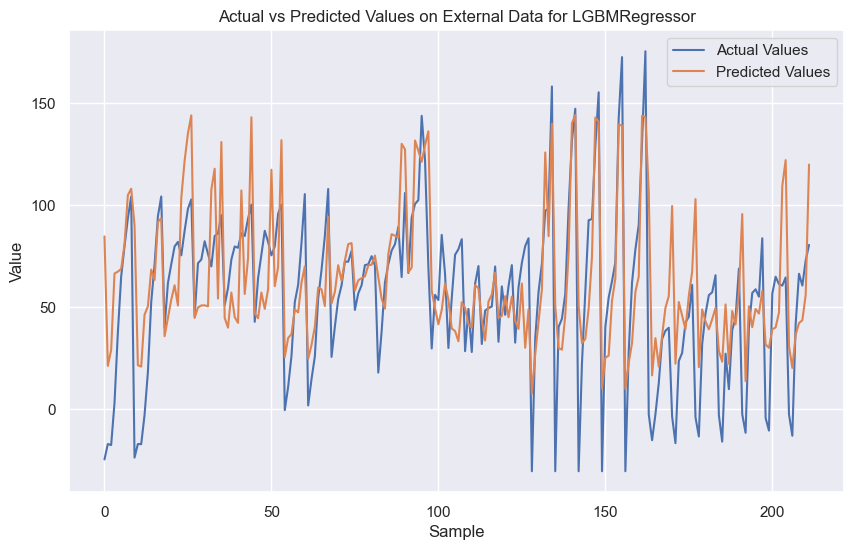

Model: LGBMRegressor
Train RMSE: 9.166640046329611 Train R2: 0.9501160152749342 Train MAE: 5.279828175526047
Test RMSE: 13.944203690769525 Test R2: 0.8409089133245782 Test MAE: 9.393901882471337
External RMSE: 31.08168354100143 External R2: 0.39291742454926837 External MAE: 23.280648334437114
--------------------------------------------------
Original Dataset - RMSE: 10.318384732362441, R2: 0.9330944518524614, MAE: 6.116022018401106
External Dataset - RMSE: 31.08168354100143, R2: 0.39291742454926837, MAE: 23.280648334437114


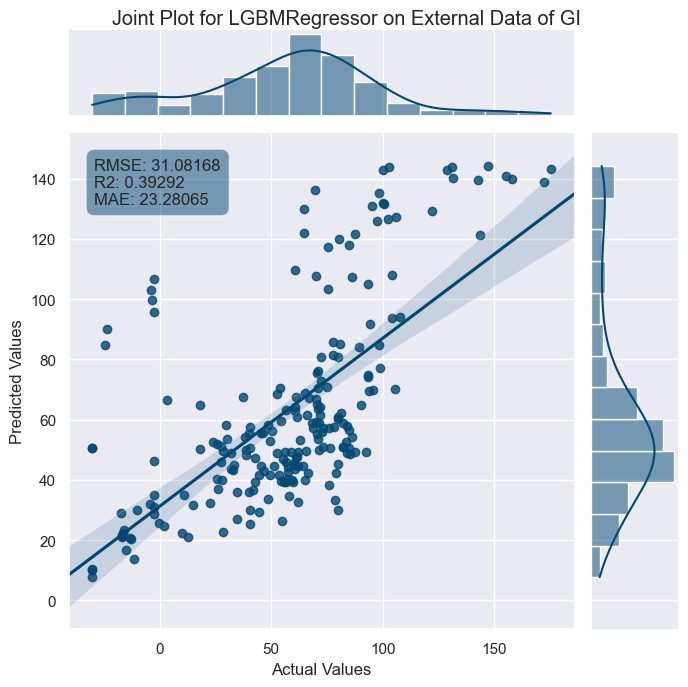

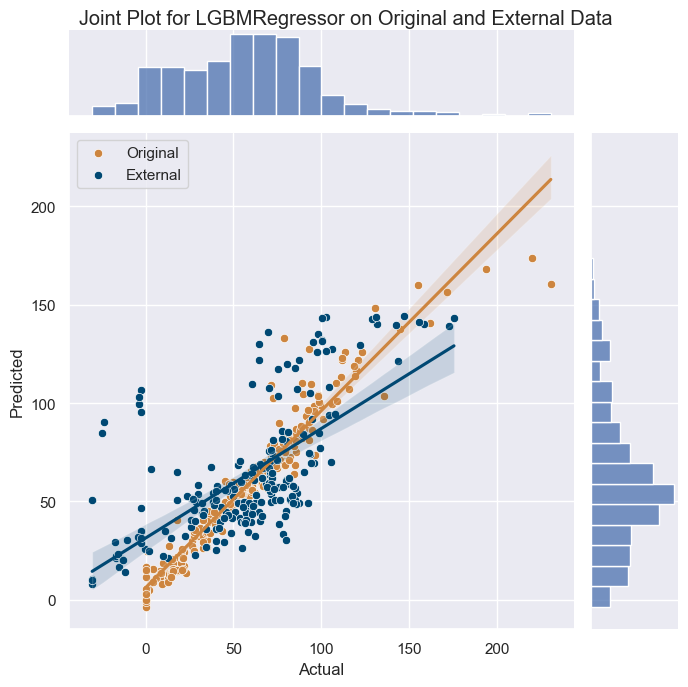

In [11]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from skopt import BayesSearchCV
from skopt.space import Integer
import matplotlib.pyplot as plt
# Load datasets
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)2-1.csv")
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)2-2.csv")

# Normalization function
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

# Normalize datasets
data_normalized, scaler = normalize_data(data)
external_data_normalized, _ = normalize_data(external_data)

# Split the dataset into features and target
X = data_normalized[:, :-1]
y = data_normalized[:, -1]
X_external = external_data_normalized[:, :-1]
y_external = external_data_normalized[:, -1]

# Fit a scaler for the features
feature_scaler = StandardScaler()
X_normalized = feature_scaler.fit_transform(data.drop('GI(%)', axis=1))

# Fit a separate scaler for the target
target_scaler = StandardScaler()
y_normalized = target_scaler.fit_transform(data[['GI(%)']])


# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Define the hyperparameter space
param_grid = {'n_neighbors': Integer(1, 30)}

# Bayesian optimization
knn_search = BayesSearchCV(KNeighborsRegressor(), param_grid, n_iter=32, cv=5, n_jobs=-1, random_state=0)
knn_search.fit(X_train, y_train)

# Best model
knn_best = knn_search.best_estimator_

# Function to evaluate the model
def evaluate_model(model, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    y_pred_external = model.predict(X_external)

    # Denormalize target values and predictions
    y_train_denorm = target_scaler.inverse_transform(y_train.reshape(-1, 1)).flatten()
    y_test_denorm = target_scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
    y_external_denorm = target_scaler.inverse_transform(y_external.reshape(-1, 1)).flatten()
    y_pred_train_denorm = target_scaler.inverse_transform(y_pred_train.reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(y_pred_test.reshape(-1, 1)).flatten()
    y_pred_external_denorm = target_scaler.inverse_transform(y_pred_external.reshape(-1, 1)).flatten()

    # Visualization of predictions on external data
    plt.figure(figsize=(10, 6))
    plt.plot(y_external_denorm, label='Actual Values')
    plt.plot(y_pred_external_denorm, label='Predicted Values')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.title(f'Actual vs Predicted Values on External Data for {model.__class__.__name__}')
    plt.legend()
    plt.show()

    # Metrics for train and test sets
    train_rmse = mean_squared_error(y_train_denorm, y_pred_train_denorm, squared=False)
    test_rmse = mean_squared_error(y_test_denorm, y_pred_test_denorm, squared=False)
    train_r2 = r2_score(y_train_denorm, y_pred_train_denorm)
    test_r2 = r2_score(y_test_denorm, y_pred_test_denorm)
    train_mae = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
    test_mae = mean_absolute_error(y_test_denorm, y_pred_test_denorm)

    # Metrics for external set
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)

    # Text for metrics
    metrics_text = f"RMSE: {external_rmse:.5f}\nR2: {external_r2:.5f}\nMAE: {external_mae:.5f}"

    # Create DataFrame for seaborn joint plot
    external_pred_df = pd.DataFrame({
        'Actual Values': y_external_denorm, 
        'Predicted Values': y_pred_external_denorm
    })

    # Set seaborn theme
    sns.set_theme(style="darkgrid")

    # Create the jointplot for external data with specified color
    g_external = sns.jointplot(x='Actual Values', y='Predicted Values', data=external_pred_df,
                               kind="reg", truncate=False,
                               color="#004873", height=7) 
    
    # Set title for the plot
    g_external.fig.suptitle(f"Joint Plot for {model.__class__.__name__} on External Data of GI")

    # Add metrics as text annotations
    plt.annotate(metrics_text, xy=(0.05, 0.95), xycoords='axes fraction', 
                 ha='left', va='top', bbox=dict(boxstyle='round,pad=0.5', fc="#004873", alpha=0.5))

    # Adjust layout
    g_external.fig.subplots_adjust(top=0.95)

    # Print metrics
    print(f"Model: {model.__class__.__name__}")
    print("Train RMSE:", train_rmse, "Train R2:", train_r2, "Train MAE:", train_mae)
    print("Test RMSE:", test_rmse, "Test R2:", test_r2, "Test MAE:", test_mae)
    print("External RMSE:", external_rmse, "External R2:", external_r2, "External MAE:", external_mae)
    print("--------------------------------------------------")

    # 评估模型并获取训练集和测试集的预测值
    y_pred_train_denorm = target_scaler.inverse_transform(model.predict(X_train).reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(model.predict(X_test).reshape(-1, 1)).flatten()

    # 合并训练集和测试集的数据
    original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
    original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])

    # 创建包含原始数据集和外部数据集的 DataFrame
    combined_df = pd.DataFrame({
        'Actual': np.concatenate([original_data_actual, y_external_denorm]),
        'Predicted': np.concatenate([original_data_predicted, y_pred_external_denorm]),
        'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(y_external_denorm)
    })

    # 创建基础 jointplot
    g_combined = sns.jointplot(x='Actual', y='Predicted', data=combined_df, kind="scatter", height=7)

    # 定义两个数据集的颜色
    colors = ['#CD853F', '#004873']

    # 为两个数据集添加不同颜色的散点图和线性回归线
    for dataset, color in zip(['Original', 'External'], colors):
        subset = combined_df[combined_df['Dataset'] == dataset]
        sns.scatterplot(x=subset['Actual'], y=subset['Predicted'], color=color, ax=g_combined.ax_joint, label=dataset)
        sns.regplot(x=subset['Actual'], y=subset['Predicted'], scatter=False, color=color, ax=g_combined.ax_joint)

    # 设置标题和布局
    g_combined.fig.suptitle(f"Joint Plot for {model.__class__.__name__} on Original and External Data")
    g_combined.fig.subplots_adjust(top=0.95)
    # 计算原始数据集的指标
    train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
    train_r2 = r2_score(original_data_actual, original_data_predicted)
    train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

    # 计算外部数据集的指标
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)


    print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
    print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

# Evaluate KNN model
evaluate_model(knn_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.svm import SVR
from skopt.space import Real

# Define the hyperparameter space for SVM
param_grid_svm = {
    'C': Real(1e-15, 1e+1, prior='log-uniform'),
    'gamma': Real(1e-15, 1e+1, prior='log-uniform'),
    'epsilon': Real(1e-15, 1e+1, prior='log-uniform')
}


# Bayesian optimization
svm_search = BayesSearchCV(SVR(), param_grid_svm, n_iter=32, cv=5, n_jobs=-1, random_state=0)
svm_search.fit(X_train, y_train)

# Best model
svm_best = svm_search.best_estimator_

# Evaluate SVM model
evaluate_model(svm_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.ensemble import RandomForestRegressor
from skopt.space import Integer, Real

# Define the hyperparameter space for Random Forest
param_grid_rf = {
    'n_estimators': Integer(100, 300),
    'max_depth': Integer(10, 50),
    'min_samples_split': Real(0.1, 1.0),
    'min_samples_leaf': Real(0.1, 0.5)
}

# Bayesian optimization
rf_search = BayesSearchCV(RandomForestRegressor(random_state=0), param_grid_rf, n_iter=32, cv=5, n_jobs=-1, random_state=0)
rf_search.fit(X_train, y_train)

# Best model
rf_best = rf_search.best_estimator_

# Evaluate Random Forest model
evaluate_model(rf_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import xgboost as xgb

# Define the hyperparameter space for XGBoost
param_grid_xgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
xgb_search = BayesSearchCV(xgb.XGBRegressor(), param_grid_xgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
xgb_search.fit(X_train, y_train)

# Best model
xgb_best = xgb_search.best_estimator_

# Evaluate XGBoost model
evaluate_model(xgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import lightgbm as lgb

# Define the hyperparameter space for LightGBM
param_grid_lgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(-1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'num_leaves': Integer(20, 300),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
lgb_search = BayesSearchCV(lgb.LGBMRegressor(), param_grid_lgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
lgb_search.fit(X_train, y_train)

# Best model
lgb_best = lgb_search.best_estimator_

# Evaluate LightGBM model
evaluate_model(lgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

In [12]:
# 创建包含模型名称和其最优超参数的字典
model_hyperparams = {
    'KNN': knn_search.best_params_,
    'SVM': svm_search.best_params_,
    'RandomForest': rf_search.best_params_,
    'XGBoost': xgb_search.best_params_,
    'LightGBM': lgb_search.best_params_
}

# 转换为DataFrame
hyperparams_df = pd.DataFrame.from_dict(model_hyperparams, orient='index')

# 重置索引，使模型名称成为一列
hyperparams_df.reset_index(inplace=True)
hyperparams_df.rename(columns={'index': 'Model'}, inplace=True)

# 指定文件路径和名称，这里替换为你的目标路径
file_path = "C:\\Users\\Lenovo\\Desktop\\元学习\\传统模型超参数\\hyperparams_CP_2_2.csv"

# 保存为CSV文件
hyperparams_df.to_csv(file_path, index=False)

e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


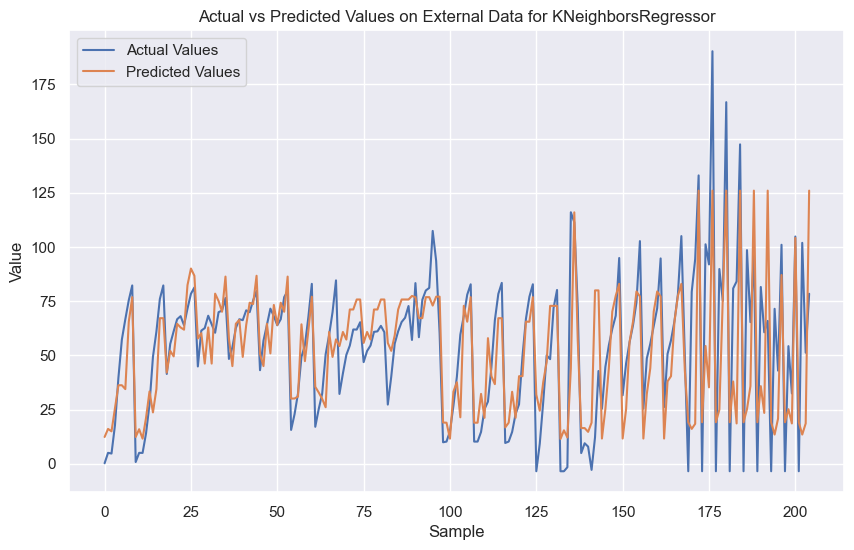

Model: KNeighborsRegressor
Train RMSE: 12.964144248735435 Train R2: 0.844799732934741 Train MAE: 7.386022485458744
Test RMSE: 10.25836598800971 Test R2: 0.9001120370712608 Test MAE: 8.082054051333333
External RMSE: 22.949828712631188 External R2: 0.5111685924440883 External MAE: 16.25218923764023
--------------------------------------------------
Original Dataset - RMSE: 12.466061912842447, R2: 0.8557689505100228, MAE: 7.526329243797102
External Dataset - RMSE: 22.949828712631188, R2: 0.5111685924440883, MAE: 16.25218923764023


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


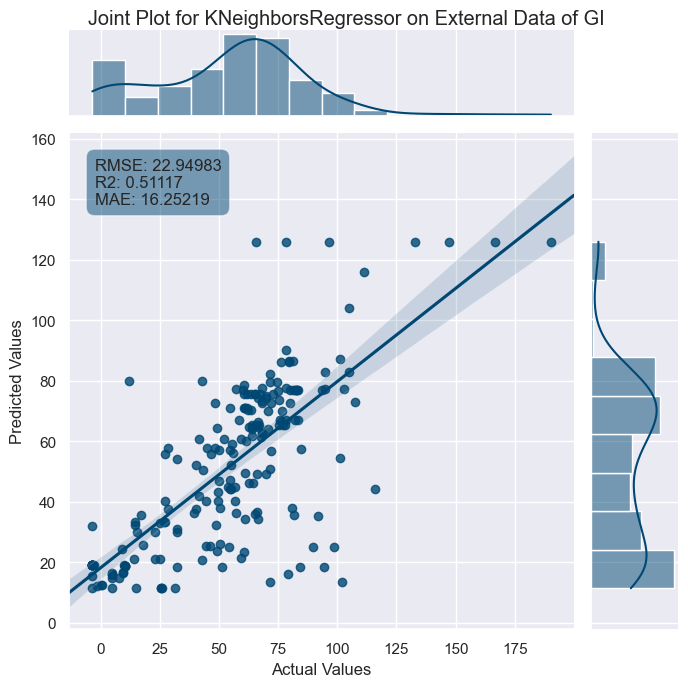

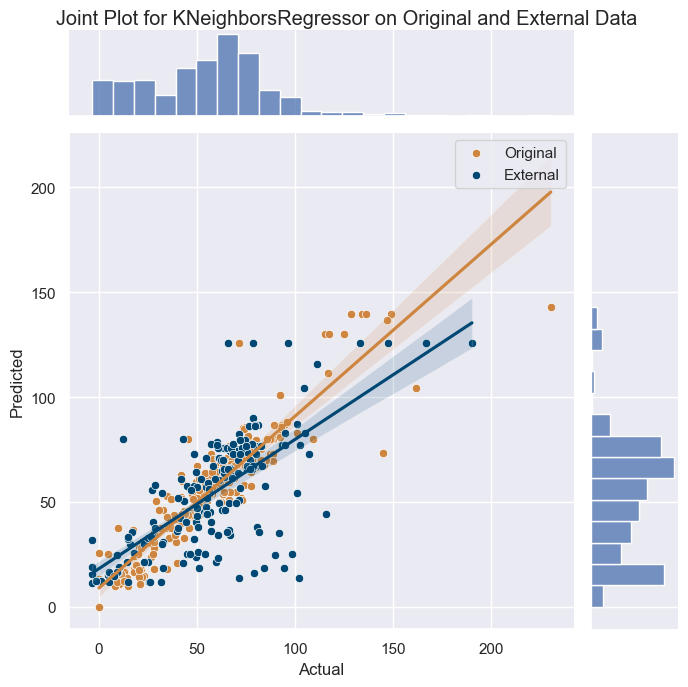

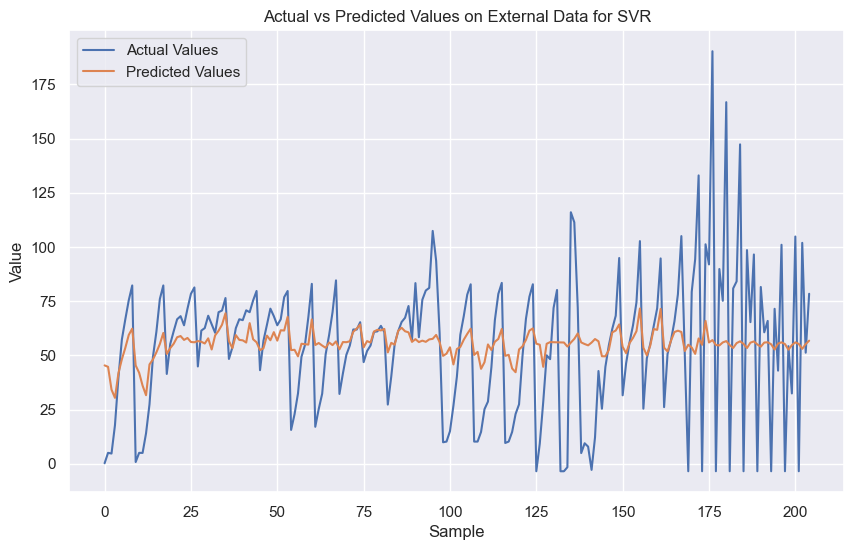

Model: SVR
Train RMSE: 4.334835864159719 Train R2: 0.9826479787614132 Train MAE: 0.33408367157110397
Test RMSE: 13.365484537228795 Test R2: 0.8304389124915577 Test MAE: 10.434740633285795
External RMSE: 30.32607426785838 External R2: 0.14644287270745648 External MAE: 22.049103245992598
--------------------------------------------------
Original Dataset - RMSE: 7.142310334809958, R2: 0.9526546166248431, MAE: 2.37018448203533
External Dataset - RMSE: 30.32607426785838, R2: 0.14644287270745648, MAE: 22.049103245992598


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


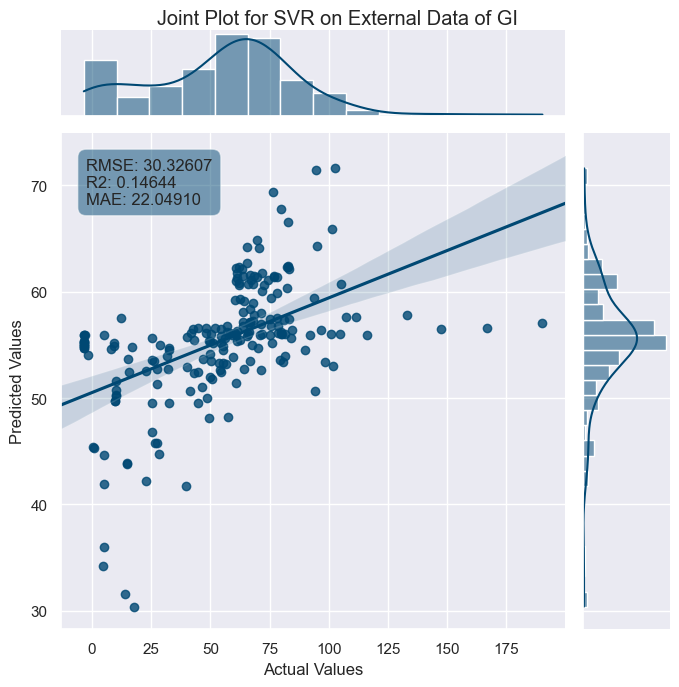

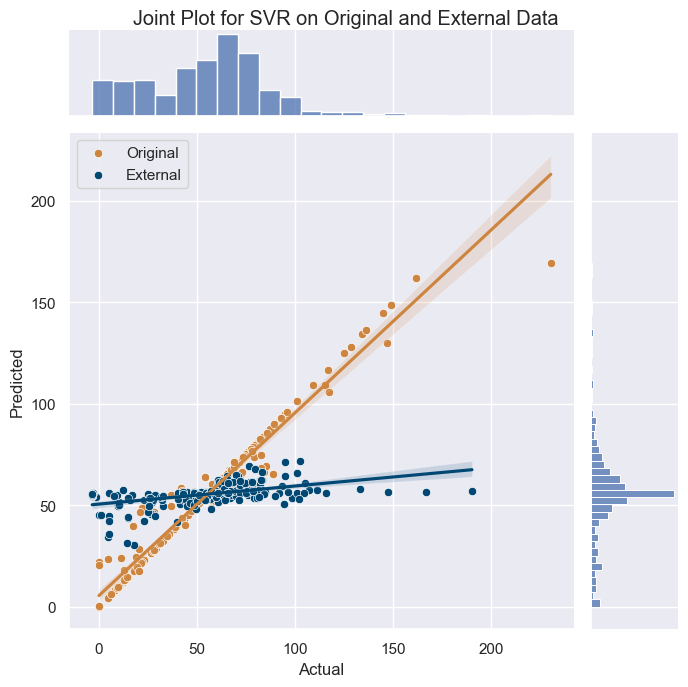

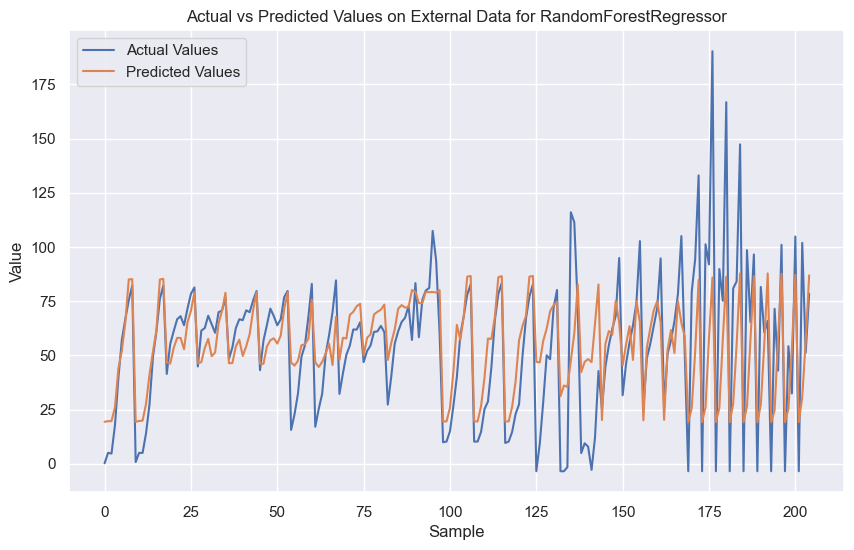

Model: RandomForestRegressor
Train RMSE: 21.198467122098336 Train R2: 0.5850328952775132 Train MAE: 13.37142275416155
Test RMSE: 18.26462994022483 Test R2: 0.6833506998403995 Test MAE: 13.67288585917177
External RMSE: 24.04691257727652 External R2: 0.4633157458176844 External MAE: 16.849244281912906
--------------------------------------------------
Original Dataset - RMSE: 20.640646776059057, R2: 0.6045907649862097, MAE: 13.43219199667349
External Dataset - RMSE: 24.04691257727652, R2: 0.4633157458176844, MAE: 16.849244281912906


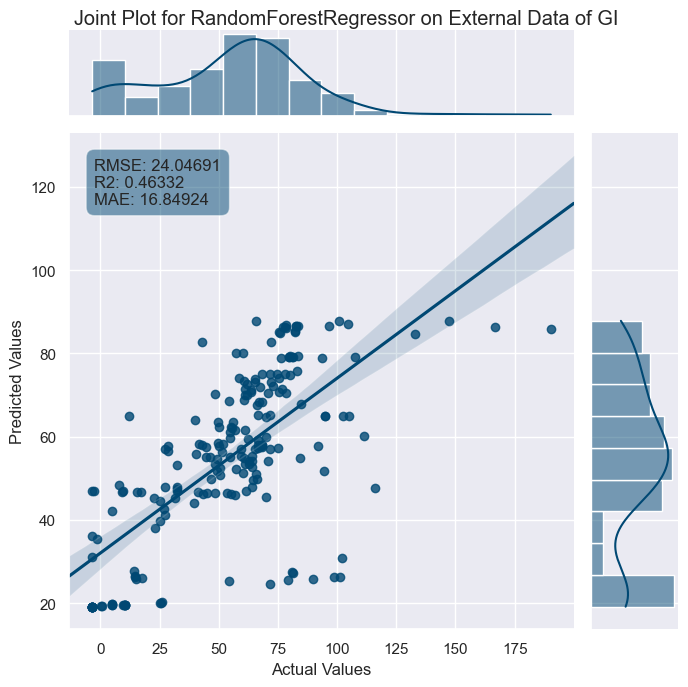

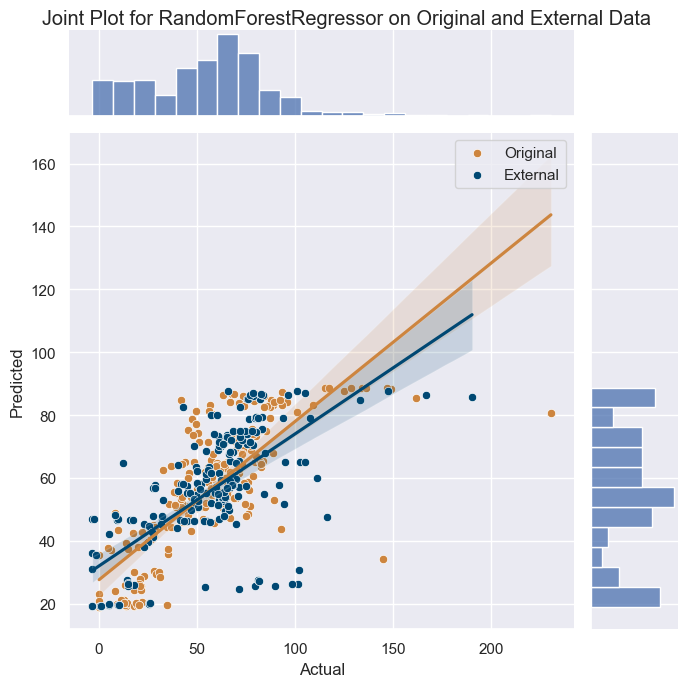

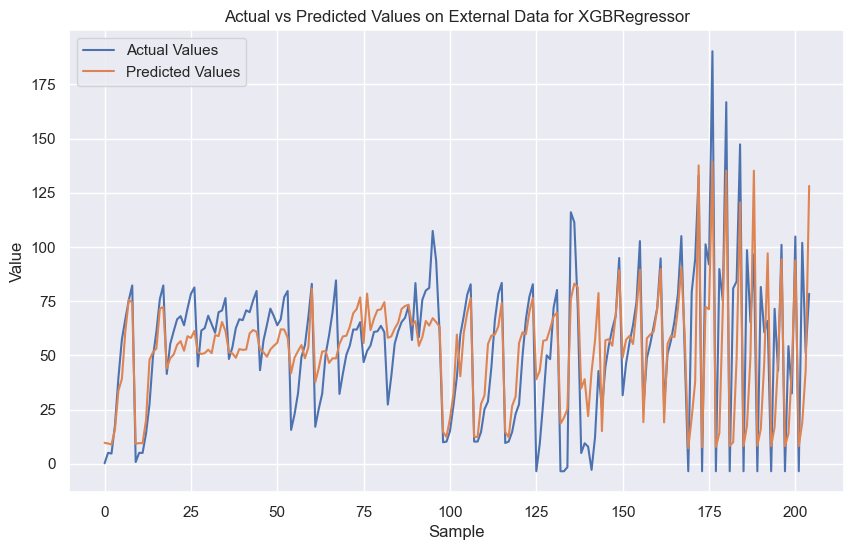

Model: XGBRegressor
Train RMSE: 0.5149905483369261 Train R2: 0.9997550918307545 Train MAE: 0.151216308854378
Test RMSE: 8.547625898524826 Test R2: 0.9306497884423721 Test MAE: 6.459881427039283
External RMSE: 21.459149099546728 External R2: 0.5726091705675785 External MAE: 15.45191928873078
--------------------------------------------------
Original Dataset - RMSE: 3.8651840186816258, R2: 0.9861343397313764, MAE: 1.422923506591256
External Dataset - RMSE: 21.459149099546728, R2: 0.5726091705675785, MAE: 15.45191928873078
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000049 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 613
[LightGBM] [Info] Number of data points in the train set: 202, number of used features: 11
[LightGBM] [Info] Start training from score -0.010440
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

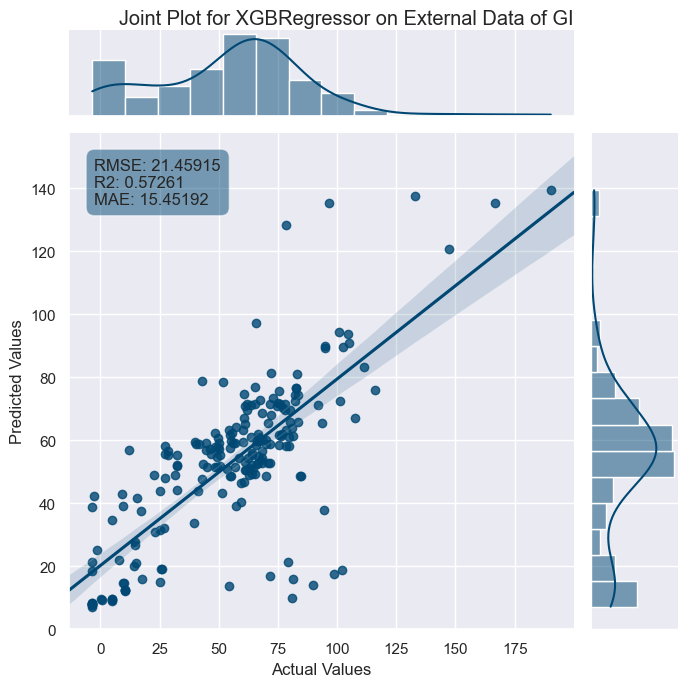

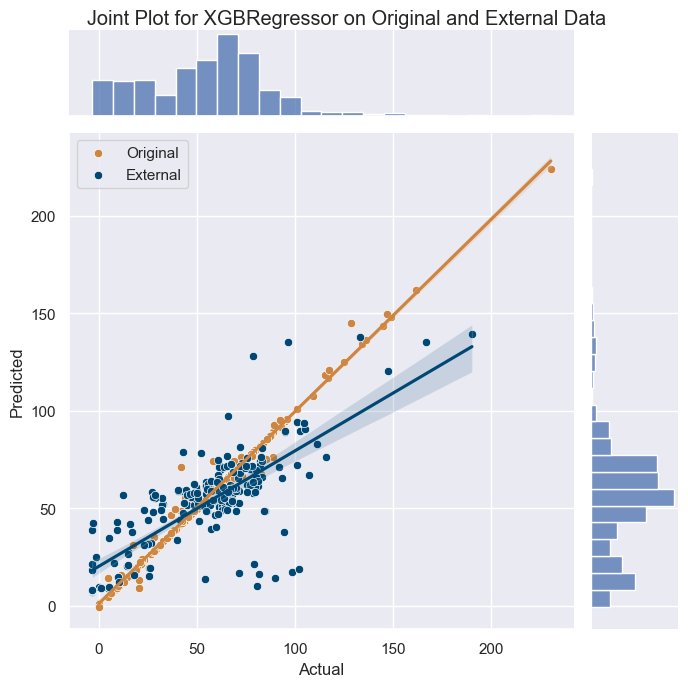

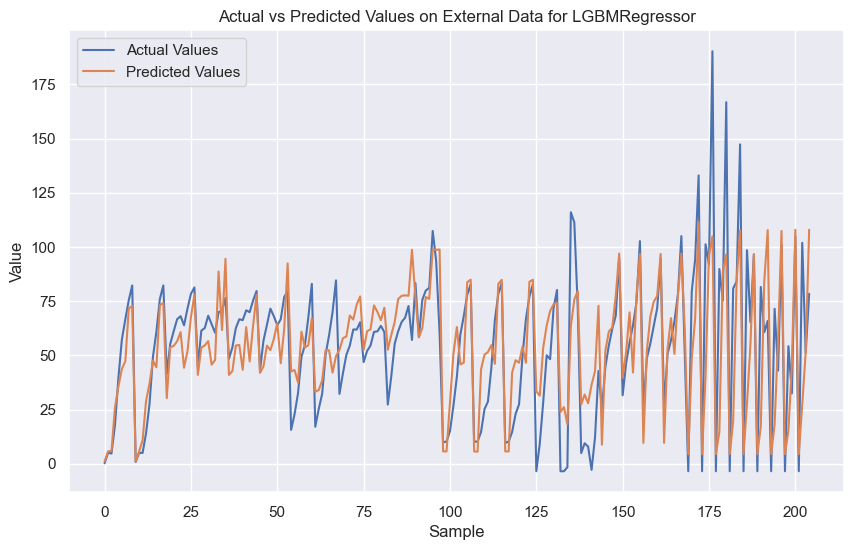

Model: LGBMRegressor
Train RMSE: 14.112031466870913 Train R2: 0.816099111602803 Train MAE: 8.544944796339403
Test RMSE: 11.640914963330244 Test R2: 0.8713733345017408 Test MAE: 8.446960739677701
External RMSE: 21.47774658571192 External R2: 0.5718680564420301 External MAE: 15.21352756820104
--------------------------------------------------
Original Dataset - RMSE: 13.649949144817262, R2: 0.8270732133810679, MAE: 8.525193069502457
External Dataset - RMSE: 21.47774658571192, R2: 0.5718680564420301, MAE: 15.21352756820104


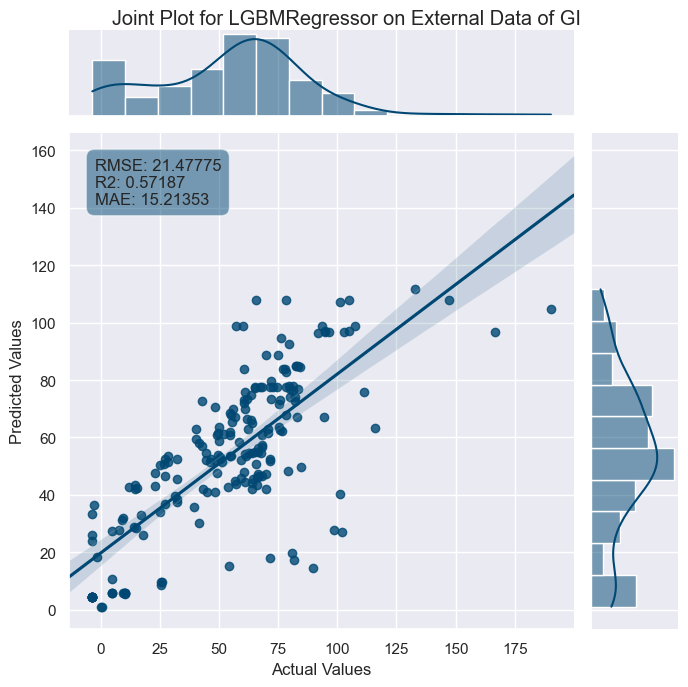

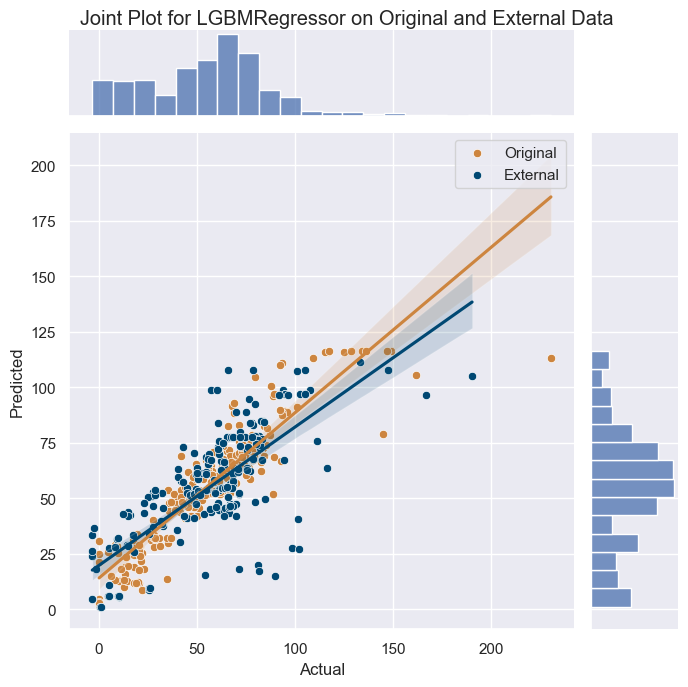

In [13]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from skopt import BayesSearchCV
from skopt.space import Integer
import matplotlib.pyplot as plt
# Load datasets
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)3-1.csv")
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)3-2.csv")

# Normalization function
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

# Normalize datasets
data_normalized, scaler = normalize_data(data)
external_data_normalized, _ = normalize_data(external_data)

# Split the dataset into features and target
X = data_normalized[:, :-1]
y = data_normalized[:, -1]
X_external = external_data_normalized[:, :-1]
y_external = external_data_normalized[:, -1]

# Fit a scaler for the features
feature_scaler = StandardScaler()
X_normalized = feature_scaler.fit_transform(data.drop('GI(%)', axis=1))

# Fit a separate scaler for the target
target_scaler = StandardScaler()
y_normalized = target_scaler.fit_transform(data[['GI(%)']])


# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Define the hyperparameter space
param_grid = {'n_neighbors': Integer(1, 30)}

# Bayesian optimization
knn_search = BayesSearchCV(KNeighborsRegressor(), param_grid, n_iter=32, cv=5, n_jobs=-1, random_state=0)
knn_search.fit(X_train, y_train)

# Best model
knn_best = knn_search.best_estimator_

# Function to evaluate the model
def evaluate_model(model, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    y_pred_external = model.predict(X_external)

    # Denormalize target values and predictions
    y_train_denorm = target_scaler.inverse_transform(y_train.reshape(-1, 1)).flatten()
    y_test_denorm = target_scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
    y_external_denorm = target_scaler.inverse_transform(y_external.reshape(-1, 1)).flatten()
    y_pred_train_denorm = target_scaler.inverse_transform(y_pred_train.reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(y_pred_test.reshape(-1, 1)).flatten()
    y_pred_external_denorm = target_scaler.inverse_transform(y_pred_external.reshape(-1, 1)).flatten()

    # Visualization of predictions on external data
    plt.figure(figsize=(10, 6))
    plt.plot(y_external_denorm, label='Actual Values')
    plt.plot(y_pred_external_denorm, label='Predicted Values')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.title(f'Actual vs Predicted Values on External Data for {model.__class__.__name__}')
    plt.legend()
    plt.show()

    # Metrics for train and test sets
    train_rmse = mean_squared_error(y_train_denorm, y_pred_train_denorm, squared=False)
    test_rmse = mean_squared_error(y_test_denorm, y_pred_test_denorm, squared=False)
    train_r2 = r2_score(y_train_denorm, y_pred_train_denorm)
    test_r2 = r2_score(y_test_denorm, y_pred_test_denorm)
    train_mae = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
    test_mae = mean_absolute_error(y_test_denorm, y_pred_test_denorm)

    # Metrics for external set
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)

    # Text for metrics
    metrics_text = f"RMSE: {external_rmse:.5f}\nR2: {external_r2:.5f}\nMAE: {external_mae:.5f}"

    # Create DataFrame for seaborn joint plot
    external_pred_df = pd.DataFrame({
        'Actual Values': y_external_denorm, 
        'Predicted Values': y_pred_external_denorm
    })

    # Set seaborn theme
    sns.set_theme(style="darkgrid")

    # Create the jointplot for external data with specified color
    g_external = sns.jointplot(x='Actual Values', y='Predicted Values', data=external_pred_df,
                               kind="reg", truncate=False,
                               color="#004873", height=7) 
    
    # Set title for the plot
    g_external.fig.suptitle(f"Joint Plot for {model.__class__.__name__} on External Data of GI")

    # Add metrics as text annotations
    plt.annotate(metrics_text, xy=(0.05, 0.95), xycoords='axes fraction', 
                 ha='left', va='top', bbox=dict(boxstyle='round,pad=0.5', fc="#004873", alpha=0.5))

    # Adjust layout
    g_external.fig.subplots_adjust(top=0.95)

    # Print metrics
    print(f"Model: {model.__class__.__name__}")
    print("Train RMSE:", train_rmse, "Train R2:", train_r2, "Train MAE:", train_mae)
    print("Test RMSE:", test_rmse, "Test R2:", test_r2, "Test MAE:", test_mae)
    print("External RMSE:", external_rmse, "External R2:", external_r2, "External MAE:", external_mae)
    print("--------------------------------------------------")

    # 评估模型并获取训练集和测试集的预测值
    y_pred_train_denorm = target_scaler.inverse_transform(model.predict(X_train).reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(model.predict(X_test).reshape(-1, 1)).flatten()

    # 合并训练集和测试集的数据
    original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
    original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])

    # 创建包含原始数据集和外部数据集的 DataFrame
    combined_df = pd.DataFrame({
        'Actual': np.concatenate([original_data_actual, y_external_denorm]),
        'Predicted': np.concatenate([original_data_predicted, y_pred_external_denorm]),
        'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(y_external_denorm)
    })

    # 创建基础 jointplot
    g_combined = sns.jointplot(x='Actual', y='Predicted', data=combined_df, kind="scatter", height=7)

    # 定义两个数据集的颜色
    colors = ['#CD853F', '#004873']

    # 为两个数据集添加不同颜色的散点图和线性回归线
    for dataset, color in zip(['Original', 'External'], colors):
        subset = combined_df[combined_df['Dataset'] == dataset]
        sns.scatterplot(x=subset['Actual'], y=subset['Predicted'], color=color, ax=g_combined.ax_joint, label=dataset)
        sns.regplot(x=subset['Actual'], y=subset['Predicted'], scatter=False, color=color, ax=g_combined.ax_joint)

    # 设置标题和布局
    g_combined.fig.suptitle(f"Joint Plot for {model.__class__.__name__} on Original and External Data")
    g_combined.fig.subplots_adjust(top=0.95)
    # 计算原始数据集的指标
    train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
    train_r2 = r2_score(original_data_actual, original_data_predicted)
    train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

    # 计算外部数据集的指标
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)


    print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
    print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

# Evaluate KNN model
evaluate_model(knn_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.svm import SVR
from skopt.space import Real

# Define the hyperparameter space for SVM
param_grid_svm = {
    'C': Real(1e-15, 1e+1, prior='log-uniform'),
    'gamma': Real(1e-15, 1e+1, prior='log-uniform'),
    'epsilon': Real(1e-15, 1e+1, prior='log-uniform')
}

# Bayesian optimization
svm_search = BayesSearchCV(SVR(), param_grid_svm, n_iter=32, cv=5, n_jobs=-1, random_state=0)
svm_search.fit(X_train, y_train)

# Best model
svm_best = svm_search.best_estimator_

# Evaluate SVM model
evaluate_model(svm_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.ensemble import RandomForestRegressor
from skopt.space import Integer, Real

# Define the hyperparameter space for Random Forest
param_grid_rf = {
    'n_estimators': Integer(100, 300),
    'max_depth': Integer(10, 50),
    'min_samples_split': Real(0.1, 1.0),
    'min_samples_leaf': Real(0.1, 0.5)
}

# Bayesian optimization
rf_search = BayesSearchCV(RandomForestRegressor(random_state=0), param_grid_rf, n_iter=32, cv=5, n_jobs=-1, random_state=0)
rf_search.fit(X_train, y_train)

# Best model
rf_best = rf_search.best_estimator_

# Evaluate Random Forest model
evaluate_model(rf_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import xgboost as xgb

# Define the hyperparameter space for XGBoost
param_grid_xgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
xgb_search = BayesSearchCV(xgb.XGBRegressor(), param_grid_xgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
xgb_search.fit(X_train, y_train)

# Best model
xgb_best = xgb_search.best_estimator_

# Evaluate XGBoost model
evaluate_model(xgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import lightgbm as lgb

# Define the hyperparameter space for LightGBM
param_grid_lgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(-1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'num_leaves': Integer(20, 300),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
lgb_search = BayesSearchCV(lgb.LGBMRegressor(), param_grid_lgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
lgb_search.fit(X_train, y_train)

# Best model
lgb_best = lgb_search.best_estimator_

# Evaluate LightGBM model
evaluate_model(lgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

In [14]:
# 创建包含模型名称和其最优超参数的字典
model_hyperparams = {
    'KNN': knn_search.best_params_,
    'SVM': svm_search.best_params_,
    'RandomForest': rf_search.best_params_,
    'XGBoost': xgb_search.best_params_,
    'LightGBM': lgb_search.best_params_
}

# 转换为DataFrame
hyperparams_df = pd.DataFrame.from_dict(model_hyperparams, orient='index')

# 重置索引，使模型名称成为一列
hyperparams_df.reset_index(inplace=True)
hyperparams_df.rename(columns={'index': 'Model'}, inplace=True)

# 指定文件路径和名称，这里替换为你的目标路径
file_path = "C:\\Users\\Lenovo\\Desktop\\元学习\\传统模型超参数\\hyperparams_CP_2_3.csv"

# 保存为CSV文件
hyperparams_df.to_csv(file_path, index=False)

e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


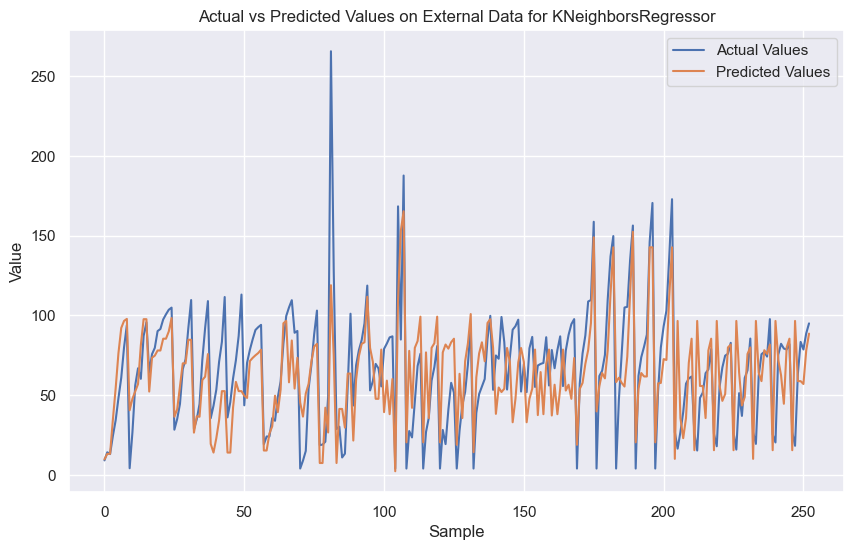

Model: KNeighborsRegressor
Train RMSE: 14.315976627631922 Train R2: 0.8540560385088153 Train MAE: 8.129613016643294
Test RMSE: 13.682252929136922 Test R2: 0.8591909280507822 Test MAE: 9.270715434573168
External RMSE: 28.291013830297686 External R2: 0.4240652163047729 External MAE: 21.26231473337289
--------------------------------------------------
Original Dataset - RMSE: 14.191495991814888, R2: 0.8550785587860995, MAE: 8.357833500229269
External Dataset - RMSE: 28.291013830297686, R2: 0.4240652163047729, MAE: 21.26231473337289


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


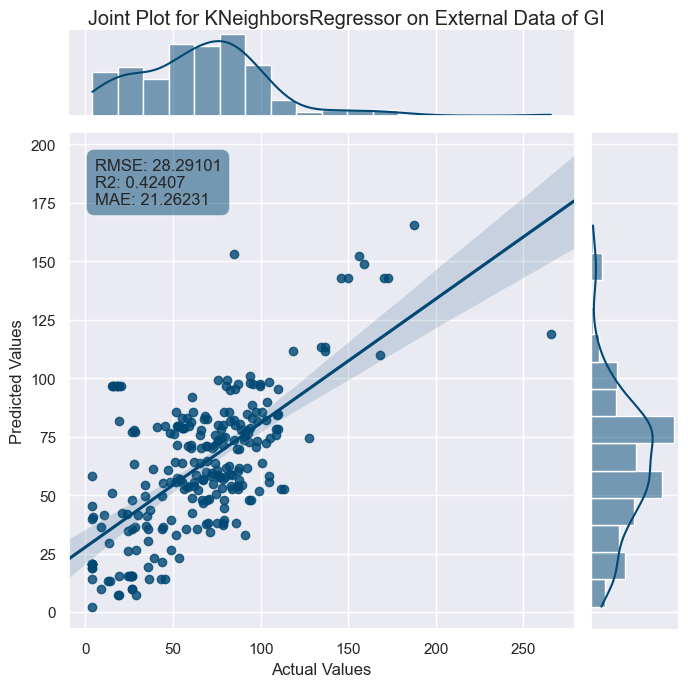

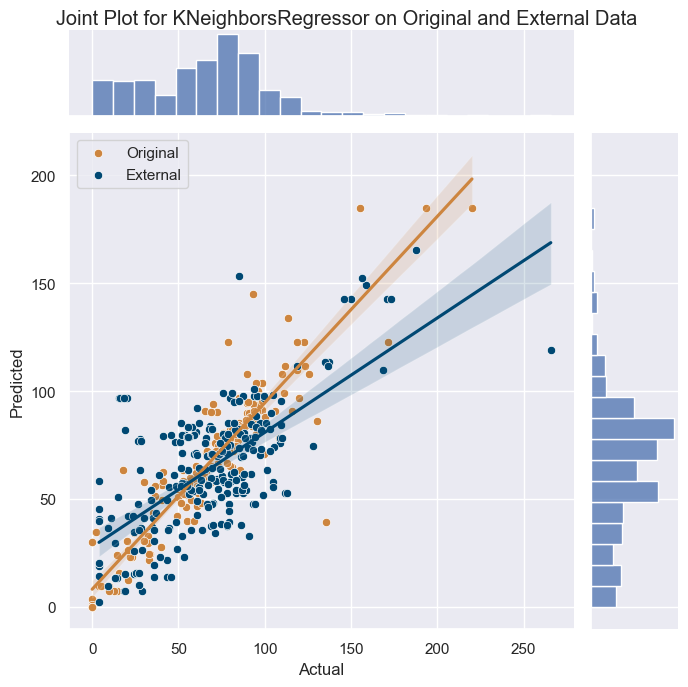

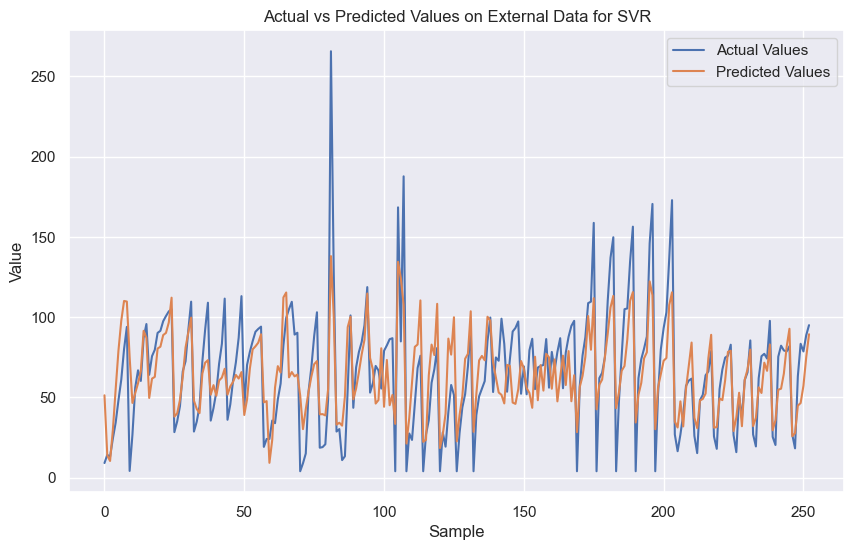

Model: SVR
Train RMSE: 7.804122676079567 Train R2: 0.9566297081735765 Train MAE: 2.5922466395463752
Test RMSE: 12.54298750098253 Test R2: 0.8816638634917939 Test MAE: 8.67991696018194
External RMSE: 23.99021324417242 External R2: 0.5858625516957592 External MAE: 18.377354577873763
--------------------------------------------------
Original Dataset - RMSE: 8.954818350173289, R2: 0.9422981353536851, MAE: 3.8097807036734883
External Dataset - RMSE: 23.99021324417242, R2: 0.5858625516957592, MAE: 18.377354577873763


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


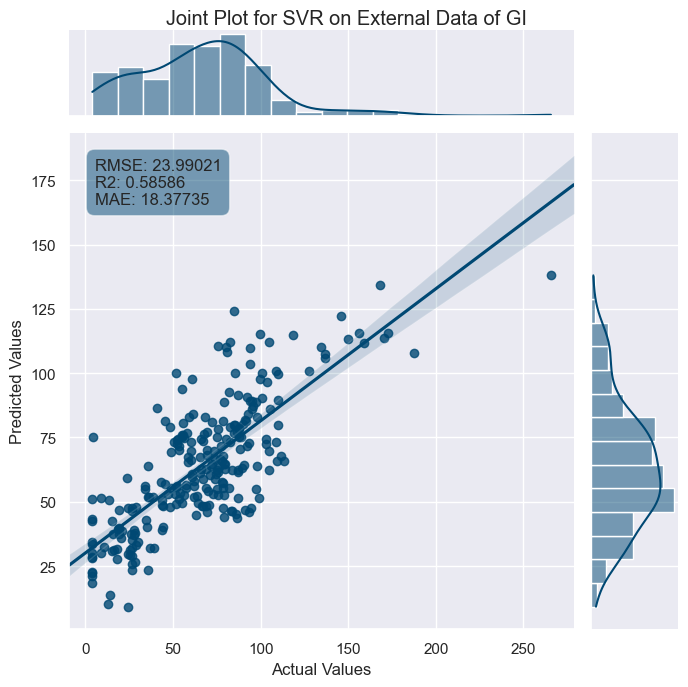

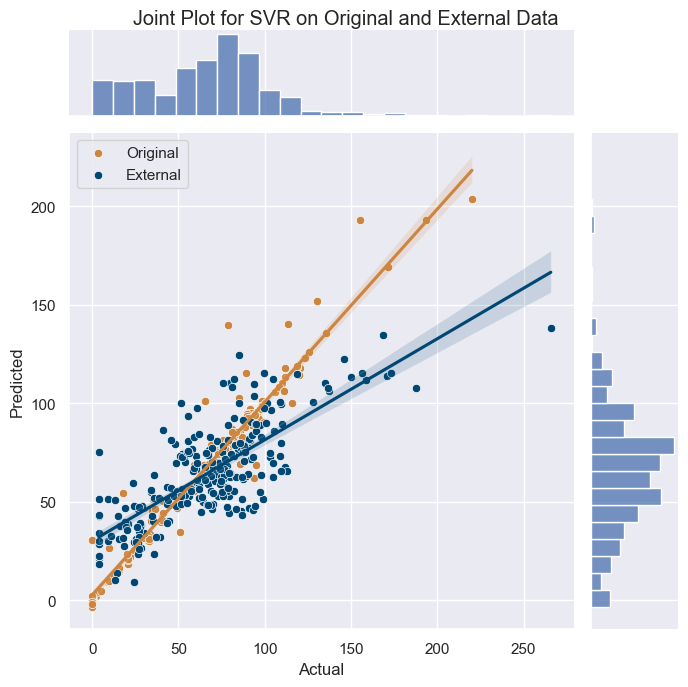

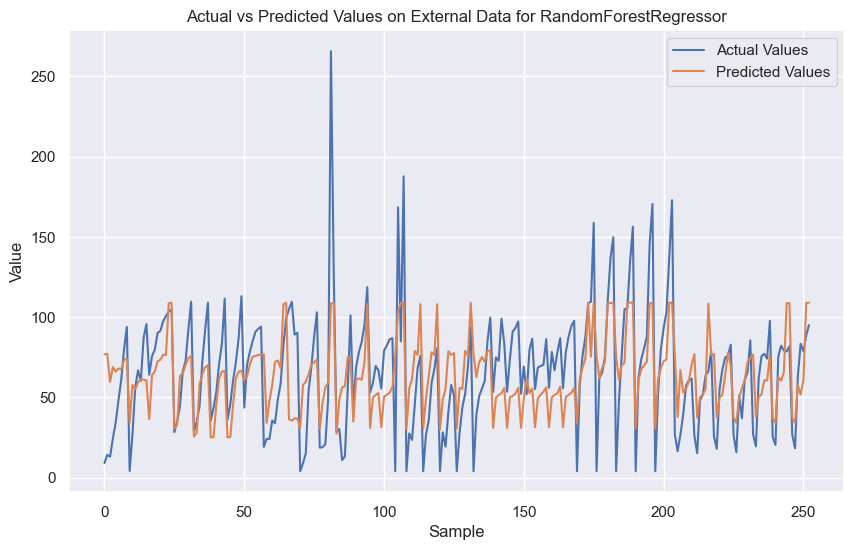

Model: RandomForestRegressor
Train RMSE: 21.563839944148086 Train R2: 0.668871647397343 Train MAE: 15.520421182803283
Test RMSE: 18.1654812292024 Test R2: 0.7517957452377262 Test MAE: 15.507583411016482
External RMSE: 29.85468225968368 External R2: 0.3586410000957281 External MAE: 23.493470381746707
--------------------------------------------------
Original Dataset - RMSE: 20.92836104828016, R2: 0.6848286553580061, MAE: 15.517853628445922
External Dataset - RMSE: 29.85468225968368, R2: 0.3586410000957281, MAE: 23.493470381746707


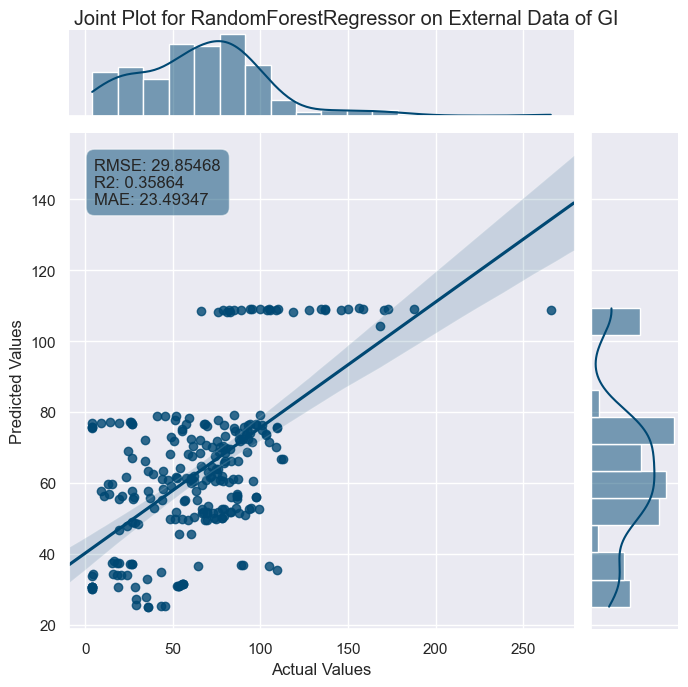

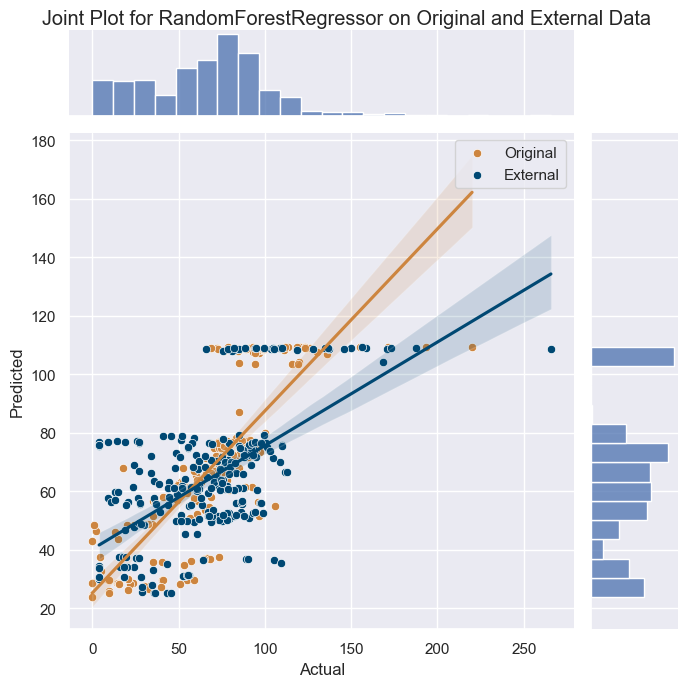

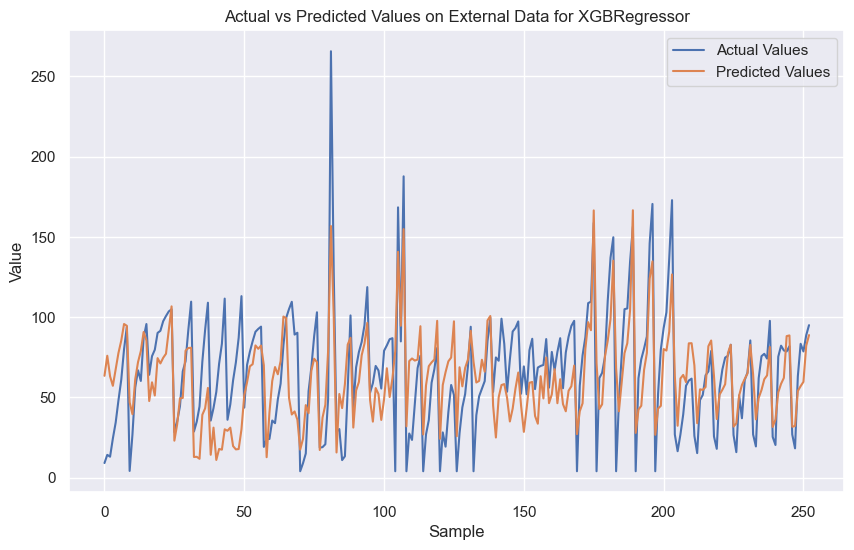

Model: XGBRegressor
Train RMSE: 0.020516612484348478 Train R2: 0.9999997002525616 Train MAE: 0.014259215272207604
Test RMSE: 11.614133685553043 Test R2: 0.8985413571900155 Test MAE: 8.099250791790903
External RMSE: 28.682134428736234 External R2: 0.40803065088022716 External MAE: 22.84703118928555
--------------------------------------------------
Original Dataset - RMSE: 5.1940309007831145, R2: 0.9805873267485357, MAE: 1.631257530575947
External Dataset - RMSE: 28.682134428736234, R2: 0.40803065088022716, MAE: 22.84703118928555
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000040 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 495
[LightGBM] [Info] Number of data points in the train set: 164, number of used features: 10
[LightGBM] [Info] Start training from score 0.008282
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positiv

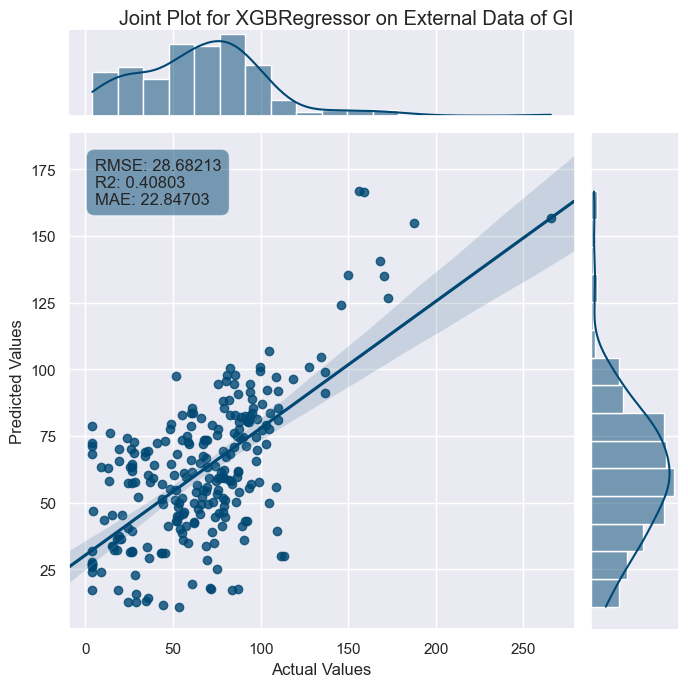

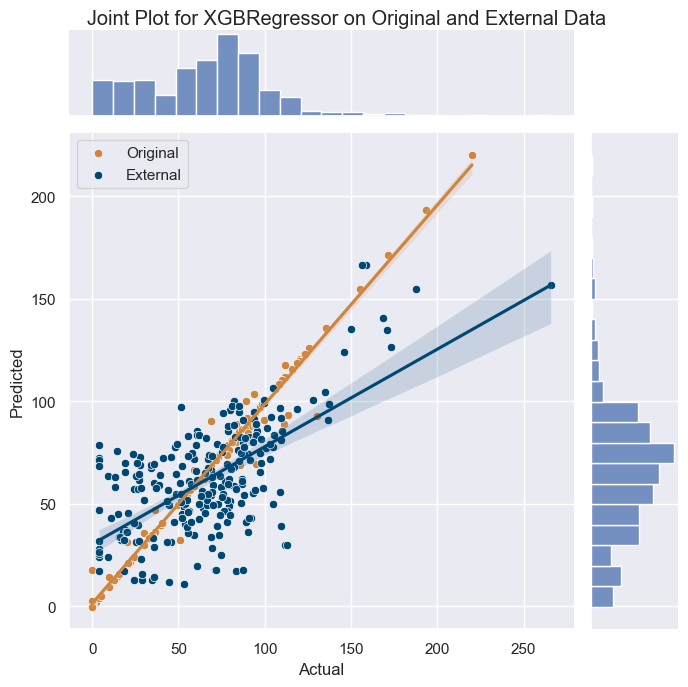

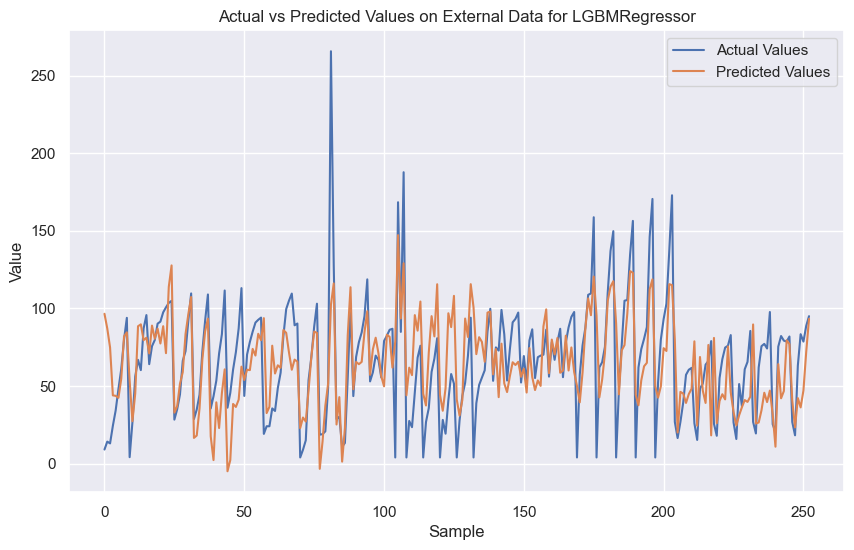

Model: LGBMRegressor
Train RMSE: 1.9032789389282625 Train R2: 0.9974204196924216 Train MAE: 1.2348482835740933
Test RMSE: 12.64480930263707 Test R2: 0.8797348006949688 Test MAE: 10.138138068519035
External RMSE: 30.195096212664996 External R2: 0.3439315970188399 External MAE: 22.167046127745994
--------------------------------------------------
Original Dataset - RMSE: 5.90560894705243, R2: 0.974903933400133, MAE: 3.0155062405630817
External Dataset - RMSE: 30.195096212664996, R2: 0.3439315970188399, MAE: 22.167046127745994


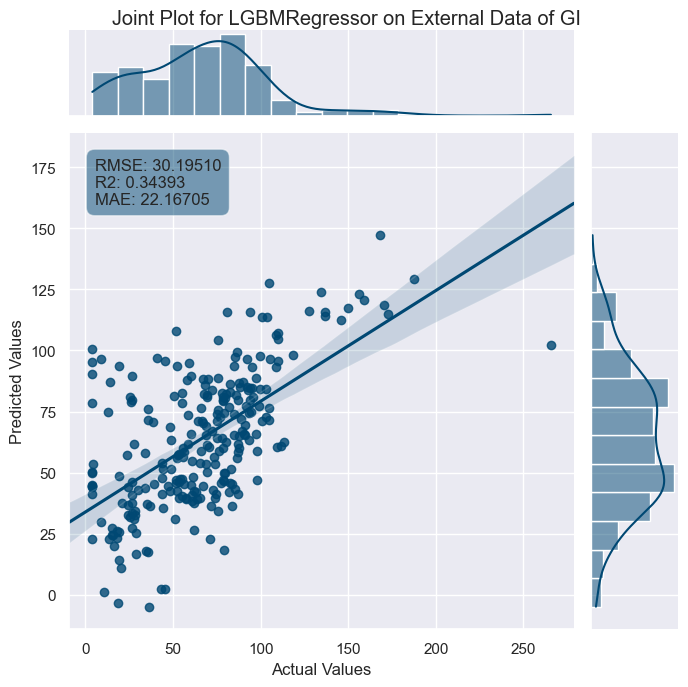

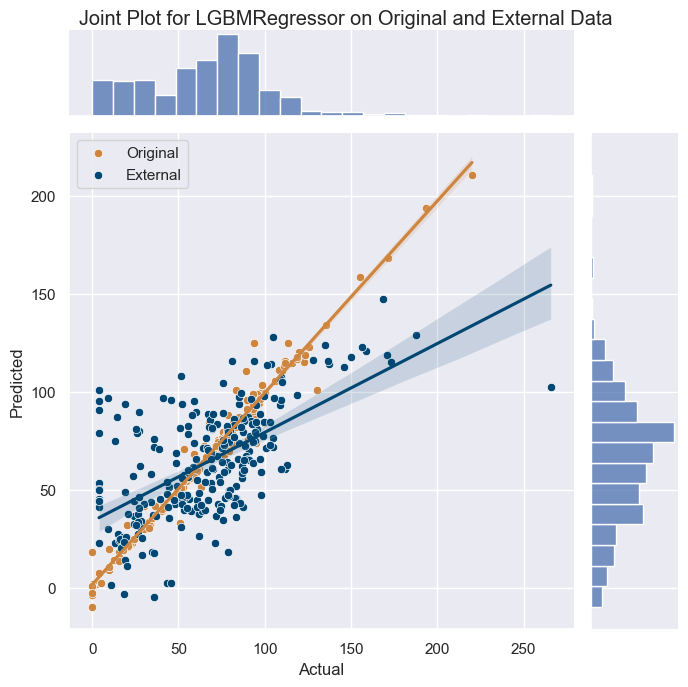

In [15]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from skopt import BayesSearchCV
from skopt.space import Integer
import matplotlib.pyplot as plt
# Load datasets
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)4-1.csv")
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)4-2.csv")

# Normalization function
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

# Normalize datasets
data_normalized, scaler = normalize_data(data)
external_data_normalized, _ = normalize_data(external_data)

# Split the dataset into features and target
X = data_normalized[:, :-1]
y = data_normalized[:, -1]
X_external = external_data_normalized[:, :-1]
y_external = external_data_normalized[:, -1]

# Fit a scaler for the features
feature_scaler = StandardScaler()
X_normalized = feature_scaler.fit_transform(data.drop('GI(%)', axis=1))

# Fit a separate scaler for the target
target_scaler = StandardScaler()
y_normalized = target_scaler.fit_transform(data[['GI(%)']])


# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Define the hyperparameter space
param_grid = {'n_neighbors': Integer(1, 30)}

# Bayesian optimization
knn_search = BayesSearchCV(KNeighborsRegressor(), param_grid, n_iter=32, cv=5, n_jobs=-1, random_state=0)
knn_search.fit(X_train, y_train)

# Best model
knn_best = knn_search.best_estimator_

# Function to evaluate the model
def evaluate_model(model, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    y_pred_external = model.predict(X_external)

    # Denormalize target values and predictions
    y_train_denorm = target_scaler.inverse_transform(y_train.reshape(-1, 1)).flatten()
    y_test_denorm = target_scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
    y_external_denorm = target_scaler.inverse_transform(y_external.reshape(-1, 1)).flatten()
    y_pred_train_denorm = target_scaler.inverse_transform(y_pred_train.reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(y_pred_test.reshape(-1, 1)).flatten()
    y_pred_external_denorm = target_scaler.inverse_transform(y_pred_external.reshape(-1, 1)).flatten()

    # Visualization of predictions on external data
    plt.figure(figsize=(10, 6))
    plt.plot(y_external_denorm, label='Actual Values')
    plt.plot(y_pred_external_denorm, label='Predicted Values')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.title(f'Actual vs Predicted Values on External Data for {model.__class__.__name__}')
    plt.legend()
    plt.show()

    # Metrics for train and test sets
    train_rmse = mean_squared_error(y_train_denorm, y_pred_train_denorm, squared=False)
    test_rmse = mean_squared_error(y_test_denorm, y_pred_test_denorm, squared=False)
    train_r2 = r2_score(y_train_denorm, y_pred_train_denorm)
    test_r2 = r2_score(y_test_denorm, y_pred_test_denorm)
    train_mae = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
    test_mae = mean_absolute_error(y_test_denorm, y_pred_test_denorm)

    # Metrics for external set
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)

    # Text for metrics
    metrics_text = f"RMSE: {external_rmse:.5f}\nR2: {external_r2:.5f}\nMAE: {external_mae:.5f}"

    # Create DataFrame for seaborn joint plot
    external_pred_df = pd.DataFrame({
        'Actual Values': y_external_denorm, 
        'Predicted Values': y_pred_external_denorm
    })

    # Set seaborn theme
    sns.set_theme(style="darkgrid")

    # Create the jointplot for external data with specified color
    g_external = sns.jointplot(x='Actual Values', y='Predicted Values', data=external_pred_df,
                               kind="reg", truncate=False,
                               color="#004873", height=7) 
    
    # Set title for the plot
    g_external.fig.suptitle(f"Joint Plot for {model.__class__.__name__} on External Data of GI")

    # Add metrics as text annotations
    plt.annotate(metrics_text, xy=(0.05, 0.95), xycoords='axes fraction', 
                 ha='left', va='top', bbox=dict(boxstyle='round,pad=0.5', fc="#004873", alpha=0.5))

    # Adjust layout
    g_external.fig.subplots_adjust(top=0.95)

    # Print metrics
    print(f"Model: {model.__class__.__name__}")
    print("Train RMSE:", train_rmse, "Train R2:", train_r2, "Train MAE:", train_mae)
    print("Test RMSE:", test_rmse, "Test R2:", test_r2, "Test MAE:", test_mae)
    print("External RMSE:", external_rmse, "External R2:", external_r2, "External MAE:", external_mae)
    print("--------------------------------------------------")

    # 评估模型并获取训练集和测试集的预测值
    y_pred_train_denorm = target_scaler.inverse_transform(model.predict(X_train).reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(model.predict(X_test).reshape(-1, 1)).flatten()

    # 合并训练集和测试集的数据
    original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
    original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])

    # 创建包含原始数据集和外部数据集的 DataFrame
    combined_df = pd.DataFrame({
        'Actual': np.concatenate([original_data_actual, y_external_denorm]),
        'Predicted': np.concatenate([original_data_predicted, y_pred_external_denorm]),
        'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(y_external_denorm)
    })

    # 创建基础 jointplot
    g_combined = sns.jointplot(x='Actual', y='Predicted', data=combined_df, kind="scatter", height=7)

    # 定义两个数据集的颜色
    colors = ['#CD853F', '#004873']

    # 为两个数据集添加不同颜色的散点图和线性回归线
    for dataset, color in zip(['Original', 'External'], colors):
        subset = combined_df[combined_df['Dataset'] == dataset]
        sns.scatterplot(x=subset['Actual'], y=subset['Predicted'], color=color, ax=g_combined.ax_joint, label=dataset)
        sns.regplot(x=subset['Actual'], y=subset['Predicted'], scatter=False, color=color, ax=g_combined.ax_joint)

    # 设置标题和布局
    g_combined.fig.suptitle(f"Joint Plot for {model.__class__.__name__} on Original and External Data")
    g_combined.fig.subplots_adjust(top=0.95)
    # 计算原始数据集的指标
    train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
    train_r2 = r2_score(original_data_actual, original_data_predicted)
    train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

    # 计算外部数据集的指标
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)


    print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
    print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

# Evaluate KNN model
evaluate_model(knn_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.svm import SVR
from skopt.space import Real

# Define the hyperparameter space for SVM
param_grid_svm = {
    'C': Real(1e-15, 1e+1, prior='log-uniform'),
    'gamma': Real(1e-15, 1e+1, prior='log-uniform'),
    'epsilon': Real(1e-15, 1e+1, prior='log-uniform')
}


# Bayesian optimization
svm_search = BayesSearchCV(SVR(), param_grid_svm, n_iter=32, cv=5, n_jobs=-1, random_state=0)
svm_search.fit(X_train, y_train)

# Best model
svm_best = svm_search.best_estimator_

# Evaluate SVM model
evaluate_model(svm_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.ensemble import RandomForestRegressor
from skopt.space import Integer, Real

# Define the hyperparameter space for Random Forest
param_grid_rf = {
    'n_estimators': Integer(100, 300),
    'max_depth': Integer(10, 50),
    'min_samples_split': Real(0.1, 1.0),
    'min_samples_leaf': Real(0.1, 0.5)
}

# Bayesian optimization
rf_search = BayesSearchCV(RandomForestRegressor(random_state=0), param_grid_rf, n_iter=32, cv=5, n_jobs=-1, random_state=0)
rf_search.fit(X_train, y_train)

# Best model
rf_best = rf_search.best_estimator_

# Evaluate Random Forest model
evaluate_model(rf_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import xgboost as xgb

# Define the hyperparameter space for XGBoost
param_grid_xgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
xgb_search = BayesSearchCV(xgb.XGBRegressor(), param_grid_xgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
xgb_search.fit(X_train, y_train)

# Best model
xgb_best = xgb_search.best_estimator_

# Evaluate XGBoost model
evaluate_model(xgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import lightgbm as lgb

# Define the hyperparameter space for LightGBM
param_grid_lgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(-1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'num_leaves': Integer(20, 300),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
lgb_search = BayesSearchCV(lgb.LGBMRegressor(), param_grid_lgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
lgb_search.fit(X_train, y_train)

# Best model
lgb_best = lgb_search.best_estimator_

# Evaluate LightGBM model
evaluate_model(lgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

In [16]:
# 创建包含模型名称和其最优超参数的字典
model_hyperparams = {
    'KNN': knn_search.best_params_,
    'SVM': svm_search.best_params_,
    'RandomForest': rf_search.best_params_,
    'XGBoost': xgb_search.best_params_,
    'LightGBM': lgb_search.best_params_
}

# 转换为DataFrame
hyperparams_df = pd.DataFrame.from_dict(model_hyperparams, orient='index')

# 重置索引，使模型名称成为一列
hyperparams_df.reset_index(inplace=True)
hyperparams_df.rename(columns={'index': 'Model'}, inplace=True)

# 指定文件路径和名称，这里替换为你的目标路径
file_path = "C:\\Users\\Lenovo\\Desktop\\元学习\\传统模型超参数\\hyperparams_CP_2_4.csv"

# 保存为CSV文件
hyperparams_df.to_csv(file_path, index=False)

In [17]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from skopt import BayesSearchCV
from skopt.space import Integer
import matplotlib.pyplot as plt
# Load datasets
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)5-1.csv")
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)5-2.csv")

# Normalization function
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

# Normalize datasets
data_normalized, scaler = normalize_data(data)
external_data_normalized, _ = normalize_data(external_data)

# Split the dataset into features and target
X = data_normalized[:, :-1]
y = data_normalized[:, -1]
X_external = external_data_normalized[:, :-1]
y_external = external_data_normalized[:, -1]

# Fit a scaler for the features
feature_scaler = StandardScaler()
X_normalized = feature_scaler.fit_transform(data.drop('GI(%)', axis=1))

# Fit a separate scaler for the target
target_scaler = StandardScaler()
y_normalized = target_scaler.fit_transform(data[['GI(%)']])


# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Define the hyperparameter space
param_grid = {'n_neighbors': Integer(1, 30)}

# Bayesian optimization
knn_search = BayesSearchCV(KNeighborsRegressor(), param_grid, n_iter=32, cv=5, n_jobs=-1, random_state=0)
knn_search.fit(X_train, y_train)

# Best model
knn_best = knn_search.best_estimator_

# Function to evaluate the model
def evaluate_model(model, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    y_pred_external = model.predict(X_external)

    # Denormalize target values and predictions
    y_train_denorm = target_scaler.inverse_transform(y_train.reshape(-1, 1)).flatten()
    y_test_denorm = target_scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
    y_external_denorm = target_scaler.inverse_transform(y_external.reshape(-1, 1)).flatten()
    y_pred_train_denorm = target_scaler.inverse_transform(y_pred_train.reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(y_pred_test.reshape(-1, 1)).flatten()
    y_pred_external_denorm = target_scaler.inverse_transform(y_pred_external.reshape(-1, 1)).flatten()


    # Metrics for train and test sets
    train_rmse = mean_squared_error(y_train_denorm, y_pred_train_denorm, squared=False)
    test_rmse = mean_squared_error(y_test_denorm, y_pred_test_denorm, squared=False)
    train_r2 = r2_score(y_train_denorm, y_pred_train_denorm)
    test_r2 = r2_score(y_test_denorm, y_pred_test_denorm)
    train_mae = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
    test_mae = mean_absolute_error(y_test_denorm, y_pred_test_denorm)

    # Metrics for external set
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)

    # Text for metrics
    metrics_text = f"RMSE: {external_rmse:.5f}\nR2: {external_r2:.5f}\nMAE: {external_mae:.5f}"

    # Create DataFrame for seaborn joint plot
    external_pred_df = pd.DataFrame({
        'Actual Values': y_external_denorm, 
        'Predicted Values': y_pred_external_denorm
    })

    # Print metrics
    print(f"Model: {model.__class__.__name__}")
    print("Train RMSE:", train_rmse, "Train R2:", train_r2, "Train MAE:", train_mae)
    print("Test RMSE:", test_rmse, "Test R2:", test_r2, "Test MAE:", test_mae)
    print("External RMSE:", external_rmse, "External R2:", external_r2, "External MAE:", external_mae)
    print("--------------------------------------------------")

    # 评估模型并获取训练集和测试集的预测值
    y_pred_train_denorm = target_scaler.inverse_transform(model.predict(X_train).reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(model.predict(X_test).reshape(-1, 1)).flatten()

    # 合并训练集和测试集的数据
    original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
    original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])

    # 创建包含原始数据集和外部数据集的 DataFrame
    combined_df = pd.DataFrame({
        'Actual': np.concatenate([original_data_actual, y_external_denorm]),
        'Predicted': np.concatenate([original_data_predicted, y_pred_external_denorm]),
        'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(y_external_denorm)
    })
    # 计算原始数据集的指标
    train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
    train_r2 = r2_score(original_data_actual, original_data_predicted)
    train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

    # 计算外部数据集的指标
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)


    print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
    print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

# Evaluate KNN model
evaluate_model(knn_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.svm import SVR
from skopt.space import Real

# Define the hyperparameter space for SVM
param_grid_svm = {
    'C': Real(1e-15, 1e+1, prior='log-uniform'),
    'gamma': Real(1e-15, 1e+1, prior='log-uniform'),
    'epsilon': Real(1e-15, 1e+1, prior='log-uniform')
}


# Bayesian optimization
svm_search = BayesSearchCV(SVR(), param_grid_svm, n_iter=32, cv=5, n_jobs=-1, random_state=0)
svm_search.fit(X_train, y_train)

# Best model
svm_best = svm_search.best_estimator_

# Evaluate SVM model
evaluate_model(svm_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.ensemble import RandomForestRegressor
from skopt.space import Integer, Real

# Define the hyperparameter space for Random Forest
param_grid_rf = {
    'n_estimators': Integer(100, 300),
    'max_depth': Integer(10, 50),
    'min_samples_split': Real(0.1, 1.0),
    'min_samples_leaf': Real(0.1, 0.5)
}

# Bayesian optimization
rf_search = BayesSearchCV(RandomForestRegressor(random_state=0), param_grid_rf, n_iter=32, cv=5, n_jobs=-1, random_state=0)
rf_search.fit(X_train, y_train)

# Best model
rf_best = rf_search.best_estimator_

# Evaluate Random Forest model
evaluate_model(rf_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import xgboost as xgb

# Define the hyperparameter space for XGBoost
param_grid_xgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
xgb_search = BayesSearchCV(xgb.XGBRegressor(), param_grid_xgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
xgb_search.fit(X_train, y_train)

# Best model
xgb_best = xgb_search.best_estimator_

# Evaluate XGBoost model
evaluate_model(xgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import lightgbm as lgb

# Define the hyperparameter space for LightGBM
param_grid_lgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(-1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'num_leaves': Integer(20, 300),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
lgb_search = BayesSearchCV(lgb.LGBMRegressor(), param_grid_lgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
lgb_search.fit(X_train, y_train)

# Best model
lgb_best = lgb_search.best_estimator_

# Evaluate LightGBM model
evaluate_model(lgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Model: KNeighborsRegressor
Train RMSE: 0.0 Train R2: 1.0 Train MAE: 0.0
Test RMSE: 14.527542760880282 Test R2: 0.7319747861610315 Test MAE: 10.742303241906978
External RMSE: 24.68596221489056 External R2: 0.26757173101234355 External MAE: 18.8705159455636
--------------------------------------------------
Original Dataset - RMSE: 6.542721882804969, R2: 0.9485504124230296, MAE: 2.1788633934056603
External Dataset - RMSE: 24.68596221489056, R2: 0.26757173101234355, MAE: 18.8705159455636
Model: SVR
Train RMSE: 6.278006729177305 Train R2: 0.9530755610006243 Train MAE: 1.7225025274286174
Test RMSE: 27.236876722361973 Test R2: 0.057880622138919535 Test MAE: 20.701384739009566
External RMSE: 28.858476393050143 External R2: -0.0009485969050595511 External MAE: 22.683130957368537
--------------------------------------------------
Original Dataset - RMSE: 13.48659358424744, R2: 0.7813902543633522, MAE: 5.571992787324753
External Dataset - RMSE: 28.858476393050143, R2: -0.0009485969050595511, MAE

e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Model: RandomForestRegressor
Train RMSE: 12.258210795594962 Train R2: 0.8211002613669705 Train MAE: 9.189454776653884
Test RMSE: 14.529669365507088 Test R2: 0.7318963110344983 Test MAE: 11.817604138147702
External RMSE: 23.711006682586415 External R2: 0.324282815042819 External MAE: 16.73187343713665
--------------------------------------------------
Original Dataset - RMSE: 12.751684358426816, R2: 0.8045660154896869, MAE: 9.722522807522916
External Dataset - RMSE: 23.711006682586415, R2: 0.324282815042819, MAE: 16.73187343713665
Model: XGBRegressor
Train RMSE: 0.015840229216363022 Train R2: 0.9999997012702613 Train MAE: 0.01161105425289926
Test RMSE: 10.087979224876875 Test R2: 0.8707591859991682 Test MAE: 7.686823869728833
External RMSE: 20.66628918788884 External R2: 0.48667787574592125 External MAE: 14.929075825837229
--------------------------------------------------
Original Dataset - RMSE: 4.543312196971684, R2: 0.9751909496979396, MAE: 1.5683759177692442
External Dataset - RMSE

In [18]:
# 创建包含模型名称和其最优超参数的字典
model_hyperparams = {
    'KNN': knn_search.best_params_,
    'SVM': svm_search.best_params_,
    'RandomForest': rf_search.best_params_,
    'XGBoost': xgb_search.best_params_,
    'LightGBM': lgb_search.best_params_
}

# 转换为DataFrame
hyperparams_df = pd.DataFrame.from_dict(model_hyperparams, orient='index')

# 重置索引，使模型名称成为一列
hyperparams_df.reset_index(inplace=True)
hyperparams_df.rename(columns={'index': 'Model'}, inplace=True)

# 指定文件路径和名称，这里替换为你的目标路径
file_path = "C:\\Users\\Lenovo\\Desktop\\元学习\\传统模型超参数\\hyperparams_CP_2_5.csv"

# 保存为CSV文件
hyperparams_df.to_csv(file_path, index=False)

In [19]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from skopt import BayesSearchCV
from skopt.space import Integer
import matplotlib.pyplot as plt
# Load datasets
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)6-1.csv")
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(2)6-2.csv")

# Normalization function
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

# Normalize datasets
data_normalized, scaler = normalize_data(data)
external_data_normalized, _ = normalize_data(external_data)

# Split the dataset into features and target
X = data_normalized[:, :-1]
y = data_normalized[:, -1]
X_external = external_data_normalized[:, :-1]
y_external = external_data_normalized[:, -1]

# Fit a scaler for the features
feature_scaler = StandardScaler()
X_normalized = feature_scaler.fit_transform(data.drop('GI(%)', axis=1))

# Fit a separate scaler for the target
target_scaler = StandardScaler()
y_normalized = target_scaler.fit_transform(data[['GI(%)']])


# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Define the hyperparameter space
param_grid = {'n_neighbors': Integer(1, 30)}

# Bayesian optimization
knn_search = BayesSearchCV(KNeighborsRegressor(), param_grid, n_iter=32, cv=5, n_jobs=-1, random_state=0)
knn_search.fit(X_train, y_train)

# Best model
knn_best = knn_search.best_estimator_

# Function to evaluate the model
def evaluate_model(model, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    y_pred_external = model.predict(X_external)

    # Denormalize target values and predictions
    y_train_denorm = target_scaler.inverse_transform(y_train.reshape(-1, 1)).flatten()
    y_test_denorm = target_scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
    y_external_denorm = target_scaler.inverse_transform(y_external.reshape(-1, 1)).flatten()
    y_pred_train_denorm = target_scaler.inverse_transform(y_pred_train.reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(y_pred_test.reshape(-1, 1)).flatten()
    y_pred_external_denorm = target_scaler.inverse_transform(y_pred_external.reshape(-1, 1)).flatten()
    # Metrics for train and test sets
    train_rmse = mean_squared_error(y_train_denorm, y_pred_train_denorm, squared=False)
    test_rmse = mean_squared_error(y_test_denorm, y_pred_test_denorm, squared=False)
    train_r2 = r2_score(y_train_denorm, y_pred_train_denorm)
    test_r2 = r2_score(y_test_denorm, y_pred_test_denorm)
    train_mae = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
    test_mae = mean_absolute_error(y_test_denorm, y_pred_test_denorm)

    # Metrics for external set
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)

    # Text for metrics
    metrics_text = f"RMSE: {external_rmse:.5f}\nR2: {external_r2:.5f}\nMAE: {external_mae:.5f}"

    # Create DataFrame for seaborn joint plot
    external_pred_df = pd.DataFrame({
        'Actual Values': y_external_denorm, 
        'Predicted Values': y_pred_external_denorm
    })



    # Print metrics
    print(f"Model: {model.__class__.__name__}")
    print("Train RMSE:", train_rmse, "Train R2:", train_r2, "Train MAE:", train_mae)
    print("Test RMSE:", test_rmse, "Test R2:", test_r2, "Test MAE:", test_mae)
    print("External RMSE:", external_rmse, "External R2:", external_r2, "External MAE:", external_mae)
    print("--------------------------------------------------")

    # 评估模型并获取训练集和测试集的预测值
    y_pred_train_denorm = target_scaler.inverse_transform(model.predict(X_train).reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(model.predict(X_test).reshape(-1, 1)).flatten()

    # 合并训练集和测试集的数据
    original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
    original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])

    # 创建包含原始数据集和外部数据集的 DataFrame
    combined_df = pd.DataFrame({
        'Actual': np.concatenate([original_data_actual, y_external_denorm]),
        'Predicted': np.concatenate([original_data_predicted, y_pred_external_denorm]),
        'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(y_external_denorm)
    })

    # 计算原始数据集的指标
    train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
    train_r2 = r2_score(original_data_actual, original_data_predicted)
    train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

    # 计算外部数据集的指标
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)

    print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
    print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

# Evaluate KNN model
evaluate_model(knn_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.svm import SVR
from skopt.space import Real

# Define the hyperparameter space for SVM
param_grid_svm = {
    'C': Real(1e-15, 1e+1, prior='log-uniform'),
    'gamma': Real(1e-15, 1e+1, prior='log-uniform'),
    'epsilon': Real(1e-15, 1e+1, prior='log-uniform')
}

# Bayesian optimization
svm_search = BayesSearchCV(SVR(), param_grid_svm, n_iter=32, cv=5, n_jobs=-1, random_state=0)
svm_search.fit(X_train, y_train)

# Best model
svm_best = svm_search.best_estimator_

# Evaluate SVM model
evaluate_model(svm_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.ensemble import RandomForestRegressor
from skopt.space import Integer, Real

# Define the hyperparameter space for Random Forest
param_grid_rf = {
    'n_estimators': Integer(100, 300),
    'max_depth': Integer(10, 50),
    'min_samples_split': Real(0.1, 1.0),
    'min_samples_leaf': Real(0.1, 0.5)
}

# Bayesian optimization
rf_search = BayesSearchCV(RandomForestRegressor(random_state=0), param_grid_rf, n_iter=32, cv=5, n_jobs=-1, random_state=0)
rf_search.fit(X_train, y_train)

# Best model
rf_best = rf_search.best_estimator_

# Evaluate Random Forest model
evaluate_model(rf_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import xgboost as xgb

# Define the hyperparameter space for XGBoost
param_grid_xgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
xgb_search = BayesSearchCV(xgb.XGBRegressor(), param_grid_xgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
xgb_search.fit(X_train, y_train)

# Best model
xgb_best = xgb_search.best_estimator_

# Evaluate XGBoost model
evaluate_model(xgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import lightgbm as lgb

# Define the hyperparameter space for LightGBM
param_grid_lgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(-1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'num_leaves': Integer(20, 300),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
lgb_search = BayesSearchCV(lgb.LGBMRegressor(), param_grid_lgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
lgb_search.fit(X_train, y_train)

# Best model
lgb_best = lgb_search.best_estimator_

# Evaluate LightGBM model
evaluate_model(lgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Model: KNeighborsRegressor
Train RMSE: 8.410348322709485 Train R2: 0.9520678793094142 Train MAE: 5.174796591619319
Test RMSE: 18.296670578721713 Test R2: 0.7983891932178886 Test MAE: 10.00568216148889
External RMSE: 28.26081991689199 External R2: 0.4739295003768512 External MAE: 21.098846986390352
--------------------------------------------------
Original Dataset - RMSE: 11.15780345199667, R2: 0.9179966023074849, MAE: 6.158461074171946
External Dataset - RMSE: 28.26081991689199, R2: 0.4739295003768512, MAE: 21.098846986390352


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Model: SVR
Train RMSE: 0.008592075101807695 Train R2: 0.9999999499741119 Train MAE: 0.0072649179282776085
Test RMSE: 33.77371617654504 Test R2: 0.313046455890992 Test MAE: 24.632893344973535
External RMSE: 38.976189967824325 External R2: -0.0006292641252163556 External MAE: 30.87058976585997
--------------------------------------------------
Original Dataset - RMSE: 15.24014238033434, R2: 0.8470137208478226, MAE: 5.021533149679575
External Dataset - RMSE: 38.976189967824325, R2: -0.0006292641252163556, MAE: 30.87058976585997


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Model: RandomForestRegressor
Train RMSE: 19.442017797801167 Train R2: 0.743857672749469 Train MAE: 13.941962740622165
Test RMSE: 16.731485516317285 Test R2: 0.8314073359482288 Test MAE: 13.562214414721646
External RMSE: 35.08722104554691 External R2: 0.1890905173016607 External MAE: 26.35032812412388
--------------------------------------------------
Original Dataset - RMSE: 18.921607654381873, R2: 0.7641746436847399, MAE: 13.864638420868665
External Dataset - RMSE: 35.08722104554691, R2: 0.1890905173016607, MAE: 26.35032812412388
Model: XGBRegressor
Train RMSE: 0.020511484417091504 Train R2: 0.9999997149028597 Train MAE: 0.014450962507491762
Test RMSE: 13.803162910994857 Test R2: 0.8852568159270517 Test MAE: 8.628306814993207
External RMSE: 32.545441158616214 External R2: 0.30232243298379546 External MAE: 22.97627282598761
--------------------------------------------------
Original Dataset - RMSE: 6.228602405837358, R2: 0.9744461905721248, MAE: 1.7684035116561674
External Dataset - RM

In [20]:
# 创建包含模型名称和其最优超参数的字典
model_hyperparams = {
    'KNN': knn_search.best_params_,
    'SVM': svm_search.best_params_,
    'RandomForest': rf_search.best_params_,
    'XGBoost': xgb_search.best_params_,
    'LightGBM': lgb_search.best_params_
}

# 转换为DataFrame
hyperparams_df = pd.DataFrame.from_dict(model_hyperparams, orient='index')

# 重置索引，使模型名称成为一列
hyperparams_df.reset_index(inplace=True)
hyperparams_df.rename(columns={'index': 'Model'}, inplace=True)

# 指定文件路径和名称，这里替换为你的目标路径
file_path = "C:\\Users\\Lenovo\\Desktop\\元学习\\传统模型超参数\\hyperparams_CP_2_6.csv"

# 保存为CSV文件
hyperparams_df.to_csv(file_path, index=False)

3.一部分样本用于训练

In [21]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from skopt import BayesSearchCV
from skopt.space import Integer
import matplotlib.pyplot as plt
# Load datasets
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)1-1.csv")
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)1-2.csv")

# Normalization function
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

# Normalize datasets
data_normalized, scaler = normalize_data(data)
external_data_normalized, _ = normalize_data(external_data)

# Split the dataset into features and target
X = data_normalized[:, :-1]
y = data_normalized[:, -1]
X_external = external_data_normalized[:, :-1]
y_external = external_data_normalized[:, -1]

# Fit a scaler for the features
feature_scaler = StandardScaler()
X_normalized = feature_scaler.fit_transform(data.drop('GI(%)', axis=1))

# Fit a separate scaler for the target
target_scaler = StandardScaler()
y_normalized = target_scaler.fit_transform(data[['GI(%)']])


# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Define the hyperparameter space
param_grid = {'n_neighbors': Integer(1, 30)}

# Bayesian optimization
knn_search = BayesSearchCV(KNeighborsRegressor(), param_grid, n_iter=32, cv=5, n_jobs=-1, random_state=0)
knn_search.fit(X_train, y_train)

# Best model
knn_best = knn_search.best_estimator_

# Function to evaluate the model
def evaluate_model(model, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    y_pred_external = model.predict(X_external)

    # Denormalize target values and predictions
    y_train_denorm = target_scaler.inverse_transform(y_train.reshape(-1, 1)).flatten()
    y_test_denorm = target_scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
    y_external_denorm = target_scaler.inverse_transform(y_external.reshape(-1, 1)).flatten()
    y_pred_train_denorm = target_scaler.inverse_transform(y_pred_train.reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(y_pred_test.reshape(-1, 1)).flatten()
    y_pred_external_denorm = target_scaler.inverse_transform(y_pred_external.reshape(-1, 1)).flatten()


    # Metrics for train and test sets
    train_rmse = mean_squared_error(y_train_denorm, y_pred_train_denorm, squared=False)
    test_rmse = mean_squared_error(y_test_denorm, y_pred_test_denorm, squared=False)
    train_r2 = r2_score(y_train_denorm, y_pred_train_denorm)
    test_r2 = r2_score(y_test_denorm, y_pred_test_denorm)
    train_mae = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
    test_mae = mean_absolute_error(y_test_denorm, y_pred_test_denorm)

    # Metrics for external set
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)

    # Text for metrics
    metrics_text = f"RMSE: {external_rmse:.5f}\nR2: {external_r2:.5f}\nMAE: {external_mae:.5f}"

    # Create DataFrame for seaborn joint plot
    external_pred_df = pd.DataFrame({
        'Actual Values': y_external_denorm, 
        'Predicted Values': y_pred_external_denorm
    })


    # Print metrics
    print(f"Model: {model.__class__.__name__}")
    print("Train RMSE:", train_rmse, "Train R2:", train_r2, "Train MAE:", train_mae)
    print("Test RMSE:", test_rmse, "Test R2:", test_r2, "Test MAE:", test_mae)
    print("External RMSE:", external_rmse, "External R2:", external_r2, "External MAE:", external_mae)
    print("--------------------------------------------------")

    # 评估模型并获取训练集和测试集的预测值
    y_pred_train_denorm = target_scaler.inverse_transform(model.predict(X_train).reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(model.predict(X_test).reshape(-1, 1)).flatten()

    # 合并训练集和测试集的数据
    original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
    original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])

    # 创建包含原始数据集和外部数据集的 DataFrame
    combined_df = pd.DataFrame({
        'Actual': np.concatenate([original_data_actual, y_external_denorm]),
        'Predicted': np.concatenate([original_data_predicted, y_pred_external_denorm]),
        'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(y_external_denorm)
    })


    # 计算原始数据集的指标
    train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
    train_r2 = r2_score(original_data_actual, original_data_predicted)
    train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

    # 计算外部数据集的指标
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)


    print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
    print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

# Evaluate KNN model
evaluate_model(knn_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.svm import SVR
from skopt.space import Real

# Define the hyperparameter space for SVM
param_grid_svm = {
    'C': Real(1e-15, 1e+1, prior='log-uniform'),
    'gamma': Real(1e-15, 1e+1, prior='log-uniform'),
    'epsilon': Real(1e-15, 1e+1, prior='log-uniform')
}


# Bayesian optimization
svm_search = BayesSearchCV(SVR(), param_grid_svm, n_iter=32, cv=5, n_jobs=-1, random_state=0)
svm_search.fit(X_train, y_train)

# Best model
svm_best = svm_search.best_estimator_

# Evaluate SVM model
evaluate_model(svm_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.ensemble import RandomForestRegressor
from skopt.space import Integer, Real

# Define the hyperparameter space for Random Forest
param_grid_rf = {
    'n_estimators': Integer(100, 300),
    'max_depth': Integer(10, 50),
    'min_samples_split': Real(0.1, 1.0),
    'min_samples_leaf': Real(0.1, 0.5)
}

# Bayesian optimization
rf_search = BayesSearchCV(RandomForestRegressor(random_state=0), param_grid_rf, n_iter=32, cv=5, n_jobs=-1, random_state=0)
rf_search.fit(X_train, y_train)

# Best model
rf_best = rf_search.best_estimator_

# Evaluate Random Forest model
evaluate_model(rf_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import xgboost as xgb

# Define the hyperparameter space for XGBoost
param_grid_xgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
xgb_search = BayesSearchCV(xgb.XGBRegressor(), param_grid_xgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
xgb_search.fit(X_train, y_train)

# Best model
xgb_best = xgb_search.best_estimator_

# Evaluate XGBoost model
evaluate_model(xgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import lightgbm as lgb

# Define the hyperparameter space for LightGBM
param_grid_lgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(-1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'num_leaves': Integer(20, 300),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
lgb_search = BayesSearchCV(lgb.LGBMRegressor(), param_grid_lgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
lgb_search.fit(X_train, y_train)

# Best model
lgb_best = lgb_search.best_estimator_

# Evaluate LightGBM model
evaluate_model(lgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Model: KNeighborsRegressor
Train RMSE: 12.193765091137793 Train R2: 0.8824366056280407 Train MAE: 6.931586700945947
Test RMSE: 18.872306470362727 Test R2: 0.4118846758345074 Test MAE: 10.011922900839286
External RMSE: 23.074709453122306 External R2: 0.5323414477296513 External MAE: 16.8281190899918
--------------------------------------------------
Original Dataset - RMSE: 13.801508709671884, R2: 0.832694766667344, MAE: 7.552086079341728
External Dataset - RMSE: 23.074709453122306, R2: 0.5323414477296513, MAE: 16.8281190899918


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Model: SVR
Train RMSE: 0.007507703718252732 Train R2: 0.9999999554332751 Train MAE: 0.006276167452942322
Test RMSE: 24.16631633879652 Test R2: 0.035652748703515424 Test MAE: 21.29122609233185
External RMSE: 33.77170289076021 External R2: -0.0017568436762787076 External MAE: 25.682551586382022
--------------------------------------------------
Original Dataset - RMSE: 10.846313542554652, R2: 0.8966713612982522, MAE: 4.293891979658765
External Dataset - RMSE: 33.77170289076021, R2: -0.0017568436762787076, MAE: 25.682551586382022


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Model: RandomForestRegressor
Train RMSE: 24.216335786982807 Train R2: 0.5363253761396204 Train MAE: 14.586327285480959
Test RMSE: 13.678640479141619 Test R2: 0.6910427401902486 Test MAE: 11.777704114901116
External RMSE: 22.007319253820643 External R2: 0.5746066605709998 External MAE: 15.569960900500957
--------------------------------------------------
Original Dataset - RMSE: 22.49424830612869, R2: 0.5555740923690091, MAE: 14.02056146694689
External Dataset - RMSE: 22.007319253820643, R2: 0.5746066605709998, MAE: 15.569960900500957
Model: XGBRegressor
Train RMSE: 0.017206210864325902 Train R2: 0.9999997659185763 Train MAE: 0.01207771911365979
Test RMSE: 14.364359207783478 Test R2: 0.6592898681626033 Test MAE: 10.019098642570322
External RMSE: 22.569195497837068 External R2: 0.552607648461674 External MAE: 16.848903660936926
--------------------------------------------------
Original Dataset - RMSE: 6.447021338073204, R2: 0.9634931288023242, MAE: 2.0278804950617637
External Dataset - 

In [22]:
# 创建包含模型名称和其最优超参数的字典
model_hyperparams = {
    'KNN': knn_search.best_params_,
    'SVM': svm_search.best_params_,
    'RandomForest': rf_search.best_params_,
    'XGBoost': xgb_search.best_params_,
    'LightGBM': lgb_search.best_params_
}

# 转换为DataFrame
hyperparams_df = pd.DataFrame.from_dict(model_hyperparams, orient='index')

# 重置索引，使模型名称成为一列
hyperparams_df.reset_index(inplace=True)
hyperparams_df.rename(columns={'index': 'Model'}, inplace=True)

# 指定文件路径和名称，这里替换为你的目标路径
file_path = "C:\\Users\\Lenovo\\Desktop\\元学习\\传统模型超参数\\hyperparams_CP_3_1.csv"

# 保存为CSV文件
hyperparams_df.to_csv(file_path, index=False)

In [23]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from skopt import BayesSearchCV
from skopt.space import Integer
import matplotlib.pyplot as plt
# Load datasets
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)2-1.csv")
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)2-2.csv")

# Normalization function
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

# Normalize datasets
data_normalized, scaler = normalize_data(data)
external_data_normalized, _ = normalize_data(external_data)

# Split the dataset into features and target
X = data_normalized[:, :-1]
y = data_normalized[:, -1]
X_external = external_data_normalized[:, :-1]
y_external = external_data_normalized[:, -1]

# Fit a scaler for the features
feature_scaler = StandardScaler()
X_normalized = feature_scaler.fit_transform(data.drop('GI(%)', axis=1))

# Fit a separate scaler for the target
target_scaler = StandardScaler()
y_normalized = target_scaler.fit_transform(data[['GI(%)']])


# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Define the hyperparameter space
param_grid = {'n_neighbors': Integer(1, 30)}

# Bayesian optimization
knn_search = BayesSearchCV(KNeighborsRegressor(), param_grid, n_iter=32, cv=5, n_jobs=-1, random_state=0)
knn_search.fit(X_train, y_train)

# Best model
knn_best = knn_search.best_estimator_

# Function to evaluate the model
def evaluate_model(model, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    y_pred_external = model.predict(X_external)

    # Denormalize target values and predictions
    y_train_denorm = target_scaler.inverse_transform(y_train.reshape(-1, 1)).flatten()
    y_test_denorm = target_scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
    y_external_denorm = target_scaler.inverse_transform(y_external.reshape(-1, 1)).flatten()
    y_pred_train_denorm = target_scaler.inverse_transform(y_pred_train.reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(y_pred_test.reshape(-1, 1)).flatten()
    y_pred_external_denorm = target_scaler.inverse_transform(y_pred_external.reshape(-1, 1)).flatten()


    # Metrics for train and test sets
    train_rmse = mean_squared_error(y_train_denorm, y_pred_train_denorm, squared=False)
    test_rmse = mean_squared_error(y_test_denorm, y_pred_test_denorm, squared=False)
    train_r2 = r2_score(y_train_denorm, y_pred_train_denorm)
    test_r2 = r2_score(y_test_denorm, y_pred_test_denorm)
    train_mae = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
    test_mae = mean_absolute_error(y_test_denorm, y_pred_test_denorm)

    # Metrics for external set
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)

    # Text for metrics
    metrics_text = f"RMSE: {external_rmse:.5f}\nR2: {external_r2:.5f}\nMAE: {external_mae:.5f}"

    # Create DataFrame for seaborn joint plot
    external_pred_df = pd.DataFrame({
        'Actual Values': y_external_denorm, 
        'Predicted Values': y_pred_external_denorm
    })


    # Print metrics
    print(f"Model: {model.__class__.__name__}")
    print("Train RMSE:", train_rmse, "Train R2:", train_r2, "Train MAE:", train_mae)
    print("Test RMSE:", test_rmse, "Test R2:", test_r2, "Test MAE:", test_mae)
    print("External RMSE:", external_rmse, "External R2:", external_r2, "External MAE:", external_mae)
    print("--------------------------------------------------")

    # 评估模型并获取训练集和测试集的预测值
    y_pred_train_denorm = target_scaler.inverse_transform(model.predict(X_train).reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(model.predict(X_test).reshape(-1, 1)).flatten()

    # 合并训练集和测试集的数据
    original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
    original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])

    # 创建包含原始数据集和外部数据集的 DataFrame
    combined_df = pd.DataFrame({
        'Actual': np.concatenate([original_data_actual, y_external_denorm]),
        'Predicted': np.concatenate([original_data_predicted, y_pred_external_denorm]),
        'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(y_external_denorm)
    })


    # 计算原始数据集的指标
    train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
    train_r2 = r2_score(original_data_actual, original_data_predicted)
    train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

    # 计算外部数据集的指标
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)


    print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
    print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

# Evaluate KNN model
evaluate_model(knn_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.svm import SVR
from skopt.space import Real

# Define the hyperparameter space for SVM
param_grid_svm = {
    'C': Real(1e-15, 1e+1, prior='log-uniform'),
    'gamma': Real(1e-15, 1e+1, prior='log-uniform'),
    'epsilon': Real(1e-15, 1e+1, prior='log-uniform')
}


# Bayesian optimization
svm_search = BayesSearchCV(SVR(), param_grid_svm, n_iter=32, cv=5, n_jobs=-1, random_state=0)
svm_search.fit(X_train, y_train)

# Best model
svm_best = svm_search.best_estimator_

# Evaluate SVM model
evaluate_model(svm_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.ensemble import RandomForestRegressor
from skopt.space import Integer, Real

# Define the hyperparameter space for Random Forest
param_grid_rf = {
    'n_estimators': Integer(100, 300),
    'max_depth': Integer(10, 50),
    'min_samples_split': Real(0.1, 1.0),
    'min_samples_leaf': Real(0.1, 0.5)
}

# Bayesian optimization
rf_search = BayesSearchCV(RandomForestRegressor(random_state=0), param_grid_rf, n_iter=32, cv=5, n_jobs=-1, random_state=0)
rf_search.fit(X_train, y_train)

# Best model
rf_best = rf_search.best_estimator_

# Evaluate Random Forest model
evaluate_model(rf_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import xgboost as xgb

# Define the hyperparameter space for XGBoost
param_grid_xgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
xgb_search = BayesSearchCV(xgb.XGBRegressor(), param_grid_xgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
xgb_search.fit(X_train, y_train)

# Best model
xgb_best = xgb_search.best_estimator_

# Evaluate XGBoost model
evaluate_model(xgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import lightgbm as lgb

# Define the hyperparameter space for LightGBM
param_grid_lgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(-1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'num_leaves': Integer(20, 300),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
lgb_search = BayesSearchCV(lgb.LGBMRegressor(), param_grid_lgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
lgb_search.fit(X_train, y_train)

# Best model
lgb_best = lgb_search.best_estimator_

# Evaluate LightGBM model
evaluate_model(lgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Model: KNeighborsRegressor
Train RMSE: 0.0 Train R2: 1.0 Train MAE: 0.0
Test RMSE: 10.269925910590427 Test R2: 0.8632150480179611 Test MAE: 7.154575047250001
External RMSE: 22.830502190642402 External R2: 0.16374734427230897 External MAE: 18.037189923131994
--------------------------------------------------
Original Dataset - RMSE: 4.63947961123493, R2: 0.9654661401705744, MAE: 1.4601173565816328
External Dataset - RMSE: 22.830502190642402, R2: 0.16374734427230897, MAE: 18.037189923131994


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Model: SVR
Train RMSE: 0.0051400841507792715 Train R2: 0.9999999548675259 Train MAE: 0.0034817623052687597
Test RMSE: 25.6610673415525 Test R2: 0.1460093141590304 Test MAE: 22.289671676546625
External RMSE: 24.96604314599266 External R2: -1.3848620503464915e-05 External MAE: 19.205156683630648
--------------------------------------------------
Original Dataset - RMSE: 11.592489477027842, R2: 0.7843944174564597, MAE: 4.551683785619831
External Dataset - RMSE: 24.96604314599266, R2: -1.3848620503464915e-05, MAE: 19.205156683630648


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Model: RandomForestRegressor
Train RMSE: 11.548707370540622 Train R2: 0.7721676248387317 Train MAE: 8.626138444855217
Test RMSE: 11.978121974531035 Test R2: 0.8139279408443179 Test MAE: 8.663211161025407
External RMSE: 19.084997322328537 External R2: 0.4156261311043292 External MAE: 13.247468040560104
--------------------------------------------------
Original Dataset - RMSE: 11.637629935838087, R2: 0.7827120378621473, MAE: 8.633704305298112
External Dataset - RMSE: 19.084997322328537, R2: 0.4156261311043292, MAE: 13.247468040560104
Model: XGBRegressor
Train RMSE: 0.9606881077059947 Train R2: 0.9984234290754752 Train MAE: 0.48426921447608645
Test RMSE: 7.679806067185943 Test R2: 0.9235100798168229 Test MAE: 5.935034891079859
External RMSE: 22.021331499281615 External R2: 0.2219746812318032 External MAE: 16.621752337742073
--------------------------------------------------
Original Dataset - RMSE: 3.57367973699288, R2: 0.9795101942930764, MAE: 1.5966703729666523
External Dataset - RMSE:

In [24]:
# 创建包含模型名称和其最优超参数的字典
model_hyperparams = {
    'KNN': knn_search.best_params_,
    'SVM': svm_search.best_params_,
    'RandomForest': rf_search.best_params_,
    'XGBoost': xgb_search.best_params_,
    'LightGBM': lgb_search.best_params_
}

# 转换为DataFrame
hyperparams_df = pd.DataFrame.from_dict(model_hyperparams, orient='index')

# 重置索引，使模型名称成为一列
hyperparams_df.reset_index(inplace=True)
hyperparams_df.rename(columns={'index': 'Model'}, inplace=True)

# 指定文件路径和名称，这里替换为你的目标路径
file_path = "C:\\Users\\Lenovo\\Desktop\\元学习\\传统模型超参数\\hyperparams_CP_3_2.csv"

# 保存为CSV文件
hyperparams_df.to_csv(file_path, index=False)

In [25]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from skopt import BayesSearchCV
from skopt.space import Integer
import matplotlib.pyplot as plt
# Load datasets
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)3-1.csv")
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)3-2.csv")

# Normalization function
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

# Normalize datasets
data_normalized, scaler = normalize_data(data)
external_data_normalized, _ = normalize_data(external_data)

# Split the dataset into features and target
X = data_normalized[:, :-1]
y = data_normalized[:, -1]
X_external = external_data_normalized[:, :-1]
y_external = external_data_normalized[:, -1]

# Fit a scaler for the features
feature_scaler = StandardScaler()
X_normalized = feature_scaler.fit_transform(data.drop('GI(%)', axis=1))

# Fit a separate scaler for the target
target_scaler = StandardScaler()
y_normalized = target_scaler.fit_transform(data[['GI(%)']])


# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Define the hyperparameter space
param_grid = {'n_neighbors': Integer(1, 30)}

# Bayesian optimization
knn_search = BayesSearchCV(KNeighborsRegressor(), param_grid, n_iter=32, cv=5, n_jobs=-1, random_state=0)
knn_search.fit(X_train, y_train)

# Best model
knn_best = knn_search.best_estimator_

# Function to evaluate the model
def evaluate_model(model, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    y_pred_external = model.predict(X_external)

    # Denormalize target values and predictions
    y_train_denorm = target_scaler.inverse_transform(y_train.reshape(-1, 1)).flatten()
    y_test_denorm = target_scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
    y_external_denorm = target_scaler.inverse_transform(y_external.reshape(-1, 1)).flatten()
    y_pred_train_denorm = target_scaler.inverse_transform(y_pred_train.reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(y_pred_test.reshape(-1, 1)).flatten()
    y_pred_external_denorm = target_scaler.inverse_transform(y_pred_external.reshape(-1, 1)).flatten()


    # Metrics for train and test sets
    train_rmse = mean_squared_error(y_train_denorm, y_pred_train_denorm, squared=False)
    test_rmse = mean_squared_error(y_test_denorm, y_pred_test_denorm, squared=False)
    train_r2 = r2_score(y_train_denorm, y_pred_train_denorm)
    test_r2 = r2_score(y_test_denorm, y_pred_test_denorm)
    train_mae = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
    test_mae = mean_absolute_error(y_test_denorm, y_pred_test_denorm)

    # Metrics for external set
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)

    # Text for metrics
    metrics_text = f"RMSE: {external_rmse:.5f}\nR2: {external_r2:.5f}\nMAE: {external_mae:.5f}"

    # Create DataFrame for seaborn joint plot
    external_pred_df = pd.DataFrame({
        'Actual Values': y_external_denorm, 
        'Predicted Values': y_pred_external_denorm
    })


    # Print metrics
    print(f"Model: {model.__class__.__name__}")
    print("Train RMSE:", train_rmse, "Train R2:", train_r2, "Train MAE:", train_mae)
    print("Test RMSE:", test_rmse, "Test R2:", test_r2, "Test MAE:", test_mae)
    print("External RMSE:", external_rmse, "External R2:", external_r2, "External MAE:", external_mae)
    print("--------------------------------------------------")

    # 评估模型并获取训练集和测试集的预测值
    y_pred_train_denorm = target_scaler.inverse_transform(model.predict(X_train).reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(model.predict(X_test).reshape(-1, 1)).flatten()

    # 合并训练集和测试集的数据
    original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
    original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])

    # 创建包含原始数据集和外部数据集的 DataFrame
    combined_df = pd.DataFrame({
        'Actual': np.concatenate([original_data_actual, y_external_denorm]),
        'Predicted': np.concatenate([original_data_predicted, y_pred_external_denorm]),
        'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(y_external_denorm)
    })


    # 计算原始数据集的指标
    train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
    train_r2 = r2_score(original_data_actual, original_data_predicted)
    train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

    # 计算外部数据集的指标
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)


    print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
    print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

# Evaluate KNN model
evaluate_model(knn_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.svm import SVR
from skopt.space import Real

# Define the hyperparameter space for SVM
param_grid_svm = {
    'C': Real(1e-15, 1e+1, prior='log-uniform'),
    'gamma': Real(1e-15, 1e+1, prior='log-uniform'),
    'epsilon': Real(1e-15, 1e+1, prior='log-uniform')
}


# Bayesian optimization
svm_search = BayesSearchCV(SVR(), param_grid_svm, n_iter=32, cv=5, n_jobs=-1, random_state=0)
svm_search.fit(X_train, y_train)

# Best model
svm_best = svm_search.best_estimator_

# Evaluate SVM model
evaluate_model(svm_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.ensemble import RandomForestRegressor
from skopt.space import Integer, Real

# Define the hyperparameter space for Random Forest
param_grid_rf = {
    'n_estimators': Integer(100, 300),
    'max_depth': Integer(10, 50),
    'min_samples_split': Real(0.1, 1.0),
    'min_samples_leaf': Real(0.1, 0.5)
}

# Bayesian optimization
rf_search = BayesSearchCV(RandomForestRegressor(random_state=0), param_grid_rf, n_iter=32, cv=5, n_jobs=-1, random_state=0)
rf_search.fit(X_train, y_train)

# Best model
rf_best = rf_search.best_estimator_

# Evaluate Random Forest model
evaluate_model(rf_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import xgboost as xgb

# Define the hyperparameter space for XGBoost
param_grid_xgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
xgb_search = BayesSearchCV(xgb.XGBRegressor(), param_grid_xgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
xgb_search.fit(X_train, y_train)

# Best model
xgb_best = xgb_search.best_estimator_

# Evaluate XGBoost model
evaluate_model(xgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import lightgbm as lgb

# Define the hyperparameter space for LightGBM
param_grid_lgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(-1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'num_leaves': Integer(20, 300),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
lgb_search = BayesSearchCV(lgb.LGBMRegressor(), param_grid_lgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
lgb_search.fit(X_train, y_train)

# Best model
lgb_best = lgb_search.best_estimator_

# Evaluate LightGBM model
evaluate_model(lgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Model: KNeighborsRegressor
Train RMSE: 14.541466933587765 Train R2: 0.900617040439248 Train MAE: 8.486176888705883
Test RMSE: 23.056930309861148 Test R2: 0.7090490296170437 Test MAE: 16.207425613030303
External RMSE: 38.95973349377709 External R2: 0.27193488195582116 External MAE: 29.52255229717989
--------------------------------------------------
Original Dataset - RMSE: 16.651821186990947, R2: 0.8669969051280602, MAE: 10.073723355389404
External Dataset - RMSE: 38.95973349377709, R2: 0.27193488195582116, MAE: 29.52255229717989


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Model: SVR
Train RMSE: 13.347137769121254 Train R2: 0.916271796677767 Train MAE: 5.571897465169164
Test RMSE: 14.134077373841098 Test R2: 0.8906668740921454 Test MAE: 9.6017624158682
External RMSE: 37.214519196306874 External R2: 0.3357017716067937 External MAE: 29.84992449917089
--------------------------------------------------
Original Dataset - RMSE: 13.512681656550217, R2: 0.9124166887882853, MAE: 6.400467828864293
External Dataset - RMSE: 37.214519196306874, R2: 0.3357017716067937, MAE: 29.84992449917089


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Model: RandomForestRegressor
Train RMSE: 20.495919538949607 Train R2: 0.8025622012278547 Train MAE: 13.765483743785888
Test RMSE: 18.776719494435895 Test R2: 0.8070448950822298 Test MAE: 14.73278660198069
External RMSE: 51.45648147120218 External R2: -0.2700430499796078 External MAE: 39.77803929302825
--------------------------------------------------
Original Dataset - RMSE: 20.15441912486633, R2: 0.8051596769263373, MAE: 13.96436844360164
External Dataset - RMSE: 51.45648147120218, R2: -0.2700430499796078, MAE: 39.77803929302825
Model: XGBRegressor
Train RMSE: 0.024206633245055294 Train R2: 0.9999997245997907 Train MAE: 0.018476321280002223
Test RMSE: 14.763155335449666 Test R2: 0.8807179168956893 Test MAE: 10.169409001835122
External RMSE: 41.7447237916895 External R2: 0.1641247748750566 External MAE: 32.05700076284995
--------------------------------------------------
Original Dataset - RMSE: 6.694234111813039, R2: 0.9785048706696948, MAE: 2.1055839752259145
External Dataset - RMSE

In [26]:
# 创建包含模型名称和其最优超参数的字典
model_hyperparams = {
    'KNN': knn_search.best_params_,
    'SVM': svm_search.best_params_,
    'RandomForest': rf_search.best_params_,
    'XGBoost': xgb_search.best_params_,
    'LightGBM': lgb_search.best_params_
}

# 转换为DataFrame
hyperparams_df = pd.DataFrame.from_dict(model_hyperparams, orient='index')

# 重置索引，使模型名称成为一列
hyperparams_df.reset_index(inplace=True)
hyperparams_df.rename(columns={'index': 'Model'}, inplace=True)

# 指定文件路径和名称，这里替换为你的目标路径
file_path = "C:\\Users\\Lenovo\\Desktop\\元学习\\传统模型超参数\\hyperparams_CP_3_3.csv"

# 保存为CSV文件
hyperparams_df.to_csv(file_path, index=False)

In [27]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import StandardScaler
from skopt import BayesSearchCV
from skopt.space import Integer
import matplotlib.pyplot as plt
# Load datasets
data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)4-1.csv")
external_data = pd.read_csv("C:\\Users\\Lenovo\\Desktop\\元学习\\CP(3)4-2.csv")

# Normalization function
def normalize_data(data):
    scaler = StandardScaler()
    return scaler.fit_transform(data), scaler

# Normalize datasets
data_normalized, scaler = normalize_data(data)
external_data_normalized, _ = normalize_data(external_data)

# Split the dataset into features and target
X = data_normalized[:, :-1]
y = data_normalized[:, -1]
X_external = external_data_normalized[:, :-1]
y_external = external_data_normalized[:, -1]

# Fit a scaler for the features
feature_scaler = StandardScaler()
X_normalized = feature_scaler.fit_transform(data.drop('GI(%)', axis=1))

# Fit a separate scaler for the target
target_scaler = StandardScaler()
y_normalized = target_scaler.fit_transform(data[['GI(%)']])


# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Define the hyperparameter space
param_grid = {'n_neighbors': Integer(1, 30)}

# Bayesian optimization
knn_search = BayesSearchCV(KNeighborsRegressor(), param_grid, n_iter=32, cv=5, n_jobs=-1, random_state=0)
knn_search.fit(X_train, y_train)

# Best model
knn_best = knn_search.best_estimator_

# Function to evaluate the model
def evaluate_model(model, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler):
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    y_pred_external = model.predict(X_external)

    # Denormalize target values and predictions
    y_train_denorm = target_scaler.inverse_transform(y_train.reshape(-1, 1)).flatten()
    y_test_denorm = target_scaler.inverse_transform(y_test.reshape(-1, 1)).flatten()
    y_external_denorm = target_scaler.inverse_transform(y_external.reshape(-1, 1)).flatten()
    y_pred_train_denorm = target_scaler.inverse_transform(y_pred_train.reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(y_pred_test.reshape(-1, 1)).flatten()
    y_pred_external_denorm = target_scaler.inverse_transform(y_pred_external.reshape(-1, 1)).flatten()


    # Metrics for train and test sets
    train_rmse = mean_squared_error(y_train_denorm, y_pred_train_denorm, squared=False)
    test_rmse = mean_squared_error(y_test_denorm, y_pred_test_denorm, squared=False)
    train_r2 = r2_score(y_train_denorm, y_pred_train_denorm)
    test_r2 = r2_score(y_test_denorm, y_pred_test_denorm)
    train_mae = mean_absolute_error(y_train_denorm, y_pred_train_denorm)
    test_mae = mean_absolute_error(y_test_denorm, y_pred_test_denorm)

    # Metrics for external set
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)

    # Text for metrics
    metrics_text = f"RMSE: {external_rmse:.5f}\nR2: {external_r2:.5f}\nMAE: {external_mae:.5f}"

    # Create DataFrame for seaborn joint plot
    external_pred_df = pd.DataFrame({
        'Actual Values': y_external_denorm, 
        'Predicted Values': y_pred_external_denorm
    })


    # Print metrics
    print(f"Model: {model.__class__.__name__}")
    print("Train RMSE:", train_rmse, "Train R2:", train_r2, "Train MAE:", train_mae)
    print("Test RMSE:", test_rmse, "Test R2:", test_r2, "Test MAE:", test_mae)
    print("External RMSE:", external_rmse, "External R2:", external_r2, "External MAE:", external_mae)
    print("--------------------------------------------------")

    # 评估模型并获取训练集和测试集的预测值
    y_pred_train_denorm = target_scaler.inverse_transform(model.predict(X_train).reshape(-1, 1)).flatten()
    y_pred_test_denorm = target_scaler.inverse_transform(model.predict(X_test).reshape(-1, 1)).flatten()

    # 合并训练集和测试集的数据
    original_data_actual = np.concatenate([y_train_denorm, y_test_denorm])
    original_data_predicted = np.concatenate([y_pred_train_denorm, y_pred_test_denorm])

    # 创建包含原始数据集和外部数据集的 DataFrame
    combined_df = pd.DataFrame({
        'Actual': np.concatenate([original_data_actual, y_external_denorm]),
        'Predicted': np.concatenate([original_data_predicted, y_pred_external_denorm]),
        'Dataset': ['Original'] * len(original_data_actual) + ['External'] * len(y_external_denorm)
    })


    # 计算原始数据集的指标
    train_rmse = mean_squared_error(original_data_actual, original_data_predicted, squared=False)
    train_r2 = r2_score(original_data_actual, original_data_predicted)
    train_mae = mean_absolute_error(original_data_actual, original_data_predicted)

    # 计算外部数据集的指标
    external_rmse = mean_squared_error(y_external_denorm, y_pred_external_denorm, squared=False)
    external_r2 = r2_score(y_external_denorm, y_pred_external_denorm)
    external_mae = mean_absolute_error(y_external_denorm, y_pred_external_denorm)


    print(f"Original Dataset - RMSE: {train_rmse}, R2: {train_r2}, MAE: {train_mae}")
    print(f"External Dataset - RMSE: {external_rmse}, R2: {external_r2}, MAE: {external_mae}")

# Evaluate KNN model
evaluate_model(knn_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.svm import SVR
from skopt.space import Real

# Define the hyperparameter space for SVM
param_grid_svm = {
    'C': Real(1e-15, 1e+1, prior='log-uniform'),
    'gamma': Real(1e-15, 1e+1, prior='log-uniform'),
    'epsilon': Real(1e-15, 1e+1, prior='log-uniform')
}


# Bayesian optimization
svm_search = BayesSearchCV(SVR(), param_grid_svm, n_iter=32, cv=5, n_jobs=-1, random_state=0)
svm_search.fit(X_train, y_train)

# Best model
svm_best = svm_search.best_estimator_

# Evaluate SVM model
evaluate_model(svm_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

from sklearn.ensemble import RandomForestRegressor
from skopt.space import Integer, Real

# Define the hyperparameter space for Random Forest
param_grid_rf = {
    'n_estimators': Integer(100, 300),
    'max_depth': Integer(10, 50),
    'min_samples_split': Real(0.1, 1.0),
    'min_samples_leaf': Real(0.1, 0.5)
}

# Bayesian optimization
rf_search = BayesSearchCV(RandomForestRegressor(random_state=0), param_grid_rf, n_iter=32, cv=5, n_jobs=-1, random_state=0)
rf_search.fit(X_train, y_train)

# Best model
rf_best = rf_search.best_estimator_

# Evaluate Random Forest model
evaluate_model(rf_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import xgboost as xgb

# Define the hyperparameter space for XGBoost
param_grid_xgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
xgb_search = BayesSearchCV(xgb.XGBRegressor(), param_grid_xgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
xgb_search.fit(X_train, y_train)

# Best model
xgb_best = xgb_search.best_estimator_

# Evaluate XGBoost model
evaluate_model(xgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)


import lightgbm as lgb

# Define the hyperparameter space for LightGBM
param_grid_lgb = {
    'n_estimators': Integer(10, 300),
    'max_depth': Integer(-1, 50),
    'learning_rate': Real(0.01, 1.0, 'log-uniform'),
    'num_leaves': Integer(20, 300),
    'subsample': Real(0.1, 1.0),
    'colsample_bytree': Real(0.1, 1.0)
}

# Bayesian optimization
lgb_search = BayesSearchCV(lgb.LGBMRegressor(), param_grid_lgb, n_iter=32, cv=5, n_jobs=-1, random_state=0)
lgb_search.fit(X_train, y_train)

# Best model
lgb_best = lgb_search.best_estimator_

# Evaluate LightGBM model
evaluate_model(lgb_best, X_train, y_train, X_test, y_test, X_external, y_external, target_scaler)

e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Model: KNeighborsRegressor
Train RMSE: 5.339149815989434 Train R2: 0.9723627851533252 Train MAE: 3.6860843974725275
Test RMSE: 9.122524447919414 Test R2: 0.8658838187050153 Test MAE: 6.450005220304347
External RMSE: 27.330942890020083 External R2: 0.23152635016751455 External MAE: 20.479810824502586
--------------------------------------------------
Original Dataset - RMSE: 6.288505102186826, R2: 0.9593168486393471, MAE: 4.243717545938596
External Dataset - RMSE: 27.330942890020083, R2: 0.23152635016751455, MAE: 20.479810824502586


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "
e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Model: SVR
Train RMSE: 0.006917418482219775 Train R2: 0.9999999536085272 Train MAE: 0.005184931300162236
Test RMSE: 19.035931810805298 Test R2: 0.41601809801600353 Test MAE: 13.902117078354355
External RMSE: 31.106505605021365 External R2: 0.004543688012792035 External MAE: 24.360389461352305
--------------------------------------------------
Original Dataset - RMSE: 8.550386495953619, R2: 0.9247872888586408, MAE: 2.808951943425131
External Dataset - RMSE: 31.106505605021365, R2: 0.004543688012792035, MAE: 24.360389461352305


e:\anaconda\envs\yuanxuexi2\lib\site-packages\skopt\optimizer\optimizer.py:449: UserWarning: The objective has been evaluated at this point before.
  warnings.warn("The objective has been evaluated "


Model: RandomForestRegressor
Train RMSE: 12.815562088574662 Train R2: 0.8407698228932231 Train MAE: 9.721242201911684
Test RMSE: 14.356651138153978 Test R2: 0.667832298005556 Test MAE: 11.925553003104325
External RMSE: 23.654008089823826 External R2: 0.4243888032046351 External MAE: 16.785386878678093
--------------------------------------------------
Original Dataset - RMSE: 13.141044717193338, R2: 0.8223441399157717, MAE: 10.165971574082128
External Dataset - RMSE: 23.654008089823826, R2: 0.4243888032046351, MAE: 16.785386878678093
Model: XGBRegressor
Train RMSE: 0.5062648942276662 Train R2: 0.9997515118477649 Train MAE: 0.263644977518056
Test RMSE: 11.584051787340611 Test R2: 0.783742046835164 Test MAE: 8.725474153661413
External RMSE: 23.00825698032997 External R2: 0.45538802051922833 External MAE: 17.479395604739448
--------------------------------------------------
Original Dataset - RMSE: 5.22284082869586, R2: 0.9719370493722794, MAE: 1.9708561270908387
External Dataset - RMSE: 

In [28]:
# 创建包含模型名称和其最优超参数的字典
model_hyperparams = {
    'KNN': knn_search.best_params_,
    'SVM': svm_search.best_params_,
    'RandomForest': rf_search.best_params_,
    'XGBoost': xgb_search.best_params_,
    'LightGBM': lgb_search.best_params_
}

# 转换为DataFrame
hyperparams_df = pd.DataFrame.from_dict(model_hyperparams, orient='index')

# 重置索引，使模型名称成为一列
hyperparams_df.reset_index(inplace=True)
hyperparams_df.rename(columns={'index': 'Model'}, inplace=True)

# 指定文件路径和名称，这里替换为你的目标路径
file_path = "C:\\Users\\Lenovo\\Desktop\\元学习\\传统模型超参数\\hyperparams_CP_3_4.csv"

# 保存为CSV文件
hyperparams_df.to_csv(file_path, index=False)